In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pickle

In [2]:
rootdir = '/Users/thepoetoftwilight/Documents/Astro/Data/PG1522+101/'

In [3]:
plt.style.use('/Users/thepoetoftwilight/Documents/Astro/Code/science.mplstyle')

Species names

In [4]:
H_list = ['HI', 'HII']

H_species = [r'$\mathrm{H}^0$', r'$\mathrm{H}^+$']

In [5]:
O_list = ['OI', 'OII', 'OIII', 'OIV', 'OV', 'OVI', 'OVII', 'OVIII', 'OIX']

O_species = [r'$\mathrm{O}^0$', r'$\mathrm{O}^+$', r'$\mathrm{O}^{2+}$', r'$\mathrm{O}^{3+}$',
            r'$\mathrm{O}^{4+}$', r'$\mathrm{O}^{5+}$', r'$\mathrm{O}^{6+}$',
            r'$\mathrm{O}^{7+}$', r'$\mathrm{O}^{8+}$']

In [6]:
C_list = ['CI', 'CII', 'CIII', 'CIV', 'CV', 'CVI', 'CVII']

C_species = [r'$\mathrm{C}^0$', r'$\mathrm{C}^+$', r'$\mathrm{C}^{2+}$', r'$\mathrm{C}^{3+}$',
            r'$\mathrm{C}^{4+}$', r'$\mathrm{C}^{5+}$', r'$\mathrm{C}^{6+}$', r'$\mathrm{C}^{6+}$'] 

In [7]:
N_list = ['NI', 'NII', 'NIII', 'NIV', 'NV', 'NVI', 'NVII', 'NVIII']

N_species = [r'$\mathrm{N}^0$', r'$\mathrm{N}^+$', r'$\mathrm{N}^{2+}$', r'$\mathrm{N}^{3+}$',
            r'$\mathrm{N}^{4+}$', r'$\mathrm{N}^{5+}$', r'$\mathrm{N}^{6+}$',
            r'$\mathrm{N}^{7+}$']

# CIE

Load CLOUDY grid

In [8]:
# Temperature

f = open(rootdir+'cloudy_grids/non_eqm_models/CI/CIE/CIE_frac.grd', 'r')
L = f.readlines()
f.close()

T_grid_CIE = 10**np.array([float(L[i].split('\t')[-2]) for i in range(1, len(L))])
        
# Hydrogen

X_dict_CIE_hyd = {k:np.zeros(len(T_grid_CIE)) for k in H_list}

f = open(rootdir+'cloudy_grids/non_eqm_models/CI/CIE/CIE_frac.hyd', 'r')
L = f.readlines()
f.close()

for s in H_list:
    for i in range(len(T_grid_CIE)):
        X_dict_CIE_hyd[s][i] = float(L[i+1].split('\t')[H_list.index(s)+1])
        
# Carbon

X_dict_CIE_carb = {k:np.zeros(len(T_grid_CIE)) for k in C_list}

f = open(rootdir+'cloudy_grids/non_eqm_models/CI/CIE/CIE_frac.carb', 'r')
L = f.readlines()
f.close()

for s in C_list:
    for i in range(len(T_grid_CIE)):
        X_dict_CIE_carb[s][i] = float(L[i+1].split('\t')[C_list.index(s)+1])
        
# Nitrogen

X_dict_CIE_nit = {k:np.zeros(len(T_grid_CIE)) for k in N_list}

f = open(rootdir+'cloudy_grids/non_eqm_models/CI/CIE/CIE_frac.nit', 'r')
L = f.readlines()
f.close()

for s in N_list:
    for i in range(len(T_grid_CIE)):
        X_dict_CIE_nit[s][i] = float(L[i+1].split('\t')[N_list.index(s)+1])
        
# Oxygen

X_dict_CIE_oxy = {k:np.zeros(len(T_grid_CIE)) for k in O_list}

f = open(rootdir+'cloudy_grids/non_eqm_models/CI/CIE/CIE_frac.oxy', 'r')
L = f.readlines()
f.close()

for s in O_list:
    for i in range(len(T_grid_CIE)):
        X_dict_CIE_oxy[s][i] = float(L[i+1].split('\t')[O_list.index(s)+1])

Load GS07

In [9]:
gs07_table_CIE = np.loadtxt(rootdir+'gs07_grids/table2a.dat')

# Temp
T_grid_CIE_gs07 = gs07_table_CIE[:,0]

# H
X_dict_CIE_hyd_gs07 = {k:np.zeros(len(T_grid_CIE_gs07)) for k in H_list}

for i in range(len(H_list)):
    s = H_list[i]
    X_dict_CIE_hyd_gs07[s] = gs07_table_CIE[:,i]

# C
X_dict_CIE_carb_gs07 = {k:np.zeros(len(T_grid_CIE_gs07)) for k in C_list}

for i in range(len(C_list)):
    s = C_list[i]
    X_dict_CIE_carb_gs07[s] = gs07_table_CIE[:,6+i]

# N   
X_dict_CIE_nit_gs07 = {k:np.zeros(len(T_grid_CIE_gs07)) for k in N_list}

for i in range(len(N_list)):
    s = N_list[i]
    X_dict_CIE_nit_gs07[s] = gs07_table_CIE[:,13+i]
    
# C
X_dict_CIE_oxy_gs07 = {k:np.zeros(len(T_grid_CIE_gs07)) for k in O_list}

for i in range(len(O_list)):
    s = O_list[i]
    X_dict_CIE_oxy_gs07[s] = gs07_table_CIE[:,21+i]

Plot carbon, nitrogen, and oxygen ion fractions

In [10]:
colors_list = ['black', 'black', 'dodgerblue', 'dodgerblue', 
               'forestgreen', 'forestgreen', 'firebrick', 'firebrick', 
               'tan']
ls_list = ['-', '--', '-', '--', '-', '--', '-', '--', '-', '--', '-']

In [11]:
x_list_CIE_carb = [1.3e+4, 2.0e+4, 5.0e+4, 1.3e+5, 2.2e+5, 7.6e+5, 2.0e+6]
y_list_CIE_carb = [0.7e+0, 1.1e+0, 9.2e-1, 3.0e-1, 9.7e-1, 7.0e-1, 1.1e+0]

x_list_CIE_nit = [1.3e+4, 2.0e+4, 6.0e+4, 1.3e+5, 2.0e+5, 5.4e+5, 1.4e+6, 2.2e+6]
y_list_CIE_nit = [0.7e+0, 1.1e+0, 9.2e-1, 8.0e-1, 2.5e-1, 9.6e-1, 6.4e-1, 1.1e+0]

x_list_CIE_oxy = [1.3e+4, 2.5e+4, 6.2e+4, 1.4e+5, 2.2e+5, 2.8e+5, 6.2e+5, 2.2e+6, 3.0e+6]
y_list_CIE_oxy = [0.9e+0, 1.1e+0, 9.2e-1, 7.8e-1, 6.6e-1, 2.6e-1, 9.2e-1, 5.0e-1, 8.0e-1]

In [12]:
def plot_ion_fracs(axes, T_grid, X_dict_carb, X_dict_nit, X_dict_oxy, 
                   l = None,
                   x_list_carb=None, y_list_carb=None, x_list_nit=None, y_list_nit=None, x_list_oxy=None, y_list_oxy=None,
                   lw=3, alpha=.4):
    
    for i in range(len(C_list)):

        s = C_list[i]
        
        if l is not None and i>0:
            l = None

        if x_list_carb is not None:
            axes[0].text(x_list_carb[i], y_list_carb[i], C_species[i])

        axes[0].plot(T_grid, X_dict_carb[s], 
                color=colors_list[i], 
                linestyle = ls_list[i], lw=lw, alpha=alpha, label=l)    
        
    for i in range(len(N_list)):

        s = N_list[i]

        if x_list_nit is not None:
            axes[1].text(x_list_nit[i], y_list_nit[i], N_species[i])

        axes[1].plot(T_grid, X_dict_nit[s], 
                color=colors_list[i], 
                linestyle = ls_list[i], lw=lw, alpha=alpha)   
        
    for i in range(len(O_list)):

        s = O_list[i]

        if x_list_oxy is not None:
            axes[2].text(x_list_oxy[i], y_list_oxy[i], O_species[i])

        axes[2].plot(T_grid, X_dict_oxy[s], 
                color=colors_list[i], 
                linestyle = ls_list[i], lw=lw, alpha=alpha)   

Text(0, 0.5, '$x_\\mathrm{ion}$')

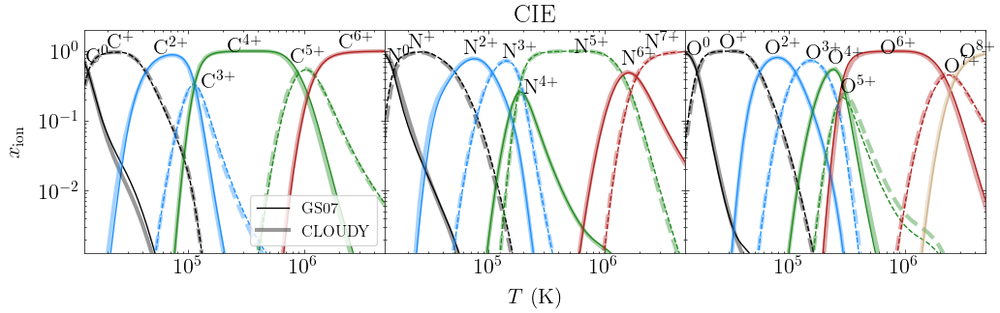

In [13]:
fig, axes = plt.subplots(1, 3, figsize=(4*3,3), sharex=True, sharey=True)

plot_ion_fracs(axes, T_grid_CIE_gs07, X_dict_CIE_carb_gs07, X_dict_CIE_nit_gs07, X_dict_CIE_oxy_gs07,
              'GS07', x_list_CIE_carb, y_list_CIE_carb, x_list_CIE_nit, y_list_CIE_nit, x_list_CIE_oxy, y_list_CIE_oxy,
               1, 1)

plot_ion_fracs(axes, T_grid_CIE, X_dict_CIE_carb, X_dict_CIE_nit, X_dict_CIE_oxy,
              'CLOUDY')

axes[0].legend()
axes[0].set_xscale('log')
axes[0].set_yscale('log')

plt.subplots_adjust(wspace=0, hspace=0)

axes[0].set_xlim(10**4.1,10**6.7)
axes[0].set_ylim(10**-2.9, 10**0.3)

ax_label = fig.add_subplot(111, frameon=False)
# hide tick and tick label of the big axes
ax_label.set_xticks([])
ax_label.set_yticks([])

ax_label.set_title('CIE')
ax_label.set_xlabel(r'$T \ (\mathrm{K})$', labelpad=25)
ax_label.set_ylabel(r'$x_\mathrm{ion}$', labelpad=45)

# TDC (1e8 K)

In [14]:
def get_TDC_frac(k):
    
    proc, log_metals, T0 = k
    
    # Character processing
    T0_str = ('%.0e'%T0).replace('+','').replace('0','')
    
    # Load directory
    loaddir = rootdir+'cloudy_grids/non_eqm_models/CI/TDC_{}/log_metals={}/T0={}K/'.format(proc, 
                                                                                           str(log_metals), 
                                                                                           T0_str)
    
    # Temperature
    f = open(loaddir+'TDC_{}_frac.tim'.format(proc), 'r')
    L = f.readlines()
    f.close()

    T_grid_TDC = np.array([L[i].split('\t')[4] for i in range(1, len(L))], dtype=float)
             
    # Hydrogen
    
    X_dict_TDC_hyd = {k:np.zeros(len(T_grid_TDC)) for k in H_list}
    
    f = open(loaddir+'TDC_{}_frac.hyd'.format(proc), 'r')
    L = f.readlines()
    f.close()

    for s in H_list:
        for i in range(len(T_grid_TDC)):
            X_dict_TDC_hyd[s][i] = float(L[i+1].split('\t')[H_list.index(s)+1])

    # Carbon

    X_dict_TDC_carb = {k:np.zeros(len(T_grid_TDC)) for k in C_list}

    f = open(loaddir+'TDC_{}_frac.carb'.format(proc), 'r')
    L = f.readlines()
    f.close()

    for s in C_list:
        for i in range(len(T_grid_TDC)):
            X_dict_TDC_carb[s][i] = float(L[i+1].split('\t')[C_list.index(s)+1])
            
    # Nitrogen

    X_dict_TDC_nit = {k:np.zeros(len(T_grid_TDC)) for k in N_list}

    f = open(loaddir+'TDC_{}_frac.nit'.format(proc), 'r')
    L = f.readlines()
    f.close()

    for s in N_list:
        for i in range(len(T_grid_TDC)):
            X_dict_TDC_nit[s][i] = float(L[i+1].split('\t')[N_list.index(s)+1])
            
    # Oxygen

    X_dict_TDC_oxy = {k:np.zeros(len(T_grid_TDC)) for k in O_list}

    f = open(loaddir+'TDC_{}_frac.oxy'.format(proc), 'r')
    L = f.readlines()
    f.close()

    for s in O_list:
        for i in range(len(T_grid_TDC)):
            X_dict_TDC_oxy[s][i] = float(L[i+1].split('\t')[O_list.index(s)+1])
            
    return T_grid_TDC, X_dict_TDC_hyd, X_dict_TDC_carb, X_dict_TDC_nit, X_dict_TDC_oxy

## Isochoric

Read in CLOUDY $T_0 = 1 \times 10^8 \ \mathrm{K}$

In [15]:
T_grid_TDC = {}
X_dict_TDC_hyd = {}
X_dict_TDC_carb = {}
X_dict_TDC_nit = {}
X_dict_TDC_oxy = {}

In [16]:
k=('isochoric',0,1e8)
T_grid_TDC[k], X_dict_TDC_hyd[k], X_dict_TDC_carb[k], X_dict_TDC_nit[k], X_dict_TDC_oxy[k] = get_TDC_frac(k)

Load in the ion fractions for Gnat and Sternberg 2007

In [17]:
def get_ion_frac_gnat(paper, table):

    data = np.loadtxt(rootdir+'{}_grids/table{}.dat'.format(paper, table))

    # Temp
    T_grid = data[:,0]

    # H
    X_dict_hyd = {k:np.zeros(len(T_grid)) for k in H_list}

    for i in range(len(H_list)):
        s = H_list[i]
        X_dict_hyd[s] = data[:,i]    
    
    # C
    X_dict_carb = {k:np.zeros(len(T_grid)) for k in C_list}

    for i in range(len(C_list)):
        s = C_list[i]
        X_dict_carb[s] = data[:,6+i]

    # N
    X_dict_nit = {k:np.zeros(len(T_grid)) for k in N_list}

    for i in range(len(N_list)):
        s = N_list[i]
        X_dict_nit[s] = data[:,13+i]

    # O
    X_dict_oxy = {k:np.zeros(len(T_grid)) for k in O_list}

    for i in range(len(O_list)):
        s = O_list[i]
        X_dict_oxy[s] = data[:,21+i]
        
    return T_grid, X_dict_hyd, X_dict_carb, X_dict_nit, X_dict_oxy

In [18]:
T_grid_TDC_isochoric_gs07, X_dict_TDC_isochoric_hyd_gs07, X_dict_TDC_isochoric_carb_gs07, X_dict_TDC_isochoric_nit_gs07, X_dict_TDC_isochoric_oxy_gs07 = get_ion_frac_gnat('gs07','2b')

Compare calculations

In [19]:
x_list_TDC_isochoric_carb = [1.3e+4, 1.5e+4, 5.3e+4, 1.2e+5, 2.2e+5, 1.0e+6, 2.0e+6]
y_list_TDC_isochoric_carb = [1.3e-1, 9.6e-1, 3.0e-1, 1.0e-1, 9.2e-1, 5.0e-1, 9.2e-1]

x_list_TDC_isochoric_nit = [1.3e+4, 1.5e+4, 5.3e+4, 1.2e+5, 2.2e+5, 4.0e+5, 1.1e+6, 2.5e+6]
y_list_TDC_isochoric_nit = [1.3e-1, 1.1e+0, 7.0e-1, 2.7e-1, 1.1e-1, 9.2e-1, 4.2e-1, 9.0e-1]

x_list_TDC_isochoric_oxy = [1.3e+4, 1.5e+4, 6.0e+4, 1.2e+5, 2.2e+5, 4.0e+5, 8.0e+5, 1.1e+6, 2.6e+6]
y_list_TDC_isochoric_oxy = [1.3e-1, 1.1e+0, 8.5e-1, 6.7e-1, 3.0e-1, 1.0e-1, 1.1e+0, 3.5e-1, 1.0e+0]

Text(0, 0.5, '$x_\\mathrm{ion}$')

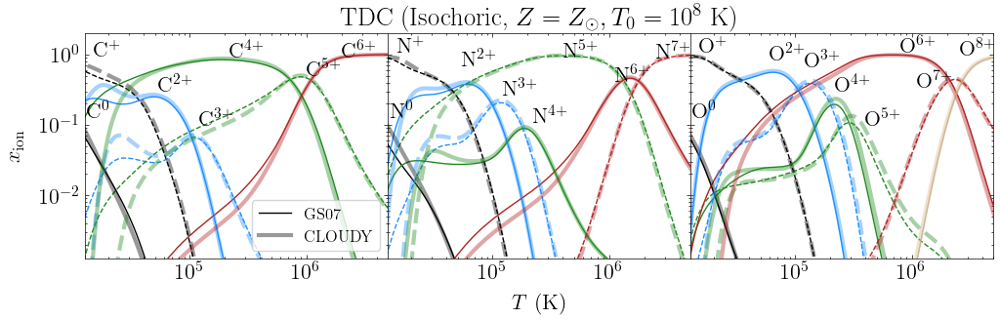

In [20]:
fig, axes = plt.subplots(1, 3, figsize=(4*3,3), sharex=True, sharey=True)

plot_ion_fracs(axes, T_grid_TDC_isochoric_gs07, X_dict_TDC_isochoric_carb_gs07, X_dict_TDC_isochoric_nit_gs07, X_dict_TDC_isochoric_oxy_gs07,
              'GS07', x_list_TDC_isochoric_carb, y_list_TDC_isochoric_carb, x_list_TDC_isochoric_nit, y_list_TDC_isochoric_nit, x_list_TDC_isochoric_oxy, y_list_TDC_isochoric_oxy,
               1, 1)

k=('isochoric',0,1e8)
plot_ion_fracs(axes, T_grid_TDC[k], X_dict_TDC_carb[k], X_dict_TDC_nit[k], X_dict_TDC_oxy[k],
              'CLOUDY')

axes[0].legend()
axes[0].set_xscale('log')
axes[0].set_yscale('log')

plt.subplots_adjust(wspace=0, hspace=0)

axes[0].set_xlim(10**4.1,10**6.7)
axes[0].set_ylim(10**-2.9, 10**0.3)

ax_label = fig.add_subplot(111, frameon=False)
# hide tick and tick label of the big axes
ax_label.set_xticks([])
ax_label.set_yticks([])

ax_label.set_title(r'TDC (Isochoric, $Z=Z_\odot, T_0 = 10^8 \ \mathrm{K}$)')
ax_label.set_xlabel(r'$T \ (\mathrm{K})$', labelpad=25)
ax_label.set_ylabel(r'$x_\mathrm{ion}$', labelpad=45)

## Isobaric

Read in CLOUDY $T_0 = 1 \times 10^8 \ \mathrm{K}$

In [21]:
k=('isobaric',0,1e8)
T_grid_TDC[k], X_dict_TDC_hyd[k], X_dict_TDC_carb[k], X_dict_TDC_nit[k], X_dict_TDC_oxy[k] = get_TDC_frac(k)

Load in the ion fractions for Gnat and Sternberg 2007

In [22]:
T_grid_TDC_isobaric_gs07, X_dict_TDC_isobaric_hyd_gs07, X_dict_TDC_isobaric_carb_gs07, X_dict_TDC_isobaric_nit_gs07, X_dict_TDC_isobaric_oxy_gs07 = get_ion_frac_gnat('gs07','2c')

Compare calculations

In [23]:
x_list_TDC_isobaric_carb = [1.3e+4, 1.5e+4, 5.3e+4, 1.2e+5, 2.2e+5, 1.0e+6, 2.0e+6]
y_list_TDC_isobaric_carb = [1.3e-1, 9.6e-1, 3.0e-1, 1.0e-1, 9.2e-1, 5.0e-1, 9.2e-1]

x_list_TDC_isobaric_nit = [1.3e+4, 1.5e+4, 5.3e+4, 1.2e+5, 2.2e+5, 4.0e+5, 1.1e+6, 2.5e+6]
y_list_TDC_isobaric_nit = [1.3e-1, 1.1e+0, 7.0e-1, 2.7e-1, 1.1e-1, 9.2e-1, 4.2e-1, 9.0e-1]

x_list_TDC_isobaric_oxy = [1.3e+4, 1.5e+4, 6.0e+4, 1.2e+5, 2.2e+5, 4.0e+5, 8.0e+5, 1.1e+6, 2.6e+6]
y_list_TDC_isobaric_oxy = [1.3e-1, 1.1e+0, 8.5e-1, 6.7e-1, 3.0e-1, 1.0e-1, 1.1e+0, 3.5e-1, 1.0e+0]

Text(0, 0.5, '$x_\\mathrm{ion}$')

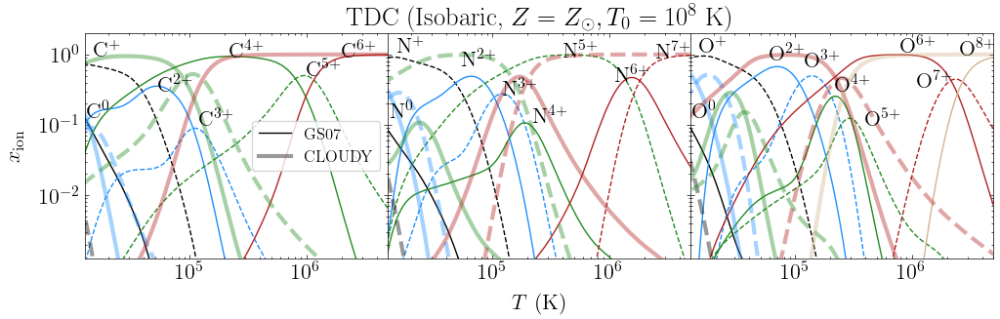

In [24]:
fig, axes = plt.subplots(1, 3, figsize=(4*3,3), sharex=True, sharey=True)

plot_ion_fracs(axes, T_grid_TDC_isobaric_gs07, X_dict_TDC_isobaric_carb_gs07, X_dict_TDC_isobaric_nit_gs07, X_dict_TDC_isobaric_oxy_gs07,
              'GS07', x_list_TDC_isobaric_carb, y_list_TDC_isobaric_carb, x_list_TDC_isobaric_nit, y_list_TDC_isobaric_nit, x_list_TDC_isobaric_oxy, y_list_TDC_isobaric_oxy,
               1, 1)

k=('isobaric',0,1e8)
plot_ion_fracs(axes, T_grid_TDC[k], X_dict_TDC_carb[k], X_dict_TDC_nit[k], X_dict_TDC_oxy[k],
              'CLOUDY')

axes[0].legend()
axes[0].set_xscale('log')
axes[0].set_yscale('log')

plt.subplots_adjust(wspace=0, hspace=0)

axes[0].set_xlim(10**4.1,10**6.7)
axes[0].set_ylim(10**-2.9, 10**0.3)

ax_label = fig.add_subplot(111, frameon=False)
# hide tick and tick label of the big axes
ax_label.set_xticks([])
ax_label.set_yticks([])

ax_label.set_title(r'TDC (Isobaric, $Z=Z_\odot, T_0 = 10^8 \ \mathrm{K}$)')
ax_label.set_xlabel(r'$T \ (\mathrm{K})$', labelpad=25)
ax_label.set_ylabel(r'$x_\mathrm{ion}$', labelpad=45)

Make joint plot

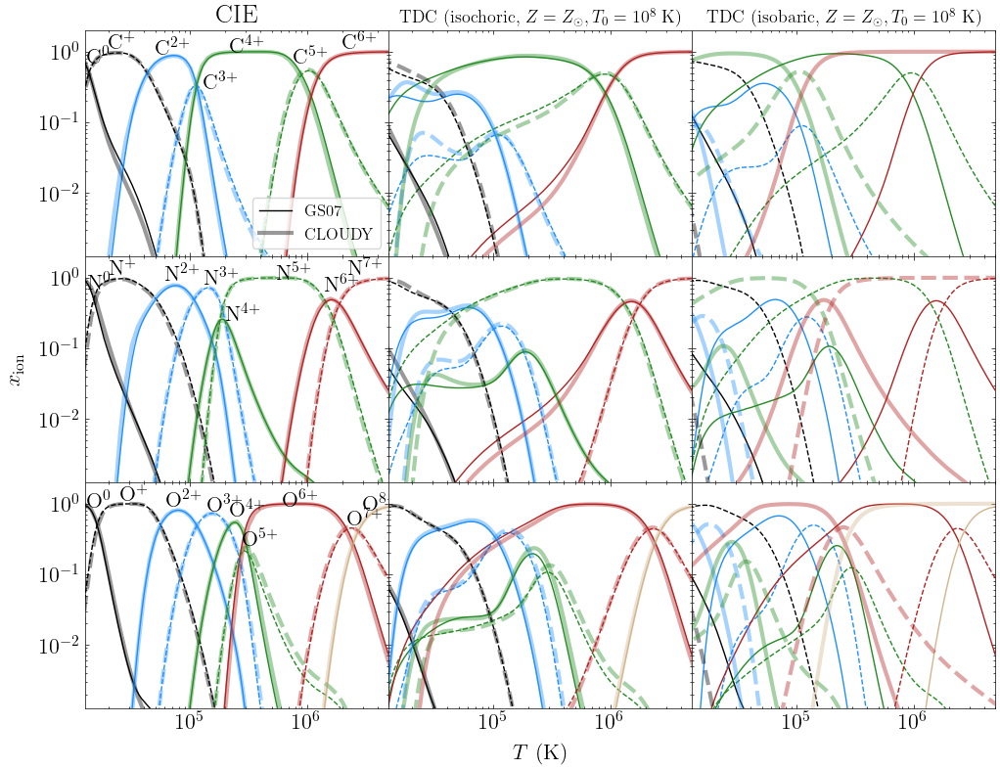

In [25]:
fig, axes = plt.subplots(3, 3, figsize=(4*3, 3*3), sharex=True, sharey=True)

# CIE
plot_ion_fracs(axes[:,0], T_grid_CIE_gs07, X_dict_CIE_carb_gs07, X_dict_CIE_nit_gs07, X_dict_CIE_oxy_gs07,
              'GS07', x_list_CIE_carb, y_list_CIE_carb, x_list_CIE_nit, y_list_CIE_nit, x_list_CIE_oxy, y_list_CIE_oxy,
               1, 1)

plot_ion_fracs(axes[:,0], T_grid_CIE, X_dict_CIE_carb, X_dict_CIE_nit, X_dict_CIE_oxy,
              'CLOUDY')

axes[0,0].set_title('CIE')
axes[0,0].legend()

# TDC isochoric
plot_ion_fracs(axes[:,1], T_grid_TDC_isochoric_gs07, X_dict_TDC_isochoric_carb_gs07, X_dict_TDC_isochoric_nit_gs07, X_dict_TDC_isochoric_oxy_gs07,
              'GS07', lw=1, alpha=1)


k=('isochoric',0,1e8)
plot_ion_fracs(axes[:,1], T_grid_TDC[k], X_dict_TDC_carb[k], X_dict_TDC_nit[k], X_dict_TDC_oxy[k],
              'CLOUDY')
    
axes[0,1].set_title('TDC (isochoric, $Z=Z_\odot, T_0=10^8 \ \mathrm{K}$)', fontsize=13)

# TDC isobaric

plot_ion_fracs(axes[:,2], T_grid_TDC_isobaric_gs07, X_dict_TDC_isobaric_carb_gs07, X_dict_TDC_isobaric_nit_gs07, X_dict_TDC_isobaric_oxy_gs07,
              'GS07', lw=1, alpha=1)

k=('isobaric',0,1e8)
plot_ion_fracs(axes[:,2], T_grid_TDC[k], X_dict_TDC_carb[k], X_dict_TDC_nit[k], X_dict_TDC_oxy[k],
              'CLOUDY')
    
axes[0,2].set_title('TDC (isobaric, $Z=Z_\odot, T_0=10^8 \ \mathrm{K}$)', fontsize=13)

axes[0,0].set_xscale('log')
axes[0,0].set_yscale('log')

axes[0,0].set_xlim(10**4.1,10**6.7)
axes[0,0].set_ylim(10**-2.9, 10**0.3)

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])

ax_label.set_xlabel(r'$T \ (\mathrm{K})$', labelpad=25)
ax_label.set_ylabel(r'$x_\mathrm{ion}$', labelpad=45)
    
plt.subplots_adjust(wspace=0, hspace=0)

# TDC (3e6K)

Load CLOUDY fractions

In [26]:
k=('isochoric',0,3e6)
T_grid_TDC[k], X_dict_TDC_hyd[k], X_dict_TDC_carb[k], X_dict_TDC_nit[k], X_dict_TDC_oxy[k] = get_TDC_frac(k)

k=('isobaric',0,3e6)
T_grid_TDC[k], X_dict_TDC_hyd[k], X_dict_TDC_carb[k], X_dict_TDC_nit[k], X_dict_TDC_oxy[k] = get_TDC_frac(k)

Make plot

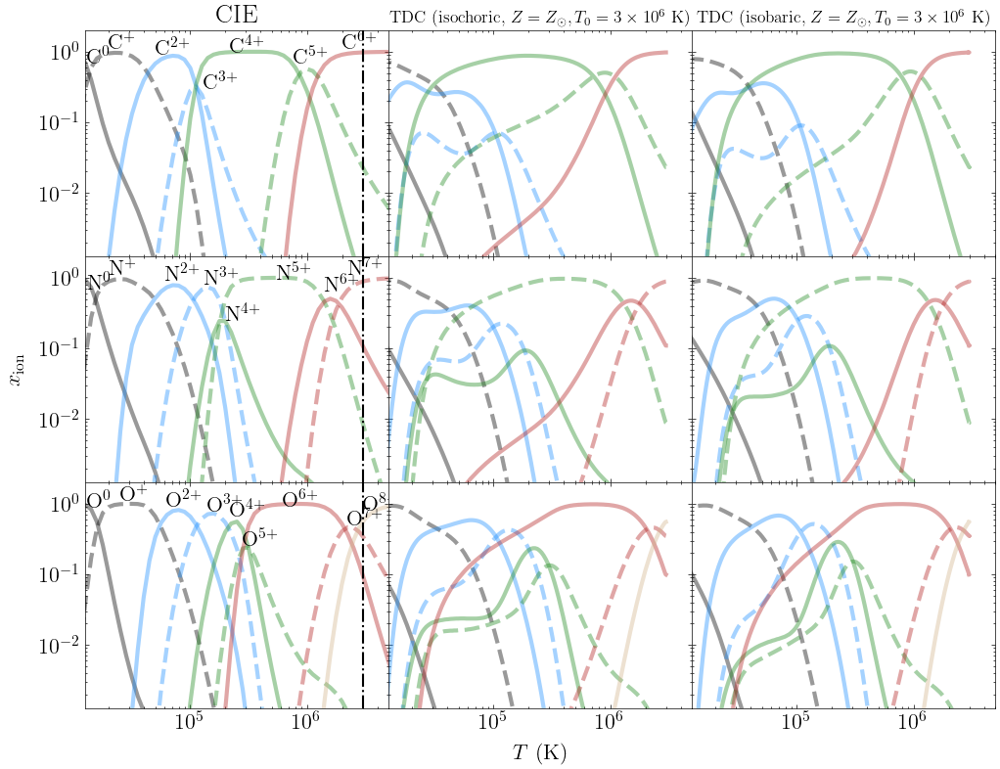

In [27]:
fig, axes = plt.subplots(3, 3, figsize=(4*3, 3*3), sharex=True, sharey=True)

# CIE

plot_ion_fracs(axes[:,0], T_grid_CIE, X_dict_CIE_carb, X_dict_CIE_nit, X_dict_CIE_oxy,
              None, x_list_CIE_carb, y_list_CIE_carb, x_list_CIE_nit, y_list_CIE_nit, x_list_CIE_oxy, y_list_CIE_oxy)

axes[0,0].axvline(3e6, linestyle='-.', color='black', lw=1.5)
axes[1,0].axvline(3e6, linestyle='-.', color='black', lw=1.5)
axes[2,0].axvline(3e6, linestyle='-.', color='black', lw=1.5)

axes[0,0].set_title('CIE')

# TDC isochoric
k=('isochoric',0,3e6)
plot_ion_fracs(axes[:,1], T_grid_TDC[k], X_dict_TDC_carb[k], X_dict_TDC_nit[k], X_dict_TDC_oxy[k],
              'CLOUDY')
    
axes[0,1].set_title(r'TDC (isochoric, $Z=Z_\odot, T_0 = 3 \times 10^6 \ \mathrm{K}$)', fontsize=12.5)

# TDC isobaric
k=('isobaric',0,3e6)
plot_ion_fracs(axes[:,2], T_grid_TDC[k], X_dict_TDC_carb[k], X_dict_TDC_nit[k], X_dict_TDC_oxy[k],
              'CLOUDY')
    
axes[0,2].set_title(r'TDC (isobaric, $Z=Z_\odot, T_0 = 3 \times 10^6 \ \mathrm{K}$)', fontsize=12.5)

axes[0,0].set_xscale('log')
axes[0,0].set_yscale('log')

axes[0,0].set_xlim(10**4.1,10**6.7)
axes[0,0].set_ylim(10**-2.9, 10**0.3)

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])

ax_label.set_xlabel(r'$T \ (\mathrm{K})$', labelpad=25)
ax_label.set_ylabel(r'$x_\mathrm{ion}$', labelpad=45)
    
plt.subplots_adjust(wspace=0, hspace=0)

## Nevalainen 17

In [28]:
k = ('isochoric',-1,3e6)
T_grid_TDC[k], X_dict_TDC_hyd[k], X_dict_TDC_carb[k], X_dict_TDC_nit[k], X_dict_TDC_oxy[k] = get_TDC_frac(k)

In [29]:
OIV_OV_CIE = X_dict_CIE_oxy['OIV']/X_dict_CIE_oxy['OV']
OIV_OVI_CIE = X_dict_CIE_oxy['OIV']/X_dict_CIE_oxy['OVI']

k = ('isochoric',0,3e6)
T_grid_TDC_0 = T_grid_TDC[k]
OIV_OV_TDC_0 = X_dict_TDC_oxy[k]['OIV']/X_dict_TDC_oxy[k]['OV']
OIV_OVI_TDC_0 = X_dict_TDC_oxy[k]['OIV']/X_dict_TDC_oxy[k]['OVI']

k = ('isochoric',-1,3e6)
T_grid_TDC_1 = T_grid_TDC[k]
OIV_OV_TDC_1 = X_dict_TDC_oxy[k]['OIV']/X_dict_TDC_oxy[k]['OV']
OIV_OVI_TDC_1 = X_dict_TDC_oxy[k]['OIV']/X_dict_TDC_oxy[k]['OVI']

/var/folders/tj/vc_wjrpj36sf3zws4s7s770c0000gn/T/ipykernel_8875/1017266058.py:1: RuntimeWarning: divide by zero encountered in divide
  OIV_OV_CIE = X_dict_CIE_oxy['OIV']/X_dict_CIE_oxy['OV']
/var/folders/tj/vc_wjrpj36sf3zws4s7s770c0000gn/T/ipykernel_8875/1017266058.py:1: RuntimeWarning: invalid value encountered in divide
  OIV_OV_CIE = X_dict_CIE_oxy['OIV']/X_dict_CIE_oxy['OV']
/var/folders/tj/vc_wjrpj36sf3zws4s7s770c0000gn/T/ipykernel_8875/1017266058.py:2: RuntimeWarning: divide by zero encountered in divide
  OIV_OVI_CIE = X_dict_CIE_oxy['OIV']/X_dict_CIE_oxy['OVI']
/var/folders/tj/vc_wjrpj36sf3zws4s7s770c0000gn/T/ipykernel_8875/1017266058.py:2: RuntimeWarning: invalid value encountered in divide
  OIV_OVI_CIE = X_dict_CIE_oxy['OIV']/X_dict_CIE_oxy['OVI']


In [30]:
T_CIE = 10**np.arange(5.2, 5.6, 0.1)
T_TDC_0 = 10**np.arange(4.5, 5.6, 0.1)
T_TDC_1 = 10**np.arange(5.1, 5.6, 0.1)

In [31]:
from matplotlib.patches import Rectangle

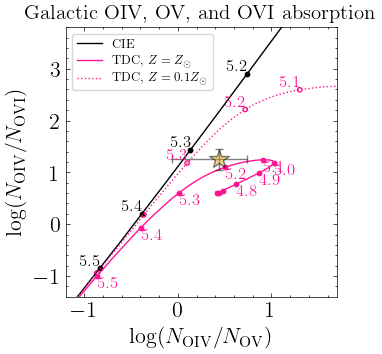

In [32]:
fig, ax = plt.subplots(1, figsize=(3.5,3.5), sharex=True, sharey=True)

# Without UVB

# CIE
ax.plot(np.log10(OIV_OV_CIE), np.log10(OIV_OVI_CIE), color='black', label='CIE')

for T in T_CIE:
    x = np.log10(OIV_OV_CIE)[np.argmin(np.abs(T_grid_CIE-T))]
    y = np.log10(OIV_OVI_CIE)[np.argmin(np.abs(T_grid_CIE-T))]
    ax.scatter(x, y, color='black', s=10)
    ax.text(x, y, np.round(np.log10(T),1), 
                 horizontalalignment='right', verticalalignment='bottom', fontsize=12)
    
# TDC, solar
ax.plot(np.log10(OIV_OV_TDC_0)[T_grid_TDC_0>10**4.49], 
        np.log10(OIV_OVI_TDC_0)[T_grid_TDC_0>10**4.49], color='deeppink', label=r'TDC, $Z=Z_\odot$')

for T in T_TDC_0:
    x = np.log10(OIV_OV_TDC_0)[np.argmin(np.abs(T_grid_TDC_0-T))]
    y = np.log10(OIV_OVI_TDC_0)[np.argmin(np.abs(T_grid_TDC_0-T))]
    ax.scatter(x, y, color='deeppink', s=10)
    if T>10**4.7:
        ax.text(x, y, np.round(np.log10(T),1), 
                horizontalalignment='left', verticalalignment='top', color='deeppink', fontsize=12)

# TDC, sub-solar
ax.plot(np.log10(OIV_OV_TDC_1)[T_grid_TDC_1>10**5], 
        np.log10(OIV_OVI_TDC_1)[T_grid_TDC_1>10**5], linestyle=':', color='deeppink', label=r'TDC, $Z=0.1Z_\odot$')

for T in T_TDC_1:
    x = np.log10(OIV_OV_TDC_1)[np.argmin(np.abs(T_grid_TDC_1-T))]
    y = np.log10(OIV_OVI_TDC_1)[np.argmin(np.abs(T_grid_TDC_1-T))]
    ax.scatter(x, y, color='deeppink', facecolor='none', s=10)
    if 10**4.7<T<10**5.3:
        ax.text(x, y, np.round(np.log10(T),1), horizontalalignment='right', 
                     verticalalignment='bottom', color='deeppink', fontsize=12)
        
ax.legend(fontsize=9)

ax.errorbar(0.44, 1.25, xerr=[[0.5], [0.3]], yerr=[[0.2],[0.2]],
                 marker='*', markersize=15, markerfacecolor='goldenrod', capsize=3, alpha=.5)

ax.set_xlim(-1.2,1.7)
ax.set_ylim(-1.4,3.8)

ax.set_xlabel(r'$\log(N_\mathrm{OIV}/N_\mathrm{OV})$')
ax.set_ylabel(r'$\log(N_\mathrm{OIV}/N_\mathrm{OVI})$')

ax.set_title('Galactic OIV, OV, and OVI absorption', fontsize=15)
plt.subplots_adjust(wspace=0, hspace=0)

## Cooling functions

In [33]:
# Solar
f = open(rootdir+'cloudy_grids/non_eqm_models/CI/CIE/CIE_frac.cool', 'r')
L = f.readlines()
f.close()

cool_CIE = np.array([L[i].split('\t')[2] for i in range(1, len(L))], dtype=float)

# TDC solar
f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDC_isochoric/log_metals=0/T0=3e6K/TDC_isochoric_frac.cool', 'r')
L = f.readlines()
f.close()

cool_TDC_1 = np.array([L[i].split('\t')[2] for i in range(1, len(L))], dtype=float)

# TDC sub-solar
f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDC_isochoric/log_metals=-1/T0=3e6K/TDC_isochoric_frac.cool', 'r')
L = f.readlines()
f.close()

cool_TDC_2 = np.array([L[i].split('\t')[2] for i in range(1, len(L))], dtype=float)

(10000, 2511886.4315095823)

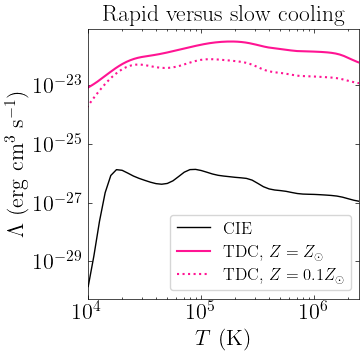

In [34]:
fig, ax = plt.subplots(1, 1, figsize=(3.5,3.5), sharex=True)

# PIE
#k = ('fg20',1,-3)
ax.plot(T_grid_CIE, 0.1**-2*cool_CIE, color='black',lw=1, label=r'CIE',)

# TDP
k = ('isochoric',0,3e6)
ax.plot(T_grid_TDC[k], 0.1**-2*cool_TDC_1, lw=1.5, color='deeppink',linestyle='-', label=r'TDC, $Z=Z_\odot$')
k = ('isochoric',-1,3e6)
ax.plot(T_grid_TDC[k], 0.1**-2*cool_TDC_2, lw=1.5, color='deeppink',linestyle=':', label=r'TDC, $Z=0.1Z_\odot$')


ax.legend(loc='lower right')

#axes[1].set_ylim(1e-29, 4e-28)
ax.set_xscale('log')
ax.set_yscale('log')

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])

ax.set_xlabel(r'$T \ (\mathrm{K})$')
ax.set_ylabel(r'$\Lambda$ (erg cm${}^{3}$ s${^{-1}}$)')

ax.set_title('Rapid versus slow cooling', fontsize=17)

ax.set_xlim(10**4,10**6.4)
#ax.set_ylim(10**-29.3,10**-27.2)

#plt.savefig('/Users/thepoetoftwilight/Documents/CUBS/Data/TDP_vs_PIE_cool.png', dpi=300)

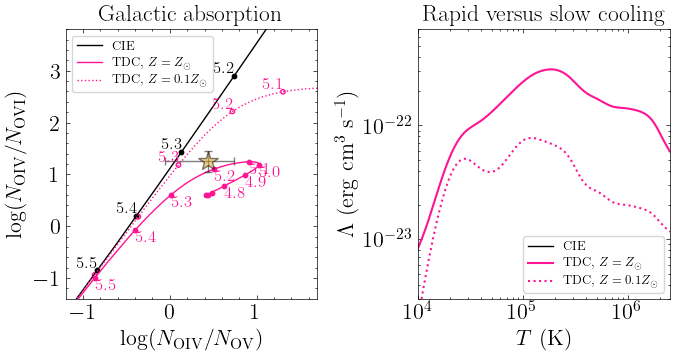

In [35]:
fig, axes = plt.subplots(1, 2, figsize=(3.9*2, 3.5))

# Without UVB

# CIE
axes[0].plot(np.log10(OIV_OV_CIE), np.log10(OIV_OVI_CIE), color='black', label='CIE')

for T in T_CIE:
    x = np.log10(OIV_OV_CIE)[np.argmin(np.abs(T_grid_CIE-T))]
    y = np.log10(OIV_OVI_CIE)[np.argmin(np.abs(T_grid_CIE-T))]
    axes[0].scatter(x, y, color='black', s=10)
    axes[0].text(x, y, np.round(np.log10(T),1), 
                 horizontalalignment='right', verticalalignment='bottom', fontsize=12)
    
# TDC, solar
axes[0].plot(np.log10(OIV_OV_TDC_0)[T_grid_TDC_0>10**4.49], 
        np.log10(OIV_OVI_TDC_0)[T_grid_TDC_0>10**4.49], color='deeppink', label=r'TDC, $Z=Z_\odot$')

for T in T_TDC_0:
    x = np.log10(OIV_OV_TDC_0)[np.argmin(np.abs(T_grid_TDC_0-T))]
    y = np.log10(OIV_OVI_TDC_0)[np.argmin(np.abs(T_grid_TDC_0-T))]
    axes[0].scatter(x, y, color='deeppink', s=10)
    if T>10**4.7:
        axes[0].text(x, y, np.round(np.log10(T),1), 
                horizontalalignment='left', verticalalignment='top', color='deeppink', fontsize=12)

# TDC, sub-solar
axes[0].plot(np.log10(OIV_OV_TDC_1)[T_grid_TDC_1>10**5], 
        np.log10(OIV_OVI_TDC_1)[T_grid_TDC_1>10**5], linestyle=':', color='deeppink', label=r'TDC, $Z=0.1Z_\odot$')

for T in T_TDC_1:
    x = np.log10(OIV_OV_TDC_1)[np.argmin(np.abs(T_grid_TDC_1-T))]
    y = np.log10(OIV_OVI_TDC_1)[np.argmin(np.abs(T_grid_TDC_1-T))]
    axes[0].scatter(x, y, color='deeppink', facecolor='none', s=10)
    if 10**4.7<T<10**5.3:
        axes[0].text(x, y, np.round(np.log10(T),1), horizontalalignment='right', 
                     verticalalignment='bottom', color='deeppink', fontsize=12)
        
axes[0].legend(fontsize=9)

axes[0].errorbar(0.44, 1.25, xerr=[[0.5], [0.3]], yerr=[[0.2],[0.2]],
                 marker='*', markersize=15, markerfacecolor='goldenrod', capsize=3, alpha=.5)

axes[0].set_xlim(-1.2,1.7)
axes[0].set_ylim(-1.4,3.8)

axes[0].set_xlabel(r'$\log(N_\mathrm{OIV}/N_\mathrm{OV})$')
axes[0].set_ylabel(r'$\log(N_\mathrm{OIV}/N_\mathrm{OVI})$')

axes[0].set_title('Galactic absorption', fontsize=17)

###

axes[1].plot(T_grid_CIE, 0.1**-2*cool_CIE, color='black',lw=1, label=r'CIE',)

# TDP
k = ('isochoric',0,3e6)
axes[1].plot(T_grid_TDC[k], 0.1**-2*cool_TDC_1, lw=1.5, color='deeppink',linestyle='-', label=r'TDC, $Z=Z_\odot$')
k = ('isochoric',-1,3e6)
axes[1].plot(T_grid_TDC[k], 0.1**-2*cool_TDC_2, lw=1.5, color='deeppink',linestyle=':', label=r'TDC, $Z=0.1Z_\odot$')


axes[1].legend(loc='lower right', fontsize=9)


axes[1].set_xlim(10**4,10**6.4)
axes[1].set_ylim(3e-24, 7e-22)
axes[1].set_xscale('log')
axes[1].set_yscale('log')

axes[1].set_xlabel(r'$T \ (\mathrm{K})$')
axes[1].set_ylabel(r'$\Lambda$ (erg cm${}^{3}$ s${^{-1}}$)')

axes[1].set_title('Rapid versus slow cooling', fontsize=17)

plt.subplots_adjust(wspace=0.4, hspace=0)

#plt.savefig(rootdir + 'Figures/MW_diagnostic.pdf', dpi=300)
#plt.savefig(rootdir + 'Figures/MW_diagnostic.png', dpi=300)

# TDC (1e6K)

Load CLOUDY fractions

In [36]:
k=('isochoric',0,1e6)
T_grid_TDC[k], X_dict_TDC_hyd[k], X_dict_TDC_carb[k], X_dict_TDC_nit[k], X_dict_TDC_oxy[k] = get_TDC_frac(k)

k=('isobaric',0,1e6)
T_grid_TDC[k], X_dict_TDC_hyd[k], X_dict_TDC_carb[k], X_dict_TDC_nit[k], X_dict_TDC_oxy[k] = get_TDC_frac(k)

Make plot

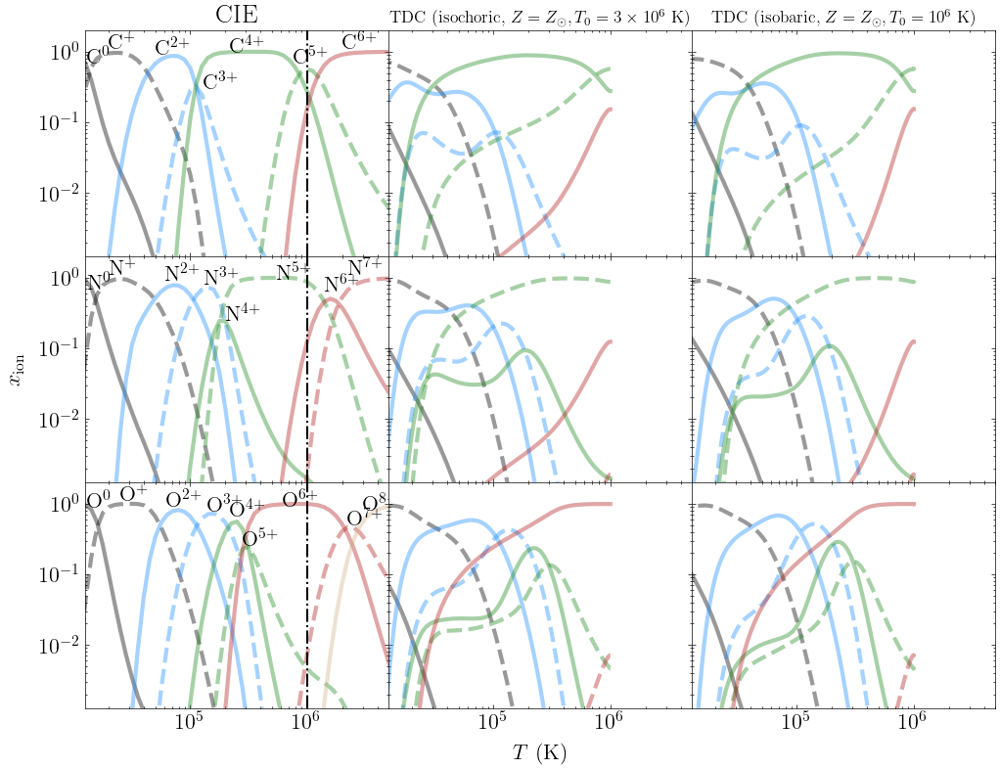

In [37]:
fig, axes = plt.subplots(3, 3, figsize=(4*3, 3*3), sharex=True, sharey=True)

# CIE

plot_ion_fracs(axes[:,0], T_grid_CIE, X_dict_CIE_carb, X_dict_CIE_nit, X_dict_CIE_oxy,
              None, x_list_CIE_carb, y_list_CIE_carb, x_list_CIE_nit, y_list_CIE_nit, x_list_CIE_oxy, y_list_CIE_oxy)

axes[0,0].axvline(1e6, linestyle='-.', color='black', lw=1.5)
axes[1,0].axvline(1e6, linestyle='-.', color='black', lw=1.5)
axes[2,0].axvline(1e6, linestyle='-.', color='black', lw=1.5)

axes[0,0].set_title('CIE')

# TDC isochoric
k=('isochoric',0,1e6)
plot_ion_fracs(axes[:,1], T_grid_TDC[k], X_dict_TDC_carb[k], X_dict_TDC_nit[k], X_dict_TDC_oxy[k],
              'CLOUDY')
    
axes[0,1].set_title(r'TDC (isochoric, $Z=Z_\odot, T_0 = 3 \times 10^6 \ \mathrm{K}$)', fontsize=12.5)

# TDC isobaric
k=('isobaric',0,1e6)
plot_ion_fracs(axes[:,2], T_grid_TDC[k], X_dict_TDC_carb[k], X_dict_TDC_nit[k], X_dict_TDC_oxy[k],
              'CLOUDY')
    
axes[0,2].set_title(r'TDC (isobaric, $Z=Z_\odot, T_0 = 10^6 \ \mathrm{K}$)', fontsize=12.5)

axes[0,0].set_xscale('log')
axes[0,0].set_yscale('log')

axes[0,0].set_xlim(10**4.1,10**6.7)
axes[0,0].set_ylim(10**-2.9, 10**0.3)

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])

ax_label.set_xlabel(r'$T \ (\mathrm{K})$', labelpad=25)
ax_label.set_ylabel(r'$x_\mathrm{ion}$', labelpad=45)
    
plt.subplots_adjust(wspace=0, hspace=0)

# TDC (2e5K)

Load CLOUDY fractions

In [38]:
k=('isochoric',0,2e5)
T_grid_TDC[k], X_dict_TDC_hyd[k], X_dict_TDC_carb[k], X_dict_TDC_nit[k], X_dict_TDC_oxy[k] = get_TDC_frac(k)

k=('isobaric',0,2e5)
T_grid_TDC[k], X_dict_TDC_hyd[k], X_dict_TDC_carb[k], X_dict_TDC_nit[k], X_dict_TDC_oxy[k] = get_TDC_frac(k)

Make plot

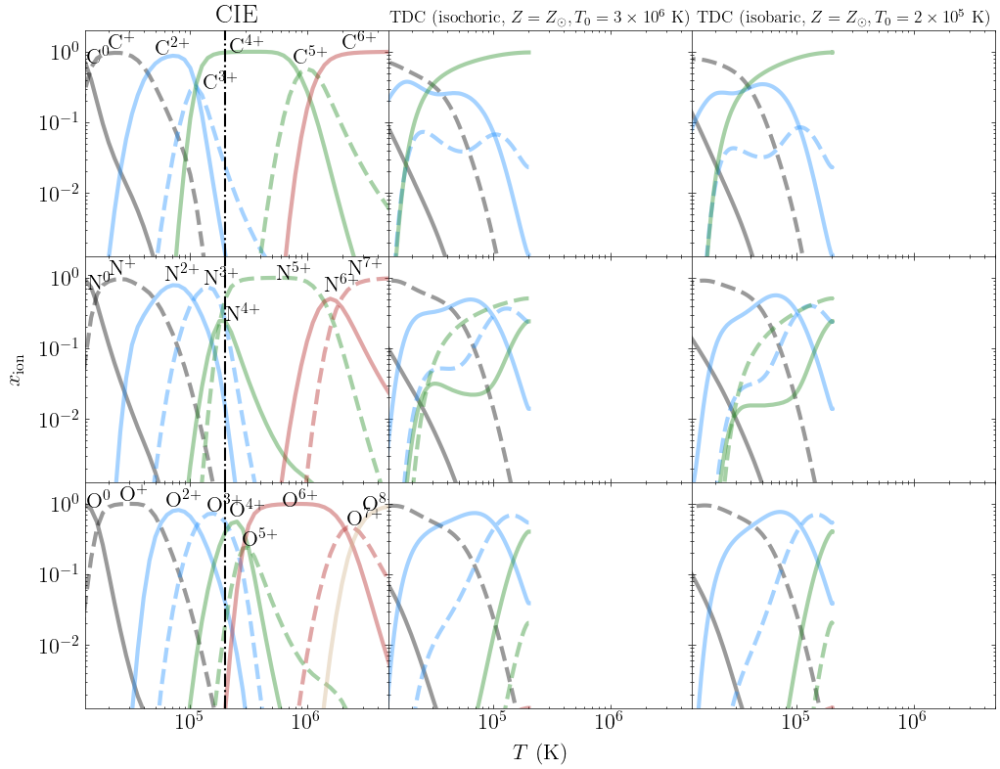

In [39]:
fig, axes = plt.subplots(3, 3, figsize=(4*3, 3*3), sharex=True, sharey=True)

# CIE

plot_ion_fracs(axes[:,0], T_grid_CIE, X_dict_CIE_carb, X_dict_CIE_nit, X_dict_CIE_oxy,
              None, x_list_CIE_carb, y_list_CIE_carb, x_list_CIE_nit, y_list_CIE_nit, x_list_CIE_oxy, y_list_CIE_oxy)

axes[0,0].axvline(2e5, linestyle='-.', color='black', lw=1.5)
axes[1,0].axvline(2e5, linestyle='-.', color='black', lw=1.5)
axes[2,0].axvline(2e5, linestyle='-.', color='black', lw=1.5)

axes[0,0].set_title('CIE')

# TDC isochoric
k=('isochoric',0,2e5)
plot_ion_fracs(axes[:,1], T_grid_TDC[k], X_dict_TDC_carb[k], X_dict_TDC_nit[k], X_dict_TDC_oxy[k],
              'CLOUDY')
    
axes[0,1].set_title(r'TDC (isochoric, $Z=Z_\odot, T_0 = 3 \times 10^6 \ \mathrm{K}$)', fontsize=12.5)

# TDC isobaric
k=('isobaric',0,2e5)
plot_ion_fracs(axes[:,2], T_grid_TDC[k], X_dict_TDC_carb[k], X_dict_TDC_nit[k], X_dict_TDC_oxy[k],
              'CLOUDY')
    
axes[0,2].set_title(r'TDC (isobaric, $Z=Z_\odot, T_0 = 2 \times 10^5 \ \mathrm{K}$)', fontsize=12.5)

axes[0,0].set_xscale('log')
axes[0,0].set_yscale('log')

axes[0,0].set_xlim(10**4.1,10**6.7)
axes[0,0].set_ylim(10**-2.9, 10**0.3)

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])

ax_label.set_xlabel(r'$T \ (\mathrm{K})$', labelpad=25)
ax_label.set_ylabel(r'$x_\mathrm{ion}$', labelpad=45)
    
plt.subplots_adjust(wspace=0, hspace=0)

# TDC - varying initial temperature

In [40]:
T_eval = 3e4

In [41]:
from scipy.interpolate import interp1d

In [42]:
def eval_ion_frac(T_eval, T_grid, X_dict_carb, X_dict_nit, X_dict_oxy):
    
    # C
    X_interp_carb = np.zeros(len(C_list))

    for i in range(len(C_list)):
        s = C_list[i]
        X_interp_carb[i] = interp1d(T_grid, X_dict_carb[s], fill_value='extrapolate')(T_eval)

    # N
    X_interp_nit = np.zeros(len(N_list))

    for i in range(len(N_list)):
        s = N_list[i]
        X_interp_nit[i] = interp1d(T_grid, X_dict_nit[s], fill_value='extrapolate')(T_eval)

    # O
    X_interp_oxy = np.zeros(len(O_list))

    for i in range(len(O_list)):
        s = O_list[i]
        X_interp_oxy[i] = interp1d(T_grid, X_dict_oxy[s], fill_value='extrapolate')(T_eval)
        
    return X_interp_carb, X_interp_nit, X_interp_oxy

In [43]:
X_interp_TDC_carb = {}
X_interp_TDC_nit = {}
X_interp_TDC_oxy = {}

In [44]:
# T0 = 1e8K

T0 = 1e8
k = ('isochoric',0,T0)
X_interp_TDC_carb[T0], X_interp_TDC_nit[T0], X_interp_TDC_oxy[T0] = eval_ion_frac(T_eval, 
                                                                                T_grid_TDC[k], 
                                                                                X_dict_TDC_carb[k], 
                                                                                X_dict_TDC_nit[k], 
                                                                                X_dict_TDC_oxy[k])

# T0 = 3e6K
T0 = 3e6
k = ('isochoric',0,T0)
X_interp_TDC_carb[T0], X_interp_TDC_nit[T0], X_interp_TDC_oxy[T0] = eval_ion_frac(T_eval, 
                                                                                T_grid_TDC[k], 
                                                                                X_dict_TDC_carb[k], 
                                                                                X_dict_TDC_nit[k], 
                                                                                X_dict_TDC_oxy[k])
# T0 = 1e6K
T0 = 1e6
k = ('isochoric',0,T0)
X_interp_TDC_carb[T0], X_interp_TDC_nit[T0], X_interp_TDC_oxy[T0] = eval_ion_frac(T_eval, 
                                                                                T_grid_TDC[k], 
                                                                                X_dict_TDC_carb[k], 
                                                                                X_dict_TDC_nit[k], 
                                                                                X_dict_TDC_oxy[k])
# T0 = 2e5K
T0 = 2e5
k = ('isochoric',0,T0)
X_interp_TDC_carb[T0], X_interp_TDC_nit[T0], X_interp_TDC_oxy[T0] = eval_ion_frac(T_eval, 
                                                                                T_grid_TDC[k], 
                                                                                X_dict_TDC_carb[k], 
                                                                                X_dict_TDC_nit[k], 
                                                                                X_dict_TDC_oxy[k])

In [45]:
markers_list = ['o', '*','o', '*','o', '*','o', '*','o']

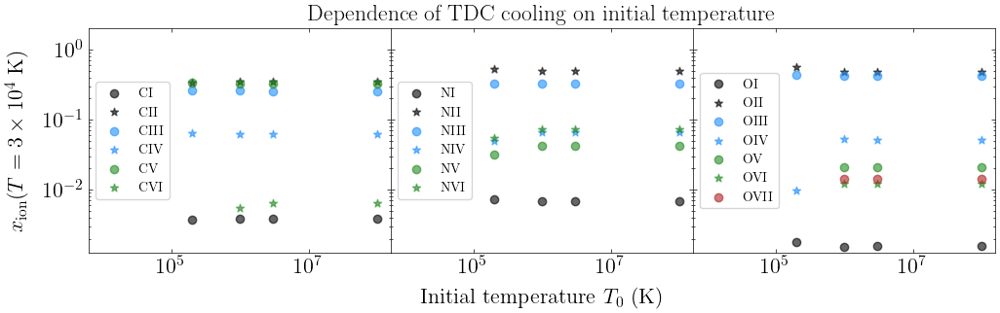

In [46]:
fig, axes = plt.subplots(1, 3, figsize=(4*3, 3), sharex=True, sharey=True)

# C
for i in range(len(C_list)-1):
    s = C_list[i]
    axes[0].scatter(1e8, X_interp_TDC_carb[1e8][i], color=colors_list[i], marker=markers_list[i], alpha=0.6, label=s)

for i in range(len(C_list)-1):
    axes[0].scatter(3e6, X_interp_TDC_carb[3e6][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)
    
for i in range(len(C_list)-1):
    axes[0].scatter(1e6, X_interp_TDC_carb[1e6][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)
    
for i in range(len(C_list)-1):
    axes[0].scatter(2e5, X_interp_TDC_carb[2e5][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)

axes[0].legend(loc='center left', fontsize=10)
axes[0].set_yscale('log')
axes[0].set_xlim(10**3.8, 10**8.2)
axes[0].set_ylim(10**-2.9, 10**0.3)

axes[0].set_xscale('log')

# N
for i in range(len(N_list)-2):
    s = N_list[i]
    axes[1].scatter(1e8, X_interp_TDC_nit[1e8][i], color=colors_list[i], marker=markers_list[i], alpha=0.6, label=s)

for i in range(len(N_list)-2):
    axes[1].scatter(3e6, X_interp_TDC_nit[3e6][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)
    
for i in range(len(N_list)-2):
    axes[1].scatter(1e6, X_interp_TDC_nit[1e6][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)
    
for i in range(len(N_list)-2):
    axes[1].scatter(2e5, X_interp_TDC_nit[2e5][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)
    
axes[1].legend(loc='center left', fontsize=10)
    
# O
for i in range(len(O_list)-2):
    s = O_list[i]
    axes[2].scatter(1e8, X_interp_TDC_oxy[1e8][i], color=colors_list[i], marker=markers_list[i], alpha=0.6, label=s)

for i in range(len(O_list)-2):
    axes[2].scatter(3e6, X_interp_TDC_oxy[3e6][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)
    
for i in range(len(O_list)-2):
    axes[2].scatter(1e6, X_interp_TDC_oxy[1e6][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)
    
for i in range(len(O_list)-2):
    axes[2].scatter(2e5, X_interp_TDC_oxy[2e5][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)

axes[2].legend(loc='center left', fontsize=10)

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])

ax_label.set_xlabel(r'Initial temperature $T_0 \ (\mathrm{K})$', labelpad=25)
ax_label.set_ylabel(r'$x_\mathrm{ion} (T = 3 \times 10^4 \ \mathrm{K})$', labelpad=45)

ax_label.set_title(r'Dependence of TDC cooling on initial temperature', fontsize=17)

plt.subplots_adjust(wspace=0, hspace=0)

# Photoionization - HM12 (1e8K)

## log_hdens = -2

PIE, log_hdens=-2

In [47]:
def get_PIE_frac(k):
    
    uvb, z, log_hdens = k
    # Load directory
    loaddir = rootdir+'cloudy_grids/non_eqm_models/PI/PIE/{}/z={}/log_hdens={}/'.format(uvb, z, log_hdens)
    # Temperature

    f = open(loaddir + 'PIE_frac.grd', 'r')
    L = f.readlines()
    f.close()

    T_grid_PIE = 10**np.array([float(L[i].split('\t')[-2]) for i in range(1, len(L))])

    # Hydrogn

    X_dict_PIE_hyd = {k:np.zeros(len(T_grid_PIE)) for k in H_list}

    f = open(loaddir + 'PIE_frac.hyd', 'r')
    L = f.readlines()
    f.close()

    for s in H_list:
        for i in range(len(T_grid_PIE)):
            X_dict_PIE_hyd[s][i] = float(L[i+1].split('\t')[H_list.index(s)+1])

    # Carbon

    X_dict_PIE_carb = {k:np.zeros(len(T_grid_PIE)) for k in C_list}

    f = open(loaddir + 'PIE_frac.carb', 'r')
    L = f.readlines()
    f.close()

    for s in C_list:
        for i in range(len(T_grid_PIE)):
            X_dict_PIE_carb[s][i] = float(L[i+1].split('\t')[C_list.index(s)+1])

    # Nitrogen

    X_dict_PIE_nit = {k:np.zeros(len(T_grid_PIE)) for k in N_list}

    f = open(loaddir + 'PIE_frac.nit', 'r')
    L = f.readlines()
    f.close()

    for s in N_list:
        for i in range(len(T_grid_PIE)):
            X_dict_PIE_nit[s][i] = float(L[i+1].split('\t')[N_list.index(s)+1])

    # Oxygen

    X_dict_PIE_oxy = {k:np.zeros(len(T_grid_PIE)) for k in O_list}

    f = open(loaddir + 'PIE_frac.oxy', 'r')
    L = f.readlines()
    f.close()

    for s in O_list:
        for i in range(len(T_grid_PIE)):
            X_dict_PIE_oxy[s][i] = float(L[i+1].split('\t')[O_list.index(s)+1])
            
    return T_grid_PIE, X_dict_PIE_hyd, X_dict_PIE_carb, X_dict_PIE_nit, X_dict_PIE_oxy

In [48]:
T_grid_PIE = {}
X_dict_PIE_hyd = {}
X_dict_PIE_carb = {}
X_dict_PIE_nit = {}
X_dict_PIE_oxy = {}

In [49]:
k = ('hm12',1,-2)
T_grid_PIE[k], X_dict_PIE_hyd[k], X_dict_PIE_carb[k], X_dict_PIE_nit[k], X_dict_PIE_oxy[k] = get_PIE_frac(k)

PIE, log_hdens=-2, g17

In [50]:
T_grid_PIE_g17 = {}
X_dict_PIE_hyd_g17 = {}
X_dict_PIE_carb_g17 = {}
X_dict_PIE_nit_g17 = {}
X_dict_PIE_oxy_g17 = {}

In [51]:
T_grid_PIE_g17[-2], X_dict_PIE_hyd_g17[-2], X_dict_PIE_carb_g17[-2], X_dict_PIE_nit_g17[-2], X_dict_PIE_oxy_g17[-2] = get_ion_frac_gnat('g17','10_139')

TDP, log_hdens=-2

In [52]:
def get_TDP_frac(k, add=''):
    
    proc, uvb, z, log_metals, log_hdens, T0 = k
    
    T0_str = ('%.0e'%T0).replace('+','').replace('0','')
        
    # Load directory
    loaddir = rootdir+'cloudy_grids/non_eqm_models/PI/TDP_{}/{}/z={}/log_metals={}/log_hdens={}/T0={}K{}/'.format(str(proc),
                                                                                                               str(uvb), 
                                                                                                               str(z),
                                                                                                               str(log_metals), 
                                                                                                               str(log_hdens), 
                                                                                                               T0_str, 
                                                                                                               add)
    
    # Temperature
    f = open(loaddir+'cd-cool-1keV.tim', 'r')
    L = f.readlines()
    f.close()

    T_grid_TDP = np.array([L[i].split('\t')[4] for i in range(1, len(L))], dtype=float)

    # Hydrogen

    X_dict_TDP_hyd = {k:np.zeros(len(T_grid_TDP)) for k in H_list}

    f = open(loaddir+'cd-cool-1keV.hyd', 'r')
    L = f.readlines()
    f.close()

    for s in H_list:
        for i in range(len(T_grid_TDP)):
            X_dict_TDP_hyd[s][i] = float(L[i+1].split('\t')[H_list.index(s)+1])
  
    # Carbon

    X_dict_TDP_carb = {k:np.zeros(len(T_grid_TDP)) for k in C_list}

    f = open(loaddir+'cd-cool-1keV.carb', 'r')
    L = f.readlines()
    f.close()

    for s in C_list:
        for i in range(len(T_grid_TDP)):
            X_dict_TDP_carb[s][i] = float(L[i+1].split('\t')[C_list.index(s)+1])
            
    # Nitrogen

    X_dict_TDP_nit = {k:np.zeros(len(T_grid_TDP)) for k in N_list}

    f = open(loaddir+'cd-cool-1keV.nit', 'r')
    L = f.readlines()
    f.close()

    for s in N_list:
        for i in range(len(T_grid_TDP)):
            X_dict_TDP_nit[s][i] = float(L[i+1].split('\t')[N_list.index(s)+1])
            
    # Oxygen

    X_dict_TDP_oxy = {k:np.zeros(len(T_grid_TDP)) for k in O_list}

    f = open(loaddir+'cd-cool-1keV.oxy', 'r')
    L = f.readlines()
    f.close()

    for s in O_list:
        for i in range(len(T_grid_TDP)):
            X_dict_TDP_oxy[s][i] = float(L[i+1].split('\t')[O_list.index(s)+1])
            
    return T_grid_TDP, X_dict_TDP_hyd, X_dict_TDP_carb, X_dict_TDP_nit, X_dict_TDP_oxy

In [53]:
T_grid_TDP = {}
X_dict_TDP_hyd = {}
X_dict_TDP_carb = {}
X_dict_TDP_nit = {}
X_dict_TDP_oxy = {}

In [54]:
k = ('isochoric','hm12',1,0.0,-2,1e8)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

TDP, log_hdens=-2, g17

In [55]:
T_grid_TDP_g17 = {}
X_dict_TDP_hyd_g17 = {}
X_dict_TDP_carb_g17 = {}
X_dict_TDP_nit_g17 = {}
X_dict_TDP_oxy_g17 = {}

In [56]:
T_grid_TDP_g17[-2], X_dict_TDP_hyd_g17[-2], X_dict_TDP_carb_g17[-2], X_dict_TDP_nit_g17[-2], X_dict_TDP_oxy_g17[-2] = get_ion_frac_gnat('g17','11_139')

Plot ion fractions

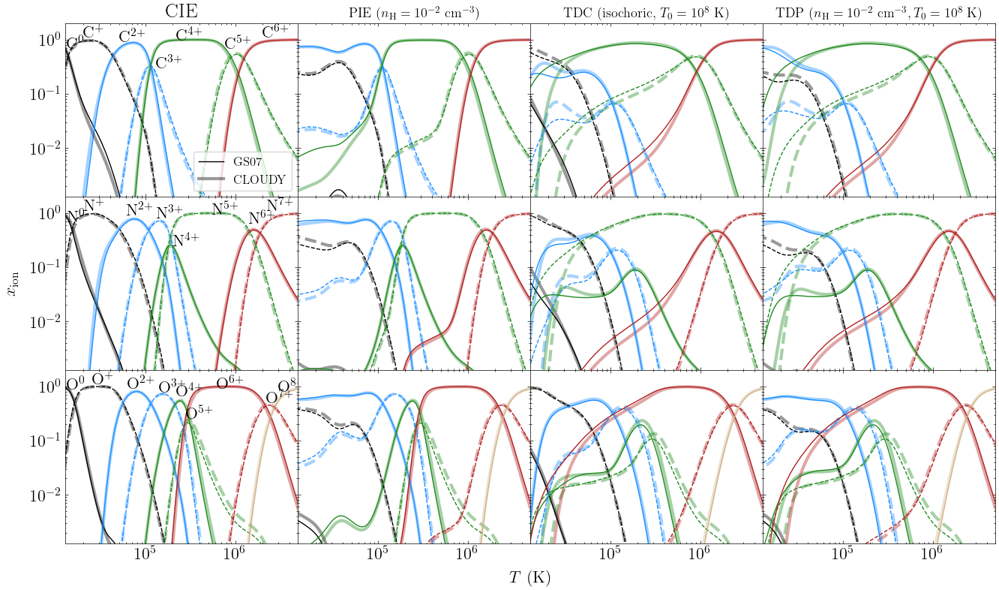

In [57]:
fig, axes = plt.subplots(3, 4, figsize=(4*4, 3*3), sharex=True, sharey=True)

# CIE
plot_ion_fracs(axes[:,0], T_grid_CIE_gs07, X_dict_CIE_carb_gs07, X_dict_CIE_nit_gs07, X_dict_CIE_oxy_gs07,
              'GS07', x_list_CIE_carb, y_list_CIE_carb, x_list_CIE_nit, y_list_CIE_nit, x_list_CIE_oxy, y_list_CIE_oxy,
               1, 1)

plot_ion_fracs(axes[:,0], T_grid_CIE, X_dict_CIE_carb, X_dict_CIE_nit, X_dict_CIE_oxy,
              'CLOUDY')

axes[0,0].axvline(1e8, linestyle='-.', color='black', lw=1.5)
axes[1,0].axvline(1e8, linestyle='-.', color='black', lw=1.5)
axes[2,0].axvline(1e8, linestyle='-.', color='black', lw=1.5)
    
axes[0,0].set_title('CIE')
axes[0,0].legend()

# PIE
k = ('hm12',1,-2)
plot_ion_fracs(axes[:,1], T_grid_PIE[k], X_dict_PIE_carb[k], X_dict_PIE_nit[k], X_dict_PIE_oxy[k])
plot_ion_fracs(axes[:,1], T_grid_PIE_g17[-2], X_dict_PIE_carb_g17[-2], X_dict_PIE_nit_g17[-2], X_dict_PIE_oxy_g17[-2],
              lw=1, alpha=1)
    
axes[0,1].set_title(r'PIE ($n_\mathrm{H} = 10^{-2} \ \mathrm{cm}^{-3}$)', fontsize=13)

# TDC isochoric
k = ('isochoric',0,1e8)
plot_ion_fracs(axes[:,2], T_grid_TDC[k], X_dict_TDC_carb[k], X_dict_TDC_nit[k], X_dict_TDC_oxy[k])
plot_ion_fracs(axes[:,2], T_grid_TDC_isochoric_gs07, X_dict_TDC_isochoric_carb_gs07, X_dict_TDC_isochoric_nit_gs07, X_dict_TDC_isochoric_oxy_gs07,
              lw=1, alpha=1)   
    
axes[0,2].set_title('TDC (isochoric, $T_0=10^8 \ \mathrm{K}$)', fontsize=13)
    
# TDP
k = ('isochoric','hm12',1,0,-2,1e8)
plot_ion_fracs(axes[:,3], T_grid_TDP[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k])
plot_ion_fracs(axes[:,3], T_grid_TDP_g17[-2], X_dict_TDP_carb_g17[-2], X_dict_TDP_nit_g17[-2], X_dict_TDP_oxy_g17[-2],
              lw=1, alpha=1)   
    
axes[0,3].set_title(r'TDP ($n_\mathrm{H} = 10^{-2} \ \mathrm{cm}^{-3}, T_0=10^8 \ \mathrm{K}$)', fontsize=13)
    
axes[0,0].set_xscale('log')
axes[0,0].set_yscale('log')

axes[0,0].set_xlim(10**4.1,10**6.7)
axes[0,0].set_ylim(10**-2.9, 10**0.3)

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])

ax_label.set_xlabel(r'$T \ (\mathrm{K})$', labelpad=25)
ax_label.set_ylabel(r'$x_\mathrm{ion}$', labelpad=45)
    
plt.subplots_adjust(wspace=0, hspace=0)

## log_hdens = -3

PIE, log_hdens=-3

In [58]:
k = ('hm12',1,-3)
T_grid_PIE[k], X_dict_PIE_hyd[k], X_dict_PIE_carb[k], X_dict_PIE_nit[k], X_dict_PIE_oxy[k] = get_PIE_frac(k)

PIE, log_hdens=-3, g17

In [59]:
T_grid_PIE_g17[-3], X_dict_PIE_hyd_g17[-3], X_dict_PIE_carb_g17[-3], X_dict_PIE_nit_g17[-3], X_dict_PIE_oxy_g17[-3] = get_ion_frac_gnat('g17','10_114')

TDP, log_hdens=-3

In [60]:
k = ('isochoric','hm12',1,0.0,-3,1e8)
T_grid_TDP[k], X_dict_PIE_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

TDP, log_hdens=-3, g17

In [61]:
T_grid_TDP_g17[-3], X_dict_TDP_hyd_g17[-3], X_dict_TDP_carb_g17[-3], X_dict_TDP_nit_g17[-3], X_dict_TDP_oxy_g17[-3] = get_ion_frac_gnat('g17','11_114')

Plot ion fractions

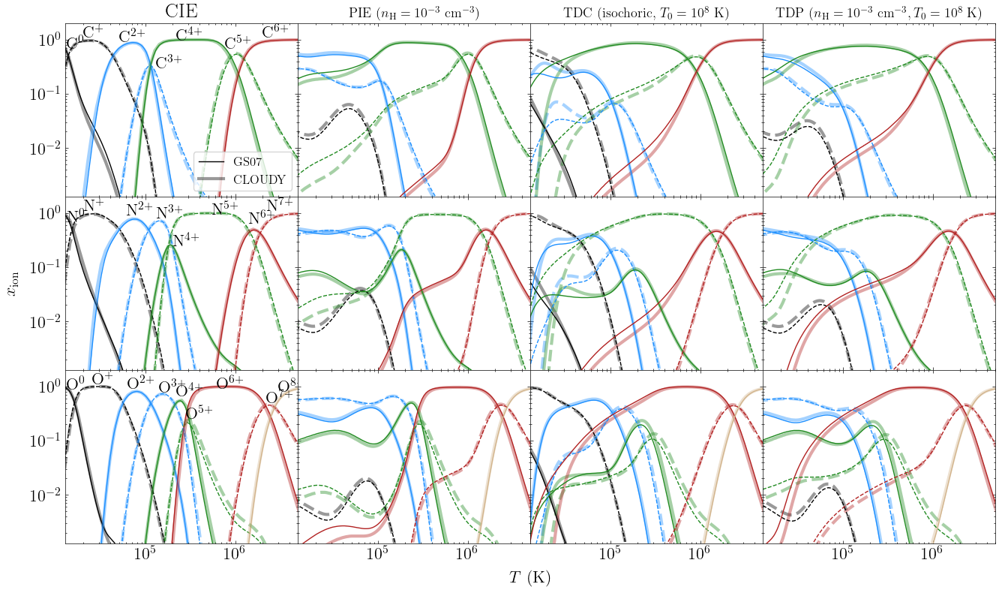

In [62]:
fig, axes = plt.subplots(3, 4, figsize=(4*4, 3*3), sharex=True, sharey=True)

# CIE
plot_ion_fracs(axes[:,0], T_grid_CIE_gs07, X_dict_CIE_carb_gs07, X_dict_CIE_nit_gs07, X_dict_CIE_oxy_gs07,
              'GS07', x_list_CIE_carb, y_list_CIE_carb, x_list_CIE_nit, y_list_CIE_nit, x_list_CIE_oxy, y_list_CIE_oxy,
               1, 1)

plot_ion_fracs(axes[:,0], T_grid_CIE, X_dict_CIE_carb, X_dict_CIE_nit, X_dict_CIE_oxy,
              'CLOUDY')

axes[0,0].axvline(1e8, linestyle='-.', color='black', lw=1.5)
axes[1,0].axvline(1e8, linestyle='-.', color='black', lw=1.5)
axes[2,0].axvline(1e8, linestyle='-.', color='black', lw=1.5)
    
axes[0,0].set_title('CIE')
axes[0,0].legend()

# PIE
k = ('hm12',1,-3)
plot_ion_fracs(axes[:,1], T_grid_PIE[k], X_dict_PIE_carb[k], X_dict_PIE_nit[k], X_dict_PIE_oxy[k])
plot_ion_fracs(axes[:,1], T_grid_PIE_g17[-3], X_dict_PIE_carb_g17[-3], X_dict_PIE_nit_g17[-3], X_dict_PIE_oxy_g17[-3],
              lw=1, alpha=1)
    
axes[0,1].set_title(r'PIE ($n_\mathrm{H} = 10^{-3} \ \mathrm{cm}^{-3}$)', fontsize=13)

# TDC isochoric
k = ('isochoric',0,1e8)
plot_ion_fracs(axes[:,2], T_grid_TDC[k], X_dict_TDC_carb[k], X_dict_TDC_nit[k], X_dict_TDC_oxy[k])
plot_ion_fracs(axes[:,2], T_grid_TDC_isochoric_gs07, X_dict_TDC_isochoric_carb_gs07, X_dict_TDC_isochoric_nit_gs07, X_dict_TDC_isochoric_oxy_gs07,
              lw=1, alpha=1)   
    
axes[0,2].set_title('TDC (isochoric, $T_0=10^8 \ \mathrm{K}$)', fontsize=13)
    
# TDP
k = ('isochoric','hm12',1,0,-3,1e8)
plot_ion_fracs(axes[:,3], T_grid_TDP[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k])
plot_ion_fracs(axes[:,3], T_grid_TDP_g17[-3], X_dict_TDP_carb_g17[-3], X_dict_TDP_nit_g17[-3], X_dict_TDP_oxy_g17[-3],
              lw=1, alpha=1)   
    
axes[0,3].set_title(r'TDP ($n_\mathrm{H} = 10^{-3} \ \mathrm{cm}^{-3}, T_0=10^8 \ \mathrm{K}$)', fontsize=13)
    
axes[0,0].set_xscale('log')
axes[0,0].set_yscale('log')

axes[0,0].set_xlim(10**4.1,10**6.7)
axes[0,0].set_ylim(10**-2.9, 10**0.3)

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])

ax_label.set_xlabel(r'$T \ (\mathrm{K})$', labelpad=25)
ax_label.set_ylabel(r'$x_\mathrm{ion}$', labelpad=45)
    
plt.subplots_adjust(wspace=0, hspace=0)

## G17 vs. OS13 vs. current work

In [63]:
os13_c_txt = np.loadtxt(rootdir+'os13_grids/PINe.HM12.z10.Z100.nh-30.T70.carbon.txt')
T_grid_TDP_os13 = 10**os13_c_txt[:,0]
X_grid_TDP_civ_os13 = os13_c_txt[:,11]

os13_n_txt = np.loadtxt(rootdir+'os13_grids/PINe.HM12.z10.Z100.nh-30.T70.nitrogen.txt')
X_grid_TDP_nv_os13 = os13_n_txt[:,12]

os13_o_txt = np.loadtxt(rootdir+'os13_grids/PINe.HM12.z10.Z100.nh-30.T70.oxygen.txt')
X_grid_TDP_ovi_os13 = os13_o_txt[:,13]

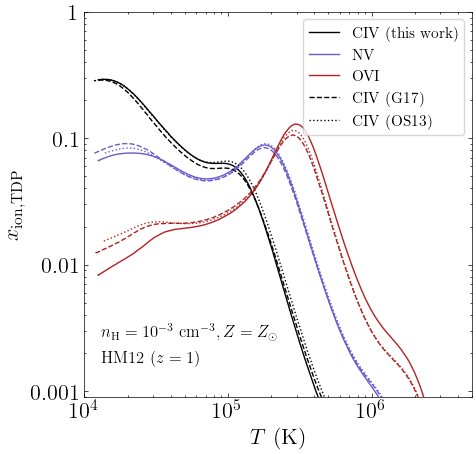

In [64]:
fig, ax = plt.subplots(1, figsize=(5,5))

ax.set_xlabel(r'$T \ \mathrm{(K)}$')
ax.set_ylabel(r'$x_\mathrm{ion, TDP}$')

k = ('isochoric','hm12',1,0,-3,1e8)
ax.plot(T_grid_TDP[k],  X_dict_TDP_carb[k]['CIV'], color='black', label='CIV (this work)')
ax.plot(T_grid_TDP[k],  X_dict_TDP_nit[k]['NV'], color='slateblue', label='NV')
ax.plot(T_grid_TDP[k],  X_dict_TDP_oxy[k]['OVI'], color='firebrick', label='OVI')

k = -3
ax.plot(T_grid_TDP_g17[k],  X_dict_TDP_carb_g17[k]['CIV'], linestyle='--', color='black', label='CIV (G17)')
ax.plot(T_grid_TDP_g17[k],  X_dict_TDP_nit_g17[k]['NV'], linestyle='--', color='slateblue')
ax.plot(T_grid_TDP_g17[k],  X_dict_TDP_oxy_g17[k]['OVI'], linestyle='--', color='firebrick')

ax.plot(T_grid_TDP_os13,  X_grid_TDP_civ_os13, linestyle=':', color='black', label='CIV (OS13)')
ax.plot(T_grid_TDP_os13,  X_grid_TDP_nv_os13, linestyle=':', color='slateblue')
ax.plot(T_grid_TDP_os13,  X_grid_TDP_ovi_os13, linestyle=':', color='firebrick')

ax.legend(fontsize=11, loc='upper right')

ax.set_xscale('log')
ax.set_yscale('log')

ax.text(1.3e4,2.7e-3,r'$n_\mathrm{H} = 10^{-3} \ \mathrm{cm}^{-3}, Z=Z_\odot$', fontsize=12)
ax.text(1.3e4,1.7e-3,r'HM12 ($z=1$)', fontsize=12)

ax.set_ylim(9e-4, 1)
ax.set_xlim(1e4,5e6)

ax.set_yticks([1e-3,1e-2,1e-1,1],['0.001', '0.01', '0.1', '1'])

plt.savefig(rootdir+'Figures/G17_OS13_compare.pdf', dpi=300)

## log_hdens = -4

PIE

In [65]:
k = ('hm12',1,-4)
T_grid_PIE[k], X_dict_PIE_hyd[k], X_dict_PIE_carb[k], X_dict_PIE_nit[k], X_dict_PIE_oxy[k] = get_PIE_frac(k)

PIE, G17

In [66]:
T_grid_PIE_g17[-4], X_dict_PIE_hyd_g17[-4], X_dict_PIE_carb_g17[-4], X_dict_PIE_nit_g17[-4], X_dict_PIE_oxy_g17[-4] = get_ion_frac_gnat('g17','10_89')

TDP

In [67]:
k = ('isochoric','hm12',1,0.0,-4,1e8)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

TDP, G17

In [68]:
T_grid_TDP_g17[-4], X_dict_TDP_hyd_g17[-4], X_dict_TDP_carb_g17[-4], X_dict_TDP_nit_g17[-4], X_dict_TDP_oxy_g17[-4] = get_ion_frac_gnat('g17','11_89')

Plot ion fractions

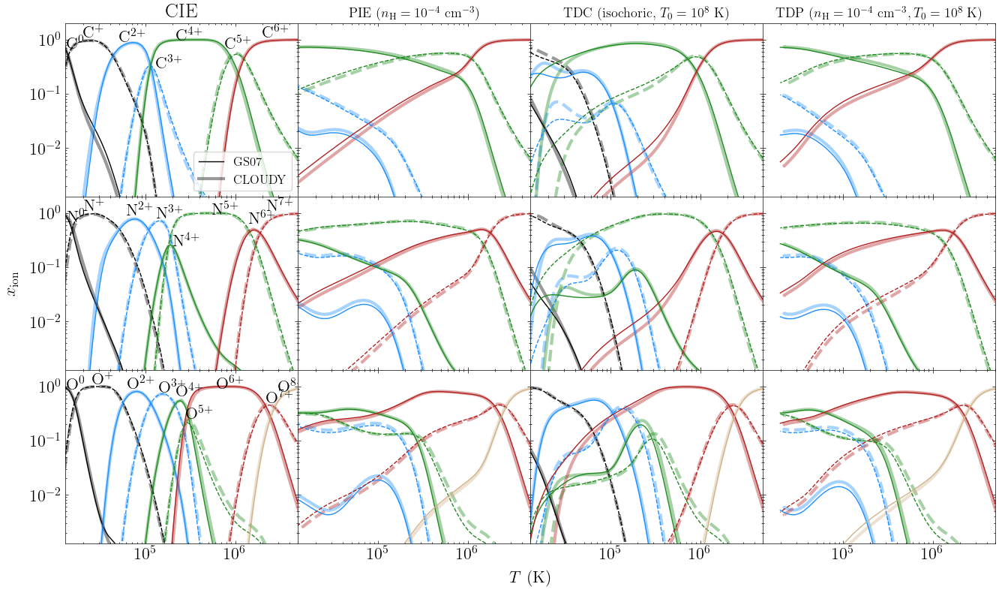

In [69]:
fig, axes = plt.subplots(3, 4, figsize=(4*4, 3*3), sharex=True, sharey=True)

# CIE
plot_ion_fracs(axes[:,0], T_grid_CIE_gs07, X_dict_CIE_carb_gs07, X_dict_CIE_nit_gs07, X_dict_CIE_oxy_gs07,
              'GS07', x_list_CIE_carb, y_list_CIE_carb, x_list_CIE_nit, y_list_CIE_nit, x_list_CIE_oxy, y_list_CIE_oxy,
               1, 1)

plot_ion_fracs(axes[:,0], T_grid_CIE, X_dict_CIE_carb, X_dict_CIE_nit, X_dict_CIE_oxy,
              'CLOUDY')

axes[0,0].axvline(1e8, linestyle='-.', color='black', lw=1.5)
axes[1,0].axvline(1e8, linestyle='-.', color='black', lw=1.5)
axes[2,0].axvline(1e8, linestyle='-.', color='black', lw=1.5)
    
axes[0,0].set_title('CIE')
axes[0,0].legend()

# PIE
k = ('hm12',1,-4)
plot_ion_fracs(axes[:,1], T_grid_PIE[k], X_dict_PIE_carb[k], X_dict_PIE_nit[k], X_dict_PIE_oxy[k])
plot_ion_fracs(axes[:,1], T_grid_PIE_g17[-4], X_dict_PIE_carb_g17[-4], X_dict_PIE_nit_g17[-4], X_dict_PIE_oxy_g17[-4],
              lw=1, alpha=1)
    
axes[0,1].set_title(r'PIE ($n_\mathrm{H} = 10^{-4} \ \mathrm{cm}^{-3}$)', fontsize=13)

# TDC isochoric
k = ('isochoric',0,1e8)
plot_ion_fracs(axes[:,2], T_grid_TDC[k], X_dict_TDC_carb[k], X_dict_TDC_nit[k], X_dict_TDC_oxy[k])
plot_ion_fracs(axes[:,2], T_grid_TDC_isochoric_gs07, X_dict_TDC_isochoric_carb_gs07, X_dict_TDC_isochoric_nit_gs07, X_dict_TDC_isochoric_oxy_gs07,
              lw=1, alpha=1)   
    
axes[0,2].set_title('TDC (isochoric, $T_0=10^8 \ \mathrm{K}$)', fontsize=13)
    
# TDP
k = ('isochoric','hm12',1,0,-4,1e8)
plot_ion_fracs(axes[:,3], T_grid_TDP[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k])
plot_ion_fracs(axes[:,3], T_grid_TDP_g17[-4], X_dict_TDP_carb_g17[-4], X_dict_TDP_nit_g17[-4], X_dict_TDP_oxy_g17[-4],
              lw=1, alpha=1)    
    
axes[0,3].set_title(r'TDP ($n_\mathrm{H} = 10^{-4} \ \mathrm{cm}^{-3}, T_0=10^8 \ \mathrm{K}$)', fontsize=13)
    
axes[0,0].set_xscale('log')
axes[0,0].set_yscale('log')

axes[0,0].set_xlim(10**4.1,10**6.7)
axes[0,0].set_ylim(10**-2.9, 10**0.3)

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])

ax_label.set_xlabel(r'$T \ (\mathrm{K})$', labelpad=25)
ax_label.set_ylabel(r'$x_\mathrm{ion}$', labelpad=45)
    
plt.subplots_adjust(wspace=0, hspace=0)

# Photoionization - FG20 (1e8K)

## log_hdens = -2

In [70]:
k = ('fg20',1,-2)
T_grid_PIE[k], X_dict_PIE_hyd[k], X_dict_PIE_carb[k], X_dict_PIE_nit[k], X_dict_PIE_oxy[k] = get_PIE_frac(k)

In [71]:
k = ('isochoric','fg20',1,0.0,-2.0,1e8)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

Plot ion fractions

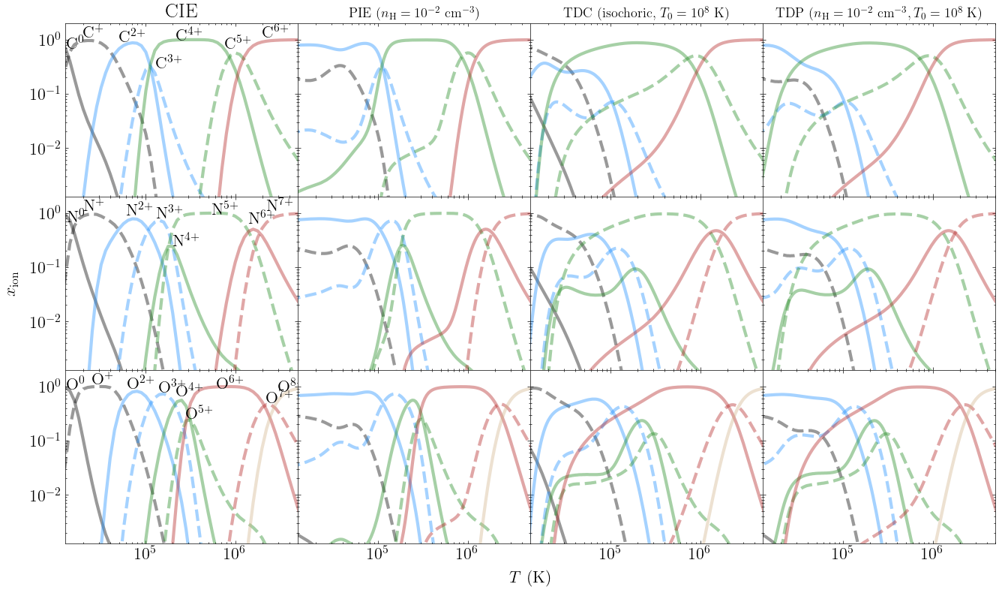

In [72]:
fig, axes = plt.subplots(3, 4, figsize=(4*4, 3*3), sharex=True, sharey=True)

# CIE
plot_ion_fracs(axes[:,0], T_grid_CIE, X_dict_CIE_carb, X_dict_CIE_nit, X_dict_CIE_oxy,
              None, x_list_CIE_carb, y_list_CIE_carb, x_list_CIE_nit, y_list_CIE_nit, x_list_CIE_oxy, y_list_CIE_oxy,
               3, .4)

axes[0,0].axvline(1e8, linestyle='-.', color='black', lw=1.5)
axes[1,0].axvline(1e8, linestyle='-.', color='black', lw=1.5)
axes[2,0].axvline(1e8, linestyle='-.', color='black', lw=1.5)
    
axes[0,0].set_title('CIE')

# PIE
k = ('fg20',1,-2)
plot_ion_fracs(axes[:,1], T_grid_PIE[k], X_dict_PIE_carb[k], X_dict_PIE_nit[k], X_dict_PIE_oxy[k])    
axes[0,1].set_title(r'PIE ($n_\mathrm{H} = 10^{-2} \ \mathrm{cm}^{-3}$)', fontsize=13)

# TDC isochoric
k = ('isochoric',0,1e8)
plot_ion_fracs(axes[:,2], T_grid_TDC[k], X_dict_TDC_carb[k], X_dict_TDC_nit[k], X_dict_TDC_oxy[k])
    
axes[0,2].set_title('TDC (isochoric, $T_0=10^8 \ \mathrm{K}$)', fontsize=13)
    
# TDP

k = ('isochoric','fg20',1,0,-2,1e8)
plot_ion_fracs(axes[:,3], T_grid_TDP[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k])    
axes[0,3].set_title(r'TDP ($n_\mathrm{H} = 10^{-2} \ \mathrm{cm}^{-3}, T_0=10^8 \ \mathrm{K}$)', fontsize=13)
    
axes[0,0].set_xscale('log')
axes[0,0].set_yscale('log')

axes[0,0].set_xlim(10**4.1,10**6.7)
axes[0,0].set_ylim(10**-2.9, 10**0.3)

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])

ax_label.set_xlabel(r'$T \ (\mathrm{K})$', labelpad=25)
ax_label.set_ylabel(r'$x_\mathrm{ion}$', labelpad=45)
    
plt.subplots_adjust(wspace=0, hspace=0)

## log_hdens = -3

In [73]:
k = ('fg20',1,-3)
T_grid_PIE[k], X_dict_PIE_hyd[k], X_dict_PIE_carb[k], X_dict_PIE_nit[k], X_dict_PIE_oxy[k] = get_PIE_frac(k)

k = ('isochoric','fg20',1,0.0,-3.0,1e8)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

Plot ion fractions

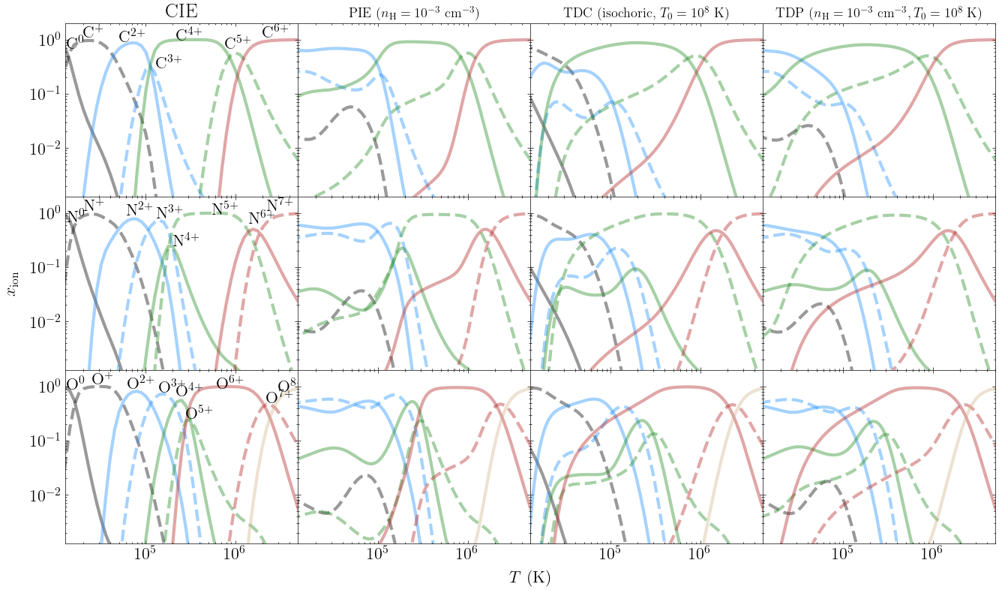

In [74]:
fig, axes = plt.subplots(3, 4, figsize=(4*4, 3*3), sharex=True, sharey=True)

# CIE
plot_ion_fracs(axes[:,0], T_grid_CIE, X_dict_CIE_carb, X_dict_CIE_nit, X_dict_CIE_oxy,
              None, x_list_CIE_carb, y_list_CIE_carb, x_list_CIE_nit, y_list_CIE_nit, x_list_CIE_oxy, y_list_CIE_oxy,
               3, .4)

axes[0,0].axvline(1e8, linestyle='-.', color='black', lw=1.5)
axes[1,0].axvline(1e8, linestyle='-.', color='black', lw=1.5)
axes[2,0].axvline(1e8, linestyle='-.', color='black', lw=1.5)
    
axes[0,0].set_title('CIE')

# PIE
k = ('fg20',1,-3)
plot_ion_fracs(axes[:,1], T_grid_PIE[k], X_dict_PIE_carb[k], X_dict_PIE_nit[k], X_dict_PIE_oxy[k])    
axes[0,1].set_title(r'PIE ($n_\mathrm{H} = 10^{-3} \ \mathrm{cm}^{-3}$)', fontsize=13)

# TDC isochoric
k = ('isochoric',0,1e8)
plot_ion_fracs(axes[:,2], T_grid_TDC[k], X_dict_TDC_carb[k], X_dict_TDC_nit[k], X_dict_TDC_oxy[k])
    
axes[0,2].set_title('TDC (isochoric, $T_0=10^8 \ \mathrm{K}$)', fontsize=13)
    
# TDP

k = ('isochoric','fg20',1,0,-3,1e8)
plot_ion_fracs(axes[:,3], T_grid_TDP[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k])    

axes[0,3].set_title(r'TDP ($n_\mathrm{H} = 10^{-3} \ \mathrm{cm}^{-3}, T_0=10^8 \ \mathrm{K}$)', fontsize=13)
    
axes[0,0].set_xscale('log')
axes[0,0].set_yscale('log')

axes[0,0].set_xlim(10**4.1,10**6.7)
axes[0,0].set_ylim(10**-2.9, 10**0.3)

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])

ax_label.set_xlabel(r'$T \ (\mathrm{K})$', labelpad=25)
ax_label.set_ylabel(r'$x_\mathrm{ion}$', labelpad=45)
    
plt.subplots_adjust(wspace=0, hspace=0)

## log_hdens = -4

In [75]:
k = ('fg20',1,-4)
T_grid_PIE[k], X_dict_PIE_hyd[k], X_dict_PIE_carb[k], X_dict_PIE_nit[k], X_dict_PIE_oxy[k] = get_PIE_frac(k)

k = ('isochoric','fg20',1,0.0,-4.0,1e8)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

Plot ion fractions

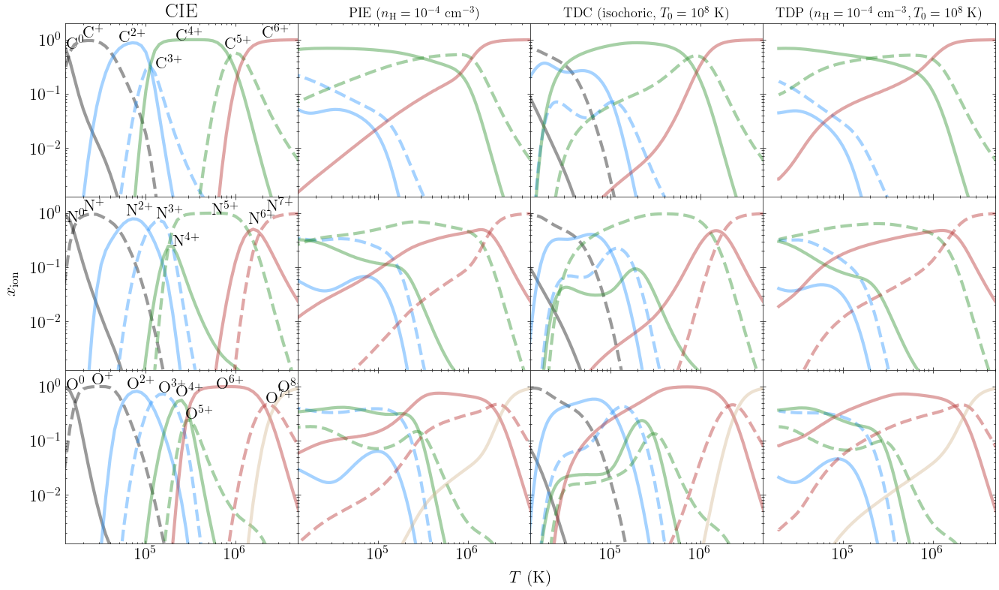

In [76]:
fig, axes = plt.subplots(3, 4, figsize=(4*4, 3*3), sharex=True, sharey=True)

# CIE
plot_ion_fracs(axes[:,0], T_grid_CIE, X_dict_CIE_carb, X_dict_CIE_nit, X_dict_CIE_oxy,               
               None, x_list_CIE_carb, y_list_CIE_carb, x_list_CIE_nit, y_list_CIE_nit, x_list_CIE_oxy, y_list_CIE_oxy,
               3, .4)

axes[0,0].axvline(1e8, linestyle='-.', color='black', lw=1.5)
axes[1,0].axvline(1e8, linestyle='-.', color='black', lw=1.5)
axes[2,0].axvline(1e8, linestyle='-.', color='black', lw=1.5)
    
axes[0,0].set_title('CIE')

# PIE
k = ('fg20',1,-4)
plot_ion_fracs(axes[:,1], T_grid_PIE[k], X_dict_PIE_carb[k], X_dict_PIE_nit[k], X_dict_PIE_oxy[k])    
axes[0,1].set_title(r'PIE ($n_\mathrm{H} = 10^{-4} \ \mathrm{cm}^{-3}$)', fontsize=13)

# TDC isochoric
k = ('isochoric',0,1e8)
plot_ion_fracs(axes[:,2], T_grid_TDC[k], X_dict_TDC_carb[k], X_dict_TDC_nit[k], X_dict_TDC_oxy[k])
    
axes[0,2].set_title('TDC (isochoric, $T_0=10^8 \ \mathrm{K}$)', fontsize=13)
    
# TDP

k = ('isochoric','fg20',1,0,-4,1e8)
plot_ion_fracs(axes[:,3], T_grid_TDP[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k])  

axes[0,3].set_title(r'TDP ($n_\mathrm{H} = 10^{-4} \ \mathrm{cm}^{-3}, T_0=10^8 \ \mathrm{K}$)', fontsize=13)
    
axes[0,0].set_xscale('log')
axes[0,0].set_yscale('log')

axes[0,0].set_xlim(10**4.1,10**6.7)
axes[0,0].set_ylim(10**-2.9, 10**0.3)

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])

ax_label.set_xlabel(r'$T \ (\mathrm{K})$', labelpad=25)
ax_label.set_ylabel(r'$x_\mathrm{ion}$', labelpad=45)
    
plt.subplots_adjust(wspace=0, hspace=0)

## Nevalainen 17 (modified)

Without UVB

In [77]:
k = ('isochoric',-1,3e6)
T_grid_TDC[k], X_dict_TDC_hyd[k], X_dict_TDC_carb[k], X_dict_TDC_nit[k], X_dict_TDC_oxy[k] = get_TDC_frac(k)

In [78]:
OIV_OV_CIE = X_dict_CIE_oxy['OIV']/X_dict_CIE_oxy['OV']
OIV_OVI_CIE = X_dict_CIE_oxy['OIV']/X_dict_CIE_oxy['OVI']

k = ('isochoric',0,3e6)
T_grid_TDC_0 = T_grid_TDC[k]
OIV_OV_TDC_0 = X_dict_TDC_oxy[k]['OIV']/X_dict_TDC_oxy[k]['OV']
OIV_OVI_TDC_0 = X_dict_TDC_oxy[k]['OIV']/X_dict_TDC_oxy[k]['OVI']

k = ('isochoric',-1,3e6)
T_grid_TDC_1 = T_grid_TDC[k]
OIV_OV_TDC_1 = X_dict_TDC_oxy[k]['OIV']/X_dict_TDC_oxy[k]['OV']
OIV_OVI_TDC_1 = X_dict_TDC_oxy[k]['OIV']/X_dict_TDC_oxy[k]['OVI']

/var/folders/tj/vc_wjrpj36sf3zws4s7s770c0000gn/T/ipykernel_8875/1017266058.py:1: RuntimeWarning: divide by zero encountered in divide
  OIV_OV_CIE = X_dict_CIE_oxy['OIV']/X_dict_CIE_oxy['OV']
/var/folders/tj/vc_wjrpj36sf3zws4s7s770c0000gn/T/ipykernel_8875/1017266058.py:1: RuntimeWarning: invalid value encountered in divide
  OIV_OV_CIE = X_dict_CIE_oxy['OIV']/X_dict_CIE_oxy['OV']
/var/folders/tj/vc_wjrpj36sf3zws4s7s770c0000gn/T/ipykernel_8875/1017266058.py:2: RuntimeWarning: divide by zero encountered in divide
  OIV_OVI_CIE = X_dict_CIE_oxy['OIV']/X_dict_CIE_oxy['OVI']
/var/folders/tj/vc_wjrpj36sf3zws4s7s770c0000gn/T/ipykernel_8875/1017266058.py:2: RuntimeWarning: invalid value encountered in divide
  OIV_OVI_CIE = X_dict_CIE_oxy['OIV']/X_dict_CIE_oxy['OVI']


With UVB

In [79]:
k = ('isochoric','fg20',0,0,-3,3e6)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

k = ('isochoric','fg20',0,-1,-3,3e6)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

In [80]:
k = ('isochoric','fg20',0,0,-3,3e6)
T_grid_TDP_0 = T_grid_TDP[k]
OIV_OV_TDP_0 = X_dict_TDP_oxy[k]['OIV']/X_dict_TDP_oxy[k]['OV']
OIV_OVI_TDP_0 = X_dict_TDP_oxy[k]['OIV']/X_dict_TDP_oxy[k]['OVI']

k = ('isochoric','fg20',0,-1,-3,3e6)
T_grid_TDP_1 = T_grid_TDP[k]
OIV_OV_TDP_1 = X_dict_TDP_oxy[k]['OIV']/X_dict_TDP_oxy[k]['OV']
OIV_OVI_TDP_1 = X_dict_TDP_oxy[k]['OIV']/X_dict_TDP_oxy[k]['OVI']

Make plots

In [81]:
T_CIE = 10**np.arange(5.2, 5.6, 0.1)
T_TDC_0 = 10**np.arange(4.5, 5.6, 0.1)
T_TDC_1 = 10**np.arange(5.1, 5.6, 0.1)
T_TDP_0 = 10**np.arange(5.1, 5.6, 0.1)
T_TDP_1 = 10**np.arange(5.1, 5.6, 0.1)

In [82]:
from matplotlib.patches import Rectangle

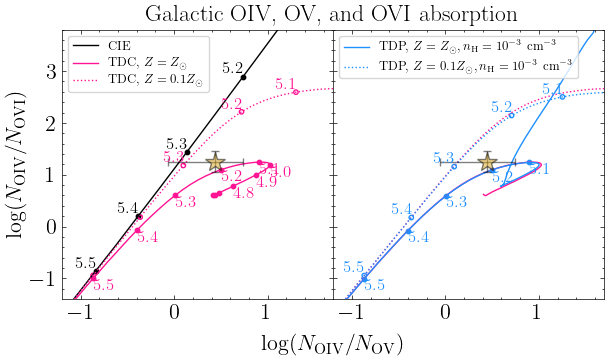

In [83]:
fig, axes = plt.subplots(1, 2, figsize=(3.5*2,3.5), sharex=True, sharey=True)

# Without UVB

# CIE
axes[0].plot(np.log10(OIV_OV_CIE), np.log10(OIV_OVI_CIE), color='black', label='CIE')

for T in T_CIE:
    x = np.log10(OIV_OV_CIE)[np.argmin(np.abs(T_grid_CIE-T))]
    y = np.log10(OIV_OVI_CIE)[np.argmin(np.abs(T_grid_CIE-T))]
    axes[0].scatter(x, y, color='black', s=10)
    axes[0].text(x, y, np.round(np.log10(T),1), 
                 horizontalalignment='right', verticalalignment='bottom', fontsize=12)
    
# TDC, solar
axes[0].plot(np.log10(OIV_OV_TDC_0)[T_grid_TDC_0>10**4.49], 
        np.log10(OIV_OVI_TDC_0)[T_grid_TDC_0>10**4.49], color='deeppink', label=r'TDC, $Z=Z_\odot$')

for T in T_TDC_0:
    x = np.log10(OIV_OV_TDC_0)[np.argmin(np.abs(T_grid_TDC_0-T))]
    y = np.log10(OIV_OVI_TDC_0)[np.argmin(np.abs(T_grid_TDC_0-T))]
    axes[0].scatter(x, y, color='deeppink', s=10)
    if T>10**4.7:
        axes[0].text(x, y, np.round(np.log10(T),1), 
                horizontalalignment='left', verticalalignment='top', color='deeppink', fontsize=12)

# TDC, sub-solar
axes[0].plot(np.log10(OIV_OV_TDC_1)[T_grid_TDC_1>10**5], 
        np.log10(OIV_OVI_TDC_1)[T_grid_TDC_1>10**5], linestyle=':', color='deeppink', label=r'TDC, $Z=0.1Z_\odot$')

for T in T_TDC_1:
    x = np.log10(OIV_OV_TDC_1)[np.argmin(np.abs(T_grid_TDC_1-T))]
    y = np.log10(OIV_OVI_TDC_1)[np.argmin(np.abs(T_grid_TDC_1-T))]
    axes[0].scatter(x, y, color='deeppink', facecolor='none', s=10)
    if 10**4.7<T<10**5.3:
        axes[0].text(x, y, np.round(np.log10(T),1), horizontalalignment='right', 
                     verticalalignment='bottom', color='deeppink', fontsize=12)
        
axes[0].legend(fontsize=9)

axes[0].errorbar(0.44, 1.25, xerr=[[0.5], [0.3]], yerr=[[0.2],[0.2]],
                 marker='*', markersize=15, markerfacecolor='goldenrod', capsize=3, alpha=.5)

axes[0].set_xlim(-1.2,1.7)
axes[0].set_ylim(-1.4,3.8)

# With UVB

# TDC
axes[1].plot(np.log10(OIV_OV_TDC_0)[T_grid_TDC_0>10**4.49], 
        np.log10(OIV_OVI_TDC_0)[T_grid_TDC_0>10**4.49], color='deeppink')

axes[1].plot(np.log10(OIV_OV_TDC_1)[T_grid_TDC_1>10**5], 
        np.log10(OIV_OVI_TDC_1)[T_grid_TDC_1>10**5], linestyle=':', color='deeppink')
   
# TDP, solar
axes[1].plot(np.log10(OIV_OV_TDP_0), 
        np.log10(OIV_OVI_TDP_0), 
        color='dodgerblue',
        label=r'TDP, $Z=Z_\odot, n_\mathrm{H}=10^{-3} \ \mathrm{cm}^{-3}$')

for T in T_TDP_0:
    x = np.log10(OIV_OV_TDP_0)[np.argmin(np.abs(T_grid_TDP_0-T))]
    y = np.log10(OIV_OVI_TDP_0)[np.argmin(np.abs(T_grid_TDP_0-T))]
    axes[1].scatter(x, y, color='dodgerblue', s=10)
    if T>10**4.7:
        axes[1].text(x, y, np.round(np.log10(T),1), 
                horizontalalignment='left', verticalalignment='top', color='dodgerblue', fontsize=12)

# TDP, sub-solar
axes[1].plot(np.log10(OIV_OV_TDP_1)[T_grid_TDP_1>10**5], 
        np.log10(OIV_OVI_TDP_1)[T_grid_TDP_1>10**5], 
        color='dodgerblue',
        label=r'TDP, $Z=0.1Z_\odot, n_\mathrm{H}=10^{-3} \ \mathrm{cm}^{-3}$', linestyle=':')


for T in T_TDP_1:
    x = np.log10(OIV_OV_TDP_1)[np.argmin(np.abs(T_grid_TDP_1-T))]
    y = np.log10(OIV_OVI_TDP_1)[np.argmin(np.abs(T_grid_TDP_1-T))]
    axes[1].scatter(x, y, color='dodgerblue', facecolor='none', s=10)
    if T>10**4.7:
        axes[1].text(x, y, np.round(np.log10(T),1), 
                horizontalalignment='right', verticalalignment='bottom', color='dodgerblue', fontsize=12)

axes[1].legend(fontsize=9)

axes[1].errorbar(0.44, 1.25, xerr=[[0.5], [0.3]], yerr=[[0.2],[0.2]],
                 marker='*', markersize=15, markerfacecolor='goldenrod', capsize=3, alpha=.5)


#axes[1].add_patch(Rectangle((0.6, 1.0), 0.3, 0.5, facecolor="none", ec='k', lw=2))
#axes[1].add_patch(Rectangle((-0.1, 0.8), 0.3, 0.5, facecolor="none", ec='k', lw=2))


ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])

ax_label.set_xlabel(r'$\log(N_\mathrm{OIV}/N_\mathrm{OV})$', labelpad=25)
ax_label.set_ylabel(r'$\log(N_\mathrm{OIV}/N_\mathrm{OVI})$', labelpad=25)

ax_label.set_title('Galactic OIV, OV, and OVI absorption', fontsize=17)
plt.subplots_adjust(wspace=0, hspace=0)

# Photoionization - KS19 (1e8K)

## log_hdens = -2

In [84]:
k = ('ks19',1,-2)
T_grid_PIE[k], X_dict_PIE_hyd[k], X_dict_PIE_carb[k], X_dict_PIE_nit[k], X_dict_PIE_oxy[k] = get_PIE_frac(k)

k = ('isochoric','ks19',1,0.0,-2,1e8)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

Plot ion fractions

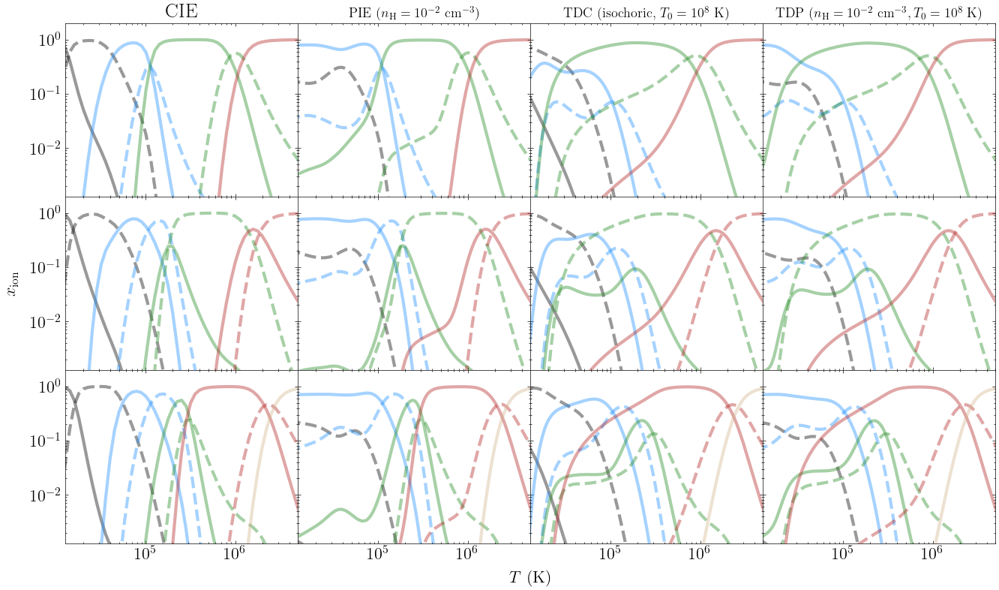

In [85]:
fig, axes = plt.subplots(3, 4, figsize=(4*4, 3*3), sharex=True, sharey=True)

# CIE
plot_ion_fracs(axes[:,0], T_grid_CIE, X_dict_CIE_carb, X_dict_CIE_nit, X_dict_CIE_oxy)

axes[0,0].axvline(1e8, linestyle='-.', color='black', lw=1.5)
axes[1,0].axvline(1e8, linestyle='-.', color='black', lw=1.5)
axes[2,0].axvline(1e8, linestyle='-.', color='black', lw=1.5)
    
axes[0,0].set_title('CIE')

# PIE
k = ('ks19',1,-2)
plot_ion_fracs(axes[:,1], T_grid_PIE[k], X_dict_PIE_carb[k], X_dict_PIE_nit[k], X_dict_PIE_oxy[k])    
axes[0,1].set_title(r'PIE ($n_\mathrm{H} = 10^{-2} \ \mathrm{cm}^{-3}$)', fontsize=13)

# TDC isochoric
k = ('isochoric',0,1e8)
plot_ion_fracs(axes[:,2], T_grid_TDC[k], X_dict_TDC_carb[k], X_dict_TDC_nit[k], X_dict_TDC_oxy[k])
    
axes[0,2].set_title('TDC (isochoric, $T_0=10^8 \ \mathrm{K}$)', fontsize=13)
    
# TDP

k = ('isochoric','ks19',1,0,-2,1e8)
plot_ion_fracs(axes[:,3], T_grid_TDP[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k])    
axes[0,3].set_title(r'TDP ($n_\mathrm{H} = 10^{-2} \ \mathrm{cm}^{-3}, T_0=10^8 \ \mathrm{K}$)', fontsize=13)
    
axes[0,0].set_xscale('log')
axes[0,0].set_yscale('log')

axes[0,0].set_xlim(10**4.1,10**6.7)
axes[0,0].set_ylim(10**-2.9, 10**0.3)

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])

ax_label.set_xlabel(r'$T \ (\mathrm{K})$', labelpad=25)
ax_label.set_ylabel(r'$x_\mathrm{ion}$', labelpad=45)
    
plt.subplots_adjust(wspace=0, hspace=0)

## log_hdens = -3

In [86]:
k = ('ks19',1,-3)
T_grid_PIE[k], X_dict_PIE_hyd[k], X_dict_PIE_carb[k], X_dict_PIE_nit[k], X_dict_PIE_oxy[k] = get_PIE_frac(k)

k = ('isochoric','ks19',1,0.0,-3,1e8)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

Plot ion fractions

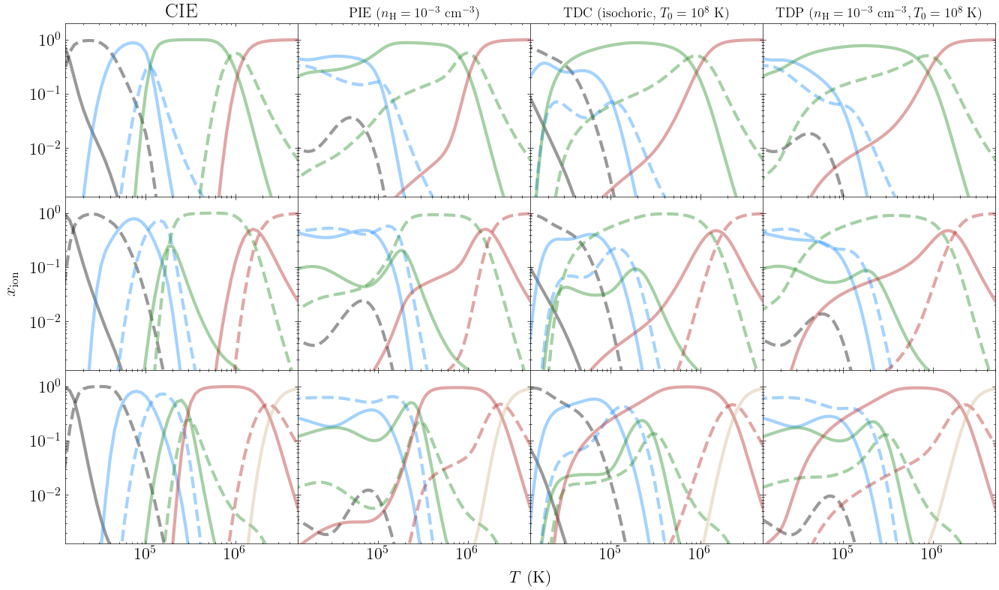

In [87]:
fig, axes = plt.subplots(3, 4, figsize=(4*4, 3*3), sharex=True, sharey=True)

# CIE
plot_ion_fracs(axes[:,0], T_grid_CIE, X_dict_CIE_carb, X_dict_CIE_nit, X_dict_CIE_oxy)

axes[0,0].axvline(1e8, linestyle='-.', color='black', lw=1.5)
axes[1,0].axvline(1e8, linestyle='-.', color='black', lw=1.5)
axes[2,0].axvline(1e8, linestyle='-.', color='black', lw=1.5)
    
axes[0,0].set_title('CIE')

# PIE
k = ('ks19',1,-3)
plot_ion_fracs(axes[:,1], T_grid_PIE[k], X_dict_PIE_carb[k], X_dict_PIE_nit[k], X_dict_PIE_oxy[k])    
axes[0,1].set_title(r'PIE ($n_\mathrm{H} = 10^{-3} \ \mathrm{cm}^{-3}$)', fontsize=13)

# TDC isochoric
k = ('isochoric',0,1e8)
plot_ion_fracs(axes[:,2], T_grid_TDC[k], X_dict_TDC_carb[k], X_dict_TDC_nit[k], X_dict_TDC_oxy[k])
    
axes[0,2].set_title('TDC (isochoric, $T_0=10^8 \ \mathrm{K}$)', fontsize=13)
    
# TDP

k = ('isochoric','ks19',1,0,-3,1e8)
plot_ion_fracs(axes[:,3], T_grid_TDP[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k])    

axes[0,3].set_title(r'TDP ($n_\mathrm{H} = 10^{-3} \ \mathrm{cm}^{-3}, T_0=10^8 \ \mathrm{K}$)', fontsize=13)
    
axes[0,0].set_xscale('log')
axes[0,0].set_yscale('log')

axes[0,0].set_xlim(10**4.1,10**6.7)
axes[0,0].set_ylim(10**-2.9, 10**0.3)

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])

ax_label.set_xlabel(r'$T \ (\mathrm{K})$', labelpad=25)
ax_label.set_ylabel(r'$x_\mathrm{ion}$', labelpad=45)
    
plt.subplots_adjust(wspace=0, hspace=0)

## log_hdens = -4

In [88]:
k = ('ks19',1,-4)
T_grid_PIE[k], X_dict_PIE_hyd[k], X_dict_PIE_carb[k], X_dict_PIE_nit[k], X_dict_PIE_oxy[k] = get_PIE_frac(k)

k = ('isochoric','ks19',1,0.0,-4,1e8)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

Plot ion fractions

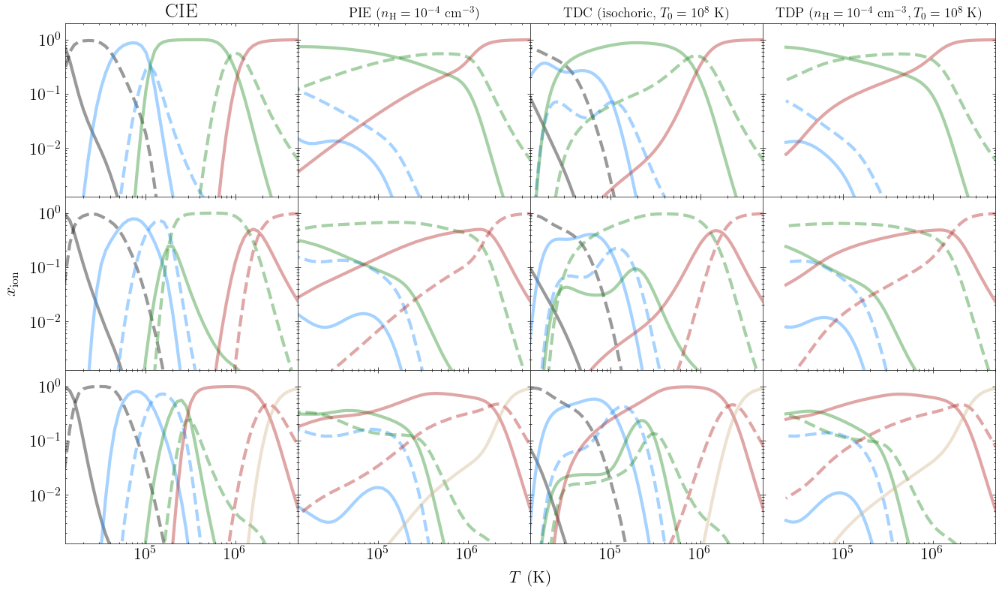

In [89]:
fig, axes = plt.subplots(3, 4, figsize=(4*4, 3*3), sharex=True, sharey=True)

# CIE
plot_ion_fracs(axes[:,0], T_grid_CIE, X_dict_CIE_carb, X_dict_CIE_nit, X_dict_CIE_oxy)

axes[0,0].axvline(1e8, linestyle='-.', color='black', lw=1.5)
axes[1,0].axvline(1e8, linestyle='-.', color='black', lw=1.5)
axes[2,0].axvline(1e8, linestyle='-.', color='black', lw=1.5)
    
axes[0,0].set_title('CIE')

# PIE
k = ('ks19',1,-4)
plot_ion_fracs(axes[:,1], T_grid_PIE[k], X_dict_PIE_carb[k], X_dict_PIE_nit[k], X_dict_PIE_oxy[k])    
axes[0,1].set_title(r'PIE ($n_\mathrm{H} = 10^{-4} \ \mathrm{cm}^{-3}$)', fontsize=13)

# TDC isochoric
k = ('isochoric',0,1e8)
plot_ion_fracs(axes[:,2], T_grid_TDC[k], X_dict_TDC_carb[k], X_dict_TDC_nit[k], X_dict_TDC_oxy[k])
    
axes[0,2].set_title('TDC (isochoric, $T_0=10^8 \ \mathrm{K}$)', fontsize=13)
    
# TDP

k = ('isochoric','ks19',1,0,-4,1e8)
plot_ion_fracs(axes[:,3], T_grid_TDP[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k])  

axes[0,3].set_title(r'TDP ($n_\mathrm{H} = 10^{-4} \ \mathrm{cm}^{-3}, T_0=10^8 \ \mathrm{K}$)', fontsize=13)
    
axes[0,0].set_xscale('log')
axes[0,0].set_yscale('log')

axes[0,0].set_xlim(10**4.1,10**6.7)
axes[0,0].set_ylim(10**-2.9, 10**0.3)

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])

ax_label.set_xlabel(r'$T \ (\mathrm{K})$', labelpad=25)
ax_label.set_ylabel(r'$x_\mathrm{ion}$', labelpad=45)
    
plt.subplots_adjust(wspace=0, hspace=0)

# TDP (3e6K) vs. PIE/TDC - FG20

Load TDP for 3e6K

In [90]:
# metals=0
k = ('isochoric','fg20',1,0.0,-2.0,3e6)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

k = ('isochoric','fg20',1,0.0,-3.0,3e6)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

k = ('isochoric','fg20',1,0.0,-4.0,3e6)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

# metals=-1
k = ('isochoric','fg20',1,-1.0,-2.0,3e6)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

k = ('isochoric','fg20',1,-1.0,-3.0,3e6)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

k = ('isochoric','fg20',1,-1.0,-4.0,3e6)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

Interpolate TDC/PIE along TDP

In [91]:
def interp_ion_frac(T_grid_interp, T_grid, X_dict_carb, X_dict_nit, X_dict_oxy):
    
    # C
    X_dict_carb_interp = {k:np.zeros(len(T_grid_interp)) for k in C_list}
    
    for s in C_list:
        X_dict_carb_interp[s] = interp1d(T_grid, X_dict_carb[s], fill_value='extrapolate')(T_grid_interp)
        
    # N
    X_dict_nit_interp = {k:np.zeros(len(T_grid_interp)) for k in N_list}

    for s in N_list:
        X_dict_nit_interp[s] = interp1d(T_grid, X_dict_nit[s], fill_value='extrapolate')(T_grid_interp)

    # N
    X_dict_oxy_interp = {k:np.zeros(len(T_grid_interp)) for k in O_list}

    for s in O_list:
        X_dict_oxy_interp[s] = interp1d(T_grid, X_dict_oxy[s], fill_value='extrapolate')(T_grid_interp)
        
    return X_dict_carb_interp, X_dict_nit_interp, X_dict_oxy_interp

In [92]:
X_dict_PIE_carb_interp = {}
X_dict_PIE_nit_interp = {}
X_dict_PIE_oxy_interp = {}

X_dict_TDC_carb_interp = {}
X_dict_TDC_nit_interp = {}
X_dict_TDC_oxy_interp = {}

In [93]:
# Along metals=0
k1 = ('isochoric','fg20',1,0,-2,3e6)
k2 = ('fg20',1,-2)
k3 = ('isochoric', 0, 3e6)

# dens=-2
X_dict_PIE_carb_interp[(k1,k2)], X_dict_PIE_nit_interp[(k1,k2)], X_dict_PIE_oxy_interp[(k1,k2)] = interp_ion_frac(T_grid_TDP[k1], 
                                                                                                   T_grid_PIE[k2], 
                                                                                                   X_dict_PIE_carb[k2], 
                                                                                                   X_dict_PIE_nit[k2], 
                                                                                                   X_dict_PIE_oxy[k2])


X_dict_TDC_carb_interp[(k1,k3)], X_dict_TDC_nit_interp[(k1,k3)], X_dict_TDC_oxy_interp[(k1,k3)] = interp_ion_frac(T_grid_TDP[k1], 
                                                                                                   T_grid_TDC[k3], 
                                                                                                   X_dict_TDC_carb[k3], 
                                                                                                   X_dict_TDC_nit[k3], 
                                                                                                   X_dict_TDC_oxy[k3])

# dens=-3
k1 = ('isochoric','fg20',1,0,-3,3e6)
k2 = ('fg20',1,-3)
k3 = ('isochoric', 0, 3e6)

X_dict_PIE_carb_interp[(k1,k2)], X_dict_PIE_nit_interp[(k1,k2)], X_dict_PIE_oxy_interp[(k1,k2)] = interp_ion_frac(T_grid_TDP[k1],
                                                                                                   T_grid_PIE[k2], 
                                                                                                   X_dict_PIE_carb[k2], 
                                                                                                   X_dict_PIE_nit[k2], 
                                                                                                   X_dict_PIE_oxy[k2])

X_dict_TDC_carb_interp[(k1,k3)], X_dict_TDC_nit_interp[(k1,k3)], X_dict_TDC_oxy_interp[(k1,k3)] = interp_ion_frac(T_grid_TDP[k1], 
                                                                                                   T_grid_TDC[k3], 
                                                                                                   X_dict_TDC_carb[k3], 
                                                                                                   X_dict_TDC_nit[k3], 
                                                                                                   X_dict_TDC_oxy[k3])


k1 = ('isochoric','fg20',1,0,-4,3e6)
k2 = ('fg20',1,-4)
k3 = ('isochoric', 0, 3e6)

X_dict_PIE_carb_interp[(k1,k2)], X_dict_PIE_nit_interp[(k1,k2)], X_dict_PIE_oxy_interp[(k1,k2)] = interp_ion_frac(T_grid_TDP[k1],
                                                                                                   T_grid_PIE[k2], 
                                                                                                   X_dict_PIE_carb[k2], 
                                                                                                   X_dict_PIE_nit[k2], 
                                                                                                   X_dict_PIE_oxy[k2])

X_dict_TDC_carb_interp[(k1,k3)], X_dict_TDC_nit_interp[(k1,k3)], X_dict_TDC_oxy_interp[(k1,k3)] = interp_ion_frac(T_grid_TDP[k1], 
                                                                                                   T_grid_TDC[k3], 
                                                                                                   X_dict_TDC_carb[k3], 
                                                                                                   X_dict_TDC_nit[k3], 
                                                                                                   X_dict_TDC_oxy[k3])


# Along metals=-1
k1 = ('isochoric','fg20',1,-1,-2,3e6)
k2 = ('fg20',1,-2)
k3 = ('isochoric', -1, 3e6)

X_dict_PIE_carb_interp[(k1,k2)], X_dict_PIE_nit_interp[(k1,k2)], X_dict_PIE_oxy_interp[(k1,k2)] = interp_ion_frac(T_grid_TDP[k1], 
                                                                                                   T_grid_PIE[k2], 
                                                                                                   X_dict_PIE_carb[k2], 
                                                                                                   X_dict_PIE_nit[k2], 
                                                                                                   X_dict_PIE_oxy[k2])

X_dict_TDC_carb_interp[(k1,k3)], X_dict_TDC_nit_interp[(k1,k3)], X_dict_TDC_oxy_interp[(k1,k3)] = interp_ion_frac(T_grid_TDP[k1], 
                                                                                                   T_grid_TDC[k3], 
                                                                                                   X_dict_TDC_carb[k3], 
                                                                                                   X_dict_TDC_nit[k3], 
                                                                                                   X_dict_TDC_oxy[k3])

k1 = ('isochoric','fg20',1,-1,-3,3e6)
k2 = ('fg20',1,-3)
k3 = ('isochoric', -1, 3e6)

X_dict_PIE_carb_interp[(k1,k2)], X_dict_PIE_nit_interp[(k1,k2)], X_dict_PIE_oxy_interp[(k1,k2)] = interp_ion_frac(T_grid_TDP[k1],
                                                                                                   T_grid_PIE[k2], 
                                                                                                   X_dict_PIE_carb[k2], 
                                                                                                   X_dict_PIE_nit[k2], 
                                                                                                   X_dict_PIE_oxy[k2])

X_dict_TDC_carb_interp[(k1,k3)], X_dict_TDC_nit_interp[(k1,k3)], X_dict_TDC_oxy_interp[(k1,k3)] = interp_ion_frac(T_grid_TDP[k1], 
                                                                                                   T_grid_TDC[k3], 
                                                                                                   X_dict_TDC_carb[k3], 
                                                                                                   X_dict_TDC_nit[k3], 
                                                                                                   X_dict_TDC_oxy[k3])

k1 = ('isochoric','fg20',1,-1,-4,3e6)
k2 = ('fg20',1,-4)
k3 = ('isochoric', -1, 3e6)

X_dict_PIE_carb_interp[(k1,k2)], X_dict_PIE_nit_interp[(k1,k2)], X_dict_PIE_oxy_interp[(k1,k2)] = interp_ion_frac(T_grid_TDP[k1],
                                                                                                   T_grid_PIE[k2], 
                                                                                                   X_dict_PIE_carb[k2], 
                                                                                                   X_dict_PIE_nit[k2], 
                                                                                                   X_dict_PIE_oxy[k2])

X_dict_TDC_carb_interp[(k1,k3)], X_dict_TDC_nit_interp[(k1,k3)], X_dict_TDC_oxy_interp[(k1,k3)] = interp_ion_frac(T_grid_TDP[k1], 
                                                                                                   T_grid_TDC[k3], 
                                                                                                   X_dict_TDC_carb[k3], 
                                                                                                   X_dict_TDC_nit[k3], 
                                                                                                   X_dict_TDC_oxy[k3])

In [94]:
def plot_ion_frac_select(ax, T_grid, X_dict_carb, X_dict_nit, X_dict_oxy, 
                         C_list_sub = ['CIII', 'CIV'], N_list_sub = ['NIII', 'NIV', 'NV'], O_list_sub = ['OIII', 'OIV', 'OV', 'OVI'],
                         lw=1,alpha=1):
    
    
    ls_list = ['-','--','-.',':']
    
    for i in range(len(C_list_sub)):

        s = C_list_sub[i]
        
        ax.plot(T_grid, X_dict_carb[s], 
                color='black', 
                linestyle = ls_list[i], label=s,lw=lw, alpha=alpha) 
        
    for i in range(len(N_list_sub)):

        s = N_list_sub[i]
        
        ax.plot(T_grid, X_dict_nit[s], 
                color='slateblue', 
                linestyle = ls_list[i], label=s,lw=lw, alpha=alpha)   
        
    for i in range(len(O_list_sub)):

        s = O_list_sub[i]
        
        ax.plot(T_grid, X_dict_oxy[s], 
                color='firebrick', 
                linestyle = ls_list[i], label=s,lw=lw, alpha=alpha)    

In [95]:
def plot_ion_frac_ratio_select(ax, T_grid, X_dict_carb, X_dict_nit, X_dict_oxy, X_dict_1_carb, X_dict_1_nit, X_dict_1_oxy,
                                C_list_sub = ['CIII', 'CIV'], N_list_sub = ['NIII', 'NIV', 'NV'], O_list_sub = ['OIII', 'OIV', 'OV', 'OVI'],
                               lw=1, alpha=1, label_add = ''):
    
    
    ls_list = ['-','--','-.',':']
    
    for i in range(len(C_list_sub)):

        s = C_list_sub[i]
        
        ax.plot(T_grid, X_dict_1_carb[s]/X_dict_carb[s], 
                color='black', 
                linestyle = ls_list[i], label=s+label_add, lw=lw, alpha=alpha) 
        
    for i in range(len(N_list_sub)):

        s = N_list_sub[i]
        
        ax.plot(T_grid, X_dict_1_nit[s]/X_dict_nit[s], 
                color='slateblue', 
                linestyle = ls_list[i], label=s+label_add, lw=lw, alpha=alpha)   
        
    for i in range(len(O_list_sub)):

        s = O_list_sub[i]
        
        ax.plot(T_grid, X_dict_1_oxy[s]/X_dict_oxy[s], 
                color='firebrick', 
                linestyle = ls_list[i], label=s+label_add, lw=lw, alpha=alpha)    

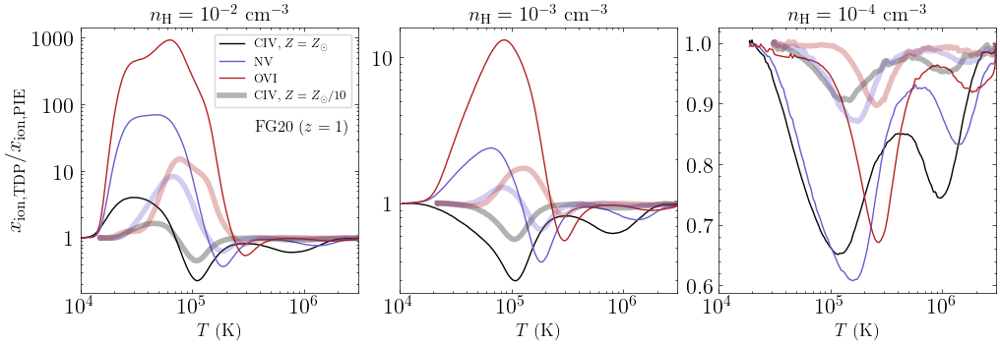

In [96]:
fig, axes = plt.subplots(1, 3, figsize=(4*3, 3.5*1), sharex=True)

# TDP vs PIE
# dens=-2
k1 = ('isochoric','fg20',1,0,-2,3e6)
k2 = ('fg20', 1, -2)

axes[0].plot(T_grid_TDP[k1], X_dict_TDP_carb[k1]['CIV']/X_dict_PIE_carb_interp[(k1,k2)]['CIV'], label=r'CIV, $Z=Z_\odot$', color='black')
axes[0].plot(T_grid_TDP[k1], X_dict_TDP_nit[k1]['NV']/X_dict_PIE_nit_interp[(k1,k2)]['NV'], label=r'NV', color='slateblue')
axes[0].plot(T_grid_TDP[k1], X_dict_TDP_oxy[k1]['OVI']/X_dict_PIE_oxy_interp[(k1,k2)]['OVI'], label=r'OVI', color='firebrick')

k1 = ('isochoric','fg20',1,-1,-2,3e6)
k2 = ('fg20', 1, -2)

axes[0].plot(T_grid_TDP[k1], X_dict_TDP_carb[k1]['CIV']/X_dict_PIE_carb_interp[(k1,k2)]['CIV'], label=r'CIV, $Z=Z_\odot/10$', color='black', lw=4, alpha=.3)
axes[0].plot(T_grid_TDP[k1], X_dict_TDP_nit[k1]['NV']/X_dict_PIE_nit_interp[(k1,k2)]['NV'], color='slateblue', lw=4, alpha=.3)
axes[0].plot(T_grid_TDP[k1], X_dict_TDP_oxy[k1]['OVI']/X_dict_PIE_oxy_interp[(k1,k2)]['OVI'], color='firebrick', lw=4, alpha=.3)

axes[0].set_ylabel(r'$x_\mathrm{ion, TDP}/x_\mathrm{ion, PIE}$')

axes[0].legend(fontsize=9)
#axes[0].text(1.2e4, 5e2, r'$n_\mathrm{H} = 10^{-2} \ \mathrm{cm}^{-3}$', fontsize=12)
axes[0].set_title(r'$n_\mathrm{H} = 10^{-2} \ \mathrm{cm}^{-3}$', fontsize=15)

axes[0].set_xlim(1e4, 3e6)
axes[0].set_xscale('log')
axes[0].set_yscale('log')

axes[0].set_yticks([1,10,100,1000],[1,10,100,1000])
axes[0].text(2.5e6, 40, r'$\mathrm{FG20} \ (z=1)$', horizontalalignment='right', fontsize=12)

# dens=-3
k1 = ('isochoric','fg20',1,0,-3,3e6)
k2 = ('fg20', 1, -3)
plot_ion_frac_ratio_select(axes[1], T_grid_TDP[k1], 
                           X_dict_PIE_carb_interp[(k1,k2)], X_dict_PIE_nit_interp[(k1,k2)], X_dict_PIE_oxy_interp[(k1,k2)],
                           X_dict_TDP_carb[k1], X_dict_TDP_nit[k1], X_dict_TDP_oxy[k1],
                           C_list_sub=['CIV'], N_list_sub=['NV'], O_list_sub=['OVI'])

k1 = ('isochoric','fg20',1,-1,-3,3e6)
k2 = ('fg20', 1, -3)
plot_ion_frac_ratio_select(axes[1], T_grid_TDP[k1], 
                           X_dict_PIE_carb_interp[(k1,k2)], X_dict_PIE_nit_interp[(k1,k2)], X_dict_PIE_oxy_interp[(k1,k2)],
                           X_dict_TDP_carb[k1], X_dict_TDP_nit[k1], X_dict_TDP_oxy[k1],
                           C_list_sub=['CIV'], N_list_sub=['NV'], O_list_sub=['OVI'], lw=4, alpha=.3)

#axes[1].text(1.2e4, 1e1, r'$n_\mathrm{H} = 10^{-3} \ \mathrm{cm}^{-3}$', fontsize=12)
axes[1].set_title(r'$n_\mathrm{H} = 10^{-3} \ \mathrm{cm}^{-3}$', fontsize=15)

axes[0].set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)
axes[1].set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)
axes[2].set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)

axes[1].set_xscale('log')
axes[1].set_yscale('log')
axes[1].set_yticks([1,10],[1,10])

# dens=-4
k1 = ('isochoric','fg20',1,0,-4,3e6)
k2 = ('fg20', 1, -4)
plot_ion_frac_ratio_select(axes[2], T_grid_TDP[k1], 
                           X_dict_PIE_carb_interp[(k1,k2)], X_dict_PIE_nit_interp[(k1,k2)], X_dict_PIE_oxy_interp[(k1,k2)],
                           X_dict_TDP_carb[k1], X_dict_TDP_nit[k1], X_dict_TDP_oxy[k1],
                           C_list_sub=['CIV'], N_list_sub=['NV'], O_list_sub=['OVI'])

k1 = ('isochoric','fg20',1,-1,-4,3e6)
k2 = ('fg20', 1, -4)
plot_ion_frac_ratio_select(axes[2], T_grid_TDP[k1], 
                           X_dict_PIE_carb_interp[(k1,k2)], X_dict_PIE_nit_interp[(k1,k2)], X_dict_PIE_oxy_interp[(k1,k2)],
                           X_dict_TDP_carb[k1], X_dict_TDP_nit[k1], X_dict_TDP_oxy[k1],
                           C_list_sub=['CIV'], N_list_sub=['NV'], O_list_sub=['OVI'], lw=4, alpha=.3)

#axes[2].text(1.2e4, 0.7, r'$n_\mathrm{H} = 10^{-4} \ \mathrm{cm}^{-3}$', fontsize=12)
axes[2].set_title(r'$n_\mathrm{H} = 10^{-4} \ \mathrm{cm}^{-3}$', fontsize=15)

axes[2].set_xscale('log')
#axes[2].set_yscale('log')

plt.subplots_adjust(wspace=0.15, hspace=0.)

#plt.savefig(rootdir+'Figures/TDP_vs_PIE_full.pdf', dpi=300)
#plt.savefig(rootdir+'Figures/TDP_vs_PIE_full.png', dpi=300)

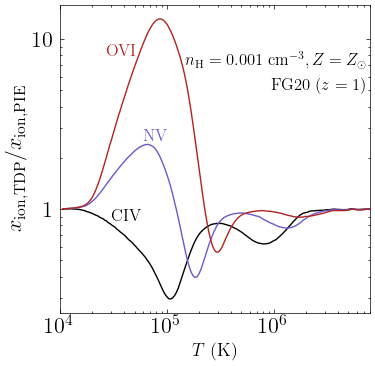

In [97]:
fig, ax = plt.subplots(1, figsize=(4, 4), sharex=True)

# dens=-3
k1 = ('isochoric','fg20',1,0,-3,1e8)
k2 = ('fg20',1,-3)
k3 = ('isochoric', 0, 1e8)

X_dict_PIE_carb_interp[(k1,k2)], X_dict_PIE_nit_interp[(k1,k2)], X_dict_PIE_oxy_interp[(k1,k2)] = interp_ion_frac(T_grid_TDP[k1],
                                                                                                   T_grid_PIE[k2], 
                                                                                                   X_dict_PIE_carb[k2], 
                                                                                                   X_dict_PIE_nit[k2], 
                                                                                                   X_dict_PIE_oxy[k2])


# dens=-3
k1 = ('isochoric','fg20',1,0,-3,1e8)
k2 = ('fg20',1,-3)


ax.plot(T_grid_TDP[k1], X_dict_TDP_carb[k1]['CIV']/X_dict_PIE_carb_interp[(k1,k2)]['CIV'], 
             color='black', linestyle='-', label='CIV')

ax.text(3e4, .85, 'CIV', color='black', fontsize=12)

ax.plot(T_grid_TDP[k1], X_dict_TDP_nit[k1]['NV']/X_dict_PIE_nit_interp[(k1,k2)]['NV'], 
             color='slateblue', linestyle='-', label='NV')

ax.text(6e4, 2.5, 'NV', color='slateblue', fontsize=12)

ax.plot(T_grid_TDP[k1], X_dict_TDP_oxy[k1]['OVI']/X_dict_PIE_oxy_interp[(k1,k2)]['OVI'], 
             color='firebrick', linestyle='-', label='OVI')

ax.text(2.7e4, 8, 'OVI', color='firebrick', fontsize=12)

ax.set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)
ax.set_ylabel(r'$x_\mathrm{ion, TDP}/x_\mathrm{ion, PIE}$')

ax.set_xscale('log')
ax.set_yscale('log')
ax.set_yticks([1,10],[1,10])

ax.set_xlim(1e4,8e6)
ax.text(7.4e6,7,r'$n_\mathrm{H} = 0.001 \ \mathrm{cm}^{-3}, Z=Z_\odot$', horizontalalignment='right', fontsize=12)
ax.text(7.4e6,5,r'FG20 ($z=1$)', horizontalalignment='right', fontsize=12)

plt.savefig(rootdir+'Figures/TDP_vs_PIE_FG20.pdf', dpi=300)
plt.savefig(rootdir+'Figures/TDP_vs_PIE_FG20.png', dpi=300)

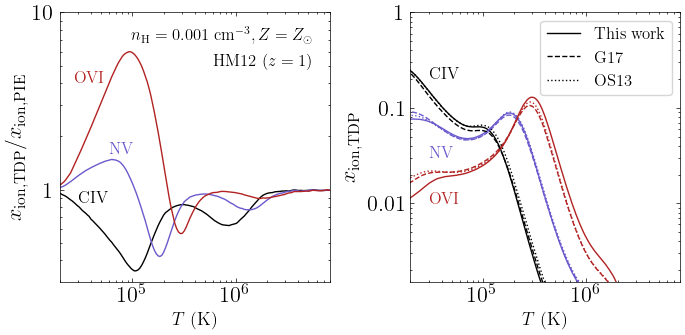

In [98]:
fig, axes = plt.subplots(1, 2, figsize=(4*2, 3.5*1), sharex=True)

# dens=-3
k1 = ('isochoric','hm12',1,0,-3,1e8)
k2 = ('hm12',1,-3)
k3 = ('isochoric', 0, 1e8)

X_dict_PIE_carb_interp[(k1,k2)], X_dict_PIE_nit_interp[(k1,k2)], X_dict_PIE_oxy_interp[(k1,k2)] = interp_ion_frac(T_grid_TDP[k1],
                                                                                                   T_grid_PIE[k2], 
                                                                                                   X_dict_PIE_carb[k2], 
                                                                                                   X_dict_PIE_nit[k2], 
                                                                                                   X_dict_PIE_oxy[k2])


# dens=-3
k1 = ('isochoric','hm12',1,0,-3,1e8)
k2 = ('hm12',1,-3)


axes[0].plot(T_grid_TDP[k1], X_dict_TDP_carb[k1]['CIV']/X_dict_PIE_carb_interp[(k1,k2)]['CIV'], 
             color='black', linestyle='-', label='CIV')

axes[0].text(3e4, .85, 'CIV', color='black', fontsize=12)

axes[0].plot(T_grid_TDP[k1], X_dict_TDP_nit[k1]['NV']/X_dict_PIE_nit_interp[(k1,k2)]['NV'], 
             color='slateblue', linestyle='-', label='NV')

axes[0].text(6e4, 1.6, 'NV', color='slateblue', fontsize=12)

axes[0].plot(T_grid_TDP[k1], X_dict_TDP_oxy[k1]['OVI']/X_dict_PIE_oxy_interp[(k1,k2)]['OVI'], 
             color='firebrick', linestyle='-', label='OVI')

axes[0].text(2.7e4, 4, 'OVI', color='firebrick', fontsize=12)

#axes[0].legend(loc='lower right')

#plot_ion_frac_ratio_select(axes[0], T_grid_TDP[k1], 
#                           X_dict_PIE_carb_interp[(k1,k2)], X_dict_PIE_nit_interp[(k1,k2)], X_dict_PIE_oxy_interp[(k1,k2)],
#                           X_dict_TDP_carb[k1], X_dict_TDP_nit[k1], X_dict_TDP_oxy[k1],
#                           C_list_sub=['CIV'], N_list_sub=['NV'], O_list_sub=['OVI'])


axes[0].set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)
axes[0].set_ylabel(r'$x_\mathrm{ion, TDP}/x_\mathrm{ion, PIE}$')

axes[0].set_xscale('log')
axes[0].set_yscale('log')
axes[0].set_yticks([1,10],[1,10])

ax.set_xlabel(r'$T \ \mathrm{(K)}$')
ax.set_ylabel(r'$x_\mathrm{ion, TDP}$')


axes[0].text(5.5e6,7,r'$n_\mathrm{H} = 0.001 \ \mathrm{cm}^{-3}, Z=Z_\odot$', horizontalalignment='right', fontsize=12)
axes[0].text(5.5e6,5,r'HM12 ($z=1$)', horizontalalignment='right', fontsize=12)

k = ('isochoric','hm12',1,0,-3,1e8)
axes[1].plot(T_grid_TDP[k],  X_dict_TDP_carb[k]['CIV'], linestyle='-', color='black', label='This work')
axes[1].text(3e4, 0.2, 'CIV', color='black', fontsize=12)

axes[1].plot(T_grid_TDP[k],  X_dict_TDP_nit[k]['NV'], linestyle='-', color='slateblue')
axes[1].text(3e4, .03, 'NV', color='slateblue', fontsize=12)

axes[1].plot(T_grid_TDP[k],  X_dict_TDP_oxy[k]['OVI'], linestyle='-', color='firebrick')
axes[1].text(3e4, .01, 'OVI', color='firebrick', fontsize=12)


k = -3
axes[1].plot(T_grid_TDP_g17[k],  X_dict_TDP_carb_g17[k]['CIV'], linestyle='--', color='black', label='G17')
axes[1].plot(T_grid_TDP_g17[k],  X_dict_TDP_nit_g17[k]['NV'], linestyle='--', color='slateblue')
axes[1].plot(T_grid_TDP_g17[k],  X_dict_TDP_oxy_g17[k]['OVI'], linestyle='--', color='firebrick')

axes[1].plot(T_grid_TDP_os13,  X_grid_TDP_civ_os13, linestyle=':', color='black', label='OS13')
axes[1].plot(T_grid_TDP_os13,  X_grid_TDP_nv_os13, linestyle=':', color='slateblue')
axes[1].plot(T_grid_TDP_os13,  X_grid_TDP_ovi_os13, linestyle=':', color='firebrick')

axes[1].legend(loc='upper right')

axes[1].set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)
axes[1].set_ylabel(r'$x_\mathrm{ion,TDP}$')

axes[1].set_xscale('log')
axes[1].set_yscale('log')

axes[1].set_ylim(1.5e-3, 1)
axes[1].set_xlim(2e4,8e6)

axes[1].set_yticks([1e-2,1e-1,1],['0.01', '0.1', '1'])

plt.subplots_adjust(wspace=0.3, hspace=0)

plt.savefig(rootdir+'Figures/TDP_vs_PIE_HM12.pdf', dpi=300)
plt.savefig(rootdir+'Figures/TDP_vs_PIE_HM12.png', dpi=300)

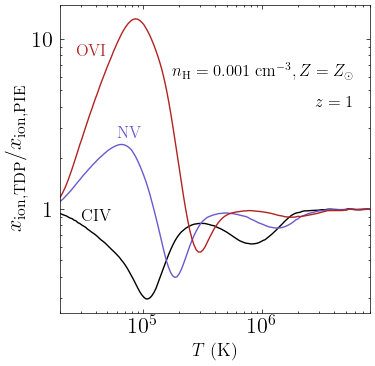

In [117]:
fig, ax = plt.subplots(1, figsize=(4, 4), sharex=True)

# dens=-3
k1 = ('isochoric','fg20',1,0,-3,1e8)
k2 = ('fg20',1,-3)
k3 = ('isochoric', 0, 1e8)

X_dict_PIE_carb_interp[(k1,k2)], X_dict_PIE_nit_interp[(k1,k2)], X_dict_PIE_oxy_interp[(k1,k2)] = interp_ion_frac(T_grid_TDP[k1],
                                                                                                   T_grid_PIE[k2], 
                                                                                                   X_dict_PIE_carb[k2], 
                                                                                                   X_dict_PIE_nit[k2], 
                                                                                                   X_dict_PIE_oxy[k2])


# dens=-3
k1 = ('isochoric','fg20',1,0,-3,1e8)
k2 = ('fg20',1,-3)


ax.plot(T_grid_TDP[k1], X_dict_TDP_carb[k1]['CIV']/X_dict_PIE_carb_interp[(k1,k2)]['CIV'], 
             color='black', linestyle='-', label='CIV')

ax.text(3e4, .85, 'CIV', color='black', fontsize=12)

ax.plot(T_grid_TDP[k1], X_dict_TDP_nit[k1]['NV']/X_dict_PIE_nit_interp[(k1,k2)]['NV'], 
             color='slateblue', linestyle='-', label='NV')

ax.text(6e4, 2.6, 'NV', color='slateblue', fontsize=12)

ax.plot(T_grid_TDP[k1], X_dict_TDP_oxy[k1]['OVI']/X_dict_PIE_oxy_interp[(k1,k2)]['OVI'], 
             color='firebrick', linestyle='-', label='OVI')

ax.text(2.7e4, 8, 'OVI', color='firebrick', fontsize=12)

ax.set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)
ax.set_ylabel(r'$x_\mathrm{ion, TDP}/x_\mathrm{ion, PIE}$')

ax.set_xscale('log')
ax.set_yscale('log')
ax.set_yticks([1,10],[1,10])

ax.text(5.8e6,6,r'$n_\mathrm{H} = 0.001 \ \mathrm{cm}^{-3}, Z=Z_\odot$', horizontalalignment='right', fontsize=12)
ax.text(5.8e6,4,r'$z=1$', horizontalalignment='right', fontsize=12)

ax.set_xlim(2e4,8e6)
#ax.set_title('Ionization state of rapidly cooling gas', fontsize=14)

plt.savefig(rootdir+'Figures/TDP_vs_PIE_FG20_v2.pdf', dpi=300)
plt.savefig(rootdir+'Figures/TDP_vs_PIE_FG20_v2.png', dpi=300)

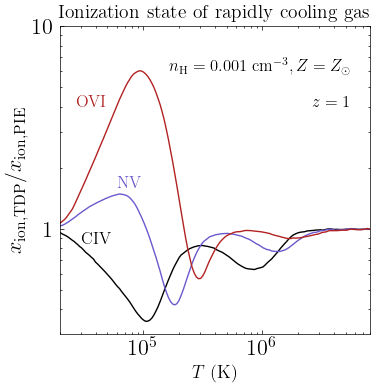

In [122]:
fig, ax = plt.subplots(1, figsize=(4, 4), sharex=True)

# dens=-3
k1 = ('isochoric','hm12',1,0,-3,1e8)
k2 = ('hm12',1,-3)
k3 = ('isochoric', 0, 1e8)

X_dict_PIE_carb_interp[(k1,k2)], X_dict_PIE_nit_interp[(k1,k2)], X_dict_PIE_oxy_interp[(k1,k2)] = interp_ion_frac(T_grid_TDP[k1],
                                                                                                   T_grid_PIE[k2], 
                                                                                                   X_dict_PIE_carb[k2], 
                                                                                                   X_dict_PIE_nit[k2], 
                                                                                                   X_dict_PIE_oxy[k2])


# dens=-3
k1 = ('isochoric','hm12',1,0,-3,1e8)
k2 = ('hm12',1,-3)


ax.plot(T_grid_TDP[k1], X_dict_TDP_carb[k1]['CIV']/X_dict_PIE_carb_interp[(k1,k2)]['CIV'], 
             color='black', linestyle='-', label='CIV')

ax.text(3e4, .85, 'CIV', color='black', fontsize=12)

ax.plot(T_grid_TDP[k1], X_dict_TDP_nit[k1]['NV']/X_dict_PIE_nit_interp[(k1,k2)]['NV'], 
             color='slateblue', linestyle='-', label='NV')

ax.text(6e4, 1.6, 'NV', color='slateblue', fontsize=12)

ax.plot(T_grid_TDP[k1], X_dict_TDP_oxy[k1]['OVI']/X_dict_PIE_oxy_interp[(k1,k2)]['OVI'], 
             color='firebrick', linestyle='-', label='OVI')

ax.text(2.7e4, 4, 'OVI', color='firebrick', fontsize=12)

ax.set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)
ax.set_ylabel(r'$x_\mathrm{ion, TDP}/x_\mathrm{ion, PIE}$')

ax.set_xscale('log')
ax.set_yscale('log')
ax.set_yticks([1,10],[1,10])

ax.text(5.5e6,6,r'$n_\mathrm{H} = 0.001 \ \mathrm{cm}^{-3}, Z=Z_\odot$', horizontalalignment='right', fontsize=12)
ax.text(5.5e6,4,r'$z=1$', horizontalalignment='right', fontsize=12)

ax.set_xlim(2e4,8e6)
ax.set_title('Ionization state of rapidly cooling gas', fontsize=14)

plt.savefig(rootdir+'Figures/TDP_vs_PIE_HM12_v2.pdf', dpi=300)
plt.savefig(rootdir+'Figures/TDP_vs_PIE_HM12_v2.png', dpi=300)

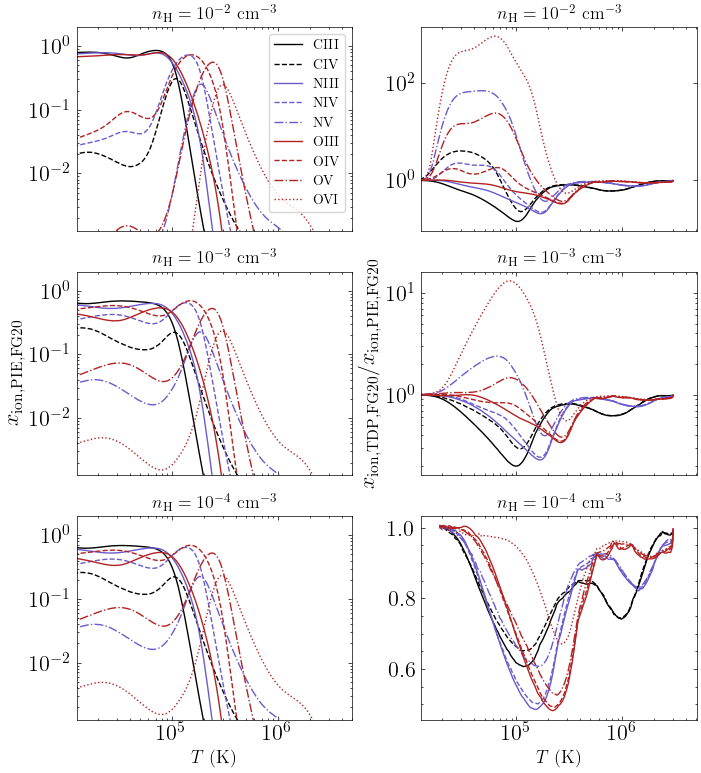

In [98]:
fig, axes = plt.subplots(3, 2, figsize=(4*2, 3*3), sharex=True)

# PIE

k = ('fg20',1,-2)
plot_ion_frac_select(axes[0,0], T_grid_PIE[k], X_dict_PIE_carb[k], X_dict_PIE_nit[k], X_dict_PIE_oxy[k])
axes[0,0].set_title(r'$n_\mathrm{H} = 10^{-2} \ \mathrm{cm}^{-3}$', fontsize=13)

axes[0,0].legend(fontsize=10)
axes[0,0].set_xscale('log')
axes[0,0].set_yscale('log')

axes[0,0].set_xlim(10**4.1,10**6.7)
axes[0,0].set_ylim(10**-2.9, 10**0.3)

k = ('fg20',1,-3)
plot_ion_frac_select(axes[1,0], T_grid_PIE[k], X_dict_PIE_carb[k], X_dict_PIE_nit[k], X_dict_PIE_oxy[k])
axes[1,0].set_title(r'$n_\mathrm{H} = 10^{-3} \ \mathrm{cm}^{-3}$', fontsize=13)
axes[1,0].set_ylabel(r'$x_\mathrm{ion, PIE, FG20}$')
axes[1,0].set_xlim(10**4.1,10**6.7)
axes[1,0].set_ylim(10**-2.9, 10**0.3)
axes[1,0].set_xscale('log')
axes[1,0].set_yscale('log')

k = ('fg20',1,-3)
plot_ion_frac_select(axes[2,0], T_grid_PIE[k], X_dict_PIE_carb[k], X_dict_PIE_nit[k], X_dict_PIE_oxy[k])
axes[2,0].set_title(r'$n_\mathrm{H} = 10^{-4} \ \mathrm{cm}^{-3}$', fontsize=13)
axes[2,0].set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)
axes[2,0].set_xlim(10**4.1,10**6.7)
axes[2,0].set_ylim(10**-2.9, 10**0.3)
axes[2,0].set_xscale('log')
axes[2,0].set_yscale('log')

# TDP vs PIE
k1 = ('isochoric','fg20',1,0,-2,3e6)
k2 = ('fg20', 1, -2)
plot_ion_frac_ratio_select(axes[0,1], T_grid_TDP[k1], 
                           X_dict_PIE_carb_interp[(k1,k2)], X_dict_PIE_nit_interp[(k1,k2)], X_dict_PIE_oxy_interp[(k1,k2)],
                           X_dict_TDP_carb[k1], X_dict_TDP_nit[k1], X_dict_TDP_oxy[k1])

axes[0,1].set_title(r'$n_\mathrm{H} = 10^{-2} \ \mathrm{cm}^{-3}$', fontsize=13)


axes[0,1].set_xscale('log')
axes[0,1].set_yscale('log')

k1 = ('isochoric','fg20',1,0,-3,3e6)
k2 = ('fg20', 1, -3)
plot_ion_frac_ratio_select(axes[1,1], T_grid_TDP[k1], 
                           X_dict_PIE_carb_interp[(k1,k2)], X_dict_PIE_nit_interp[(k1,k2)], X_dict_PIE_oxy_interp[(k1,k2)],
                           X_dict_TDP_carb[k1], X_dict_TDP_nit[k1], X_dict_TDP_oxy[k1])

axes[1,1].set_yscale('log')
axes[1,1].set_title(r'$n_\mathrm{H} = 10^{-3} \ \mathrm{cm}^{-3}$', fontsize=13)
axes[1,1].set_ylabel(r'$x_\mathrm{ion, TDP, FG20}/x_\mathrm{ion, PIE, FG20}$')

k1 = ('isochoric','fg20',1,0,-4,3e6)
k2 = ('fg20', 1, -4)
plot_ion_frac_ratio_select(axes[2,1], T_grid_TDP[k1], 
                           X_dict_PIE_carb_interp[(k1,k2)], X_dict_PIE_nit_interp[(k1,k2)], X_dict_PIE_oxy_interp[(k1,k2)],
                           X_dict_TDP_carb[k1], X_dict_TDP_nit[k1], X_dict_TDP_oxy[k1])

axes[2,1].set_title(r'$n_\mathrm{H} = 10^{-4} \ \mathrm{cm}^{-3}$', fontsize=13)
axes[2,1].set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)


plt.subplots_adjust(wspace=0.25, hspace=0.2)

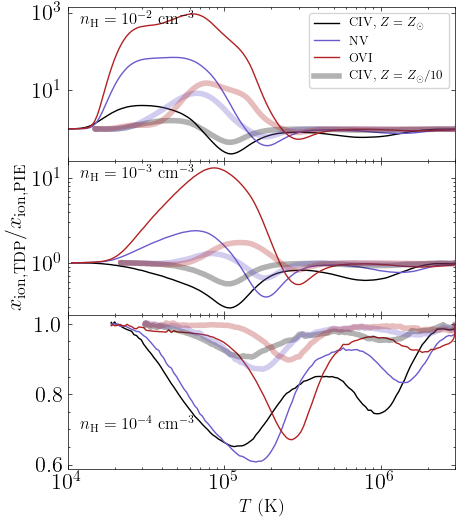

In [99]:
fig, axes = plt.subplots(3, 1, figsize=(5, 2*3), sharex=True)

# TDP vs PIE
# dens=-2
k1 = ('isochoric','fg20',1,0,-2,3e6)
k2 = ('fg20', 1, -2)

axes[0].plot(T_grid_TDP[k1], X_dict_TDP_carb[k1]['CIV']/X_dict_PIE_carb_interp[(k1,k2)]['CIV'], label=r'CIV, $Z=Z_\odot$', color='black')
axes[0].plot(T_grid_TDP[k1], X_dict_TDP_nit[k1]['NV']/X_dict_PIE_nit_interp[(k1,k2)]['NV'], label=r'NV', color='slateblue')
axes[0].plot(T_grid_TDP[k1], X_dict_TDP_oxy[k1]['OVI']/X_dict_PIE_oxy_interp[(k1,k2)]['OVI'], label=r'OVI', color='firebrick')

k1 = ('isochoric','fg20',1,-1,-2,3e6)
k2 = ('fg20', 1, -2)

axes[0].plot(T_grid_TDP[k1], X_dict_TDP_carb[k1]['CIV']/X_dict_PIE_carb_interp[(k1,k2)]['CIV'], label=r'CIV, $Z=Z_\odot/10$', color='black', lw=4, alpha=.3)
axes[0].plot(T_grid_TDP[k1], X_dict_TDP_nit[k1]['NV']/X_dict_PIE_nit_interp[(k1,k2)]['NV'], color='slateblue', lw=4, alpha=.3)
axes[0].plot(T_grid_TDP[k1], X_dict_TDP_oxy[k1]['OVI']/X_dict_PIE_oxy_interp[(k1,k2)]['OVI'], color='firebrick', lw=4, alpha=.3)

axes[0].legend(fontsize=9)
axes[0].text(1.2e4, 5e2, r'$n_\mathrm{H} = 10^{-2} \ \mathrm{cm}^{-3}$', fontsize=12)
axes[0].set_xlim(1e4, 3e6)
axes[0].set_xscale('log')
axes[0].set_yscale('log')

# dens=-3
k1 = ('isochoric','fg20',1,0,-3,3e6)
k2 = ('fg20', 1, -3)
plot_ion_frac_ratio_select(axes[1], T_grid_TDP[k1], 
                           X_dict_PIE_carb_interp[(k1,k2)], X_dict_PIE_nit_interp[(k1,k2)], X_dict_PIE_oxy_interp[(k1,k2)],
                           X_dict_TDP_carb[k1], X_dict_TDP_nit[k1], X_dict_TDP_oxy[k1],
                           C_list_sub=['CIV'], N_list_sub=['NV'], O_list_sub=['OVI'])

k1 = ('isochoric','fg20',1,-1,-3,3e6)
k2 = ('fg20', 1, -3)
plot_ion_frac_ratio_select(axes[1], T_grid_TDP[k1], 
                           X_dict_PIE_carb_interp[(k1,k2)], X_dict_PIE_nit_interp[(k1,k2)], X_dict_PIE_oxy_interp[(k1,k2)],
                           X_dict_TDP_carb[k1], X_dict_TDP_nit[k1], X_dict_TDP_oxy[k1],
                           C_list_sub=['CIV'], N_list_sub=['NV'], O_list_sub=['OVI'], lw=4, alpha=.3)

axes[1].text(1.2e4, 1e1, r'$n_\mathrm{H} = 10^{-3} \ \mathrm{cm}^{-3}$', fontsize=12)
axes[1].set_ylabel(r'$x_\mathrm{ion, TDP}/x_\mathrm{ion, PIE}$')

axes[1].set_xscale('log')
axes[1].set_yscale('log')

# dens=-4
k1 = ('isochoric','fg20',1,0,-4,3e6)
k2 = ('fg20', 1, -4)
plot_ion_frac_ratio_select(axes[2], T_grid_TDP[k1], 
                           X_dict_PIE_carb_interp[(k1,k2)], X_dict_PIE_nit_interp[(k1,k2)], X_dict_PIE_oxy_interp[(k1,k2)],
                           X_dict_TDP_carb[k1], X_dict_TDP_nit[k1], X_dict_TDP_oxy[k1],
                           C_list_sub=['CIV'], N_list_sub=['NV'], O_list_sub=['OVI'])

k1 = ('isochoric','fg20',1,-1,-4,3e6)
k2 = ('fg20', 1, -4)
plot_ion_frac_ratio_select(axes[2], T_grid_TDP[k1], 
                           X_dict_PIE_carb_interp[(k1,k2)], X_dict_PIE_nit_interp[(k1,k2)], X_dict_PIE_oxy_interp[(k1,k2)],
                           X_dict_TDP_carb[k1], X_dict_TDP_nit[k1], X_dict_TDP_oxy[k1],
                           C_list_sub=['CIV'], N_list_sub=['NV'], O_list_sub=['OVI'], lw=4, alpha=.3)

axes[2].text(1.2e4, 0.7, r'$n_\mathrm{H} = 10^{-4} \ \mathrm{cm}^{-3}$', fontsize=12)

axes[2].set_xscale('log')
#axes[2].set_yscale('log')
axes[2].set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)

plt.subplots_adjust(wspace=0.25, hspace=0.)

#plt.savefig(rootdir+'Figures/TDP_vs_PIE_full.pdf', dpi=300)
#plt.savefig(rootdir+'Figures/TDP_vs_PIE_full.png', dpi=300)

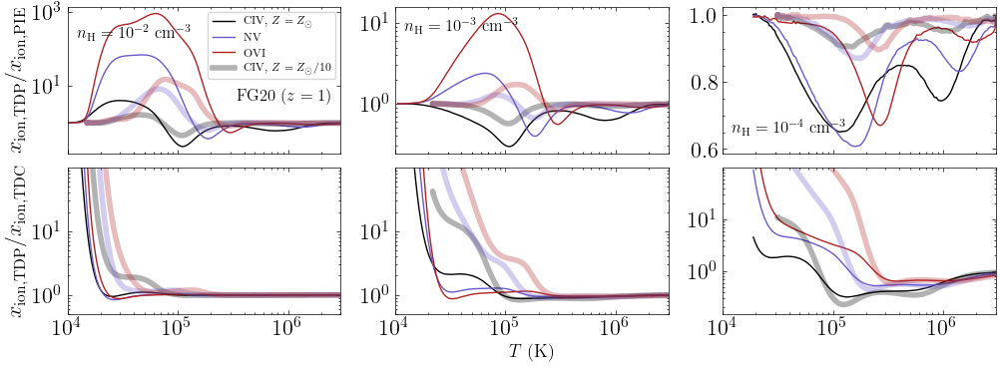

In [100]:
fig, axes = plt.subplots(2, 3, figsize=(4*3, 2*2), sharex=True)


# TDP vs PIE
# dens=-2
k1 = ('isochoric','fg20',1,0,-2,3e6)
k2 = ('fg20', 1, -2)

axes[0,0].plot(T_grid_TDP[k1], X_dict_TDP_carb[k1]['CIV']/X_dict_PIE_carb_interp[(k1,k2)]['CIV'], label=r'CIV, $Z=Z_\odot$', color='black')
axes[0,0].plot(T_grid_TDP[k1], X_dict_TDP_nit[k1]['NV']/X_dict_PIE_nit_interp[(k1,k2)]['NV'], label=r'NV', color='slateblue')
axes[0,0].plot(T_grid_TDP[k1], X_dict_TDP_oxy[k1]['OVI']/X_dict_PIE_oxy_interp[(k1,k2)]['OVI'], label=r'OVI', color='firebrick')

k1 = ('isochoric','fg20',1,-1,-2,3e6)
k2 = ('fg20', 1, -2)

axes[0,0].plot(T_grid_TDP[k1], X_dict_TDP_carb[k1]['CIV']/X_dict_PIE_carb_interp[(k1,k2)]['CIV'], label=r'CIV, $Z=Z_\odot/10$', color='black', lw=4, alpha=.3)
axes[0,0].plot(T_grid_TDP[k1], X_dict_TDP_nit[k1]['NV']/X_dict_PIE_nit_interp[(k1,k2)]['NV'], color='slateblue', lw=4, alpha=.3)
axes[0,0].plot(T_grid_TDP[k1], X_dict_TDP_oxy[k1]['OVI']/X_dict_PIE_oxy_interp[(k1,k2)]['OVI'], color='firebrick', lw=4, alpha=.3)

axes[0,0].set_ylabel(r'$x_\mathrm{ion, TDP}/x_\mathrm{ion, PIE}$')

axes[0,0].legend(fontsize=8)
axes[0,0].text(1.2e4, 2e2, r'$n_\mathrm{H} = 10^{-2} \ \mathrm{cm}^{-3}$', fontsize=12)
axes[0,0].text(2.5e6, 4, r'FG20 ($z=1$)', horizontalalignment='right', fontsize=12)
axes[1,0].set_xlim(1e4, 3e6)
axes[0,0].set_xscale('log')
axes[0,0].set_yscale('log')

# dens=-3
k1 = ('isochoric','fg20',1,0,-3,3e6)
k2 = ('fg20', 1, -3)
plot_ion_frac_ratio_select(axes[0,1], T_grid_TDP[k1], 
                           X_dict_PIE_carb_interp[(k1,k2)], X_dict_PIE_nit_interp[(k1,k2)], X_dict_PIE_oxy_interp[(k1,k2)],
                           X_dict_TDP_carb[k1], X_dict_TDP_nit[k1], X_dict_TDP_oxy[k1],
                           C_list_sub=['CIV'], N_list_sub=['NV'], O_list_sub=['OVI'])

k1 = ('isochoric','fg20',1,-1,-3,3e6)
k2 = ('fg20', 1, -3)
plot_ion_frac_ratio_select(axes[0,1], T_grid_TDP[k1], 
                           X_dict_PIE_carb_interp[(k1,k2)], X_dict_PIE_nit_interp[(k1,k2)], X_dict_PIE_oxy_interp[(k1,k2)],
                           X_dict_TDP_carb[k1], X_dict_TDP_nit[k1], X_dict_TDP_oxy[k1],
                           C_list_sub=['CIV'], N_list_sub=['NV'], O_list_sub=['OVI'], lw=4, alpha=.3)

axes[0,1].text(1.2e4, 8, r'$n_\mathrm{H} = 10^{-3} \ \mathrm{cm}^{-3}$', fontsize=12)

axes[0,1].set_xscale('log')
axes[0,1].set_yscale('log')

# dens=-4
k1 = ('isochoric','fg20',1,0,-4,3e6)
k2 = ('fg20', 1, -4)
plot_ion_frac_ratio_select(axes[0,2], T_grid_TDP[k1], 
                           X_dict_PIE_carb_interp[(k1,k2)], X_dict_PIE_nit_interp[(k1,k2)], X_dict_PIE_oxy_interp[(k1,k2)],
                           X_dict_TDP_carb[k1], X_dict_TDP_nit[k1], X_dict_TDP_oxy[k1],
                           C_list_sub=['CIV'], N_list_sub=['NV'], O_list_sub=['OVI'])

k1 = ('isochoric','fg20',1,-1,-4,3e6)
k2 = ('fg20', 1, -4)
plot_ion_frac_ratio_select(axes[0,2], T_grid_TDP[k1], 
                           X_dict_PIE_carb_interp[(k1,k2)], X_dict_PIE_nit_interp[(k1,k2)], X_dict_PIE_oxy_interp[(k1,k2)],
                           X_dict_TDP_carb[k1], X_dict_TDP_nit[k1], X_dict_TDP_oxy[k1],
                           C_list_sub=['CIV'], N_list_sub=['NV'], O_list_sub=['OVI'], lw=4, alpha=.3)

axes[0,2].text(1.2e4, 0.65, r'$n_\mathrm{H} = 10^{-4} \ \mathrm{cm}^{-3}$', fontsize=12)

axes[0,2].set_xscale('log')
#axes[2].set_yscale('log')

# TDP vs. TDC

# dens=-2
k1 = ('isochoric','fg20',1,0,-2,3e6)
k3 = ('isochoric',0,3e6)
plot_ion_frac_ratio_select(axes[1,0], T_grid_TDP[k1], 
                           X_dict_TDC_carb_interp[(k1,k3)], X_dict_TDC_nit_interp[(k1,k3)], X_dict_TDC_oxy_interp[(k1,k3)],
                           X_dict_TDP_carb[k1], X_dict_TDP_nit[k1], X_dict_TDP_oxy[k1],
                           C_list_sub=['CIV'], N_list_sub=['NV'], O_list_sub=['OVI'])

k1 = ('isochoric','fg20',1,-1,-2,3e6)
k3 = ('isochoric',-1,3e6)
plot_ion_frac_ratio_select(axes[1,0], T_grid_TDP[k1], 
                           X_dict_TDC_carb_interp[(k1,k3)], X_dict_TDC_nit_interp[(k1,k3)], X_dict_TDC_oxy_interp[(k1,k3)],
                           X_dict_TDP_carb[k1], X_dict_TDP_nit[k1], X_dict_TDP_oxy[k1],
                           C_list_sub=['CIV'], N_list_sub=['NV'], O_list_sub=['OVI'],lw=4,alpha=.3)

axes[1,0].set_ylabel(r'$x_\mathrm{ion, TDP}/x_\mathrm{ion, TDC}$')

axes[1,0].set_xscale('log')
axes[1,0].set_yscale('log')
axes[1,0].set_ylim(.5,99)

# dens=-3

k1 = ('isochoric','fg20',1,0,-3,3e6)
k3 = ('isochoric',0,3e6)
plot_ion_frac_ratio_select(axes[1,1], T_grid_TDP[k1], 
                           X_dict_TDC_carb_interp[(k1,k3)], X_dict_TDC_nit_interp[(k1,k3)], X_dict_TDC_oxy_interp[(k1,k3)],
                           X_dict_TDP_carb[k1], X_dict_TDP_nit[k1], X_dict_TDP_oxy[k1],
                           C_list_sub=['CIV'], N_list_sub=['NV'], O_list_sub=['OVI'])

k1 = ('isochoric','fg20',1,-1,-3,3e6)
k3 = ('isochoric',-1,3e6)
plot_ion_frac_ratio_select(axes[1,1], T_grid_TDP[k1], 
                           X_dict_TDC_carb_interp[(k1,k3)], X_dict_TDC_nit_interp[(k1,k3)], X_dict_TDC_oxy_interp[(k1,k3)],
                           X_dict_TDP_carb[k1], X_dict_TDP_nit[k1], X_dict_TDP_oxy[k1],
                           C_list_sub=['CIV'], N_list_sub=['NV'], O_list_sub=['OVI'],lw=4,alpha=.3)

axes[1,1].set_xscale('log')
axes[1,1].set_yscale('log')
axes[1,1].set_ylim(.5,99)
axes[1,1].set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)

# dens=-4

k1 = ('isochoric','fg20',1,0,-4,3e6)
k3 = ('isochoric',0,3e6)
plot_ion_frac_ratio_select(axes[1,2], T_grid_TDP[k1], 
                           X_dict_TDC_carb_interp[(k1,k3)], X_dict_TDC_nit_interp[(k1,k3)], X_dict_TDC_oxy_interp[(k1,k3)],
                           X_dict_TDP_carb[k1], X_dict_TDP_nit[k1], X_dict_TDP_oxy[k1],
                           C_list_sub=['CIV'], N_list_sub=['NV'], O_list_sub=['OVI'])

k1 = ('isochoric','fg20',1,-1,-4,3e6)
k3 = ('isochoric',-1,3e6)
plot_ion_frac_ratio_select(axes[1,2], T_grid_TDP[k1], 
                           X_dict_TDC_carb_interp[(k1,k3)], X_dict_TDC_nit_interp[(k1,k3)], X_dict_TDC_oxy_interp[(k1,k3)],
                           X_dict_TDP_carb[k1], X_dict_TDP_nit[k1], X_dict_TDP_oxy[k1],
                           C_list_sub=['CIV'], N_list_sub=['NV'], O_list_sub=['OVI'],lw=4,alpha=.3)

axes[1,2].set_xscale('log')
axes[1,2].set_yscale('log')
axes[1,2].set_ylim(1.5e-1,99)

plt.subplots_adjust(wspace=0.2, hspace=0.1)

plt.savefig(rootdir+'Figures/TDP_vs_PIE_vs_TDC_full.pdf', dpi=300)
plt.savefig(rootdir+'Figures/TDP_vs_PIE_vs_TDC_full.png', dpi=300)

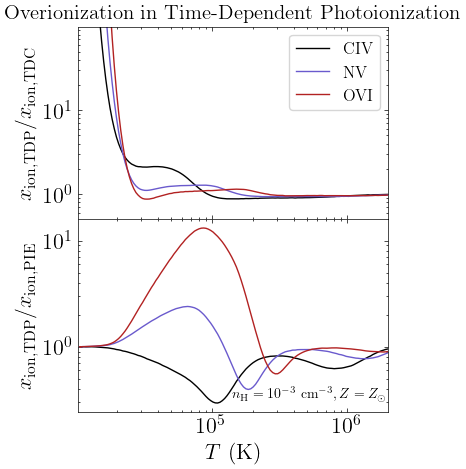

In [101]:
fig, axes = plt.subplots(2, 1, figsize=(4,5), sharex=True)


k1 = ('isochoric','fg20',1,0,-3,3e6)
k3 = ('isochoric',0,3e6)

plot_ion_frac_ratio_select(axes[0], T_grid_TDP[k1], 
                           X_dict_TDC_carb_interp[(k1,k3)], X_dict_TDC_nit_interp[(k1,k3)], X_dict_TDC_oxy_interp[(k1,k3)],
                           X_dict_TDP_carb[k1], X_dict_TDP_nit[k1], X_dict_TDP_oxy[k1],
                           C_list_sub=['CIV'], N_list_sub=['NV'], O_list_sub=['OVI'])

axes[0].set_xlim(10**4.01,10**6.3)
axes[0].set_ylim(.5,99)
axes[0].set_xscale('log')
axes[0].set_yscale('log')

axes[0].legend()
axes[0].set_ylabel(r'$x_\mathrm{ion, TDP}/x_\mathrm{ion, TDC}$')
axes[0].set_title('Overionization in Time-Dependent Photoionization', fontsize=15)

k1 = ('isochoric','fg20',1,0,-3,3e6)
k2 = ('fg20',1,-3)

plot_ion_frac_ratio_select(axes[1], T_grid_TDP[k1], 
                           X_dict_PIE_carb_interp[(k1,k2)], X_dict_PIE_nit_interp[(k1,k2)], X_dict_PIE_oxy_interp[(k1,k2)],
                           X_dict_TDP_carb[k1], X_dict_TDP_nit[k1], X_dict_TDP_oxy[k1],
                           C_list_sub=['CIV'], N_list_sub=['NV'], O_list_sub=['OVI'])

axes[1].text(1.4e5, 3.3e-1, r'$n_\mathrm{H} = 10^{-3} \ \mathrm{cm}^{-3}, Z=Z_\odot$', fontsize=10)

axes[1].set_yscale('log')
axes[1].set_xlabel(r'$T \ (\mathrm{K})$')
axes[1].set_ylabel(r'$x_\mathrm{ion, TDP}/x_\mathrm{ion, PIE}$')

plt.subplots_adjust(wspace=0.3, hspace=0.)

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])

plt.savefig(rootdir+'Figures/TDP_TDC_PIE.png', dpi=300)
plt.savefig(rootdir+'Figures/TDP_TDC_PIE.pdf', dpi=300)
#ax_label.set_xlabel(r'$T \ (\mathrm{K})$', labelpad=25)
#ax_label.set_ylabel(r'$x_\mathrm{ion}$', labelpad=45)

Text(0, 0.5, '$x_\\mathrm{ion, TDP}/x_\\mathrm{ion, PIE}$')

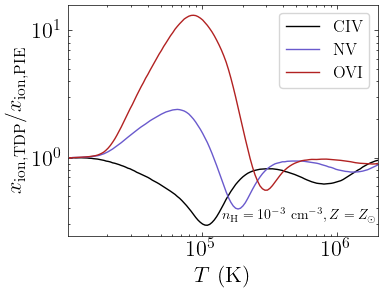

In [102]:
fig, ax = plt.subplots(1, figsize=(4,3), sharex=True)


k1 = ('isochoric','fg20',1,0,-3,3e6)
k2 = ('fg20',1,-3)

plot_ion_frac_ratio_select(ax, T_grid_TDP[k1], 
                           X_dict_PIE_carb_interp[(k1,k2)], X_dict_PIE_nit_interp[(k1,k2)], X_dict_PIE_oxy_interp[(k1,k2)],
                           X_dict_TDP_carb[k1], X_dict_TDP_nit[k1], X_dict_TDP_oxy[k1],
                           C_list_sub=['CIV'], N_list_sub=['NV'], O_list_sub=['OVI'])

ax.text(1.4e5, 3.3e-1, r'$n_\mathrm{H} = 10^{-3} \ \mathrm{cm}^{-3}, Z=Z_\odot$', fontsize=10)

ax.set_xlim(10**4.01,10**6.3)
#ax.set_ylim(3e-1,99)
ax.set_xscale('log')
ax.set_yscale('log')

ax.legend()
ax.set_xlabel(r'$T \ (\mathrm{K})$')
ax.set_ylabel(r'$x_\mathrm{ion, TDP}/x_\mathrm{ion, PIE}$')
#axes[0].set_title('Overionization in Time-Dependent Photoionization', fontsize=15)

#plt.savefig('/Users/thepoetoftwilight/Documents/CUBS/Data/TDP_vs_PIE.png', dpi=300)

# PIE for different UVBs

## Comparison for fixed density

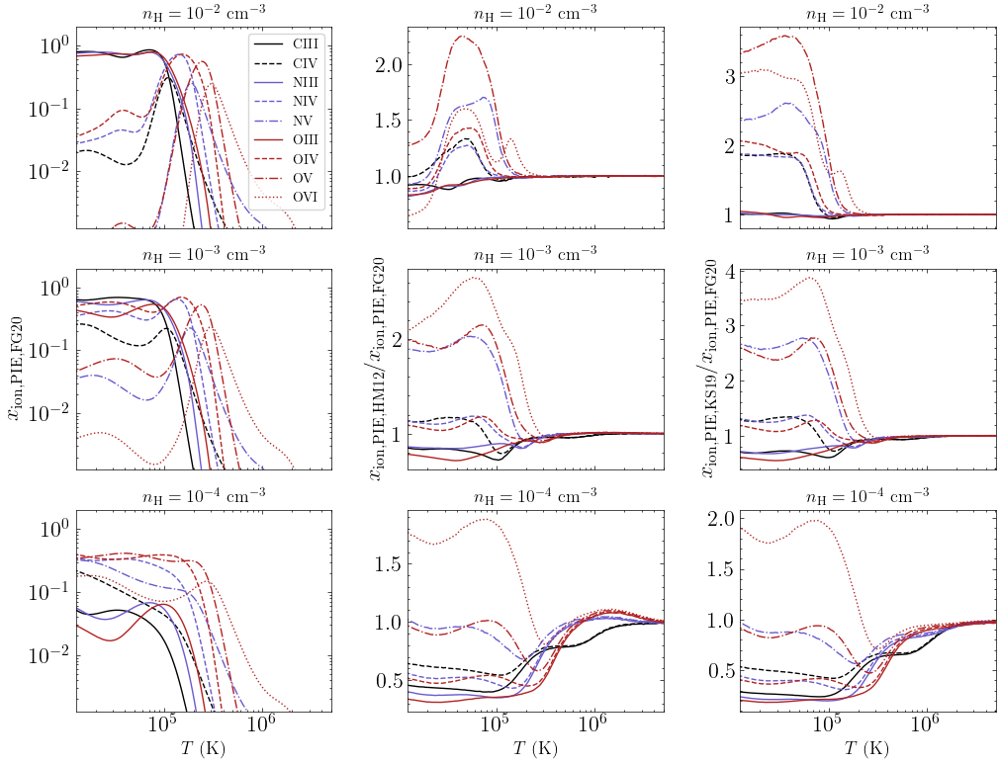

In [103]:
fig, axes = plt.subplots(3, 3, figsize=(4*3, 3*3), sharex=True)

# FG20

k = ('fg20',1,-2)
plot_ion_frac_select(axes[0,0], T_grid_PIE[k], X_dict_PIE_carb[k], X_dict_PIE_nit[k], X_dict_PIE_oxy[k])
axes[0,0].set_title(r'$n_\mathrm{H} = 10^{-2} \ \mathrm{cm}^{-3}$', fontsize=13)

axes[0,0].legend(fontsize=10)
axes[0,0].set_xscale('log')
axes[0,0].set_yscale('log')
axes[0,0].set_xlim(10**4.1,10**6.7)
axes[0,0].set_ylim(10**-2.9, 10**0.3)

k = ('fg20',1,-3)
plot_ion_frac_select(axes[1,0], T_grid_PIE[k], X_dict_PIE_carb[k], X_dict_PIE_nit[k], X_dict_PIE_oxy[k])
axes[1,0].set_title(r'$n_\mathrm{H} = 10^{-3} \ \mathrm{cm}^{-3}$', fontsize=13)
axes[1,0].set_ylabel(r'$x_\mathrm{ion, PIE, FG20}$')
axes[1,0].set_xscale('log')
axes[1,0].set_yscale('log')
axes[1,0].set_xlim(10**4.1,10**6.7)
axes[1,0].set_ylim(10**-2.9, 10**0.3)

k = ('fg20',1,-4)
plot_ion_frac_select(axes[2,0], T_grid_PIE[k], X_dict_PIE_carb[k], X_dict_PIE_nit[k], X_dict_PIE_oxy[k])
axes[2,0].set_title(r'$n_\mathrm{H} = 10^{-4} \ \mathrm{cm}^{-3}$', fontsize=13)
axes[2,0].set_xscale('log')
axes[2,0].set_yscale('log')
axes[2,0].set_xlim(10**4.1,10**6.7)
axes[2,0].set_ylim(10**-2.9, 10**0.3)

# HM12 vs FG20
k1 = ('fg20',1,-2)
k2 = ('hm12',1,-2)
plot_ion_frac_ratio_select(axes[0,1], T_grid_PIE[k1], 
                           X_dict_PIE_carb[k1], X_dict_PIE_nit[k1], X_dict_PIE_oxy[k1],
                           X_dict_PIE_carb[k2], X_dict_PIE_nit[k2], X_dict_PIE_oxy[k2])

axes[0,1].set_title(r'$n_\mathrm{H} = 10^{-2} \ \mathrm{cm}^{-3}$', fontsize=13)
axes[2,0].set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)


axes[0,1].set_xscale('log')
#axes[0,1].set_yscale('log')

k1 = ('fg20',1,-3)
k2 = ('hm12',1,-3)
plot_ion_frac_ratio_select(axes[1,1], T_grid_PIE[k1], 
                           X_dict_PIE_carb[k1], X_dict_PIE_nit[k1], X_dict_PIE_oxy[k1],
                           X_dict_PIE_carb[k2], X_dict_PIE_nit[k2], X_dict_PIE_oxy[k2])

axes[1,1].set_title(r'$n_\mathrm{H} = 10^{-3} \ \mathrm{cm}^{-3}$', fontsize=13)
axes[1,1].set_ylabel(r'$x_\mathrm{ion, PIE, HM12}/x_\mathrm{ion, PIE, FG20}$')


k1 = ('fg20',1,-4)
k2 = ('hm12',1,-4)
plot_ion_frac_ratio_select(axes[2,1], T_grid_PIE[k1], 
                           X_dict_PIE_carb[k1], X_dict_PIE_nit[k1], X_dict_PIE_oxy[k1],
                           X_dict_PIE_carb[k2], X_dict_PIE_nit[k2], X_dict_PIE_oxy[k2])


axes[2,1].set_title(r'$n_\mathrm{H} = 10^{-4} \ \mathrm{cm}^{-3}$', fontsize=13)
axes[2,1].set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)

# KS19 vs FG20
k1 = ('fg20',1,-2)
k2 = ('ks19',1,-2)
plot_ion_frac_ratio_select(axes[0,2], T_grid_PIE[k1], 
                           X_dict_PIE_carb[k1], X_dict_PIE_nit[k1], X_dict_PIE_oxy[k1],
                           X_dict_PIE_carb[k2], X_dict_PIE_nit[k2], X_dict_PIE_oxy[k2])

axes[0,2].set_title(r'$n_\mathrm{H} = 10^{-2} \ \mathrm{cm}^{-3}$', fontsize=13)


axes[0,2].set_xscale('log')
#axes[0,2].set_yscale('log')

k1 = ('fg20',1,-3)
k2 = ('ks19',1,-3)
plot_ion_frac_ratio_select(axes[1,2], T_grid_PIE[k1], 
                           X_dict_PIE_carb[k1], X_dict_PIE_nit[k1], X_dict_PIE_oxy[k1],
                           X_dict_PIE_carb[k2], X_dict_PIE_nit[k2], X_dict_PIE_oxy[k2])

axes[1,2].set_title(r'$n_\mathrm{H} = 10^{-3} \ \mathrm{cm}^{-3}$', fontsize=13)
axes[1,2].set_ylabel(r'$x_\mathrm{ion, PIE, KS19}/x_\mathrm{ion, PIE, FG20}$')


k1 = ('fg20',1,-4)
k2 = ('ks19',1,-4)
plot_ion_frac_ratio_select(axes[2,2], T_grid_PIE[k1], 
                           X_dict_PIE_carb[k1], X_dict_PIE_nit[k1], X_dict_PIE_oxy[k1],
                           X_dict_PIE_carb[k2], X_dict_PIE_nit[k2], X_dict_PIE_oxy[k2])

axes[2,2].set_title(r'$n_\mathrm{H} = 10^{-4} \ \mathrm{cm}^{-3}$', fontsize=13)
axes[2,2].set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)

plt.subplots_adjust(wspace=0.3, hspace=0.2)

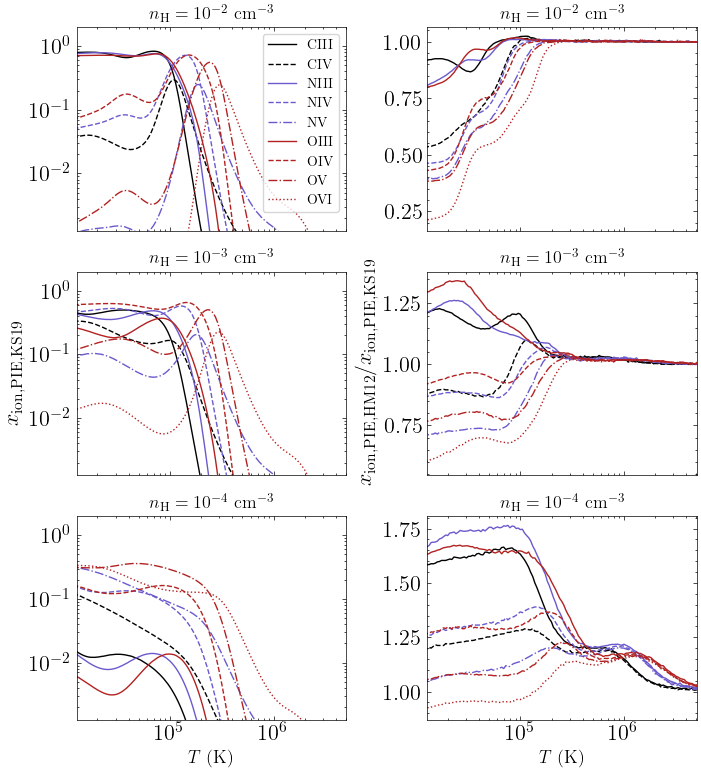

In [104]:
fig, axes = plt.subplots(3, 2, figsize=(4*2, 3*3), sharex=True)

# KS19

k = ('ks19',1,-2)
plot_ion_frac_select(axes[0,0], T_grid_PIE[k], X_dict_PIE_carb[k], X_dict_PIE_nit[k], X_dict_PIE_oxy[k])
axes[0,0].set_title(r'$n_\mathrm{H} = 10^{-2} \ \mathrm{cm}^{-3}$', fontsize=13)
axes[0,0].legend(fontsize=10)
axes[0,0].set_xscale('log')
axes[0,0].set_yscale('log')
axes[0,0].set_xlim(10**4.1,10**6.7)
axes[0,0].set_ylim(10**-2.9, 10**0.3)

k = ('ks19',1,-3)
plot_ion_frac_select(axes[1,0], T_grid_PIE[k], X_dict_PIE_carb[k], X_dict_PIE_nit[k], X_dict_PIE_oxy[k])
axes[1,0].set_title(r'$n_\mathrm{H} = 10^{-3} \ \mathrm{cm}^{-3}$', fontsize=13)
axes[1,0].set_ylabel(r'$x_\mathrm{ion, PIE, KS19}$')
axes[1,0].set_xscale('log')
axes[1,0].set_yscale('log')
axes[1,0].set_xlim(10**4.1,10**6.7)
axes[1,0].set_ylim(10**-2.9, 10**0.3)

k = ('ks19',1,-4)
plot_ion_frac_select(axes[2,0], T_grid_PIE[k], X_dict_PIE_carb[k], X_dict_PIE_nit[k], X_dict_PIE_oxy[k])
axes[2,0].set_title(r'$n_\mathrm{H} = 10^{-4} \ \mathrm{cm}^{-3}$', fontsize=13)
axes[2,0].set_xscale('log')
axes[2,0].set_yscale('log')
axes[2,0].set_xlim(10**4.1,10**6.7)
axes[2,0].set_ylim(10**-2.9, 10**0.3)

# HM12 vs KS19
k1 = ('ks19',1,-2)
k2 = ('hm12',1,-2)
plot_ion_frac_ratio_select(axes[0,1], T_grid_PIE[k1], 
                           X_dict_PIE_carb[k1], X_dict_PIE_nit[k1], X_dict_PIE_oxy[k1],
                           X_dict_PIE_carb[k2], X_dict_PIE_nit[k2], X_dict_PIE_oxy[k2])

axes[0,1].set_title(r'$n_\mathrm{H} = 10^{-2} \ \mathrm{cm}^{-3}$', fontsize=13)
axes[2,0].set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)


axes[0,1].set_xscale('log')
#axes[0,1].set_yscale('log')

k1 = ('ks19',1,-3)
k2 = ('hm12',1,-3)
plot_ion_frac_ratio_select(axes[1,1], T_grid_PIE[k1], 
                           X_dict_PIE_carb[k1], X_dict_PIE_nit[k1], X_dict_PIE_oxy[k1],
                           X_dict_PIE_carb[k2], X_dict_PIE_nit[k2], X_dict_PIE_oxy[k2])

axes[1,1].set_title(r'$n_\mathrm{H} = 10^{-3} \ \mathrm{cm}^{-3}$', fontsize=13)
axes[1,1].set_ylabel(r'$x_\mathrm{ion, PIE, HM12}/x_\mathrm{ion, PIE, KS19}$')


k1 = ('ks19',1,-4)
k2 = ('hm12',1,-4)
plot_ion_frac_ratio_select(axes[2,1], T_grid_PIE[k1], 
                           X_dict_PIE_carb[k1], X_dict_PIE_nit[k1], X_dict_PIE_oxy[k1],
                           X_dict_PIE_carb[k2], X_dict_PIE_nit[k2], X_dict_PIE_oxy[k2])


axes[2,1].set_title(r'$n_\mathrm{H} = 10^{-4} \ \mathrm{cm}^{-3}$', fontsize=13)
axes[2,1].set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)

plt.subplots_adjust(wspace=0.3, hspace=0.2)

## Comparison for fixed ionization parameter

In [105]:
def get_PIE_frac_U(k):
    
    uvb, z, logU = k
    
    # Load directory
    loaddir = rootdir+'cloudy_grids/non_eqm_models/PI/PIE/{}/z={}/logU={}/'.format(uvb, str(z), str(logU))
    # Temperature

    f = open(loaddir + 'PIE_frac.grd', 'r')
    L = f.readlines()
    f.close()

    T_grid_PIE = 10**np.array([float(L[i].split('\t')[-2]) for i in range(1, len(L))])
    
    # Hydrogen

    X_dict_PIE_hyd = {k:np.zeros(len(T_grid_PIE)) for k in H_list}

    f = open(loaddir + 'PIE_frac.hyd', 'r')
    L = f.readlines()
    f.close()

    for s in H_list:
        for i in range(len(T_grid_PIE)):
            X_dict_PIE_hyd[s][i] = float(L[i+1].split('\t')[H_list.index(s)+1])

    # Carbon

    X_dict_PIE_carb = {k:np.zeros(len(T_grid_PIE)) for k in C_list}

    f = open(loaddir + 'PIE_frac.carb', 'r')
    L = f.readlines()
    f.close()

    for s in C_list:
        for i in range(len(T_grid_PIE)):
            X_dict_PIE_carb[s][i] = float(L[i+1].split('\t')[C_list.index(s)+1])

    # Nitrogen

    X_dict_PIE_nit = {k:np.zeros(len(T_grid_PIE)) for k in N_list}

    f = open(loaddir + 'PIE_frac.nit', 'r')
    L = f.readlines()
    f.close()

    for s in N_list:
        for i in range(len(T_grid_PIE)):
            X_dict_PIE_nit[s][i] = float(L[i+1].split('\t')[N_list.index(s)+1])

    # Oxygen

    X_dict_PIE_oxy = {k:np.zeros(len(T_grid_PIE)) for k in O_list}

    f = open(loaddir + 'PIE_frac.oxy', 'r')
    L = f.readlines()
    f.close()

    for s in O_list:
        for i in range(len(T_grid_PIE)):
            X_dict_PIE_oxy[s][i] = float(L[i+1].split('\t')[O_list.index(s)+1])
            
    return T_grid_PIE, X_dict_PIE_hyd, X_dict_PIE_carb, X_dict_PIE_nit, X_dict_PIE_oxy

In [106]:
T_grid_PIE_U = {}
X_dict_PIE_U_hyd = {}
X_dict_PIE_U_carb = {}
X_dict_PIE_U_nit = {}
X_dict_PIE_U_oxy = {}

In [107]:
# FG20
k = ('fg20',1,-3.07)
T_grid_PIE_U[k], X_dict_PIE_U_hyd[k], X_dict_PIE_U_carb[k], X_dict_PIE_U_nit[k], X_dict_PIE_U_oxy[k] = get_PIE_frac_U(k)

k = ('fg20',1,-2.07)
T_grid_PIE_U[k], X_dict_PIE_U_hyd[k], X_dict_PIE_U_carb[k], X_dict_PIE_U_nit[k], X_dict_PIE_U_oxy[k] = get_PIE_frac_U(k)

k = ('fg20',1,-1.07)
T_grid_PIE_U[k], X_dict_PIE_U_hyd[k], X_dict_PIE_U_carb[k], X_dict_PIE_U_nit[k], X_dict_PIE_U_oxy[k] = get_PIE_frac_U(k)

# HM12
k = ('hm12',1,-3.07)
T_grid_PIE_U[k], X_dict_PIE_U_hyd[k], X_dict_PIE_U_carb[k], X_dict_PIE_U_nit[k], X_dict_PIE_U_oxy[k] = get_PIE_frac_U(k)

k = ('hm12',1,-2.07)
T_grid_PIE_U[k], X_dict_PIE_U_hyd[k], X_dict_PIE_U_carb[k], X_dict_PIE_U_nit[k], X_dict_PIE_U_oxy[k] = get_PIE_frac_U(k)

k = ('hm12',1,-1.07)
T_grid_PIE_U[k], X_dict_PIE_U_hyd[k], X_dict_PIE_U_carb[k], X_dict_PIE_U_nit[k], X_dict_PIE_U_oxy[k] = get_PIE_frac_U(k)

# KS19
k = ('ks19',1,-3.07)
T_grid_PIE_U[k], X_dict_PIE_U_hyd[k], X_dict_PIE_U_carb[k], X_dict_PIE_U_nit[k], X_dict_PIE_U_oxy[k] = get_PIE_frac_U(k)

k = ('ks19',1,-2.07)
T_grid_PIE_U[k], X_dict_PIE_U_hyd[k], X_dict_PIE_U_carb[k], X_dict_PIE_U_nit[k], X_dict_PIE_U_oxy[k] = get_PIE_frac_U(k)

k = ('ks19',1,-1.07)
T_grid_PIE_U[k], X_dict_PIE_U_hyd[k], X_dict_PIE_U_carb[k], X_dict_PIE_U_nit[k], X_dict_PIE_U_oxy[k] = get_PIE_frac_U(k)

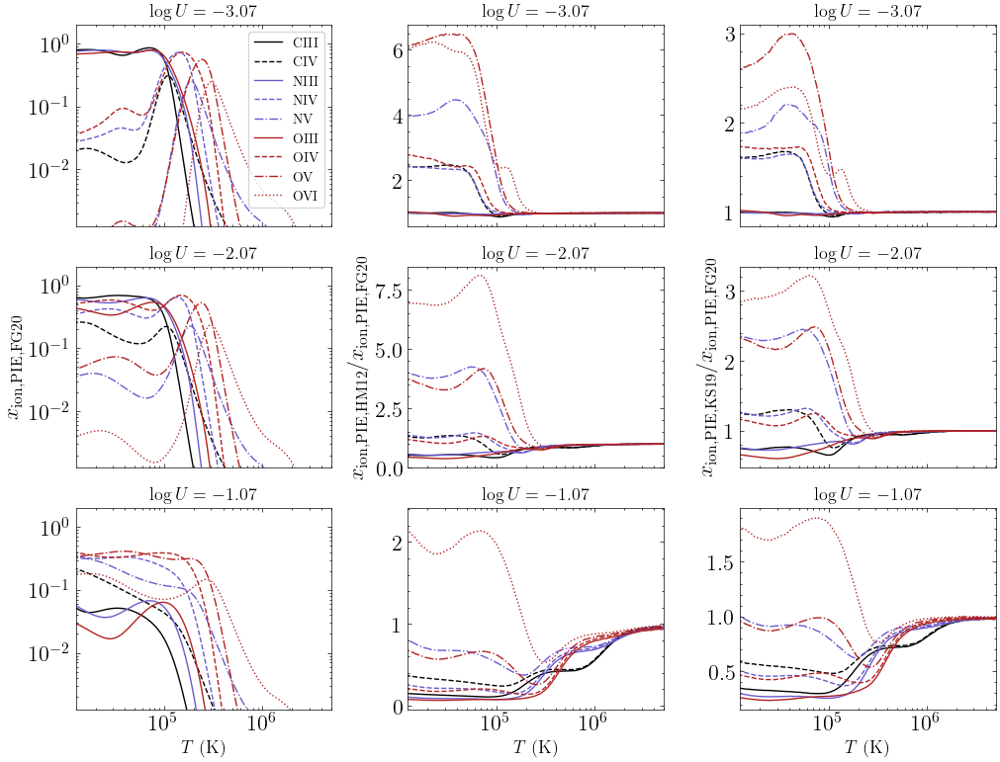

In [108]:
fig, axes = plt.subplots(3, 3, figsize=(4*3, 3*3), sharex=True)

# FG20
k = ('fg20',1,-3.07)
plot_ion_frac_select(axes[0,0], T_grid_PIE_U[k], X_dict_PIE_U_carb[k], X_dict_PIE_U_nit[k], X_dict_PIE_U_oxy[k])
axes[0,0].set_title(r'$\log U = -3.07$', fontsize=13)
axes[0,0].legend(fontsize=10)
axes[0,0].set_xscale('log')
axes[0,0].set_yscale('log')
axes[0,0].set_xlim(10**4.1,10**6.7)
axes[0,0].set_ylim(10**-2.9, 10**0.3)

k = ('fg20',1,-2.07)
plot_ion_frac_select(axes[1,0], T_grid_PIE_U[k], X_dict_PIE_U_carb[k], X_dict_PIE_U_nit[k], X_dict_PIE_U_oxy[k])
axes[1,0].set_title(r'$\log U = -2.07$', fontsize=13)
axes[1,0].set_ylabel(r'$x_\mathrm{ion, PIE, FG20}$')
axes[1,0].set_xscale('log')
axes[1,0].set_yscale('log')
axes[1,0].set_xlim(10**4.1,10**6.7)
axes[1,0].set_ylim(10**-2.9, 10**0.3)

k = ('fg20',1,-1.07)
plot_ion_frac_select(axes[2,0], T_grid_PIE_U[k], X_dict_PIE_U_carb[k], X_dict_PIE_U_nit[k], X_dict_PIE_U_oxy[k])
axes[2,0].set_title(r'$\log U = -1.07$', fontsize=13)
axes[2,0].set_xscale('log')
axes[2,0].set_yscale('log')
axes[2,0].set_xlim(10**4.1,10**6.7)
axes[2,0].set_ylim(10**-2.9, 10**0.3)
axes[2,0].set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)

# HM12 vs FG20
k1 = ('fg20',1,-3.07)
k2 = ('hm12',1,-3.07)
plot_ion_frac_ratio_select(axes[0,1], T_grid_PIE_U[k1], 
                           X_dict_PIE_U_carb[k1], X_dict_PIE_U_nit[k1], X_dict_PIE_U_oxy[k1],
                           X_dict_PIE_U_carb[k2], X_dict_PIE_U_nit[k2], X_dict_PIE_U_oxy[k2])

axes[0,1].set_title(r'$\log U = -3.07$', fontsize=13)


axes[0,1].set_xscale('log')
#axes[0,1].set_yscale('log')

k1 = ('fg20',1,-2.07)
k2 = ('hm12',1,-2.07)
plot_ion_frac_ratio_select(axes[1,1], T_grid_PIE_U[k1], 
                           X_dict_PIE_U_carb[k1], X_dict_PIE_U_nit[k1], X_dict_PIE_U_oxy[k1],
                           X_dict_PIE_U_carb[k2], X_dict_PIE_U_nit[k2], X_dict_PIE_U_oxy[k2])

axes[1,1].set_title(r'$\log U = -2.07$', fontsize=13)
axes[1,1].set_ylabel(r'$x_\mathrm{ion, PIE, HM12}/x_\mathrm{ion, PIE, FG20}$')


k1 = ('fg20',1,-1.07)
k2 = ('hm12',1,-1.07)
plot_ion_frac_ratio_select(axes[2,1], T_grid_PIE_U[k1], 
                           X_dict_PIE_U_carb[k1], X_dict_PIE_U_nit[k1], X_dict_PIE_U_oxy[k1],
                           X_dict_PIE_U_carb[k2], X_dict_PIE_U_nit[k2], X_dict_PIE_U_oxy[k2])


axes[2,1].set_title(r'$\log U = -1.07$', fontsize=13)
axes[2,1].set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)

# KS19 vs FG20
k1 = ('fg20',1,-3.07)
k2 = ('ks19',1,-3.07)
plot_ion_frac_ratio_select(axes[0,2], T_grid_PIE_U[k1], 
                           X_dict_PIE_U_carb[k1], X_dict_PIE_U_nit[k1], X_dict_PIE_U_oxy[k1],
                           X_dict_PIE_U_carb[k2], X_dict_PIE_U_nit[k2], X_dict_PIE_U_oxy[k2])

axes[0,2].set_title(r'$\log U = -3.07$', fontsize=13)


axes[0,2].set_xscale('log')
#axes[0,2].set_yscale('log')

k1 = ('fg20',1,-2.07)
k2 = ('ks19',1,-2.07)
plot_ion_frac_ratio_select(axes[1,2], T_grid_PIE_U[k1], 
                           X_dict_PIE_U_carb[k1], X_dict_PIE_U_nit[k1], X_dict_PIE_U_oxy[k1],
                           X_dict_PIE_U_carb[k2], X_dict_PIE_U_nit[k2], X_dict_PIE_U_oxy[k2])

axes[1,2].set_title(r'$\log U = -2.07$', fontsize=13)
axes[1,2].set_ylabel(r'$x_\mathrm{ion, PIE, KS19}/x_\mathrm{ion, PIE, FG20}$')


k1 = ('fg20',1,-1.07)
k2 = ('ks19',1,-1.07)
plot_ion_frac_ratio_select(axes[2,2], T_grid_PIE_U[k1], 
                           X_dict_PIE_U_carb[k1], X_dict_PIE_U_nit[k1], X_dict_PIE_U_oxy[k1],
                           X_dict_PIE_U_carb[k2], X_dict_PIE_U_nit[k2], X_dict_PIE_U_oxy[k2])
axes[2,2].set_title(r'$\log U = -1.07$', fontsize=13)
axes[2,2].set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)

plt.subplots_adjust(wspace=0.3, hspace=0.2)

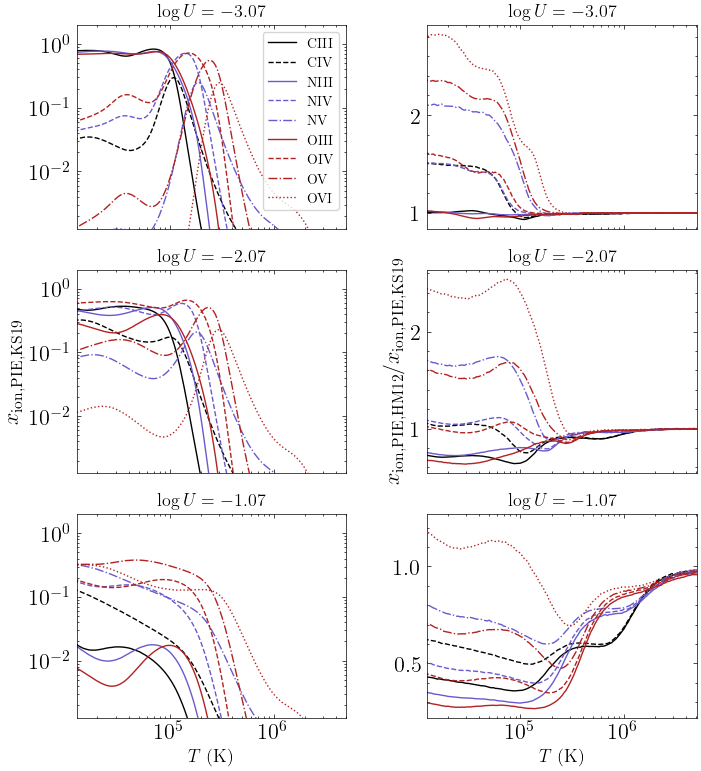

In [109]:
fig, axes = plt.subplots(3, 2, figsize=(4*2, 3*3), sharex=True)

# KS19

k = ('ks19',1,-3.07)
plot_ion_frac_select(axes[0,0], T_grid_PIE_U[k], X_dict_PIE_U_carb[k], X_dict_PIE_U_nit[k], X_dict_PIE_U_oxy[k])
axes[0,0].set_title(r'$\log U = -3.07$', fontsize=13)
axes[0,0].legend(fontsize=10)
axes[0,0].set_xscale('log')
axes[0,0].set_yscale('log')
axes[0,0].set_xlim(10**4.1,10**6.7)
axes[0,0].set_ylim(10**-2.9, 10**0.3)

k = ('ks19',1,-2.07)
plot_ion_frac_select(axes[1,0], T_grid_PIE_U[k], X_dict_PIE_U_carb[k], X_dict_PIE_U_nit[k], X_dict_PIE_U_oxy[k])
axes[1,0].set_title(r'$\log U = -2.07$', fontsize=13)
axes[1,0].set_ylabel(r'$x_\mathrm{ion, PIE, KS19}$')
axes[1,0].set_xscale('log')
axes[1,0].set_yscale('log')
axes[1,0].set_xlim(10**4.1,10**6.7)
axes[1,0].set_ylim(10**-2.9, 10**0.3)

k = ('ks19',1,-1.07)
plot_ion_frac_select(axes[2,0], T_grid_PIE_U[k], X_dict_PIE_U_carb[k], X_dict_PIE_U_nit[k], X_dict_PIE_U_oxy[k])
axes[2,0].set_title(r'$\log U = -1.07$', fontsize=13)
axes[2,0].set_xscale('log')
axes[2,0].set_yscale('log')
axes[2,0].set_xlim(10**4.1,10**6.7)
axes[2,0].set_ylim(10**-2.9, 10**0.3)
axes[2,0].set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)


# HM12 vs KS19
k1 = ('ks19',1,-3.07)
k2 = ('hm12',1,-3.07)
plot_ion_frac_ratio_select(axes[0,1], T_grid_PIE_U[k1], 
                           X_dict_PIE_U_carb[k1], X_dict_PIE_U_nit[k1], X_dict_PIE_U_oxy[k1],
                           X_dict_PIE_U_carb[k2], X_dict_PIE_U_nit[k2], X_dict_PIE_U_oxy[k2])

axes[0,1].set_title(r'$\log U = -3.07$', fontsize=13)


axes[0,1].set_xscale('log')
#axes[0,1].set_yscale('log')

k1 = ('ks19',1,-2.07)
k2 = ('hm12',1,-2.07)
plot_ion_frac_ratio_select(axes[1,1], T_grid_PIE_U[k1], 
                           X_dict_PIE_U_carb[k1], X_dict_PIE_U_nit[k1], X_dict_PIE_U_oxy[k1],
                           X_dict_PIE_U_carb[k2], X_dict_PIE_U_nit[k2], X_dict_PIE_U_oxy[k2])

axes[1,1].set_title(r'$\log U = -2.07$', fontsize=13)
axes[1,1].set_ylabel(r'$x_\mathrm{ion, PIE, HM12}/x_\mathrm{ion, PIE, KS19}$')


k1 = ('ks19',1,-1.07)
k2 = ('hm12',1,-1.07)
plot_ion_frac_ratio_select(axes[2,1], T_grid_PIE_U[k1], 
                           X_dict_PIE_U_carb[k1], X_dict_PIE_U_nit[k1], X_dict_PIE_U_oxy[k1],
                           X_dict_PIE_U_carb[k2], X_dict_PIE_U_nit[k2], X_dict_PIE_U_oxy[k2])


axes[2,1].set_title(r'$\log U = -1.07$', fontsize=13)
axes[2,1].set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)

plt.subplots_adjust(wspace=0.3, hspace=0.2)

# TDP (3e6K) for different UVBs

## Comparison for fixed density

Load in HM12 and KS19

In [110]:
k = ('isochoric','hm12',1,0.0,-2,3e6)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

k = ('isochoric','hm12',1,0.0,-3,3e6)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

k = ('isochoric','hm12',1,0.0,-4,3e6)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

k = ('isochoric','ks19',1,0.0,-2,3e6)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

k = ('isochoric','ks19',1,0.0,-3,3e6)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

k = ('isochoric','ks19',1,0.0,-4,3e6)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

Interpolate HM12 and KS19 along FG20

In [111]:
X_dict_TDP_carb_interp = {}
X_dict_TDP_nit_interp = {}
X_dict_TDP_oxy_interp = {}

X_dict_TDP_carb_interp = {}
X_dict_TDP_nit_interp = {}
X_dict_TDP_oxy_interp = {}

In [112]:
# HM12
k1 = ('isochoric','fg20',1,0,-2,3e6)
k2 = ('isochoric','hm12',1,0,-2,3e6)

X_dict_TDP_carb_interp[k2], X_dict_TDP_nit_interp[k2], X_dict_TDP_oxy_interp[k2] = interp_ion_frac(T_grid_TDP[k1], 
                                                                                                            T_grid_TDP[k2], 
                                                                                                            X_dict_TDP_carb[k2], 
                                                                                                            X_dict_TDP_nit[k2], 
                                                                                                            X_dict_TDP_oxy[k2])

k = (-3,3e6)
k1 = ('isochoric','fg20',1,0,-3,3e6)
k2 = ('isochoric','hm12',1,0,-3,3e6)

X_dict_TDP_carb_interp[k2], X_dict_TDP_nit_interp[k2], X_dict_TDP_oxy_interp[k2] = interp_ion_frac(T_grid_TDP[k1], 
                                                                                                            T_grid_TDP[k2], 
                                                                                                            X_dict_TDP_carb[k2], 
                                                                                                            X_dict_TDP_nit[k2], 
                                                                                                            X_dict_TDP_oxy[k2])
k = (-4,3e6)
k1 = ('isochoric','fg20',1,0,-4,3e6)
k2 = ('isochoric','hm12',1,0,-4,3e6)

X_dict_TDP_carb_interp[k2], X_dict_TDP_nit_interp[k2], X_dict_TDP_oxy_interp[k2] = interp_ion_frac(T_grid_TDP[k1], 
                                                                                                            T_grid_TDP[k2], 
                                                                                                            X_dict_TDP_carb[k2], 
                                                                                                            X_dict_TDP_nit[k2], 
                                                                                                            X_dict_TDP_oxy[k2])

# KS19
k = (-2,3e6)
k1 = ('isochoric','fg20',1,0,-2,3e6)
k2 = ('isochoric','ks19',1,0,-2,3e6)

X_dict_TDP_carb_interp[k2], X_dict_TDP_nit_interp[k2], X_dict_TDP_oxy_interp[k2] = interp_ion_frac(T_grid_TDP[k1], 
                                                                                                            T_grid_TDP[k2], 
                                                                                                            X_dict_TDP_carb[k2], 
                                                                                                            X_dict_TDP_nit[k2], 
                                                                                                            X_dict_TDP_oxy[k2])

k = (-3,3e6)
k1 = ('isochoric','fg20',1,0,-3,3e6)
k2 = ('isochoric','ks19',1,0,-3,3e6)

X_dict_TDP_carb_interp[k2], X_dict_TDP_nit_interp[k2], X_dict_TDP_oxy_interp[k2] = interp_ion_frac(T_grid_TDP[k1], 
                                                                                                            T_grid_TDP[k2], 
                                                                                                            X_dict_TDP_carb[k2], 
                                                                                                            X_dict_TDP_nit[k2], 
                                                                                                            X_dict_TDP_oxy[k2])
k = (-4,3e6)
k1 = ('isochoric','fg20',1,0,-4,3e6)
k2 = ('isochoric','ks19',1,0,-4,3e6)

X_dict_TDP_carb_interp[k2], X_dict_TDP_nit_interp[k2], X_dict_TDP_oxy_interp[k2] = interp_ion_frac(T_grid_TDP[k1], 
                                                                                                            T_grid_TDP[k2], 
                                                                                                            X_dict_TDP_carb[k2], 
                                                                                                            X_dict_TDP_nit[k2], 
                                                                                                            X_dict_TDP_oxy[k2])

/opt/anaconda3/lib/python3.9/site-packages/scipy/interpolate/_interpolate.py:712: RuntimeWarning: invalid value encountered in divide
  slope = (y_hi - y_lo) / (x_hi - x_lo)[:, None]


Plot ion fractions and ratios

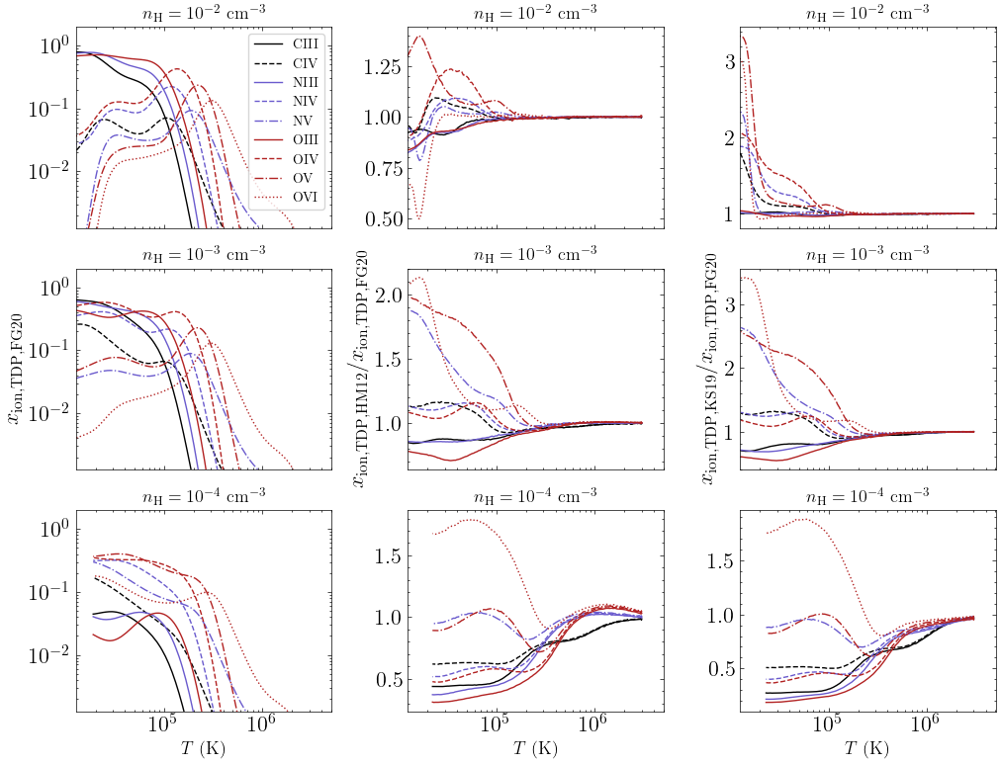

In [113]:
fig, axes = plt.subplots(3, 3, figsize=(4*3, 3*3), sharex=True)

# FG20
k = ('isochoric','fg20',1,0,-2,3e6)
plot_ion_frac_select(axes[0,0], T_grid_TDP[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k])
axes[0,0].set_title(r'$n_\mathrm{H} = 10^{-2} \ \mathrm{cm}^{-3}$', fontsize=13)
axes[0,0].legend(fontsize=10)
axes[0,0].set_xlim(10**4.1,10**6.7)
axes[0,0].set_ylim(10**-2.9, 10**0.3)
axes[0,0].set_xscale('log')
axes[0,0].set_yscale('log')

k = ('isochoric','fg20',1,0,-3,3e6)
plot_ion_frac_select(axes[1,0], T_grid_TDP[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k])
axes[1,0].set_title(r'$n_\mathrm{H} = 10^{-3} \ \mathrm{cm}^{-3}$', fontsize=13)
axes[1,0].set_ylabel(r'$x_\mathrm{ion, TDP, FG20}$')
axes[1,0].set_xlim(10**4.1,10**6.7)
axes[1,0].set_ylim(10**-2.9, 10**0.3)
axes[1,0].set_xscale('log')
axes[1,0].set_yscale('log')

k = ('isochoric','fg20',1,0,-4,3e6)
plot_ion_frac_select(axes[2,0], T_grid_TDP[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k])
axes[2,0].set_title(r'$n_\mathrm{H} = 10^{-4} \ \mathrm{cm}^{-3}$', fontsize=13)
axes[2,0].set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)
axes[2,0].set_xlim(10**4.1,10**6.7)
axes[2,0].set_ylim(10**-2.9, 10**0.3)
axes[2,0].set_xscale('log')
axes[2,0].set_yscale('log')

# HM12 vs FG20
k1 = ('isochoric','fg20',1,0,-2,3e6)
k2 = ('isochoric','hm12',1,0,-2,3e6)
plot_ion_frac_ratio_select(axes[0,1], T_grid_TDP[k1], 
                           X_dict_TDP_carb[k1], X_dict_TDP_nit[k1], X_dict_TDP_oxy[k1],
                           X_dict_TDP_carb_interp[k2], X_dict_TDP_nit_interp[k2], X_dict_TDP_oxy_interp[k2])

axes[0,1].set_title(r'$n_\mathrm{H} = 10^{-2} \ \mathrm{cm}^{-3}$', fontsize=13)

axes[0,1].set_xscale('log')
#axes[0,1].set_yscale('log')

k1 = ('isochoric','fg20',1,0,-3,3e6)
k2 = ('isochoric','hm12',1,0,-3,3e6)
plot_ion_frac_ratio_select(axes[1,1], T_grid_TDP[k1], 
                           X_dict_TDP_carb[k1], X_dict_TDP_nit[k1], X_dict_TDP_oxy[k1],
                           X_dict_TDP_carb_interp[k2], X_dict_TDP_nit_interp[k2], X_dict_TDP_oxy_interp[k2])

axes[1,1].set_title(r'$n_\mathrm{H} = 10^{-3} \ \mathrm{cm}^{-3}$', fontsize=13)
axes[1,1].set_ylabel(r'$x_\mathrm{ion, TDP, HM12}/x_\mathrm{ion, TDP, FG20}$')


k1 = ('isochoric','fg20',1,0,-4,3e6)
k2 = ('isochoric','hm12',1,0,-4,3e6)
plot_ion_frac_ratio_select(axes[2,1], T_grid_TDP[k1], 
                           X_dict_TDP_carb[k1], X_dict_TDP_nit[k1], X_dict_TDP_oxy[k1],
                           X_dict_TDP_carb_interp[k2], X_dict_TDP_nit_interp[k2], X_dict_TDP_oxy_interp[k2])


axes[2,1].set_title(r'$n_\mathrm{H} = 10^{-4} \ \mathrm{cm}^{-3}$', fontsize=13)
axes[2,1].set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)

# KS19 vs FG20
k1 = ('isochoric','fg20',1,0,-2,3e6)
k2 = ('isochoric','ks19',1,0,-2,3e6)
plot_ion_frac_ratio_select(axes[0,2], T_grid_TDP[k1], 
                           X_dict_TDP_carb[k1], X_dict_TDP_nit[k1], X_dict_TDP_oxy[k1],
                           X_dict_TDP_carb_interp[k2], X_dict_TDP_nit_interp[k2], X_dict_TDP_oxy_interp[k2])

axes[0,2].set_title(r'$n_\mathrm{H} = 10^{-2} \ \mathrm{cm}^{-3}$', fontsize=13)


axes[0,2].set_xscale('log')
#axes[0,1].set_yscale('log')

k1 = ('isochoric','fg20',1,0,-3,3e6)
k2 = ('isochoric','ks19',1,0,-3,3e6)
plot_ion_frac_ratio_select(axes[1,2], T_grid_TDP[k1], 
                           X_dict_TDP_carb[k1], X_dict_TDP_nit[k1], X_dict_TDP_oxy[k1],
                           X_dict_TDP_carb_interp[k2], X_dict_TDP_nit_interp[k2], X_dict_TDP_oxy_interp[k2])

axes[1,2].set_title(r'$n_\mathrm{H} = 10^{-3} \ \mathrm{cm}^{-3}$', fontsize=13)
axes[1,2].set_ylabel(r'$x_\mathrm{ion, TDP, KS19}/x_\mathrm{ion, TDP, FG20}$')


k1 = ('isochoric','fg20',1,0,-4,3e6)
k2 = ('isochoric','ks19',1,0,-4,3e6)
plot_ion_frac_ratio_select(axes[2,2], T_grid_TDP[k1], 
                           X_dict_TDP_carb[k1], X_dict_TDP_nit[k1], X_dict_TDP_oxy[k1],
                           X_dict_TDP_carb_interp[k2], X_dict_TDP_nit_interp[k2], X_dict_TDP_oxy_interp[k2])
 

axes[2,2].set_title(r'$n_\mathrm{H} = 10^{-4} \ \mathrm{cm}^{-3}$', fontsize=13)
axes[2,2].set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)

plt.subplots_adjust(wspace=0.3, hspace=0.2)

[]

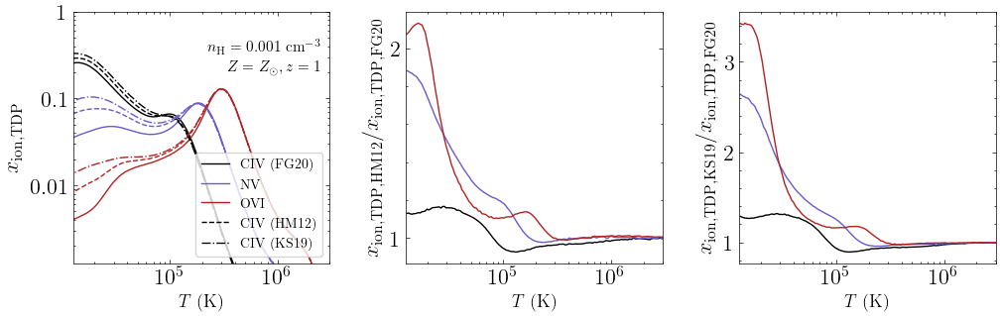

In [114]:
fig, axes = plt.subplots(1, 3, figsize=(4*3, 3.3), sharex=True)

# FG20
k = ('isochoric','fg20',1,0,-3,3e6)

axes[0].plot(T_grid_TDP[k], X_dict_TDP_carb[k]['CIV'], color='black', label='CIV (FG20)')
axes[0].plot(T_grid_TDP[k], X_dict_TDP_nit[k]['NV'], color='slateblue', label='NV')
axes[0].plot(T_grid_TDP[k], X_dict_TDP_oxy[k]['OVI'], color='firebrick', label='OVI')

k = ('isochoric','hm12',1,0,-3,3e6)

axes[0].plot(T_grid_TDP[k], X_dict_TDP_carb[k]['CIV'], linestyle='--', color='black', label='CIV (HM12)')
axes[0].plot(T_grid_TDP[k], X_dict_TDP_nit[k]['NV'], linestyle='--', color='slateblue')
axes[0].plot(T_grid_TDP[k], X_dict_TDP_oxy[k]['OVI'], linestyle='--', color='firebrick')

k = ('isochoric','ks19',1,0,-3,3e6)

axes[0].plot(T_grid_TDP[k], X_dict_TDP_carb[k]['CIV'], linestyle='-.', color='black', label='CIV (KS19)')
axes[0].plot(T_grid_TDP[k], X_dict_TDP_nit[k]['NV'], linestyle='-.', color='slateblue')
axes[0].plot(T_grid_TDP[k], X_dict_TDP_oxy[k]['OVI'], linestyle='-.', color='firebrick')


axes[0].text(2.5e6, 3.5e-1, r'$n_\mathrm{H} = 0.001 \ \mathrm{cm}^{-3}$', fontsize=11, horizontalalignment='right')
axes[0].text(2.5e6, 2e-1, r'$Z=Z_\odot, z=1$', fontsize=11, horizontalalignment='right')
axes[0].set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)
axes[0].set_ylabel(r'$x_\mathrm{ion, TDP}$')
axes[0].legend(fontsize=10, loc='lower right')
axes[0].set_xlim(10**4.1,3*10**6)
axes[0].set_ylim(10**-2.9, 1)
axes[0].set_xscale('log')
axes[0].set_yscale('log')

axes[0].set_yticks([0.01, 0.1,1], ['0.01', '0.1','1'])
# HM12 vs. FG20
k = ('isochoric','fg20',1,0,-3,3e6)
k1 = ('isochoric','hm12',1,0,-3,3e6)
plot_ion_frac_ratio_select(axes[1], T_grid_TDP[k], 
                           X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k],
                           X_dict_TDP_carb_interp[k1], X_dict_TDP_nit_interp[k1], X_dict_TDP_oxy_interp[k1],
                          C_list_sub=['CIV'], N_list_sub=['NV'], O_list_sub=['OVI'])

axes[1].set_ylabel(r'$x_\mathrm{ion, TDP, HM12}/x_\mathrm{ion, TDP, FG20}$')
axes[1].set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)
axes[1].set_xscale('log')
axes[1].set_yticks([1,2],[1,2])

# KS19 vs. FG20
k = ('isochoric','fg20',1,0,-3,3e6)
k1 = ('isochoric','ks19',1,0,-3,3e6)
plot_ion_frac_ratio_select(axes[2], T_grid_TDP[k], 
                           X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k],
                           X_dict_TDP_carb_interp[k1], X_dict_TDP_nit_interp[k1], X_dict_TDP_oxy_interp[k1],
                          C_list_sub=['CIV'], N_list_sub=['NV'], O_list_sub=['OVI'])

axes[2].set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)
axes[2].set_ylabel(r'$x_\mathrm{ion, TDP, KS19}/x_\mathrm{ion, TDP, FG20}$')
axes[2].set_xscale('log')

plt.subplots_adjust(wspace=0.3, hspace=0.2)

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])
#ax_label.set_title('Systematic variations in TDP using different UVBs', fontsize=16)

#plt.savefig(rootdir+'Figures/TDP_UVB_vary.pdf', dpi=300)
#plt.savefig(rootdir+'Figures/TDP_UVB_vary.png', dpi=300)

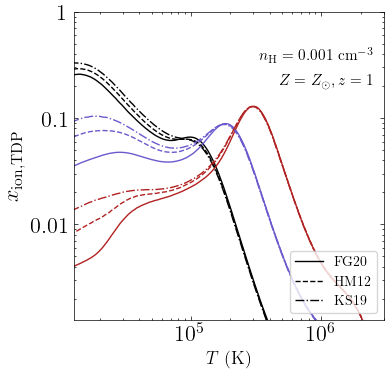

In [115]:
fig, ax = plt.subplots(1, figsize=(4, 4), sharex=True)

# FG20
k = ('isochoric','fg20',1,0,-3,3e6)

ax.plot(T_grid_TDP[k], X_dict_TDP_carb[k]['CIV'], color='black', label='FG20')
ax.plot(T_grid_TDP[k], X_dict_TDP_nit[k]['NV'], color='slateblue')
ax.plot(T_grid_TDP[k], X_dict_TDP_oxy[k]['OVI'], color='firebrick')

k = ('isochoric','hm12',1,0,-3,3e6)

ax.plot(T_grid_TDP[k], X_dict_TDP_carb[k]['CIV'], linestyle='--', color='black', label='HM12')
ax.plot(T_grid_TDP[k], X_dict_TDP_nit[k]['NV'], linestyle='--', color='slateblue')
ax.plot(T_grid_TDP[k], X_dict_TDP_oxy[k]['OVI'], linestyle='--', color='firebrick')

k = ('isochoric','ks19',1,0,-3,3e6)

ax.plot(T_grid_TDP[k], X_dict_TDP_carb[k]['CIV'], linestyle='-.', color='black', label='KS19')
ax.plot(T_grid_TDP[k], X_dict_TDP_nit[k]['NV'], linestyle='-.', color='slateblue')
ax.plot(T_grid_TDP[k], X_dict_TDP_oxy[k]['OVI'], linestyle='-.', color='firebrick')


ax.text(2.5e6, 3.5e-1, r'$n_\mathrm{H} = 0.001 \ \mathrm{cm}^{-3}$', fontsize=11, horizontalalignment='right')
ax.text(2.5e6, 2e-1, r'$Z=Z_\odot, z=1$', fontsize=11, horizontalalignment='right')
ax.set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)
ax.set_ylabel(r'$x_\mathrm{ion, TDP}$')
ax.legend(fontsize=10, loc='lower right')
ax.set_xlim(10**4.1,3*10**6)
ax.set_ylim(10**-2.9, 1)
ax.set_xscale('log')
ax.set_yscale('log')

ax.set_yticks([0.01, 0.1,1], ['0.01', '0.1','1'])

#plt.savefig(rootdir+'Figures/TDP_UVB_vary.pdf', dpi=300)
#plt.savefig(rootdir+'Figures/TDP_UVB_vary.png', dpi=300)

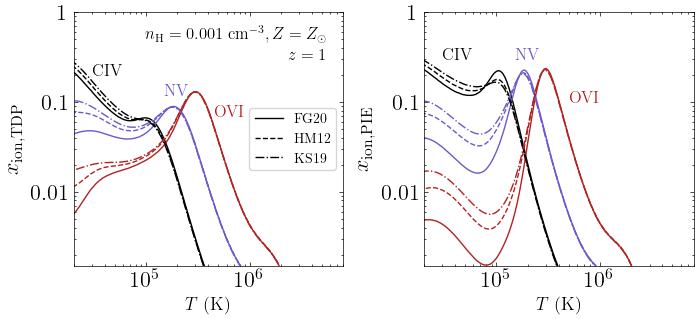

In [116]:
fig, axes = plt.subplots(1, 2, figsize=(4*2, 3.3), sharex=True)


# FG20
k = ('isochoric','fg20',1,0,-3,3e6)

axes[0].text(5.5e6,0.5,r'$n_\mathrm{H} = 0.001 \ \mathrm{cm}^{-3}, Z=Z_\odot$', horizontalalignment='right', fontsize=12)
axes[0].text(5.5e6,0.3,r'$z=1$', horizontalalignment='right', fontsize=12)

axes[0].plot(T_grid_TDP[k], X_dict_TDP_carb[k]['CIV'], color='black', label='FG20')
axes[0].text(3e4, 0.2, 'CIV', color='black', fontsize=12)

axes[0].plot(T_grid_TDP[k], X_dict_TDP_nit[k]['NV'], color='slateblue')
axes[0].text(1.5e5, 0.12, 'NV', color='slateblue', fontsize=12)

axes[0].plot(T_grid_TDP[k], X_dict_TDP_oxy[k]['OVI'], color='firebrick')
axes[0].text(4.5e5, 0.07, 'OVI', color='firebrick', fontsize=12)

k = ('isochoric','hm12',1,0,-3,3e6)

axes[0].plot(T_grid_TDP[k], X_dict_TDP_carb[k]['CIV'], linestyle='--', color='black', label='HM12')
axes[0].plot(T_grid_TDP[k], X_dict_TDP_nit[k]['NV'], linestyle='--', color='slateblue')
axes[0].plot(T_grid_TDP[k], X_dict_TDP_oxy[k]['OVI'], linestyle='--', color='firebrick')

k = ('isochoric','ks19',1,0,-3,3e6)

axes[0].plot(T_grid_TDP[k], X_dict_TDP_carb[k]['CIV'], linestyle='-.', color='black', label='KS19')
axes[0].plot(T_grid_TDP[k], X_dict_TDP_nit[k]['NV'], linestyle='-.', color='slateblue')
axes[0].plot(T_grid_TDP[k], X_dict_TDP_oxy[k]['OVI'], linestyle='-.', color='firebrick')

axes[0].legend(fontsize=10, loc='center right')

axes[0].set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)
axes[0].set_ylabel(r'$x_\mathrm{ion, TDP}$')

axes[0].set_ylim(1.5e-3, 1)

axes[0].set_yscale('log')
axes[0].set_yticks([1e-2, 1e-1,1], ['0.01', '0.1','1'])

# FG20
k = ('fg20',1,-3.0)

axes[1].plot(T_grid_PIE[k], X_dict_PIE_carb[k]['CIV'], color='black', label='FG20')
axes[1].text(3e4, 0.3, 'CIV', color='black', fontsize=12)

axes[1].plot(T_grid_PIE[k], X_dict_PIE_nit[k]['NV'], color='slateblue')
axes[1].text(1.5e5, 0.3, 'NV', color='slateblue', fontsize=12)

axes[1].plot(T_grid_PIE[k], X_dict_PIE_oxy[k]['OVI'], color='firebrick')
axes[1].text(5e5, 0.1, 'OVI', color='firebrick', fontsize=12)

k = ('hm12',1,-3.0)

axes[1].plot(T_grid_PIE[k], X_dict_PIE_carb[k]['CIV'], linestyle='--', color='black', label='HM12')
axes[1].plot(T_grid_PIE[k], X_dict_PIE_nit[k]['NV'], linestyle='--', color='slateblue')
axes[1].plot(T_grid_PIE[k], X_dict_PIE_oxy[k]['OVI'], linestyle='--', color='firebrick')

k = ('ks19',1,-3.0)

axes[1].plot(T_grid_PIE[k], X_dict_PIE_carb[k]['CIV'], linestyle='-.', color='black', label='KS19')
axes[1].plot(T_grid_PIE[k], X_dict_PIE_nit[k]['NV'], linestyle='-.', color='slateblue')
axes[1].plot(T_grid_PIE[k], X_dict_PIE_oxy[k]['OVI'], linestyle='-.', color='firebrick')

axes[1].set_yticks([0.01, 0.1,1], ['0.01', '0.1','1'])


axes[1].set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)
axes[1].set_ylabel(r'$x_\mathrm{ion, PIE}$')
axes[1].set_ylim(1.5e-3, 1)
axes[1].set_xlim(2e4,8e6)

axes[1].set_xscale('log')
axes[1].set_yscale('log')
axes[1].set_yticks([0.01, 0.1,1], ['0.01', '0.1','1'])


plt.subplots_adjust(wspace=0.3, hspace=0.2)

#ax_label.set_title('Systematic variations in TDP using different UVBs', fontsize=16)

#plt.savefig(rootdir+'Figures/TDP_UVB_vary.pdf', dpi=300)
#plt.savefig(rootdir+'Figures/TDP_UVB_vary.png', dpi=300)

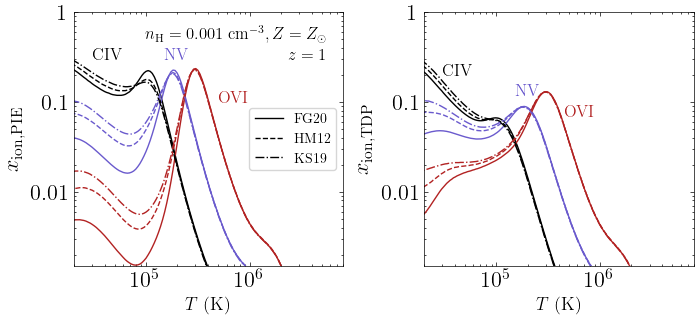

In [117]:
fig, axes = plt.subplots(1, 2, figsize=(4*2, 3.3), sharex=True)

# FG20
k = ('fg20',1,-3.0)

axes[0].text(5.5e6,0.5,r'$n_\mathrm{H} = 0.001 \ \mathrm{cm}^{-3}, Z=Z_\odot$', horizontalalignment='right', fontsize=12)
axes[0].text(5.5e6,0.3,r'$z=1$', horizontalalignment='right', fontsize=12)

axes[0].plot(T_grid_PIE[k], X_dict_PIE_carb[k]['CIV'], color='black', label='FG20')
axes[0].text(3e4, 0.3, 'CIV', color='black', fontsize=12)

axes[0].plot(T_grid_PIE[k], X_dict_PIE_nit[k]['NV'], color='slateblue')
axes[0].text(1.5e5, 0.3, 'NV', color='slateblue', fontsize=12)

axes[0].plot(T_grid_PIE[k], X_dict_PIE_oxy[k]['OVI'], color='firebrick')
axes[0].text(5e5, 0.1, 'OVI', color='firebrick', fontsize=12)

k = ('hm12',1,-3.0)

axes[0].plot(T_grid_PIE[k], X_dict_PIE_carb[k]['CIV'], linestyle='--', color='black', label='HM12')
axes[0].plot(T_grid_PIE[k], X_dict_PIE_nit[k]['NV'], linestyle='--', color='slateblue')
axes[0].plot(T_grid_PIE[k], X_dict_PIE_oxy[k]['OVI'], linestyle='--', color='firebrick')

k = ('ks19',1,-3.0)

axes[0].plot(T_grid_PIE[k], X_dict_PIE_carb[k]['CIV'], linestyle='-.', color='black', label='KS19')
axes[0].plot(T_grid_PIE[k], X_dict_PIE_nit[k]['NV'], linestyle='-.', color='slateblue')
axes[0].plot(T_grid_PIE[k], X_dict_PIE_oxy[k]['OVI'], linestyle='-.', color='firebrick')

axes[0].set_yticks([0.01, 0.1,1], ['0.01', '0.1','1'])

axes[0].legend(fontsize=10, loc='center right')

axes[0].set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)
axes[0].set_ylabel(r'$x_\mathrm{ion, PIE}$')
axes[0].set_ylim(1.5e-3, 1)
axes[0].set_xlim(2e4,8e6)

axes[0].set_xscale('log')
axes[0].set_yscale('log')
axes[0].set_yticks([0.01, 0.1,1], ['0.01', '0.1','1'])


# FG20
k = ('isochoric','fg20',1,0,-3,3e6)

axes[1].plot(T_grid_TDP[k], X_dict_TDP_carb[k]['CIV'], color='black', label='FG20')
axes[1].text(3e4, 0.2, 'CIV', color='black', fontsize=12)

axes[1].plot(T_grid_TDP[k], X_dict_TDP_nit[k]['NV'], color='slateblue')
axes[1].text(1.5e5, 0.12, 'NV', color='slateblue', fontsize=12)

axes[1].plot(T_grid_TDP[k], X_dict_TDP_oxy[k]['OVI'], color='firebrick')
axes[1].text(4.5e5, 0.07, 'OVI', color='firebrick', fontsize=12)

k = ('isochoric','hm12',1,0,-3,3e6)

axes[1].plot(T_grid_TDP[k], X_dict_TDP_carb[k]['CIV'], linestyle='--', color='black', label='HM12')
axes[1].plot(T_grid_TDP[k], X_dict_TDP_nit[k]['NV'], linestyle='--', color='slateblue')
axes[1].plot(T_grid_TDP[k], X_dict_TDP_oxy[k]['OVI'], linestyle='--', color='firebrick')

k = ('isochoric','ks19',1,0,-3,3e6)

axes[1].plot(T_grid_TDP[k], X_dict_TDP_carb[k]['CIV'], linestyle='-.', color='black', label='KS19')
axes[1].plot(T_grid_TDP[k], X_dict_TDP_nit[k]['NV'], linestyle='-.', color='slateblue')
axes[1].plot(T_grid_TDP[k], X_dict_TDP_oxy[k]['OVI'], linestyle='-.', color='firebrick')


axes[1].set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)
axes[1].set_ylabel(r'$x_\mathrm{ion, TDP}$')

axes[1].set_ylim(1.5e-3, 1)

axes[1].set_yscale('log')
axes[1].set_yticks([1e-2, 1e-1,1], ['0.01', '0.1','1'])

plt.subplots_adjust(wspace=0.3, hspace=0.2)

#ax_label.set_title('Systematic variations in TDP using different UVBs', fontsize=16)

plt.savefig(rootdir+'Figures/TDP_UVB_vary.pdf', dpi=300)
plt.savefig(rootdir+'Figures/TDP_UVB_vary.png', dpi=300)

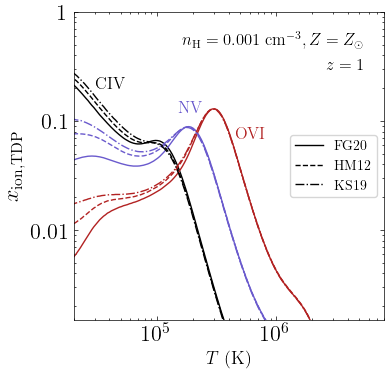

In [118]:
fig, ax = plt.subplots(1,figsize=(4, 4), sharex=True)


# FG20
k = ('isochoric','fg20',1,0,-3,3e6)

ax.plot(T_grid_TDP[k], X_dict_TDP_carb[k]['CIV'], color='black', label='FG20')
ax.text(3e4, 0.2, 'CIV', color='black', fontsize=12)

ax.plot(T_grid_TDP[k], X_dict_TDP_nit[k]['NV'], color='slateblue')
ax.text(1.5e5, 0.12, 'NV', color='slateblue', fontsize=12)

ax.plot(T_grid_TDP[k], X_dict_TDP_oxy[k]['OVI'], color='firebrick')
ax.text(4.5e5, 0.07, 'OVI', color='firebrick', fontsize=12)

k = ('isochoric','hm12',1,0,-3,3e6)

ax.plot(T_grid_TDP[k], X_dict_TDP_carb[k]['CIV'], linestyle='--', color='black', label='HM12')
ax.plot(T_grid_TDP[k], X_dict_TDP_nit[k]['NV'], linestyle='--', color='slateblue')
ax.plot(T_grid_TDP[k], X_dict_TDP_oxy[k]['OVI'], linestyle='--', color='firebrick')

k = ('isochoric','ks19',1,0,-3,3e6)

ax.plot(T_grid_TDP[k], X_dict_TDP_carb[k]['CIV'], linestyle='-.', color='black', label='KS19')
ax.plot(T_grid_TDP[k], X_dict_TDP_nit[k]['NV'], linestyle='-.', color='slateblue')
ax.plot(T_grid_TDP[k], X_dict_TDP_oxy[k]['OVI'], linestyle='-.', color='firebrick')


ax.set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)
ax.set_ylabel(r'$x_\mathrm{ion, TDP}$')

ax.set_yscale('log')
ax.set_yticks([1e-2, 1e-1,1], ['0.01', '0.1','1'])

plt.subplots_adjust(wspace=0.3, hspace=0.2)

ax.set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)
ax.set_ylabel(r'$x_\mathrm{ion, TDP}$')
ax.set_ylim(1.5e-3, 1)
ax.set_xlim(2e4,8e6)

ax.set_xscale('log')
ax.set_yscale('log')
ax.set_yticks([0.01, 0.1,1], ['0.01', '0.1','1'])

ax.text(5.5e6,0.5,r'$n_\mathrm{H} = 0.001 \ \mathrm{cm}^{-3}, Z=Z_\odot$', horizontalalignment='right', fontsize=12)
ax.text(5.5e6,0.3,r'$z=1$', horizontalalignment='right', fontsize=12)

#ax_label.set_title('Systematic variations in TDP using different UVBs', fontsize=16)

ax.legend(fontsize=10, loc='center right')

plt.savefig(rootdir+'Figures/TDP_UVB_vary_sub.pdf', dpi=300)
plt.savefig(rootdir+'Figures/TDP_UVB_vary_sub.png', dpi=300)

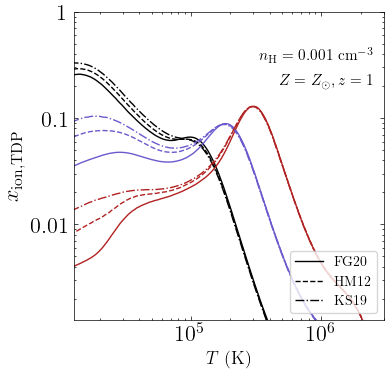

In [119]:
fig, ax = plt.subplots(1, figsize=(4, 4), sharex=True)

# FG20
k = ('isochoric','fg20',1,0,-3,3e6)

ax.plot(T_grid_TDP[k], X_dict_TDP_carb[k]['CIV'], color='black', label='FG20')
ax.plot(T_grid_TDP[k], X_dict_TDP_nit[k]['NV'], color='slateblue')
ax.plot(T_grid_TDP[k], X_dict_TDP_oxy[k]['OVI'], color='firebrick')

k = ('isochoric','hm12',1,0,-3,3e6)

ax.plot(T_grid_TDP[k], X_dict_TDP_carb[k]['CIV'], linestyle='--', color='black', label='HM12')
ax.plot(T_grid_TDP[k], X_dict_TDP_nit[k]['NV'], linestyle='--', color='slateblue')
ax.plot(T_grid_TDP[k], X_dict_TDP_oxy[k]['OVI'], linestyle='--', color='firebrick')

k = ('isochoric','ks19',1,0,-3,3e6)

ax.plot(T_grid_TDP[k], X_dict_TDP_carb[k]['CIV'], linestyle='-.', color='black', label='KS19')
ax.plot(T_grid_TDP[k], X_dict_TDP_nit[k]['NV'], linestyle='-.', color='slateblue')
ax.plot(T_grid_TDP[k], X_dict_TDP_oxy[k]['OVI'], linestyle='-.', color='firebrick')


ax.text(2.5e6, 3.5e-1, r'$n_\mathrm{H} = 0.001 \ \mathrm{cm}^{-3}$', fontsize=11, horizontalalignment='right')
ax.text(2.5e6, 2e-1, r'$Z=Z_\odot, z=1$', fontsize=11, horizontalalignment='right')
ax.set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)
ax.set_ylabel(r'$x_\mathrm{ion, TDP}$')
ax.legend(fontsize=10, loc='lower right')
ax.set_xlim(10**4.1,3*10**6)
ax.set_ylim(10**-2.9, 1)
ax.set_xscale('log')
ax.set_yscale('log')

ax.set_yticks([0.01, 0.1,1], ['0.01', '0.1','1'])

#plt.savefig(rootdir+'Figures/TDP_UVB_vary.pdf', dpi=300)
#plt.savefig(rootdir+'Figures/TDP_UVB_vary.png', dpi=300)

In [120]:
X_dict_TDP_ks19_carb_interp = {}
X_dict_TDP_ks19_nit_interp = {}
X_dict_TDP_ks19_oxy_interp = {}

In [121]:
# HM12
k1 = ('isochoric','ks19',1,0,-2,3e6)
k2 = ('isochoric','hm12',1,0,-2,3e6)
X_dict_TDP_ks19_carb_interp[k2], X_dict_TDP_ks19_nit_interp[k2], X_dict_TDP_ks19_oxy_interp[k2] = interp_ion_frac(T_grid_TDP[k1], 
                                                                                                            T_grid_TDP[k2], 
                                                                                                            X_dict_TDP_carb[k2], 
                                                                                                            X_dict_TDP_nit[k2], 
                                                                                                            X_dict_TDP_oxy[k2])

k1 = ('isochoric','ks19',1,0,-3,3e6)
k2 = ('isochoric','hm12',1,0,-3,3e6)
X_dict_TDP_ks19_carb_interp[k2], X_dict_TDP_ks19_nit_interp[k2], X_dict_TDP_ks19_oxy_interp[k2] = interp_ion_frac(T_grid_TDP[k1], 
                                                                                                            T_grid_TDP[k2], 
                                                                                                            X_dict_TDP_carb[k2], 
                                                                                                            X_dict_TDP_nit[k2], 
                                                                                                            X_dict_TDP_oxy[k2])

k1 = ('isochoric','ks19',1,0,-4,3e6)
k2 = ('isochoric','hm12',1,0,-4,3e6)
X_dict_TDP_ks19_carb_interp[k2], X_dict_TDP_ks19_nit_interp[k2], X_dict_TDP_ks19_oxy_interp[k2] = interp_ion_frac(T_grid_TDP[k1], 
                                                                                                            T_grid_TDP[k2], 
                                                                                                            X_dict_TDP_carb[k2], 
                                                                                                            X_dict_TDP_nit[k2], 
                                                                                                            X_dict_TDP_oxy[k2])

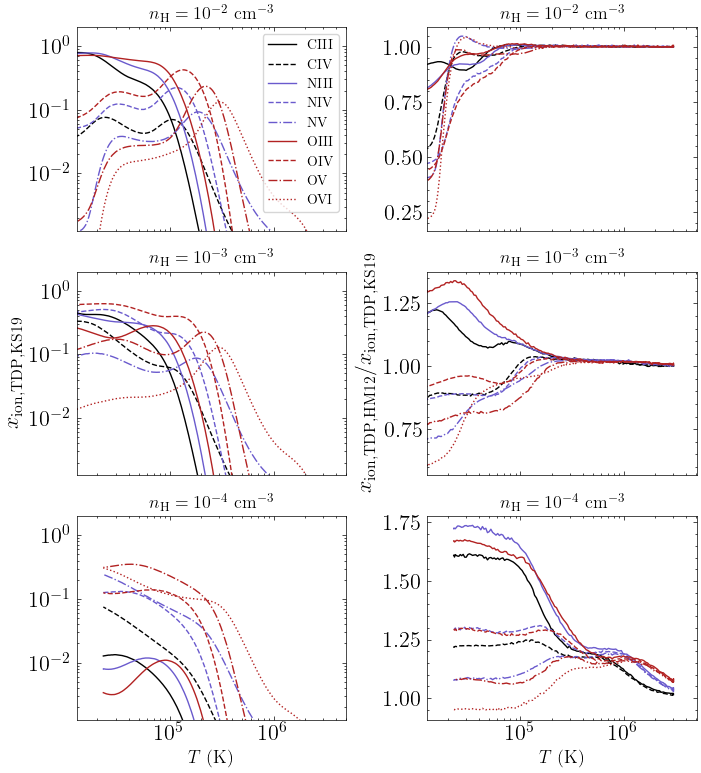

In [122]:
fig, axes = plt.subplots(3, 2, figsize=(4*2, 3*3), sharex=True)

# KS19
k = ('isochoric','ks19',1,0,-2,3e6)
plot_ion_frac_select(axes[0,0], T_grid_TDP[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k])
axes[0,0].set_title(r'$n_\mathrm{H} = 10^{-2} \ \mathrm{cm}^{-3}$', fontsize=13)
axes[0,0].legend(fontsize=10)
axes[0,0].set_xlim(10**4.1,10**6.7)
axes[0,0].set_ylim(10**-2.9, 10**0.3)
axes[0,0].set_xscale('log')
axes[0,0].set_yscale('log')

k = ('isochoric','ks19',1,0,-3,3e6)
plot_ion_frac_select(axes[1,0], T_grid_TDP[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k])
axes[1,0].set_title(r'$n_\mathrm{H} = 10^{-3} \ \mathrm{cm}^{-3}$', fontsize=13)
axes[1,0].set_ylabel(r'$x_\mathrm{ion, TDP, KS19}$')
axes[1,0].set_xlim(10**4.1,10**6.7)
axes[1,0].set_ylim(10**-2.9, 10**0.3)
axes[1,0].set_xscale('log')
axes[1,0].set_yscale('log')

k = ('isochoric','ks19',1,0,-4,3e6)
plot_ion_frac_select(axes[2,0], T_grid_TDP[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k])
axes[2,0].set_title(r'$n_\mathrm{H} = 10^{-4} \ \mathrm{cm}^{-3}$', fontsize=13)
axes[2,0].set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)
axes[2,0].set_xlim(10**4.1,10**6.7)
axes[2,0].set_ylim(10**-2.9, 10**0.3)
axes[2,0].set_xscale('log')
axes[2,0].set_yscale('log')

# HM12 vs KS19
k1 = ('isochoric','ks19',1,0,-2,3e6)
k2 = ('isochoric','hm12',1,0,-2,3e6)
plot_ion_frac_ratio_select(axes[0,1], T_grid_TDP[k1], 
                           X_dict_TDP_carb[k1], X_dict_TDP_nit[k1], X_dict_TDP_oxy[k1],
                           X_dict_TDP_ks19_carb_interp[k2], X_dict_TDP_ks19_nit_interp[k2], X_dict_TDP_ks19_oxy_interp[k2])

axes[0,1].set_title(r'$n_\mathrm{H} = 10^{-2} \ \mathrm{cm}^{-3}$', fontsize=13)

axes[0,1].set_xscale('log')
#axes[0,1].set_yscale('log')

k1 = ('isochoric','ks19',1,0,-3,3e6)
k2 = ('isochoric','hm12',1,0,-3,3e6)
plot_ion_frac_ratio_select(axes[1,1], T_grid_TDP[k1], 
                           X_dict_TDP_carb[k1], X_dict_TDP_nit[k1], X_dict_TDP_oxy[k1],
                           X_dict_TDP_ks19_carb_interp[k2], X_dict_TDP_ks19_nit_interp[k2], X_dict_TDP_ks19_oxy_interp[k2])

axes[1,1].set_title(r'$n_\mathrm{H} = 10^{-3} \ \mathrm{cm}^{-3}$', fontsize=13)
axes[1,1].set_ylabel(r'$x_\mathrm{ion, TDP, HM12}/x_\mathrm{ion, TDP, KS19}$')


k1 = ('isochoric','ks19',1,0,-4,3e6)
k2 = ('isochoric','hm12',1,0,-4,3e6)
plot_ion_frac_ratio_select(axes[2,1], T_grid_TDP[k1], 
                           X_dict_TDP_carb[k1], X_dict_TDP_nit[k1], X_dict_TDP_oxy[k1],
                           X_dict_TDP_ks19_carb_interp[k2], X_dict_TDP_ks19_nit_interp[k2], X_dict_TDP_ks19_oxy_interp[k2])


axes[2,1].set_title(r'$n_\mathrm{H} = 10^{-4} \ \mathrm{cm}^{-3}$', fontsize=13)
axes[2,1].set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)

plt.subplots_adjust(wspace=0.3, hspace=0.2)

## Comparison for fixed ionization parameter

In [123]:
def get_TDP_frac_U(k):
    
    proc, uvb, z, log_metals, logU, T0 = k
    T0_str = ('%.0e'%T0).replace('+','').replace('0','')

    # Load directory
    loaddir = rootdir+'cloudy_grids/non_eqm_models/PI/TDP_{}/{}/z={}/log_metals={}/logU={}/T0={}K/'.format(proc,
                                                                                                      uvb, 
                                                                                                      str(z),
                                                                                                      str(log_metals), 
                                                                                                      str(logU), T0_str)
    
    # Temperature
    f = open(loaddir+'cd-cool-1keV.tim', 'r')
    L = f.readlines()
    f.close()

    T_grid_TDP = np.array([L[i].split('\t')[4] for i in range(1, len(L))], dtype=float)

    # Hydrogen

    X_dict_TDP_hyd = {k:np.zeros(len(T_grid_TDP)) for k in H_list}

    f = open(loaddir+'cd-cool-1keV.hyd', 'r')
    L = f.readlines()
    f.close()

    for s in H_list:
        for i in range(len(T_grid_TDP)):
            X_dict_TDP_hyd[s][i] = float(L[i+1].split('\t')[H_list.index(s)+1])
 
    # Carbon

    X_dict_TDP_carb = {k:np.zeros(len(T_grid_TDP)) for k in C_list}

    f = open(loaddir+'cd-cool-1keV.carb', 'r')
    L = f.readlines()
    f.close()

    for s in C_list:
        for i in range(len(T_grid_TDP)):
            X_dict_TDP_carb[s][i] = float(L[i+1].split('\t')[C_list.index(s)+1])
            
    # Nitrogen

    X_dict_TDP_nit = {k:np.zeros(len(T_grid_TDP)) for k in N_list}

    f = open(loaddir+'cd-cool-1keV.nit', 'r')
    L = f.readlines()
    f.close()

    for s in N_list:
        for i in range(len(T_grid_TDP)):
            X_dict_TDP_nit[s][i] = float(L[i+1].split('\t')[N_list.index(s)+1])
            
    # Oxygen

    X_dict_TDP_oxy = {k:np.zeros(len(T_grid_TDP)) for k in O_list}

    f = open(loaddir+'cd-cool-1keV.oxy', 'r')
    L = f.readlines()
    f.close()

    for s in O_list:
        for i in range(len(T_grid_TDP)):
            X_dict_TDP_oxy[s][i] = float(L[i+1].split('\t')[O_list.index(s)+1])
            
    return T_grid_TDP, X_dict_TDP_hyd, X_dict_TDP_carb, X_dict_TDP_nit, X_dict_TDP_oxy

Load ion fractions

In [124]:
T_grid_TDP_U = {}
X_dict_TDP_U_hyd = {}
X_dict_TDP_U_carb = {}
X_dict_TDP_U_nit = {}
X_dict_TDP_U_oxy = {}

In [125]:
# FG20
k = ('isochoric','fg20',1,0.0,-3.07,3e6)
T_grid_TDP_U[k], X_dict_TDP_U_hyd[k], X_dict_TDP_U_carb[k], X_dict_TDP_U_nit[k], X_dict_TDP_U_oxy[k] = get_TDP_frac_U(k)

k = ('isochoric','fg20',1,0.0,-2.07,3e6)
T_grid_TDP_U[k], X_dict_TDP_U_hyd[k], X_dict_TDP_U_carb[k], X_dict_TDP_U_nit[k], X_dict_TDP_U_oxy[k] = get_TDP_frac_U(k)

k = ('isochoric','fg20',1,0.0,-1.07,3e6)
T_grid_TDP_U[k], X_dict_TDP_U_hyd[k], X_dict_TDP_U_carb[k], X_dict_TDP_U_nit[k], X_dict_TDP_U_oxy[k] = get_TDP_frac_U(k)

# HM12
k = ('isochoric','hm12',1,0.0,-3.07,3e6)
T_grid_TDP_U[k], X_dict_TDP_U_hyd[k], X_dict_TDP_U_carb[k], X_dict_TDP_U_nit[k], X_dict_TDP_U_oxy[k] = get_TDP_frac_U(k)

k = ('isochoric','hm12',1,0.0,-2.07,3e6)
T_grid_TDP_U[k], X_dict_TDP_U_hyd[k], X_dict_TDP_U_carb[k], X_dict_TDP_U_nit[k], X_dict_TDP_U_oxy[k] = get_TDP_frac_U(k)

k = ('isochoric','hm12',1,0.0,-1.07,3e6)
T_grid_TDP_U[k], X_dict_TDP_U_hyd[k], X_dict_TDP_U_carb[k], X_dict_TDP_U_nit[k], X_dict_TDP_U_oxy[k] = get_TDP_frac_U(k)

# KS19
k = ('isochoric','ks19',1,0.0,-3.07,3e6)
T_grid_TDP_U[k], X_dict_TDP_U_hyd[k], X_dict_TDP_U_carb[k], X_dict_TDP_U_nit[k], X_dict_TDP_U_oxy[k] = get_TDP_frac_U(k)

k = ('isochoric','ks19',1,0.0,-2.07,3e6)
T_grid_TDP_U[k], X_dict_TDP_U_hyd[k], X_dict_TDP_U_carb[k], X_dict_TDP_U_nit[k], X_dict_TDP_U_oxy[k] = get_TDP_frac_U(k)

k = ('isochoric','ks19',1,0.0,-1.07,3e6)
T_grid_TDP_U[k], X_dict_TDP_U_hyd[k], X_dict_TDP_U_carb[k], X_dict_TDP_U_nit[k], X_dict_TDP_U_oxy[k] = get_TDP_frac_U(k)

Interpolate HM12 and KS19 along FG20

In [126]:
X_dict_TDP_U_carb_interp = {}
X_dict_TDP_U_nit_interp = {}
X_dict_TDP_U_oxy_interp = {}

In [127]:
# HM12
k1 = ('isochoric','fg20',1,0,-3.07,3e6)
k2 = ('isochoric','hm12',1,0,-3.07,3e6)
X_dict_TDP_U_carb_interp[k2], X_dict_TDP_U_nit_interp[k2], X_dict_TDP_U_oxy_interp[k2] = interp_ion_frac(T_grid_TDP_U[k1], 
                                                                                                            T_grid_TDP_U[k2], 
                                                                                                            X_dict_TDP_U_carb[k2], 
                                                                                                            X_dict_TDP_U_nit[k2], 
                                                                                                            X_dict_TDP_U_oxy[k2])

k1 = ('isochoric','fg20',1,0,-2.07,3e6)
k2 = ('isochoric','hm12',1,0,-2.07,3e6)
X_dict_TDP_U_carb_interp[k2], X_dict_TDP_U_nit_interp[k2], X_dict_TDP_U_oxy_interp[k2] = interp_ion_frac(T_grid_TDP_U[k1], 
                                                                                                            T_grid_TDP_U[k2], 
                                                                                                            X_dict_TDP_U_carb[k2], 
                                                                                                            X_dict_TDP_U_nit[k2], 
                                                                                                            X_dict_TDP_U_oxy[k2])

k1 = ('isochoric','fg20',1,0,-1.07,3e6)
k2 = ('isochoric','hm12',1,0,-1.07,3e6)
X_dict_TDP_U_carb_interp[k2], X_dict_TDP_U_nit_interp[k2], X_dict_TDP_U_oxy_interp[k2] = interp_ion_frac(T_grid_TDP_U[k1], 
                                                                                                            T_grid_TDP_U[k2], 
                                                                                                            X_dict_TDP_U_carb[k2], 
                                                                                                            X_dict_TDP_U_nit[k2], 
                                                                                                            X_dict_TDP_U_oxy[k2])
# KS19
k1 = ('isochoric','fg20',1,0,-3.07,3e6)
k2 = ('isochoric','ks19',1,0,-3.07,3e6)
X_dict_TDP_U_carb_interp[k2], X_dict_TDP_U_nit_interp[k2], X_dict_TDP_U_oxy_interp[k2] = interp_ion_frac(T_grid_TDP_U[k1], 
                                                                                                            T_grid_TDP_U[k2], 
                                                                                                            X_dict_TDP_U_carb[k2], 
                                                                                                            X_dict_TDP_U_nit[k2], 
                                                                                                            X_dict_TDP_U_oxy[k2])

k1 = ('isochoric','fg20',1,0,-2.07,3e6)
k2 = ('isochoric','ks19',1,0,-2.07,3e6)
X_dict_TDP_U_carb_interp[k2], X_dict_TDP_U_nit_interp[k2], X_dict_TDP_U_oxy_interp[k2] = interp_ion_frac(T_grid_TDP_U[k1], 
                                                                                                            T_grid_TDP_U[k2], 
                                                                                                            X_dict_TDP_U_carb[k2], 
                                                                                                            X_dict_TDP_U_nit[k2], 
                                                                                                            X_dict_TDP_U_oxy[k2])

k1 = ('isochoric','fg20',1,0,-1.07,3e6)
k2 = ('isochoric','ks19',1,0,-1.07,3e6)
X_dict_TDP_U_carb_interp[k2], X_dict_TDP_U_nit_interp[k2], X_dict_TDP_U_oxy_interp[k2] = interp_ion_frac(T_grid_TDP_U[k1], 
                                                                                                            T_grid_TDP_U[k2], 
                                                                                                            X_dict_TDP_U_carb[k2], 
                                                                                                            X_dict_TDP_U_nit[k2], 
                                                                                                            X_dict_TDP_U_oxy[k2])

Make plots

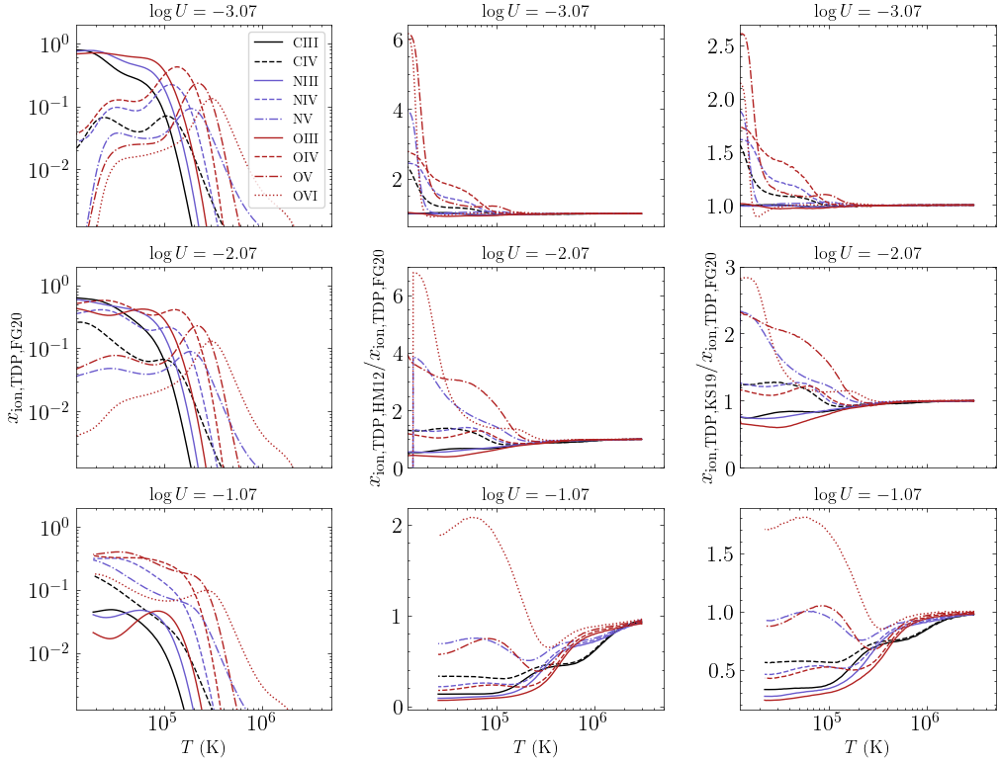

In [128]:
fig, axes = plt.subplots(3, 3, figsize=(4*3, 3*3), sharex=True)

# FG20

k = ('isochoric','fg20',1,0,-3.07,3e6)
plot_ion_frac_select(axes[0,0], T_grid_TDP_U[k], X_dict_TDP_U_carb[k], X_dict_TDP_U_nit[k], X_dict_TDP_U_oxy[k])
axes[0,0].set_title(r'$\log U = -3.07$', fontsize=13)

axes[0,0].legend(fontsize=10)

axes[0,0].set_xscale('log')
axes[0,0].set_yscale('log')
axes[0,0].set_xlim(10**4.1,10**6.7)
axes[0,0].set_ylim(10**-2.9, 10**0.3)

k = ('isochoric','fg20',1,0,-2.07,3e6)
plot_ion_frac_select(axes[1,0], T_grid_TDP_U[k], X_dict_TDP_U_carb[k], X_dict_TDP_U_nit[k], X_dict_TDP_U_oxy[k])
axes[1,0].set_title(r'$\log U = -2.07$', fontsize=13)
axes[1,0].set_ylabel(r'$x_\mathrm{ion, TDP, FG20}$')

axes[1,0].set_xscale('log')
axes[1,0].set_yscale('log')
axes[1,0].set_xlim(10**4.1,10**6.7)
axes[1,0].set_ylim(10**-2.9, 10**0.3)

k = ('isochoric','fg20',1,0,-1.07,3e6)
plot_ion_frac_select(axes[2,0], T_grid_TDP_U[k], X_dict_TDP_U_carb[k], X_dict_TDP_U_nit[k], X_dict_TDP_U_oxy[k])
axes[2,0].set_title(r'$\log U = -1.07$', fontsize=13)

axes[2,0].set_xscale('log')
axes[2,0].set_yscale('log')
axes[2,0].set_xlim(10**4.1,10**6.7)
axes[2,0].set_ylim(10**-2.9, 10**0.3)

# HM12 vs FG20
k1 = ('isochoric','fg20',1,0,-3.07,3e6)
k2 = ('isochoric','hm12',1,0,-3.07,3e6)
plot_ion_frac_ratio_select(axes[0,1], T_grid_TDP_U[k1], 
                           X_dict_TDP_U_carb[k1], X_dict_TDP_U_nit[k1], X_dict_TDP_U_oxy[k1],
                           X_dict_TDP_U_carb_interp[k2], X_dict_TDP_U_nit_interp[k2], X_dict_TDP_U_oxy_interp[k2])

axes[0,1].set_title(r'$\log U = -3.07$', fontsize=13)
axes[2,0].set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)


axes[0,1].set_xscale('log')
#axes[0,1].set_yscale('log')

k1 = ('isochoric','fg20',1,0,-2.07,3e6)
k2 = ('isochoric','hm12',1,0,-2.07,3e6)
plot_ion_frac_ratio_select(axes[1,1], T_grid_TDP_U[k1], 
                           X_dict_TDP_U_carb[k1], X_dict_TDP_U_nit[k1], X_dict_TDP_U_oxy[k1],
                           X_dict_TDP_U_carb_interp[k2], X_dict_TDP_U_nit_interp[k2], X_dict_TDP_U_oxy_interp[k2])

axes[1,1].set_ylim(0,7)
axes[1,1].set_title(r'$\log U = -2.07$', fontsize=13)
axes[1,1].set_ylabel(r'$x_\mathrm{ion, TDP, HM12}/x_\mathrm{ion, TDP, FG20}$')


k1 = ('isochoric','fg20',1,0,-1.07,3e6)
k2 = ('isochoric','hm12',1,0,-1.07,3e6)
plot_ion_frac_ratio_select(axes[2,1], T_grid_TDP_U[k1], 
                           X_dict_TDP_U_carb[k1], X_dict_TDP_U_nit[k1], X_dict_TDP_U_oxy[k1],
                           X_dict_TDP_U_carb_interp[k2], X_dict_TDP_U_nit_interp[k2], X_dict_TDP_U_oxy_interp[k2])

axes[2,1].set_title(r'$\log U = -1.07$', fontsize=13)
axes[2,1].set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)

# KS19 vs FG20
k1 = ('isochoric','fg20',1,0,-3.07,3e6)
k2 = ('isochoric','ks19',1,0,-3.07,3e6)
plot_ion_frac_ratio_select(axes[0,2], T_grid_TDP_U[k1], 
                           X_dict_TDP_U_carb[k1], X_dict_TDP_U_nit[k1], X_dict_TDP_U_oxy[k1],
                           X_dict_TDP_U_carb_interp[k2], X_dict_TDP_U_nit_interp[k2], X_dict_TDP_U_oxy_interp[k2])

axes[0,2].set_title(r'$\log U = -3.07$', fontsize=13)


axes[0,2].set_xscale('log')
#axes[0,2].set_yscale('log')

k1 = ('isochoric','fg20',1,0,-2.07,3e6)
k2 = ('isochoric','ks19',1,0,-2.07,3e6)
plot_ion_frac_ratio_select(axes[1,2], T_grid_TDP_U[k1], 
                           X_dict_TDP_U_carb[k1], X_dict_TDP_U_nit[k1], X_dict_TDP_U_oxy[k1],
                           X_dict_TDP_U_carb_interp[k2], X_dict_TDP_U_nit_interp[k2], X_dict_TDP_U_oxy_interp[k2])

axes[1,2].set_ylim(0,3)
axes[1,2].set_title(r'$\log U = -2.07$', fontsize=13)
axes[1,2].set_ylabel(r'$x_\mathrm{ion, TDP, KS19}/x_\mathrm{ion, TDP, FG20}$')


k1 = ('isochoric','fg20',1,0,-1.07,3e6)
k2 = ('isochoric','ks19',1,0,-1.07,3e6)
plot_ion_frac_ratio_select(axes[2,2], T_grid_TDP_U[k1], 
                           X_dict_TDP_U_carb[k1], X_dict_TDP_U_nit[k1], X_dict_TDP_U_oxy[k1],
                           X_dict_TDP_U_carb_interp[k2], X_dict_TDP_U_nit_interp[k2], X_dict_TDP_U_oxy_interp[k2])

axes[2,2].set_title(r'$\log U = -1.07$', fontsize=13)
axes[2,2].set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)

plt.subplots_adjust(wspace=0.3, hspace=0.2)

In [129]:
X_dict_TDP_U_ks19_carb_interp = {}
X_dict_TDP_U_ks19_nit_interp = {}
X_dict_TDP_U_ks19_oxy_interp = {}

In [130]:
# HM12 on KS19
k1 = ('isochoric','ks19',1,0,-3.07,3e6)
k2 = ('isochoric','hm12',1,0,-3.07,3e6)
X_dict_TDP_U_ks19_carb_interp[k2], X_dict_TDP_U_ks19_nit_interp[k2], X_dict_TDP_U_ks19_oxy_interp[k2] = interp_ion_frac(T_grid_TDP_U[k1], 
                                                                                                            T_grid_TDP_U[k2], 
                                                                                                            X_dict_TDP_U_carb[k2], 
                                                                                                            X_dict_TDP_U_nit[k2], 
                                                                                                            X_dict_TDP_U_oxy[k2])
k1 = ('isochoric','ks19',1,0,-2.07,3e6)
k2 = ('isochoric','hm12',1,0,-2.07,3e6)
X_dict_TDP_U_ks19_carb_interp[k2], X_dict_TDP_U_ks19_nit_interp[k2], X_dict_TDP_U_ks19_oxy_interp[k2] = interp_ion_frac(T_grid_TDP_U[k1], 
                                                                                                            T_grid_TDP_U[k2], 
                                                                                                            X_dict_TDP_U_carb[k2], 
                                                                                                            X_dict_TDP_U_nit[k2], 
                                                                                                            X_dict_TDP_U_oxy[k2])
k1 = ('isochoric','ks19',1,0,-1.07,3e6)
k2 = ('isochoric','hm12',1,0,-1.07,3e6)
X_dict_TDP_U_ks19_carb_interp[k2], X_dict_TDP_U_ks19_nit_interp[k2], X_dict_TDP_U_ks19_oxy_interp[k2] = interp_ion_frac(T_grid_TDP_U[k1], 
                                                                                                            T_grid_TDP_U[k2], 
                                                                                                            X_dict_TDP_U_carb[k2], 
                                                                                                            X_dict_TDP_U_nit[k2], 
                                                                                                            X_dict_TDP_U_oxy[k2])

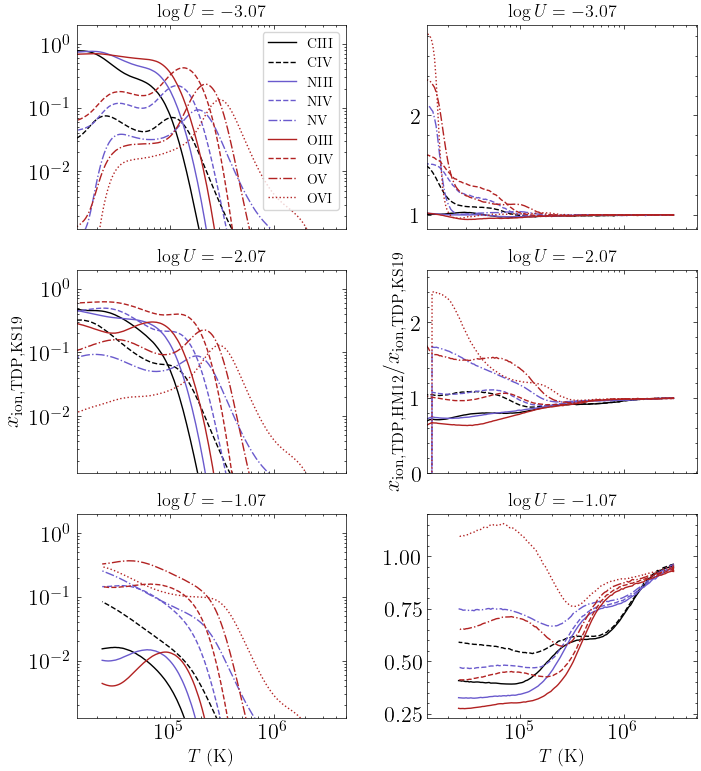

In [131]:
fig, axes = plt.subplots(3, 2, figsize=(4*2, 3*3), sharex=True)

# KS19

k = ('isochoric','ks19',1,0,-3.07,3e6)
plot_ion_frac_select(axes[0,0], T_grid_TDP_U[k], X_dict_TDP_U_carb[k], X_dict_TDP_U_nit[k], X_dict_TDP_U_oxy[k])
axes[0,0].set_title(r'$\log U = -3.07$', fontsize=13)

axes[0,0].legend(fontsize=10)

axes[0,0].set_xscale('log')
axes[0,0].set_yscale('log')
axes[0,0].set_xlim(10**4.1,10**6.7)
axes[0,0].set_ylim(10**-2.9, 10**0.3)

k = ('isochoric','ks19',1,0,-2.07,3e6)
plot_ion_frac_select(axes[1,0], T_grid_TDP_U[k], X_dict_TDP_U_carb[k], X_dict_TDP_U_nit[k], X_dict_TDP_U_oxy[k])
axes[1,0].set_title(r'$\log U = -2.07$', fontsize=13)
axes[1,0].set_ylabel(r'$x_\mathrm{ion, TDP, KS19}$')

axes[1,0].set_xscale('log')
axes[1,0].set_yscale('log')
axes[1,0].set_xlim(10**4.1,10**6.7)
axes[1,0].set_ylim(10**-2.9, 10**0.3)

k = ('isochoric','ks19',1,0,-1.07,3e6)
plot_ion_frac_select(axes[2,0], T_grid_TDP_U[k], X_dict_TDP_U_carb[k], X_dict_TDP_U_nit[k], X_dict_TDP_U_oxy[k])
axes[2,0].set_title(r'$\log U = -1.07$', fontsize=13)

axes[2,0].set_xscale('log')
axes[2,0].set_yscale('log')
axes[2,0].set_xlim(10**4.1,10**6.7)
axes[2,0].set_ylim(10**-2.9, 10**0.3)

# HM12 vs KS19
k1 = ('isochoric','ks19',1,0,-3.07,3e6)
k2 = ('isochoric','hm12',1,0,-3.07,3e6)
plot_ion_frac_ratio_select(axes[0,1], T_grid_TDP_U[k1], 
                           X_dict_TDP_U_carb[k1], X_dict_TDP_U_nit[k1], X_dict_TDP_U_oxy[k1],
                           X_dict_TDP_U_ks19_carb_interp[k2], X_dict_TDP_U_ks19_nit_interp[k2], X_dict_TDP_U_ks19_oxy_interp[k2])

axes[0,1].set_title(r'$\log U = -3.07$', fontsize=13)
axes[2,0].set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)


axes[0,1].set_xscale('log')
#axes[0,1].set_yscale('log')

k1 = ('isochoric','ks19',1,0,-2.07,3e6)
k2 = ('isochoric','hm12',1,0,-2.07,3e6)
plot_ion_frac_ratio_select(axes[1,1], T_grid_TDP_U[k1], 
                           X_dict_TDP_U_carb[k1], X_dict_TDP_U_nit[k1], X_dict_TDP_U_oxy[k1],
                           X_dict_TDP_U_ks19_carb_interp[k2], X_dict_TDP_U_ks19_nit_interp[k2], X_dict_TDP_U_ks19_oxy_interp[k2])

axes[1,1].set_ylim(0,2.7)
axes[1,1].set_title(r'$\log U = -2.07$', fontsize=13)
axes[1,1].set_ylabel(r'$x_\mathrm{ion, TDP, HM12}/x_\mathrm{ion, TDP, KS19}$')


k1 = ('isochoric','ks19',1,0,-1.07,3e6)
k2 = ('isochoric','hm12',1,0,-1.07,3e6)
plot_ion_frac_ratio_select(axes[2,1], T_grid_TDP_U[k1], 
                           X_dict_TDP_U_carb[k1], X_dict_TDP_U_nit[k1], X_dict_TDP_U_oxy[k1],
                           X_dict_TDP_U_ks19_carb_interp[k2], X_dict_TDP_U_ks19_nit_interp[k2], X_dict_TDP_U_ks19_oxy_interp[k2])

axes[2,1].set_title(r'$\log U = -1.07$', fontsize=13)
axes[2,1].set_xlabel(r'$T \ (\mathrm{K})$', fontsize=13)

plt.subplots_adjust(wspace=0.3, hspace=0.2)

# TDP - varying initial temperature (FG20)

In [132]:
# FG20, remaining initial temperatures

# 1e8 K
k = ('isochoric','fg20',1,0.0,-2.0,1e8)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

k = ('isochoric','fg20',1,0.0,-3.0,1e8)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

k = ('isochoric','fg20',1,0.0,-4.0,1e8)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

# 1e7 K
k = ('isochoric','fg20',1,0.0,-2.0,1e7)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

k = ('isochoric','fg20',1,0.0,-3.0,1e7)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

k = ('isochoric','fg20',1,0.0,-4.0,1e7)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

# 3e6 K
k = ('isochoric','fg20',1,0.0,-2.0,3e6)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

k = ('isochoric','fg20',1,0.0,-3.0,3e6)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

k = ('isochoric','fg20',1,0.0,-4.0,3e6)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

# 1e6 K
k = ('isochoric','fg20',1,0.0,-2.0,1e6)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

k = ('isochoric','fg20',1,0.0,-3.0,1e6)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

k = ('isochoric','fg20',1,0.0,-4.0,1e6)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

# 2e5 K
k = ('isochoric','fg20',1,0.0,-2.0,2e5)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

k = ('isochoric','fg20',1,0.0,-3.0,2e5)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

k = ('isochoric','fg20',1,0.0,-4.0,2e5)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

# 7e4 K
k = ('isochoric','fg20',1,0.0,-3.0,7e4)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

# 5e4 K
k = ('isochoric','fg20',1,0.0,-3.0,5e4)
T_grid_TDP[k], X_dict_TDP_hyd[k], X_dict_TDP_carb[k], X_dict_TDP_nit[k], X_dict_TDP_oxy[k] = get_TDP_frac(k)

Evaluate at 3e4K

In [133]:
X_interp_TDP_fg20_carb = {}
X_interp_TDP_fg20_nit = {}
X_interp_TDP_fg20_oxy = {}

In [134]:
T_eval = 3e4

In [135]:
# dens -2

# T0 = 1e8K
k = (-2,1e8)
k1 = ('isochoric','fg20',1,0,-2,1e8)
X_interp_TDP_fg20_carb[k], X_interp_TDP_fg20_nit[k], X_interp_TDP_fg20_oxy[k] = eval_ion_frac(T_eval, 
                                                                                           T_grid_TDP[k1], 
                                                                                           X_dict_TDP_carb[k1], 
                                                                                           X_dict_TDP_nit[k1], 
                                                                                           X_dict_TDP_oxy[k1])

# T0 = 1e8K
k = (-2,1e7)
k1 = ('isochoric','fg20',1,0,-2,1e7)
X_interp_TDP_fg20_carb[k], X_interp_TDP_fg20_nit[k], X_interp_TDP_fg20_oxy[k] = eval_ion_frac(T_eval, 
                                                                                           T_grid_TDP[k1], 
                                                                                           X_dict_TDP_carb[k1], 
                                                                                           X_dict_TDP_nit[k1], 
                                                                                           X_dict_TDP_oxy[k1])

# T0 = 3e6K
k = (-2,3e6)
k1 = ('isochoric','fg20',1,0,-2,3e6)
X_interp_TDP_fg20_carb[k], X_interp_TDP_fg20_nit[k], X_interp_TDP_fg20_oxy[k] = eval_ion_frac(T_eval, 
                                                                                           T_grid_TDP[k1], 
                                                                                           X_dict_TDP_carb[k1], 
                                                                                           X_dict_TDP_nit[k1], 
                                                                                           X_dict_TDP_oxy[k1])
# T0 = 1e6K
k = (-2,1e6)
k1 = ('isochoric','fg20',1,0,-2,1e6)
X_interp_TDP_fg20_carb[k], X_interp_TDP_fg20_nit[k], X_interp_TDP_fg20_oxy[k] = eval_ion_frac(T_eval, 
                                                                                           T_grid_TDP[k1], 
                                                                                           X_dict_TDP_carb[k1], 
                                                                                           X_dict_TDP_nit[k1], 
                                                                                           X_dict_TDP_oxy[k1])
# T0 = 2e5K
k = (-2,2e5)
k1 = ('isochoric','fg20',1,0,-2,2e5)
X_interp_TDP_fg20_carb[k], X_interp_TDP_fg20_nit[k], X_interp_TDP_fg20_oxy[k] = eval_ion_frac(T_eval, 
                                                                                           T_grid_TDP[k1], 
                                                                                           X_dict_TDP_carb[k1], 
                                                                                           X_dict_TDP_nit[k1], 
                                                                                           X_dict_TDP_oxy[k1])

# dens -3

# T0 = 1e8K
k = (-3,1e8)
k1 = ('isochoric','fg20',1,0,-3,1e8)
X_interp_TDP_fg20_carb[k], X_interp_TDP_fg20_nit[k], X_interp_TDP_fg20_oxy[k] = eval_ion_frac(T_eval, 
                                                                                           T_grid_TDP[k1], 
                                                                                           X_dict_TDP_carb[k1], 
                                                                                           X_dict_TDP_nit[k1], 
                                                                                           X_dict_TDP_oxy[k1])

# T0 = 1e7K
k = (-3,1e7)
k1 = ('isochoric','fg20',1,0,-3,1e7)
X_interp_TDP_fg20_carb[k], X_interp_TDP_fg20_nit[k], X_interp_TDP_fg20_oxy[k] = eval_ion_frac(T_eval, 
                                                                                           T_grid_TDP[k1], 
                                                                                           X_dict_TDP_carb[k1], 
                                                                                           X_dict_TDP_nit[k1], 
                                                                                           X_dict_TDP_oxy[k1])

# T0 = 3e6K
k = (-3,3e6)
k1 = ('isochoric','fg20',1,0,-3,3e6)
X_interp_TDP_fg20_carb[k], X_interp_TDP_fg20_nit[k], X_interp_TDP_fg20_oxy[k] = eval_ion_frac(T_eval, 
                                                                                           T_grid_TDP[k1], 
                                                                                           X_dict_TDP_carb[k1], 
                                                                                           X_dict_TDP_nit[k1], 
                                                                                           X_dict_TDP_oxy[k1])
# T0 = 1e6K
k = (-3,1e6)
k1 = ('isochoric','fg20',1,0,-3,1e6)
X_interp_TDP_fg20_carb[k], X_interp_TDP_fg20_nit[k], X_interp_TDP_fg20_oxy[k] = eval_ion_frac(T_eval, 
                                                                                           T_grid_TDP[k1], 
                                                                                           X_dict_TDP_carb[k1], 
                                                                                           X_dict_TDP_nit[k1], 
                                                                                           X_dict_TDP_oxy[k1])
# T0 = 2e5K
k = (-3,2e5)
k1 = ('isochoric','fg20',1,0,-3,2e5)
X_interp_TDP_fg20_carb[k], X_interp_TDP_fg20_nit[k], X_interp_TDP_fg20_oxy[k] = eval_ion_frac(T_eval, 
                                                                                           T_grid_TDP[k1], 
                                                                                           X_dict_TDP_carb[k1], 
                                                                                           X_dict_TDP_nit[k1], 
                                                                                           X_dict_TDP_oxy[k1])

# T0 = 7e4K
k = (-3,7e4)
k1 = ('isochoric','fg20',1,0,-3,7e4)
X_interp_TDP_fg20_carb[k], X_interp_TDP_fg20_nit[k], X_interp_TDP_fg20_oxy[k] = eval_ion_frac(T_eval, 
                                                                                           T_grid_TDP[k1], 
                                                                                           X_dict_TDP_carb[k1], 
                                                                                           X_dict_TDP_nit[k1], 
                                                                                           X_dict_TDP_oxy[k1])
# T0 = 5e4K
k = (-3,5e4)
k1 = ('isochoric','fg20',1,0,-3,5e4)
X_interp_TDP_fg20_carb[k], X_interp_TDP_fg20_nit[k], X_interp_TDP_fg20_oxy[k] = eval_ion_frac(T_eval, 
                                                                                           T_grid_TDP[k1], 
                                                                                           X_dict_TDP_carb[k1], 
                                                                                           X_dict_TDP_nit[k1], 
                                                                                           X_dict_TDP_oxy[k1])

# dens -4

# T0 = 1e8K
k = (-4,1e8)
k1 = ('isochoric','fg20',1,0,-4,1e8)
X_interp_TDP_fg20_carb[k], X_interp_TDP_fg20_nit[k], X_interp_TDP_fg20_oxy[k] = eval_ion_frac(T_eval, 
                                                                                           T_grid_TDP[k1], 
                                                                                           X_dict_TDP_carb[k1], 
                                                                                           X_dict_TDP_nit[k1], 
                                                                                           X_dict_TDP_oxy[k1])

# T0 = 1e7K
k = (-4,1e7)
k1 = ('isochoric','fg20',1,0,-4,1e7)
X_interp_TDP_fg20_carb[k], X_interp_TDP_fg20_nit[k], X_interp_TDP_fg20_oxy[k] = eval_ion_frac(T_eval, 
                                                                                           T_grid_TDP[k1], 
                                                                                           X_dict_TDP_carb[k1], 
                                                                                           X_dict_TDP_nit[k1], 
                                                                                           X_dict_TDP_oxy[k1])

# T0 = 3e6K
k = (-4,3e6)
k1 = ('isochoric','fg20',1,0,-4,3e6)
X_interp_TDP_fg20_carb[k], X_interp_TDP_fg20_nit[k], X_interp_TDP_fg20_oxy[k] = eval_ion_frac(T_eval, 
                                                                                           T_grid_TDP[k1], 
                                                                                           X_dict_TDP_carb[k1], 
                                                                                           X_dict_TDP_nit[k1], 
                                                                                           X_dict_TDP_oxy[k1])
# T0 = 1e6K
k = (-4,1e6)
k1 = ('isochoric','fg20',1,0,-4,1e6)
X_interp_TDP_fg20_carb[k], X_interp_TDP_fg20_nit[k], X_interp_TDP_fg20_oxy[k] = eval_ion_frac(T_eval, 
                                                                                           T_grid_TDP[k1], 
                                                                                           X_dict_TDP_carb[k1], 
                                                                                           X_dict_TDP_nit[k1], 
                                                                                           X_dict_TDP_oxy[k1])
# T0 = 2e5K
k = (-4,2e5)
k1 = ('isochoric','fg20',1,0,-4,2e5)
X_interp_TDP_fg20_carb[k], X_interp_TDP_fg20_nit[k], X_interp_TDP_fg20_oxy[k] = eval_ion_frac(T_eval, 
                                                                                           T_grid_TDP[k1], 
                                                                                           X_dict_TDP_carb[k1], 
                                                                                           X_dict_TDP_nit[k1], 
                                                                                           X_dict_TDP_oxy[k1])

Make plots

Text(0, 0.5, '$x_\\mathrm{ion} (T = 5 \\times 10^4 \\ \\mathrm{K})$')

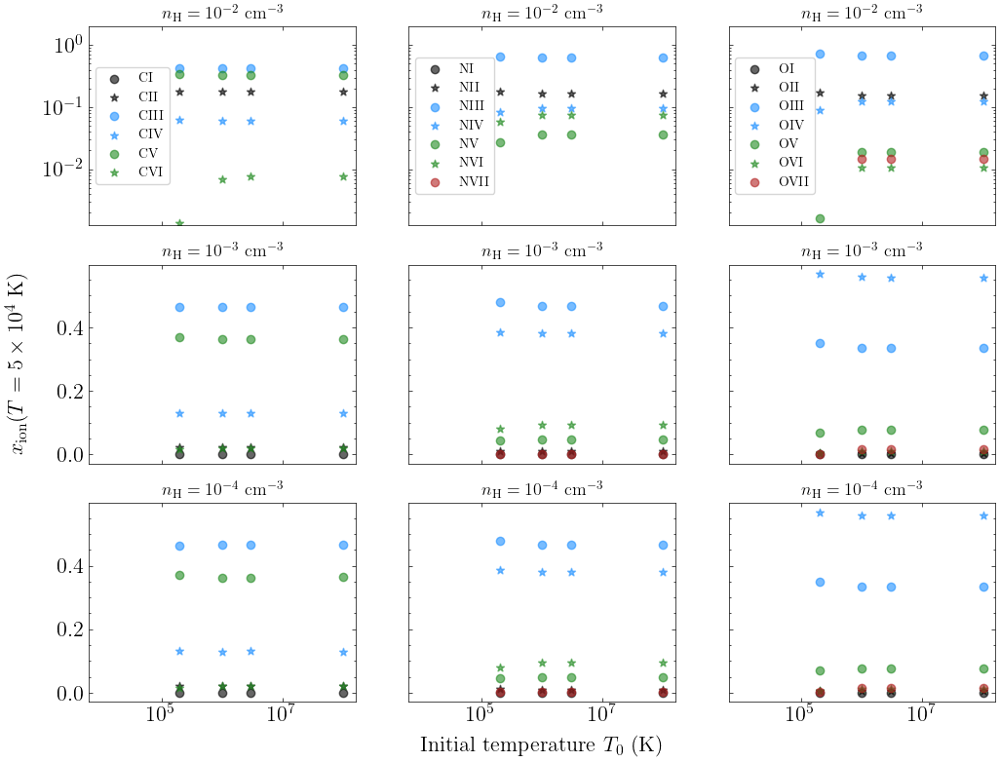

In [136]:
fig, axes = plt.subplots(3, 3, figsize=(4*3, 3*3), sharex=True, sharey='row')

# dens = -2

# C
for i in range(len(C_list)-1):
    s = C_list[i]
    axes[0,0].scatter(1e8, X_interp_TDP_fg20_carb[(-2,1e8)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6, label=s)

for i in range(len(C_list)-1):
    axes[0,0].scatter(3e6, X_interp_TDP_fg20_carb[(-2,3e6)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)
    
for i in range(len(C_list)-1):
    axes[0,0].scatter(1e6, X_interp_TDP_fg20_carb[(-2,1e6)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)
    
for i in range(len(C_list)-1):
    axes[0,0].scatter(2e5, X_interp_TDP_fg20_carb[(-2,2e5)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)

axes[0,0].set_title(r'$n_\mathrm{H} = 10^{-2} \ \mathrm{cm}^{-3}$', fontsize=13)

axes[0,0].legend(loc='center left', fontsize=10)
axes[0,0].set_yscale('log')
axes[0,0].set_xlim(10**3.8, 10**8.2)
axes[0,0].set_ylim(10**-2.9, 10**0.3)

axes[0,0].set_xscale('log')

# N
for i in range(len(N_list)-1):
    s = N_list[i]
    axes[0,1].scatter(1e8, X_interp_TDP_fg20_nit[(-2,1e8)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6, label=s)

for i in range(len(N_list)-1):
    axes[0,1].scatter(3e6, X_interp_TDP_fg20_nit[(-2,3e6)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)
    
for i in range(len(N_list)-1):
    axes[0,1].scatter(1e6, X_interp_TDP_fg20_nit[(-2,1e6)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)
    
for i in range(len(N_list)-1):
    axes[0,1].scatter(2e5, X_interp_TDP_fg20_nit[(-2,2e5)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)

axes[0,1].set_title(r'$n_\mathrm{H} = 10^{-2} \ \mathrm{cm}^{-3}$', fontsize=13)

axes[0,1].legend(loc='center left', fontsize=10)
    
# N
for i in range(len(O_list)-2):
    s = O_list[i]
    axes[0,2].scatter(1e8, X_interp_TDP_fg20_oxy[(-2,1e8)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6, label=s)

for i in range(len(O_list)-2):
    axes[0,2].scatter(3e6, X_interp_TDP_fg20_oxy[(-2,3e6)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)
    
for i in range(len(O_list)-2):
    axes[0,2].scatter(1e6, X_interp_TDP_fg20_oxy[(-2,1e6)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)
    
for i in range(len(O_list)-2):
    axes[0,2].scatter(2e5, X_interp_TDP_fg20_oxy[(-2,2e5)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)

axes[0,2].set_title(r'$n_\mathrm{H} = 10^{-2} \ \mathrm{cm}^{-3}$', fontsize=13)

axes[0,2].legend(loc='center left', fontsize=10)

# dens = -3

# C
for i in range(len(C_list)-1):
    s = C_list[i]
    axes[1,0].scatter(1e8, X_interp_TDP_fg20_carb[(-3,1e8)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6, label=s)

for i in range(len(C_list)-1):
    axes[1,0].scatter(3e6, X_interp_TDP_fg20_carb[(-3,3e6)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)
    
for i in range(len(C_list)-1):
    axes[1,0].scatter(1e6, X_interp_TDP_fg20_carb[(-3,1e6)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)
    
for i in range(len(C_list)-1):
    axes[1,0].scatter(2e5, X_interp_TDP_fg20_carb[(-3,2e5)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)

axes[1,0].set_title(r'$n_\mathrm{H} = 10^{-3} \ \mathrm{cm}^{-3}$', fontsize=13)

# N
for i in range(len(N_list)-1):
    s = N_list[i]
    axes[1,1].scatter(1e8, X_interp_TDP_fg20_nit[(-3,1e8)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6, label=s)

for i in range(len(N_list)-1):
    axes[1,1].scatter(3e6, X_interp_TDP_fg20_nit[(-3,3e6)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)
    
for i in range(len(N_list)-1):
    axes[1,1].scatter(1e6, X_interp_TDP_fg20_nit[(-3,1e6)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)
    
for i in range(len(N_list)-1):
    axes[1,1].scatter(2e5, X_interp_TDP_fg20_nit[(-3,2e5)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)

axes[1,1].set_title(r'$n_\mathrm{H} = 10^{-3} \ \mathrm{cm}^{-3}$', fontsize=13)

    
# O
for i in range(len(O_list)-2):
    s = O_list[i]
    axes[1,2].scatter(1e8, X_interp_TDP_fg20_oxy[(-3,1e8)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6, label=s)

for i in range(len(O_list)-2):
    axes[1,2].scatter(3e6, X_interp_TDP_fg20_oxy[(-3,3e6)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)
    
for i in range(len(O_list)-2):
    axes[1,2].scatter(1e6, X_interp_TDP_fg20_oxy[(-3,1e6)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)
    
for i in range(len(O_list)-2):
    axes[1,2].scatter(2e5, X_interp_TDP_fg20_oxy[(-3,2e5)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)

axes[1,2].set_title(r'$n_\mathrm{H} = 10^{-3} \ \mathrm{cm}^{-3}$', fontsize=13)

# dens = -4

# C
for i in range(len(C_list)-1):
    s = C_list[i]
    axes[2,0].scatter(1e8, X_interp_TDP_fg20_carb[(-3,1e8)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6, label=s)

for i in range(len(C_list)-1):
    axes[2,0].scatter(3e6, X_interp_TDP_fg20_carb[(-3,3e6)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)
    
for i in range(len(C_list)-1):
    axes[2,0].scatter(1e6, X_interp_TDP_fg20_carb[(-3,1e6)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)
    
for i in range(len(C_list)-1):
    axes[2,0].scatter(2e5, X_interp_TDP_fg20_carb[(-3,2e5)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)

axes[2,0].set_title(r'$n_\mathrm{H} = 10^{-4} \ \mathrm{cm}^{-3}$', fontsize=13)

# N
for i in range(len(N_list)-1):
    s = N_list[i]
    axes[2,1].scatter(1e8, X_interp_TDP_fg20_nit[(-3,1e8)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6, label=s)

for i in range(len(N_list)-1):
    axes[2,1].scatter(3e6, X_interp_TDP_fg20_nit[(-3,3e6)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)
    
for i in range(len(N_list)-1):
    axes[2,1].scatter(1e6, X_interp_TDP_fg20_nit[(-3,1e6)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)
    
for i in range(len(N_list)-1):
    axes[2,1].scatter(2e5, X_interp_TDP_fg20_nit[(-3,2e5)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)

axes[2,1].set_title(r'$n_\mathrm{H} = 10^{-4} \ \mathrm{cm}^{-3}$', fontsize=13)

    
# O
for i in range(len(O_list)-2):
    s = O_list[i]
    axes[2,2].scatter(1e8, X_interp_TDP_fg20_oxy[(-3,1e8)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6, label=s)

for i in range(len(O_list)-2):
    axes[2,2].scatter(3e6, X_interp_TDP_fg20_oxy[(-3,3e6)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)
    
for i in range(len(O_list)-2):
    axes[2,2].scatter(1e6, X_interp_TDP_fg20_oxy[(-3,1e6)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)
    
for i in range(len(O_list)-2):
    axes[2,2].scatter(2e5, X_interp_TDP_fg20_oxy[(-3,2e5)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)

axes[2,2].set_title(r'$n_\mathrm{H} = 10^{-4} \ \mathrm{cm}^{-3}$', fontsize=13)

# Title

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])

ax_label.set_xlabel(r'Initial temperature $T_0 \ (\mathrm{K})$', labelpad=25)
ax_label.set_ylabel(r'$x_\mathrm{ion} (T = 5 \times 10^4 \ \mathrm{K})$', labelpad=45)

#ax_label.set_title(r'Dependence of TDC cooling on initial temperature', fontsize=17)

#plt.subplots_adjust(wspace=0, hspace=0)

Text(0, 0.5, '$x_\\mathrm{ion} (T_\\mathrm{eval} = 3 \\times 10^4 \\ \\mathrm{K})$')

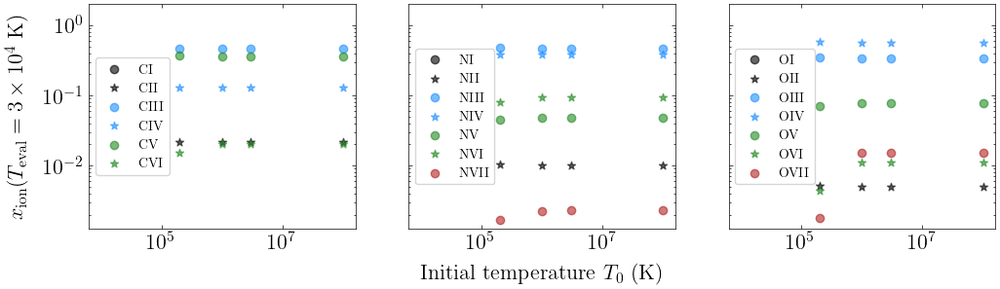

In [137]:
fig, axes = plt.subplots(1, 3, figsize=(4*3, 3), sharex=True, sharey='row')

# dens = -3

# C
for i in range(len(C_list)-1):
    s = C_list[i]
    axes[0].scatter(1e8, X_interp_TDP_fg20_carb[(-3,1e8)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6, label=s)

for i in range(len(C_list)-1):
    axes[0].scatter(3e6, X_interp_TDP_fg20_carb[(-3,3e6)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)
    
for i in range(len(C_list)-1):
    axes[0].scatter(1e6, X_interp_TDP_fg20_carb[(-3,1e6)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)
    
for i in range(len(C_list)-1):
    axes[0].scatter(2e5, X_interp_TDP_fg20_carb[(-3,2e5)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)

#axes[0].set_title(r'$n_\mathrm{H} = 10^{-3} \ \mathrm{cm}^{-3}$', fontsize=13)

axes[0].legend(loc='center left', fontsize=10)
axes[0].set_yscale('log')
axes[0].set_xlim(10**3.8, 10**8.2)
axes[0].set_ylim(10**-2.9, 10**0.3)

axes[0].set_xscale('log')

# N
for i in range(len(N_list)-1):
    s = N_list[i]
    axes[1].scatter(1e8, X_interp_TDP_fg20_nit[(-3,1e8)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6, label=s)

for i in range(len(N_list)-1):
    axes[1].scatter(3e6, X_interp_TDP_fg20_nit[(-3,3e6)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)
    
for i in range(len(N_list)-1):
    axes[1].scatter(1e6, X_interp_TDP_fg20_nit[(-3,1e6)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)
    
for i in range(len(N_list)-1):
    axes[1].scatter(2e5, X_interp_TDP_fg20_nit[(-3,2e5)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)

axes[1].legend(loc='center left', fontsize=10)
#axes[1].set_title(r'$n_\mathrm{H} = 10^{-3} \ \mathrm{cm}^{-3}$', fontsize=13)

    
# O
for i in range(len(O_list)-2):
    s = O_list[i]
    axes[2].scatter(1e8, X_interp_TDP_fg20_oxy[(-3,1e8)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6, label=s)

for i in range(len(O_list)-2):
    axes[2].scatter(3e6, X_interp_TDP_fg20_oxy[(-3,3e6)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)
    
for i in range(len(O_list)-2):
    axes[2].scatter(1e6, X_interp_TDP_fg20_oxy[(-3,1e6)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)
    
for i in range(len(O_list)-2):
    axes[2].scatter(2e5, X_interp_TDP_fg20_oxy[(-3,2e5)][i], color=colors_list[i], marker=markers_list[i], alpha=0.6)

axes[2].legend(loc='center left', fontsize=10)
#axes[2].set_title(r'$n_\mathrm{H} = 10^{-3} \ \mathrm{cm}^{-3}$', fontsize=13)

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])

ax_label.set_xlabel(r'Initial temperature $T_0 \ (\mathrm{K})$', labelpad=25)
ax_label.set_ylabel(r'$x_\mathrm{ion} (T_\mathrm{eval} = 3 \times 10^4 \ \mathrm{K})$', labelpad=45)

#ax_label.set_title('Dependence of TDP fractions on initial temperature', fontsize=17)

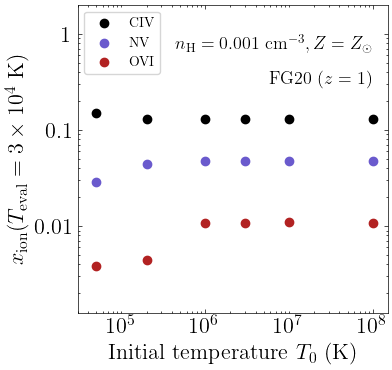

In [138]:
fig, ax = plt.subplots(1, figsize=(4,4))

ax.scatter([1e8,1e7, 3e6,1e6,2e5,5e4], 
           [X_interp_TDP_fg20_carb[(-3,1e8)][3],
            X_interp_TDP_fg20_carb[(-3,1e7)][3],
            X_interp_TDP_fg20_carb[(-3,3e6)][3], 
            X_interp_TDP_fg20_carb[(-3,1e6)][3], 
            X_interp_TDP_fg20_carb[(-3,2e5)][3],
            X_interp_TDP_fg20_carb[(-3,5e4)][3],
           ], 
           color='black', label='CIV')

ax.scatter([1e8,1e7, 3e6,1e6,2e5,5e4], 
           [X_interp_TDP_fg20_nit[(-3,1e8)][4], 
            X_interp_TDP_fg20_nit[(-3,1e7)][4],
            X_interp_TDP_fg20_nit[(-3,3e6)][4], 
            X_interp_TDP_fg20_nit[(-3,1e6)][4], 
            X_interp_TDP_fg20_nit[(-3,2e5)][4],
            X_interp_TDP_fg20_nit[(-3,5e4)][4],
           ], 
           color='slateblue', label='NV')

ax.scatter([1e8,1e7, 3e6,1e6,2e5,5e4], 
           [X_interp_TDP_fg20_oxy[(-3,1e8)][5],
            X_interp_TDP_fg20_oxy[(-3,1e7)][5],
            X_interp_TDP_fg20_oxy[(-3,3e6)][5], 
            X_interp_TDP_fg20_oxy[(-3,1e6)][5], 
            X_interp_TDP_fg20_oxy[(-3,2e5)][5],
            X_interp_TDP_fg20_oxy[(-3,5e4)][5],
           ], 
           color='firebrick', label='OVI')

ax.legend(loc='upper left', fontsize=10)

ax.set_xscale('log')
ax.set_yscale('log')

#ax.set_xlim(1e4, 1e9)

ax.set_ylim(10**-2.9, 10**0.3)

ax.set_xlabel(r'Initial temperature $T_0 \ (\mathrm{K})$')
ax.set_ylabel(r'$x_\mathrm{ion} (T_\mathrm{eval} = 3 \times 10^4 \ \mathrm{K})$')

#ax.set_title('Dependence of TDP fractions on initial temperature', fontsize=14)

ax.text(1e8, 3e-1, r'$\mathrm{FG20} \ (z=1)$', fontsize=13, horizontalalignment='right')
ax.text(1e8, 7e-1, r'$n_\mathrm{H} = 0.001 \ \mathrm{cm}^{-3}, Z=Z_\odot$', fontsize=13, horizontalalignment='right')

# Put marks at linear locations
x = []
for i in [1e4, 1e5, 1e6, 1e7]:
    for j in range(1,10):
        x.append(i*j)

ax.set_xticks(x, minor=True)
ax.set_xlim(3e4,1.5e8)

ax.set_yticks([1e-2,1e-1,1],['0.01', '0.1', '1'])

plt.savefig(rootdir+'Figures/TDP_T0_vary.pdf', dpi=300)
plt.savefig(rootdir+'Figures/TDP_T0_vary.png', dpi=300)

# PIE cooling function

In [139]:
f = open(rootdir+'cloudy_grids/non_eqm_models/PI/PIE/fg20/z=1/log_hdens=-3/PIE_frac_solar.cool', 'r')
L = f.readlines()
f.close()

heat_solar = np.array([L[i].split('\t')[2] for i in range(1, len(L))], dtype=float)
cool_solar = np.array([L[i].split('\t')[3] for i in range(1, len(L))], dtype=float)

f = open(rootdir+'cloudy_grids/non_eqm_models/PI/PIE/fg20/z=1/log_hdens=-3/PIE_frac_subsolar.cool', 'r')
L = f.readlines()
f.close()

heat_subsolar = np.array([L[i].split('\t')[2] for i in range(1, len(L))], dtype=float)
cool_subsolar = np.array([L[i].split('\t')[3] for i in range(1, len(L))], dtype=float)

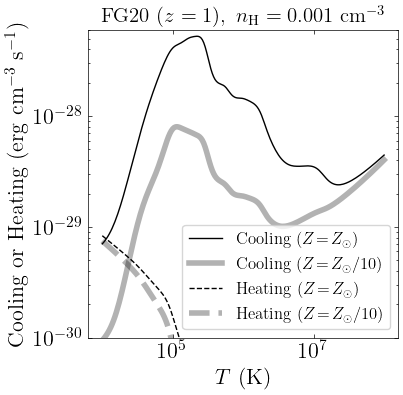

In [141]:
fig, ax = plt.subplots(1,figsize=(4,4))

k = ('fg20',1,-3)
ax.plot(T_grid_PIE[k], cool_solar, color='black',lw=1, label=r'Cooling ($Z\!=\!Z_\odot$)')
ax.plot(T_grid_PIE[k], cool_subsolar, color='black',lw=4, alpha=.3, label=r'Cooling ($Z\!=\!Z_\odot/10$)')

ax.plot(T_grid_PIE[k], heat_solar, color='black',lw=1, linestyle='--', label=r'Heating ($Z\!=\!Z_\odot$)')
ax.plot(T_grid_PIE[k], heat_subsolar, color='black',lw=4, alpha=.3, linestyle='--',label=r'Heating ($Z\!=\!Z_\odot/10$)')

#ax.text(1.2e8, 4e-28, r'$z=1 \ \mathrm{(FG20)}, n_\mathrm{H}=10^{-3} \ \mathrm{cm}^{-3}$', 
#        horizontalalignment='right', verticalalignment='top', fontsize=15)


ax.set_title(r'$\mathrm{FG20} \ (z=1) , \ n_\mathrm{H}=0.001 \ \mathrm{cm}^{-3}$', fontsize=15)

#ax.set_ylabel(r'$\mathrm{d}Q/\mathrm{d}t \ \mathrm{(erg \ cm^{-3} \ s^{-1})}$')
ax.set_ylabel(r'$\mathrm{Cooling \ or \ Heating} \ \mathrm{(erg \ cm^{-3} \ s^{-1})}$')

ax.legend(loc='lower right', fontsize=12)

ax.set_ylim(1e-30, 6e-28)
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlabel(r'$T \ (\mathrm{K})$')

plt.savefig('/Users/thepoetoftwilight/Documents/Astro/Data/PG1522+101/Figures/PIE_dQdt.pdf', dpi=300)

# CIE cooling function

In [191]:
f = open(rootdir+'cloudy_grids/non_eqm_models/CI/CIE/CIE_frac_solar.cool', 'r')
L = f.readlines()
f.close()

#heat_solar = np.array([L[i].split('\t')[2] for i in range(1, len(L))], dtype=float)
cool_solar = np.array([L[i].split('\t')[2] for i in range(1, len(L))], dtype=float)

f = open(rootdir+'cloudy_grids/non_eqm_models/CI/CIE/CIE_frac_subsolar.cool', 'r')
L = f.readlines()
f.close()

#heat_subsolar = np.array([L[i].split('\t')[2] for i in range(1, len(L))], dtype=float)
cool_subsolar = np.array([L[i].split('\t')[2] for i in range(1, len(L))], dtype=float)

Text(0.5, 0, '$T \\ (\\mathrm{K})$')

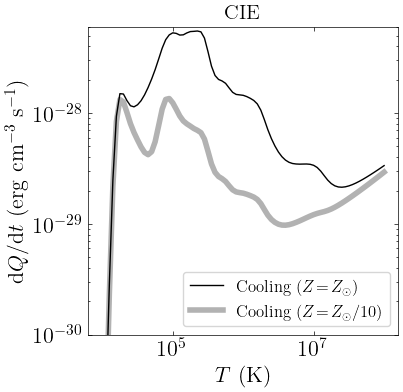

In [192]:
fig, ax = plt.subplots(1,figsize=(4,4))

ax.plot(T_grid_CIE, cool_solar, color='black',lw=1, label=r'Cooling ($Z\!=\!Z_\odot$)')
ax.plot(T_grid_CIE, cool_subsolar, color='black',lw=4, alpha=.3, label=r'Cooling ($Z\!=\!Z_\odot/10$)')

#ax.text(1.2e8, 4e-28, r'$z=1 \ \mathrm{(FG20)}, n_\mathrm{H}=10^{-3} \ \mathrm{cm}^{-3}$', 
#        horizontalalignment='right', verticalalignment='top', fontsize=15)


ax.set_title(r'CIE', fontsize=15)

ax.set_ylabel(r'$\mathrm{d}Q/\mathrm{d}t \ \mathrm{(erg \ cm^{-3} \ s^{-1})}$')
ax.legend(loc='lower right', fontsize=12)

ax.set_ylim(1e-30, 6e-28)
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlabel(r'$T \ (\mathrm{K})$')

#plt.savefig('/Users/thepoetoftwilight/Documents/Astro/Data/PG1522+101/Figures/PIE_dQdt.pdf', dpi=300)

# Non-solar abundance patterns

In [145]:
k = ('isochoric','fg20',1,0.0,-3.0,3e6)
k1 = ('isochoric','fg20_CO_sup',1,0.0,-3.0,3e6)
T_grid_TDP[k1], X_dict_TDP_hyd[k1], X_dict_TDP_carb[k1], X_dict_TDP_nit[k1], X_dict_TDP_oxy[k1] = get_TDP_frac(k, '_CO_sup')

k2 = ('isochoric','fg20_CO_sub',1,0.0,-3.0,3e6)
T_grid_TDP[k2], X_dict_TDP_hyd[k2], X_dict_TDP_carb[k2], X_dict_TDP_nit[k2], X_dict_TDP_oxy[k2] = get_TDP_frac(k, '_CO_sub')

Load cooling and heating

In [146]:
# Solar
f = open(rootdir+'cloudy_grids/non_eqm_models/PI/TDP_isochoric/fg20/z=1/log_metals=0.0/log_hdens=-3.0/T0=3e6K/cd-cool-1keV_draft.cool', 'r')
L = f.readlines()
f.close()

cool_TDP_0 = np.array([L[i].split('\t')[2] for i in range(1, len(L))], dtype=float)
#heat_TDP_0 = np.array([L[i].split('\t')[2] for i in range(1, len(L))], dtype=float)
cool_hyd_TDP_0 = np.array([L[i].split('\t')[3] for i in range(1, len(L))], dtype=float)
cool_hel_TDP_0 = np.array([L[i].split('\t')[4] for i in range(1, len(L))], dtype=float)
cool_carb_TDP_0 = np.array([L[i].split('\t')[8] for i in range(1, len(L))], dtype=float)
cool_nit_TDP_0 = np.array([L[i].split('\t')[9] for i in range(1, len(L))], dtype=float)
cool_oxy_TDP_0 = np.array([L[i].split('\t')[10] for i in range(1, len(L))], dtype=float)
cool_neon_TDP_0 = np.array([L[i].split('\t')[12] for i in range(1, len(L))], dtype=float)
cool_mag_TDP_0 = np.array([L[i].split('\t')[14] for i in range(1, len(L))], dtype=float)
cool_sil_TDP_0 = np.array([L[i].split('\t')[16] for i in range(1, len(L))], dtype=float)
cool_sul_TDP_0 = np.array([L[i].split('\t')[18] for i in range(1, len(L))], dtype=float)
cool_cal_TDP_0 = np.array([L[i].split('\t')[22] for i in range(1, len(L))], dtype=float)
cool_iron_TDP_0 = np.array([L[i].split('\t')[28] for i in range(1, len(L))], dtype=float)

# Super-solar C/O
f = open(rootdir+'cloudy_grids/non_eqm_models/PI/TDP_isochoric/fg20/z=1/log_metals=0.0/log_hdens=-3.0/T0=3e6K_CO_sup/cd-cool-1keV.cool', 'r')
L = f.readlines()
f.close()

cool_TDP_1 = np.array([L[i].split('\t')[2] for i in range(1, len(L))], dtype=float)
#heat_TDP_1 = np.array([L[i].split('\t')[3] for i in range(1, len(L))], dtype=float)
cool_carb_TDP_1 = np.array([L[i].split('\t')[8] for i in range(1, len(L))], dtype=float)
cool_oxy_TDP_1 = np.array([L[i].split('\t')[10] for i in range(1, len(L))], dtype=float)

# Sub-solar C/O
f = open(rootdir+'cloudy_grids/non_eqm_models/PI/TDP_isochoric/fg20/z=1/log_metals=0.0/log_hdens=-3.0/T0=3e6K_CO_sub/cd-cool-1keV.cool', 'r')
L = f.readlines()
f.close()

cool_TDP_2 = np.array([L[i].split('\t')[2] for i in range(1, len(L))], dtype=float)
#heat_TDP_2 = np.array([L[i].split('\t')[3] for i in range(1, len(L))], dtype=float)
cool_carb_TDP_2 = np.array([L[i].split('\t')[8] for i in range(1, len(L))], dtype=float)
cool_oxy_TDP_2 = np.array([L[i].split('\t')[10] for i in range(1, len(L))], dtype=float)

In [195]:
f = open(rootdir+'cloudy_grids/non_eqm_models/PI/TDP_isochoric/fg20/z=1/log_metals=0.0/log_hdens=-3.0/T0=3e6K/cd-cool-1keV_draft.cool', 'r')
L = f.readlines()
f.close()

In [196]:
idx = np.argmin(np.abs(T_grid_TDP[k]-2e5))

In [197]:
elems = L[0].split('\t')[2:33] # 3-33
cools = np.float_(L[idx].split('\t'))[2:33]/1e-6

In [198]:
elems_sorted = [x for _, x in sorted(zip(cools, elems))]
cools_sorted = np.sort(cools)

In [199]:
elems_sorted[:-1]

['Be',
 'B ',
 'Li',
 'Cu',
 'Zn',
 'Sc',
 'Co',
 'V ',
 'Ni',
 'P ',
 'F ',
 'Mn',
 'Ti',
 'Cl',
 'Al',
 'K ',
 'Cr',
 'Na',
 'Si',
 'Ar',
 'H ',
 'C ',
 'Ca',
 'S ',
 'Mg',
 'N ',
 'Fe',
 'He',
 'Ne',
 'O ']

In [200]:
cools_sorted[-1],np.sum(cools_sorted[:-1])

(2.958e-22, 2.9418756096976464e-22)

In [201]:
for i in range(len(elems_sorted)-1,0,-1):
    print(elems_sorted[i], cools_sorted[i])

Ctot(erg/cm3/s) 2.958e-22
O  1.9329000000000001e-22
Ne 4.1372000000000006e-23
He 1.3754e-23
Fe 1.2225000000000001e-23
N  1.0525e-23
Mg 4.5e-24
S  4.2304000000000005e-24
Ca 3.747e-24
C  3.5969e-24
H  3.0526e-24
Ar 1.4755e-24
Si 8.0221e-25
Na 6.652800000000001e-25
Cr 2.9682e-25
K  2.2218e-25
Al 1.7919e-25
Cl 9.950100000000001e-26
Ti 6.0547e-26
Mn 5.2581e-26
F  1.4864e-26
P  1.2851e-26
Ni 7.2997e-27
V  3.8245e-27
Co 1.4031000000000001e-27
Sc 4.294e-28
Zn 1.2057000000000001e-28
Cu 5.822500000000001e-29
Li 1.0074e-30
B  4.6348e-31


In [202]:
(4.1 + 1.4 + 1.2 + 1.1)/29.6

0.26351351351351354

In [203]:
idx = np.argmin(np.abs(T_grid_TDP[k]-7e4))

In [204]:
elems = L[0].split('\t')[2:33] # 3-33
cools = np.float_(L[idx].split('\t'))[2:33]/1e-6

In [205]:
elems_sorted = [x for _, x in sorted(zip(cools, elems))]
cools_sorted = np.sort(cools)

In [206]:
elems_sorted[:-1]

['Be',
 'Li',
 'Cu',
 'Zn',
 'B ',
 'V ',
 'Sc',
 'Co',
 'Mn',
 'Ni',
 'F ',
 'Ti',
 'Cl',
 'Al',
 'K ',
 'Na',
 'P ',
 'Cr',
 'Ca',
 'Mg',
 'Ar',
 'Si',
 'Fe',
 'He',
 'Ne',
 'S ',
 'H ',
 'N ',
 'C ',
 'O ']

In [207]:
cools_sorted[-1],np.sum(cools_sorted[:-1])

(1.7138e-22, 1.7047506237930582e-22)

In [208]:
for i in range(len(elems_sorted)-1,0,-1):
    print(elems_sorted[i], cools_sorted[i])

Ctot(erg/cm3/s) 1.7138e-22
O  8.272800000000001e-23
C  3.1599e-23
N  1.6572000000000002e-23
H  8.225300000000001e-24
S  7.9245e-24
Ne 7.916399999999999e-24
He 6.3237e-24
Fe 3.6934e-24
Si 3.4934e-24
Ar 5.7372e-25
Mg 5.523600000000001e-25
Ca 4.2109e-25
Cr 1.5159000000000003e-25
P  9.0906e-26
Na 9.055800000000001e-26
K  5.2372e-26
Al 3.0924e-26
Cl 2.8308e-26
Ti 3.5668000000000006e-27
F  2.5366000000000002e-27
Ni 1.0898999999999999e-27
Mn 1.3570000000000002e-28
Co 6.596400000000001e-29
Sc 6.3266e-29
V  5.744400000000001e-29
B  1.6697e-29
Zn 1.4346000000000001e-30
Cu 5.427800000000001e-31
Li 2.64e-32


In [209]:
3.2e-23/1.7e-22, 8.3e-23/1.7e-22

(0.18823529411764706, 0.4882352941176471)

In [210]:
(1.7e-23 + 8.2e-24 + 7.9e-24 + 7.9e-24)/1.7e-22

0.24117647058823533

Interpolate ion fractions

In [147]:
X_dict_carb_CO_sup, X_dict_nit_CO_sup, X_dict_oxy_CO_sup = interp_ion_frac(T_grid_TDP[k], 
                                                               T_grid_TDP[k1], 
                                                               X_dict_TDP_carb[k1], 
                                                               X_dict_TDP_nit[k1], 
                                                               X_dict_TDP_oxy[k1])

X_dict_carb_CO_sub, X_dict_nit_CO_sub, X_dict_oxy_CO_sub = interp_ion_frac(T_grid_TDP[k], 
                                                               T_grid_TDP[k2], 
                                                               X_dict_TDP_carb[k2], 
                                                               X_dict_TDP_nit[k2], 
                                                               X_dict_TDP_oxy[k2])

Text(0, 0.5, '$\\Lambda$ (erg cm${}^{3}$ s${^{-1}}$)')

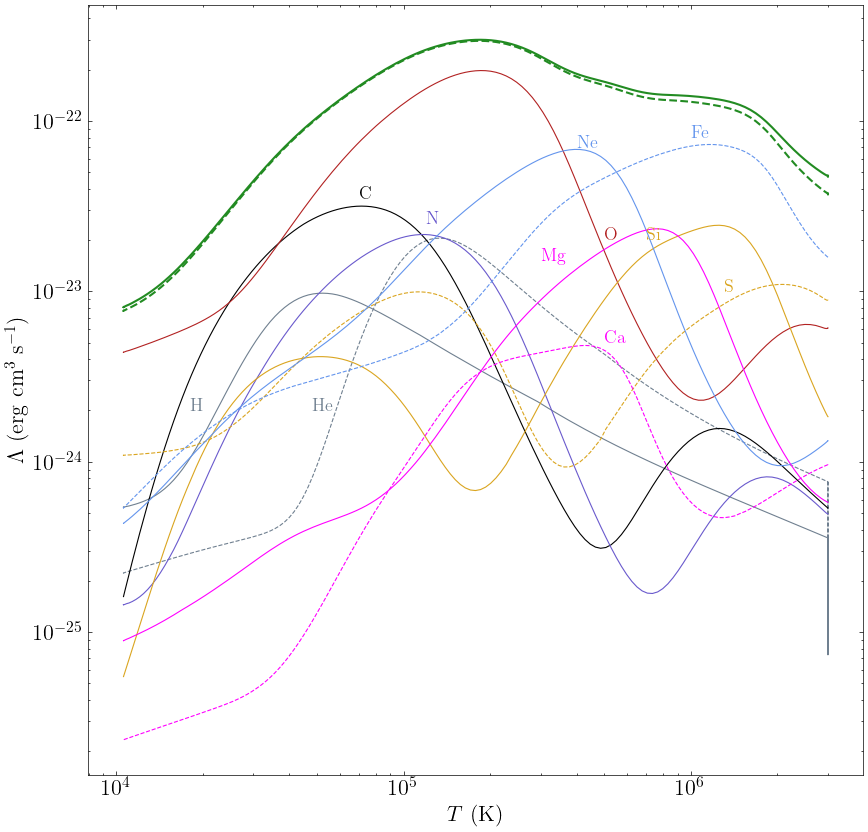

In [151]:
fig, ax = plt.subplots(1, figsize=(10,10))

ax.plot(T_grid_TDP[k], cool_TDP_0/1e-6, color='forestgreen',lw=1.5, label=r'$\mathrm{[C/O]}=0.0$')

ax.plot(T_grid_TDP[k], 
(cool_hyd_TDP_0+cool_hel_TDP_0+cool_carb_TDP_0+cool_nit_TDP_0+cool_oxy_TDP_0+cool_sil_TDP_0+cool_sul_TDP_0+cool_neon_TDP_0+cool_iron_TDP_0+cool_mag_TDP_0+cool_cal_TDP_0)/1e-6, 
             color='forestgreen',lw=1.5, linestyle='--')

ax.plot(T_grid_TDP[k], cool_hyd_TDP_0/1e-6, color='slategray',lw=0.8)
ax.text(1.8e4, 2e-24, 'H', color='slategray', fontsize=13)

ax.plot(T_grid_TDP[k], cool_hel_TDP_0/1e-6, color='slategray',lw=0.8, linestyle='--')
ax.text(4.8e4, 2e-24, 'He', color='slategray', fontsize=13)

ax.plot(T_grid_TDP[k], cool_carb_TDP_0/1e-6, color='black',lw=0.8)
ax.text(7e4, 3.5e-23, 'C', color='black', fontsize=13)

ax.plot(T_grid_TDP[k], cool_nit_TDP_0/1e-6, color='slateblue',lw=0.8)
ax.text(1.2e5, 2.5e-23, 'N', color='slateblue', fontsize=13)

ax.plot(T_grid_TDP[k], cool_oxy_TDP_0/1e-6, color='firebrick',lw=0.8)
ax.text(5e5, 2e-23, 'O', color='firebrick', fontsize=13)

ax.plot(T_grid_TDP[k], cool_sil_TDP_0/1e-6, color='goldenrod',lw=0.8)
ax.text(7e5, 2e-23, 'Si', color='goldenrod', fontsize=13)

ax.plot(T_grid_TDP[k], cool_sul_TDP_0/1e-6, color='goldenrod',lw=0.8, linestyle='--')
ax.text(1.3e6, 1e-23, 'S', color='goldenrod', fontsize=13)

ax.plot(T_grid_TDP[k], cool_neon_TDP_0/1e-6, color='cornflowerblue',lw=0.8)
ax.text(4e5, 7e-23, 'Ne', color='cornflowerblue', fontsize=13)

ax.plot(T_grid_TDP[k], cool_iron_TDP_0/1e-6, color='cornflowerblue',lw=0.8, linestyle='--')
ax.text(1e6, 8e-23, 'Fe', color='cornflowerblue', fontsize=13)

ax.plot(T_grid_TDP[k], cool_mag_TDP_0/1e-6, color='magenta',lw=0.8)
ax.text(3e5, 1.5e-23, 'Mg', color='magenta', fontsize=13)

ax.plot(T_grid_TDP[k], cool_cal_TDP_0/1e-6, color='magenta',lw=0.8, linestyle='--')
ax.text(5e5, 5e-24, 'Ca', color='magenta', fontsize=13)

ax.set_xscale('log')
ax.set_yscale('log')

ax.set_xlabel(r'$T \ (\mathrm{K})$')

ax.set_ylabel(r'$\Lambda$ (erg cm${}^{3}$ s${^{-1}}$)')

Text(0, 0.5, '$\\Lambda$ (erg cm${}^{3}$ s${^{-1}}$)')

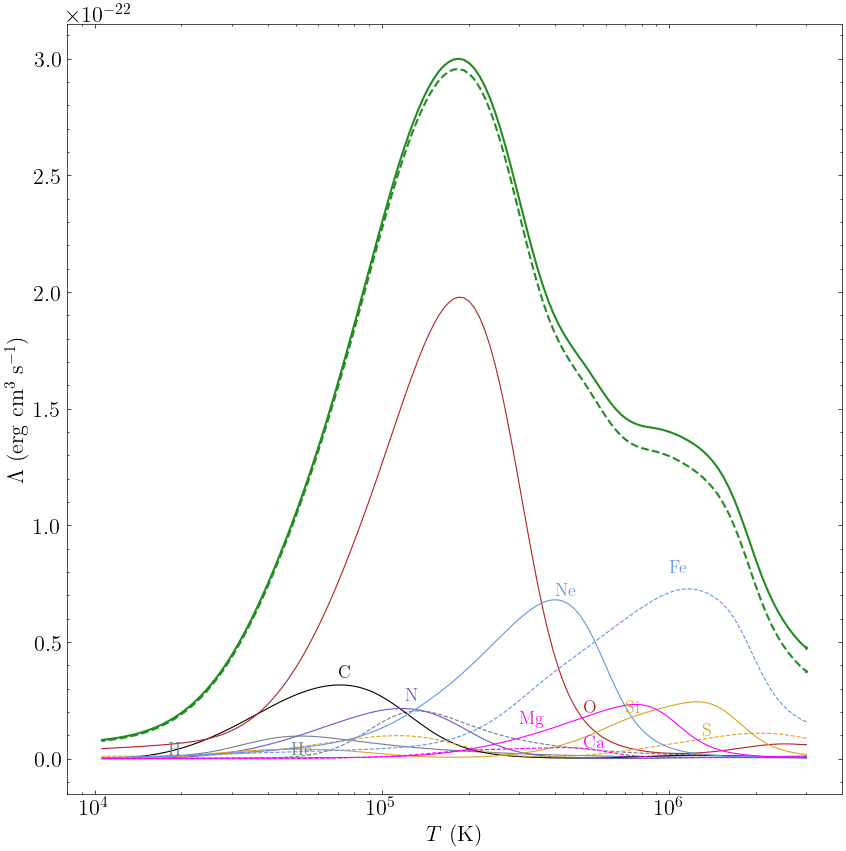

In [152]:
fig, ax = plt.subplots(1, figsize=(10,10))

ax.plot(T_grid_TDP[k], cool_TDP_0/1e-6, color='forestgreen',lw=1.5, label=r'$\mathrm{[C/O]}=0.0$')

ax.plot(T_grid_TDP[k], 
(cool_hyd_TDP_0+cool_hel_TDP_0+cool_carb_TDP_0+cool_nit_TDP_0+cool_oxy_TDP_0+cool_sil_TDP_0+cool_sul_TDP_0+cool_neon_TDP_0+cool_iron_TDP_0+cool_mag_TDP_0+cool_cal_TDP_0)/1e-6, 
             color='forestgreen',lw=1.5, linestyle='--')

ax.plot(T_grid_TDP[k], cool_hyd_TDP_0/1e-6, color='slategray',lw=0.8)
ax.text(1.8e4, 2e-24, 'H', color='slategray', fontsize=13)

ax.plot(T_grid_TDP[k], cool_hel_TDP_0/1e-6, color='slategray',lw=0.8, linestyle='--')
ax.text(4.8e4, 2e-24, 'He', color='slategray', fontsize=13)

ax.plot(T_grid_TDP[k], cool_carb_TDP_0/1e-6, color='black',lw=0.8)
ax.text(7e4, 3.5e-23, 'C', color='black', fontsize=13)

ax.plot(T_grid_TDP[k], cool_nit_TDP_0/1e-6, color='slateblue',lw=0.8)
ax.text(1.2e5, 2.5e-23, 'N', color='slateblue', fontsize=13)

ax.plot(T_grid_TDP[k], cool_oxy_TDP_0/1e-6, color='firebrick',lw=0.8)
ax.text(5e5, 2e-23, 'O', color='firebrick', fontsize=13)

ax.plot(T_grid_TDP[k], cool_sil_TDP_0/1e-6, color='goldenrod',lw=0.8)
ax.text(7e5, 2e-23, 'Si', color='goldenrod', fontsize=13)

ax.plot(T_grid_TDP[k], cool_sul_TDP_0/1e-6, color='goldenrod',lw=0.8, linestyle='--')
ax.text(1.3e6, 1e-23, 'S', color='goldenrod', fontsize=13)

ax.plot(T_grid_TDP[k], cool_neon_TDP_0/1e-6, color='cornflowerblue',lw=0.8)
ax.text(4e5, 7e-23, 'Ne', color='cornflowerblue', fontsize=13)

ax.plot(T_grid_TDP[k], cool_iron_TDP_0/1e-6, color='cornflowerblue',lw=0.8, linestyle='--')
ax.text(1e6, 8e-23, 'Fe', color='cornflowerblue', fontsize=13)

ax.plot(T_grid_TDP[k], cool_mag_TDP_0/1e-6, color='magenta',lw=0.8)
ax.text(3e5, 1.5e-23, 'Mg', color='magenta', fontsize=13)

ax.plot(T_grid_TDP[k], cool_cal_TDP_0/1e-6, color='magenta',lw=0.8, linestyle='--')
ax.text(5e5, 5e-24, 'Ca', color='magenta', fontsize=13)

ax.set_xscale('log')
#ax.set_yscale('log')

ax.set_xlabel(r'$T \ (\mathrm{K})$')

ax.set_ylabel(r'$\Lambda$ (erg cm${}^{3}$ s${^{-1}}$)')

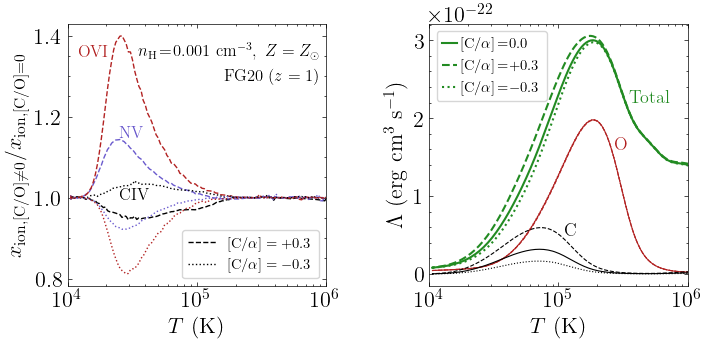

In [166]:
fig, axes = plt.subplots(1, 2, figsize=(4*2,3.4), sharex=True)

axes[0].plot(T_grid_TDP[k], X_dict_carb_CO_sup['CIV']/X_dict_TDP_carb[k]['CIV'], color='black', linestyle='--', label=r'$\mathrm{[C/\alpha]}=+0.3$')
axes[0].text(2.5e4, 0.995, 'CIV', color='black', fontsize=12)

axes[0].plot(T_grid_TDP[k], X_dict_nit_CO_sup['NV']/X_dict_TDP_nit[k]['NV'], color='slateblue', linestyle='--')
axes[0].text(2.5e4, 1.15, 'NV', color='slateblue', fontsize=12)

axes[0].plot(T_grid_TDP[k], X_dict_oxy_CO_sup['OVI']/X_dict_TDP_oxy[k]['OVI'], color='firebrick', linestyle='--')
axes[0].text(1.2e4, 1.35, 'OVI', color='firebrick', fontsize=12)

axes[0].plot(T_grid_TDP[k], X_dict_carb_CO_sub['CIV']/X_dict_TDP_carb[k]['CIV'], color='black', linestyle=':', label=r'$\mathrm{[C/\alpha]}=-0.3$')
axes[0].plot(T_grid_TDP[k], X_dict_nit_CO_sub['NV']/X_dict_TDP_nit[k]['NV'], color='slateblue', linestyle=':')
axes[0].plot(T_grid_TDP[k], X_dict_oxy_CO_sub['OVI']/X_dict_TDP_oxy[k]['OVI'], color='firebrick', linestyle=':')

axes[0].set_xlim(1e4, 1e6)
axes[0].text(9e5, 1.35, r'$n_\mathrm{H}\!=\!0.001 \ \mathrm{cm}^{-3}, \ Z=Z_\odot$', horizontalalignment='right', fontsize=12)
axes[0].text(9e5, 1.29, r'$\mathrm{FG20} \ (z=1)$', horizontalalignment='right', fontsize=12)

axes[0].legend(fontsize=10.5, loc='lower right')

axes[1].plot(T_grid_TDP[k], cool_TDP_0/1e-6, color='forestgreen',lw=1.5, label=r'$\mathrm{[C/\alpha]}\!=\!0.0$')
axes[1].plot(T_grid_TDP[k1], cool_TDP_1/1e-6, lw=1.5, color='forestgreen',linestyle='--', label=r'$\mathrm{[C/\alpha]}\!=\!+0.3$')
axes[1].plot(T_grid_TDP[k2], cool_TDP_2/1e-6, lw=1.5, color='forestgreen',linestyle=':', label=r'$\mathrm{[C/\alpha]}\!=\!-0.3$')
axes[1].text(3.5e5, 2.2e-22, 'Total', color='forestgreen', fontsize=13)

#axes[1].plot(T_grid_TDP[k], (cool_hyd_TDP_0+cool_hel_TDP_0+cool_carb_TDP_0+cool_oxy_TDP_0)/1e-6, color='royalblue',lw=0.8)

#axes[1].plot(T_grid_TDP[k], cool_hyd_TDP_0/1e-6, color='coral',lw=0.8)
#axes[1].plot(T_grid_TDP[k1], cool_hyd_TDP_1/1e-6, lw=0.8, color='coral', linestyle='--')
#axes[1].plot(T_grid_TDP[k2], cool_hyd_TDP_2/1e-6, lw=0.8, color='coral',linestyle=':')
#axes[1].text(3e4, 2e-24, 'H', color='coral', fontsize=13)

#axes[1].plot(T_grid_TDP[k], cool_hel_TDP_0/1e-6, color='goldenrod',lw=0.8)
#axes[1].plot(T_grid_TDP[k1], cool_hel_TDP_1/1e-6, lw=0.8, color='goldenrod', linestyle='--')
#axes[1].plot(T_grid_TDP[k2], cool_hel_TDP_2/1e-6, lw=0.8, color='goldenrod',linestyle=':')
#axes[1].text(7e4, 2e-24, 'He', color='goldenrod', fontsize=13)

axes[1].plot(T_grid_TDP[k], cool_oxy_TDP_0/1e-6, color='firebrick',lw=0.8)
axes[1].plot(T_grid_TDP[k1], cool_oxy_TDP_1/1e-6, lw=0.8, color='firebrick', linestyle='--')
axes[1].plot(T_grid_TDP[k2], cool_oxy_TDP_2/1e-6, lw=0.8, color='firebrick',linestyle=':')
axes[1].text(2.7e5, 1.6e-22, 'O', color='firebrick', fontsize=13)

axes[1].plot(T_grid_TDP[k], cool_carb_TDP_0/1e-6, color='black',lw=0.8)
axes[1].plot(T_grid_TDP[k1], cool_carb_TDP_1/1e-6, lw=0.8, color='black',linestyle='--')
axes[1].plot(T_grid_TDP[k2], cool_carb_TDP_2/1e-6, lw=0.8, color='black',linestyle=':')
axes[1].text(1.1e5, 5e-23, 'C', color='black', fontsize=13)

axes[1].set_ylabel(r'$\Lambda$ (erg cm${}^{3}$ s${^{-1}}$)')
axes[1].legend(loc='upper left', handlelength=1, fontsize=10.5, handletextpad=.3)

#axes[1].plot(T_grid_TDP[k], heat_TDP_0, color='dodgerblue',lw=1.5)
#axes[1].plot(T_grid_TDP[k1], heat_TDP_1, lw=1.5, color='dodgerblue',linestyle=':')

#axes[1].set_ylim(1e-29, 4e-28)
axes[1].set_xscale('log')
#axes[1].set_yscale('log')

axes[0].set_xlabel(r'$T \ (\mathrm{K})$')
axes[1].set_xlabel(r'$T \ (\mathrm{K})$')

axes[0].set_ylabel(r'$x_{\mathrm{ion, [C/O]\neq0}}/x_{\mathrm{ion, [C/O]=0}}$')

#ax_label.set_title('Variation of ion fractions with abundance pattern', fontsize=17)

plt.subplots_adjust(wspace=0.4, hspace=0.0)

plt.savefig(rootdir+'Figures/TDP_abund_vary.pdf', dpi=300)
plt.savefig(rootdir+'Figures/TDP_abund_vary.png', dpi=300)

Text(0.5, 0, '$T \\ (\\mathrm{K})$')

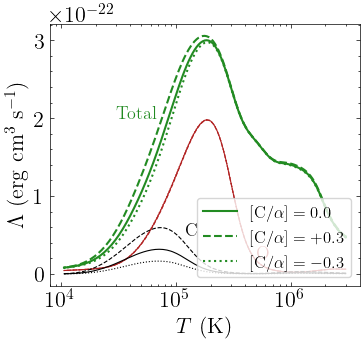

In [216]:
fig, ax = plt.subplots(1, figsize=(4,3.4))#, sharex=True)

ax.plot(T_grid_TDP[k], cool_TDP_0/1e-6, color='forestgreen',lw=1.5, label=r'$\mathrm{[C/\alpha]}=0.0$')
ax.plot(T_grid_TDP[k1], cool_TDP_1/1e-6, lw=1.5, color='forestgreen',linestyle='--', label=r'$\mathrm{[C/\alpha]}=+0.3$')
ax.plot(T_grid_TDP[k2], cool_TDP_2/1e-6, lw=1.5, color='forestgreen',linestyle=':', label=r'$\mathrm{[C/\alpha]}=-0.3$')
ax.text(3e4, 2e-22, 'Total', color='forestgreen', fontsize=13)

#axes[1].plot(T_grid_TDP[k], (cool_hyd_TDP_0+cool_hel_TDP_0+cool_carb_TDP_0+cool_oxy_TDP_0)/1e-6, color='royalblue',lw=0.8)

#axes[1].plot(T_grid_TDP[k], cool_hyd_TDP_0/1e-6, color='coral',lw=0.8)
#axes[1].plot(T_grid_TDP[k1], cool_hyd_TDP_1/1e-6, lw=0.8, color='coral', linestyle='--')
#axes[1].plot(T_grid_TDP[k2], cool_hyd_TDP_2/1e-6, lw=0.8, color='coral',linestyle=':')
#axes[1].text(3e4, 2e-24, 'H', color='coral', fontsize=13)

#axes[1].plot(T_grid_TDP[k], cool_hel_TDP_0/1e-6, color='goldenrod',lw=0.8)
#axes[1].plot(T_grid_TDP[k1], cool_hel_TDP_1/1e-6, lw=0.8, color='goldenrod', linestyle='--')
#axes[1].plot(T_grid_TDP[k2], cool_hel_TDP_2/1e-6, lw=0.8, color='goldenrod',linestyle=':')
#axes[1].text(7e4, 2e-24, 'He', color='goldenrod', fontsize=13)

ax.plot(T_grid_TDP[k], cool_oxy_TDP_0/1e-6, color='firebrick',lw=0.8)
ax.plot(T_grid_TDP[k1], cool_oxy_TDP_1/1e-6, lw=0.8, color='firebrick', linestyle='--')
ax.plot(T_grid_TDP[k2], cool_oxy_TDP_2/1e-6, lw=0.8, color='firebrick',linestyle=':')
ax.text(5e5, 2e-23, 'O', color='firebrick', fontsize=13)

ax.plot(T_grid_TDP[k], cool_carb_TDP_0/1e-6, color='black',lw=0.8)
ax.plot(T_grid_TDP[k1], cool_carb_TDP_1/1e-6, lw=0.8, color='black',linestyle='--')
ax.plot(T_grid_TDP[k2], cool_carb_TDP_2/1e-6, lw=0.8, color='black',linestyle=':')
ax.text(1.2e5, 5e-23, 'C', color='black', fontsize=13)

ax.set_ylabel(r'$\Lambda$ (erg cm${}^{3}$ s${^{-1}}$)')
ax.legend(loc='lower right')

#axes[1].plot(T_grid_TDP[k], heat_TDP_0, color='dodgerblue',lw=1.5)
#axes[1].plot(T_grid_TDP[k1], heat_TDP_1, lw=1.5, color='dodgerblue',linestyle=':')

#axes[1].set_ylim(1e-29, 4e-28)
ax.set_xscale('log')
#ax.set_yscale('log')

ax.set_xlabel(r'$T \ (\mathrm{K})$')


# CR heating and ionization

Load CLOUDY fractions without CR heating

In [38]:
# Isochoric

# Temperature
f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDC_isochoric/log_metals=0/T0=3e6K-noCR/TDC_isochoric_frac.tim', 'r')
L = f.readlines()
f.close()

T_grid_TDC_isochoric_noCR = np.array([L[i].split('\t')[4] for i in range(1, len(L))], dtype=float)

# Carbon

X_dict_TDC_isochoric_noCR_carb = {k:np.zeros(len(T_grid_TDC_isochoric_noCR)) for k in C_list}

f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDC_isochoric/log_metals=0/T0=3e6K-noCR/TDC_isochoric_frac.carb', 'r')
L = f.readlines()
f.close()

for s in C_list:
    for i in range(len(T_grid_TDC_isochoric_noCR)):
        X_dict_TDC_isochoric_noCR_carb[s][i] = float(L[i+1].split('\t')[C_list.index(s)+1])
        
# Nitrogen

X_dict_TDC_isochoric_noCR_nit = {k:np.zeros(len(T_grid_TDC_isochoric_noCR)) for k in N_list}

f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDC_isochoric/log_metals=0/T0=3e6K-noCR/TDC_isochoric_frac.nit', 'r')
L = f.readlines()
f.close()

for s in N_list:
    for i in range(len(T_grid_TDC_isochoric_noCR)):
        X_dict_TDC_isochoric_noCR_nit[s][i] = float(L[i+1].split('\t')[N_list.index(s)+1])

# Oxygen

X_dict_TDC_isochoric_noCR_oxy = {k:np.zeros(len(T_grid_TDC_isochoric_noCR)) for k in O_list}

f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDC_isochoric/log_metals=0/T0=3e6K-noCR/TDC_isochoric_frac.oxy', 'r')
L = f.readlines()
f.close()

for s in O_list:
    for i in range(len(T_grid_TDC_isochoric_noCR)):
        X_dict_TDC_isochoric_noCR_oxy[s][i] = float(L[i+1].split('\t')[O_list.index(s)+1])

Load ion fractions with upscaled CR

In [39]:
# Isochoric

# Temperature
f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDC_isochoric/log_metals=0/T0=3e6K-hiCR/TDC_isochoric_frac.tim', 'r')
L = f.readlines()
f.close()

T_grid_TDC_isochoric_hiCR = np.array([L[i].split('\t')[4] for i in range(1, len(L))], dtype=float)

# Carbon

X_dict_TDC_isochoric_hiCR_carb = {k:np.zeros(len(T_grid_TDC_isochoric_hiCR)) for k in C_list}

f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDC_isochoric/log_metals=0/T0=3e6K-hiCR/TDC_isochoric_frac.carb', 'r')
L = f.readlines()
f.close()

for s in C_list:
    for i in range(len(T_grid_TDC_isochoric_hiCR)):
        X_dict_TDC_isochoric_hiCR_carb[s][i] = float(L[i+1].split('\t')[C_list.index(s)+1])
        
# Nitrogen

X_dict_TDC_isochoric_hiCR_nit = {k:np.zeros(len(T_grid_TDC_isochoric_hiCR)) for k in N_list}

f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDC_isochoric/log_metals=0/T0=3e6K-hiCR/TDC_isochoric_frac.nit', 'r')
L = f.readlines()
f.close()

for s in N_list:
    for i in range(len(T_grid_TDC_isochoric_hiCR)):
        X_dict_TDC_isochoric_hiCR_nit[s][i] = float(L[i+1].split('\t')[N_list.index(s)+1])

# Oxygen

X_dict_TDC_isochoric_hiCR_oxy = {k:np.zeros(len(T_grid_TDC_isochoric_hiCR)) for k in O_list}

f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDC_isochoric/log_metals=0/T0=3e6K-hiCR/TDC_isochoric_frac.oxy', 'r')
L = f.readlines()
f.close()

for s in O_list:
    for i in range(len(T_grid_TDC_isochoric_hiCR)):
        X_dict_TDC_isochoric_hiCR_oxy[s][i] = float(L[i+1].split('\t')[O_list.index(s)+1])

Make plots for ion fractions

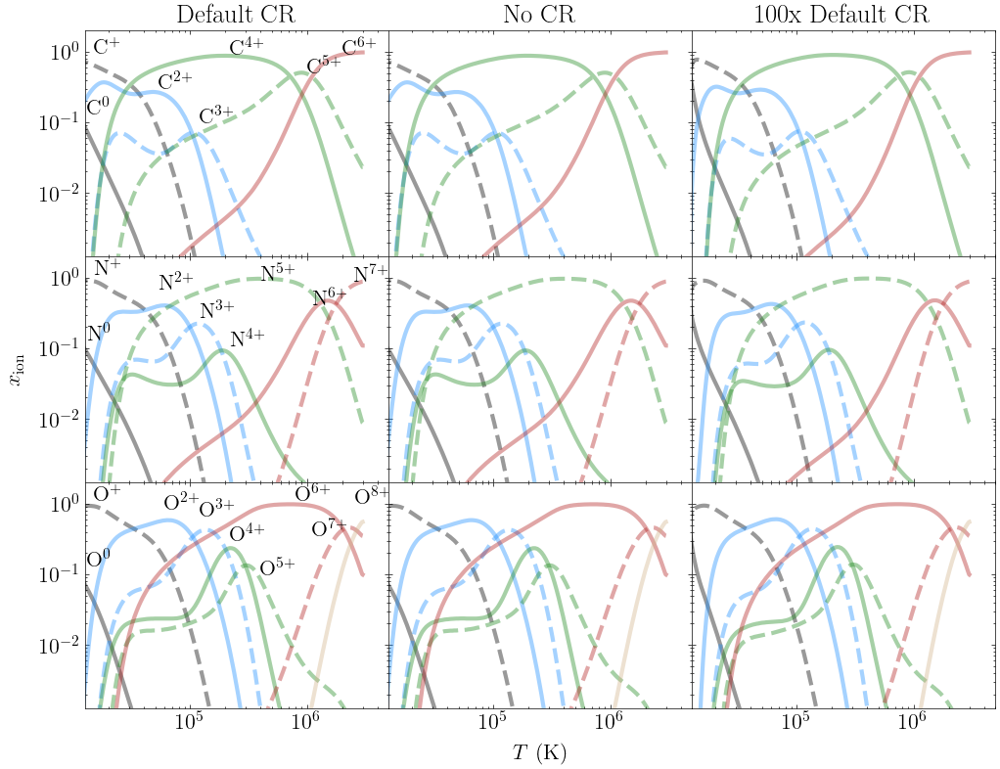

In [40]:
fig, axes = plt.subplots(3, 3, figsize=(4*3, 3*3), sharex=True, sharey=True)

# TDC
for i in range(len(C_list)):
    
    s = C_list[i]
    
    if i==0:
        l1 = 'GS07'
        l2 = 'CLOUDY'
    else:
        l1 = None
        l2 =None
    
    axes[0,0].text(x_list_TDC_isochoric_carb[i], y_list_TDC_isochoric_carb[i], C_species[i])
    
    axes[0,0].plot(T_grid_TDC_isochoric_1, X_dict_TDC_isochoric_1_carb[s], 
            color=colors_list[i], 
            linestyle = ls_list[i], lw=3, alpha=.4, label=l2)    
    
    
axes[0,0].set_title('Default CR')

for i in range(len(N_list)):
    
    s = N_list[i]
    
    axes[1,0].text(x_list_TDC_isochoric_nit[i], y_list_TDC_isochoric_nit[i], N_species[i])
    
    axes[1,0].plot(T_grid_TDC_isochoric_1, X_dict_TDC_isochoric_1_nit[s], 
            color=colors_list[i], 
            linestyle = ls_list[i], lw=3, alpha=.4) 
    

for i in range(len(O_list)):
    
    s = O_list[i]
    
    axes[2,0].text(x_list_TDC_isochoric_oxy[i], y_list_TDC_isochoric_oxy[i], O_species[i])
    
    axes[2,0].plot(T_grid_TDC_isochoric_1, X_dict_TDC_isochoric_1_oxy[s], 
            color=colors_list[i], 
            linestyle = ls_list[i], lw=3, alpha=.4) 


# TDC isochoric_1
for i in range(len(C_list)):
    
    s = C_list[i]
    
    axes[0,1].plot(T_grid_TDC_isochoric_noCR, X_dict_TDC_isochoric_noCR_carb[s], 
            color=colors_list[i], 
            linestyle = ls_list[i], lw=3, alpha=.4)    
    
axes[0,1].set_title(r'No CR')

for i in range(len(N_list)):
    
    s = N_list[i]
    
    axes[1,1].plot(T_grid_TDC_isochoric_noCR, X_dict_TDC_isochoric_noCR_nit[s], 
            color=colors_list[i], 
            linestyle = ls_list[i], lw=3, alpha=.4) 
    
for i in range(len(O_list)):
    
    s = O_list[i]
    
    axes[2,1].plot(T_grid_TDC_isochoric_noCR, X_dict_TDC_isochoric_noCR_oxy[s], 
            color=colors_list[i], 
            linestyle = ls_list[i], lw=3, alpha=.4) 
    
# TDC isobaric_1

for i in range(len(C_list)):
    
    s = C_list[i]
    
    axes[0,2].plot(T_grid_TDC_isochoric_hiCR, X_dict_TDC_isochoric_hiCR_carb[s], 
            color=colors_list[i], 
            linestyle = ls_list[i], lw=3, alpha=.4)    
    
axes[0,2].set_title(r'100x Default CR')
    
for i in range(len(N_list)):
    
    s = N_list[i]
    
    axes[1,2].plot(T_grid_TDC_isochoric_hiCR, X_dict_TDC_isochoric_hiCR_nit[s], 
            color=colors_list[i], 
            linestyle = ls_list[i], lw=3, alpha=.4) 
    
for i in range(len(O_list)):
    
    s = O_list[i]
        
    axes[2,2].plot(T_grid_TDC_isochoric_hiCR, X_dict_TDC_isochoric_hiCR_oxy[s], 
            color=colors_list[i], 
            linestyle = ls_list[i], lw=3, alpha=.4) 
    
axes[0,0].set_xscale('log')
axes[0,0].set_yscale('log')

axes[0,0].set_xlim(10**4.1,10**6.7)
axes[0,0].set_ylim(10**-2.9, 10**0.3)

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])

ax_label.set_xlabel(r'$T \ (\mathrm{K})$', labelpad=25)
ax_label.set_ylabel(r'$x_\mathrm{ion}$', labelpad=45)
    
plt.subplots_adjust(wspace=0, hspace=0)

Load cooling and heating rates

In [41]:
# Def CR
f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDC_isochoric/log_metals=0/T0=3e6K/TDC_isochoric_frac.cool', 'r')
L = f.readlines()
f.close()

heat_TDC_isochoric_1 = np.array([L[i].split('\t')[2] for i in range(1, len(L))], dtype=float)
cool_TDC_isochoric_1 = np.array([L[i].split('\t')[3] for i in range(1, len(L))], dtype=float)

# No CR
f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDC_isochoric/log_metals=0/T0=3e6K-noCR/TDC_isochoric_frac.cool', 'r')
L = f.readlines()
f.close()

heat_TDC_isochoric_noCR = np.array([L[i].split('\t')[2] for i in range(1, len(L))], dtype=float)
cool_TDC_isochoric_noCR = np.array([L[i].split('\t')[3] for i in range(1, len(L))], dtype=float)

# High CR
f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDC_isochoric/log_metals=0/T0=3e6K-hiCR/TDC_isochoric_frac.cool', 'r')
L = f.readlines()
f.close()

heat_TDC_isochoric_hiCR = np.array([L[i].split('\t')[2] for i in range(1, len(L))], dtype=float)
cool_TDC_isochoric_hiCR = np.array([L[i].split('\t')[3] for i in range(1, len(L))], dtype=float)

Plot heating and cooling rates

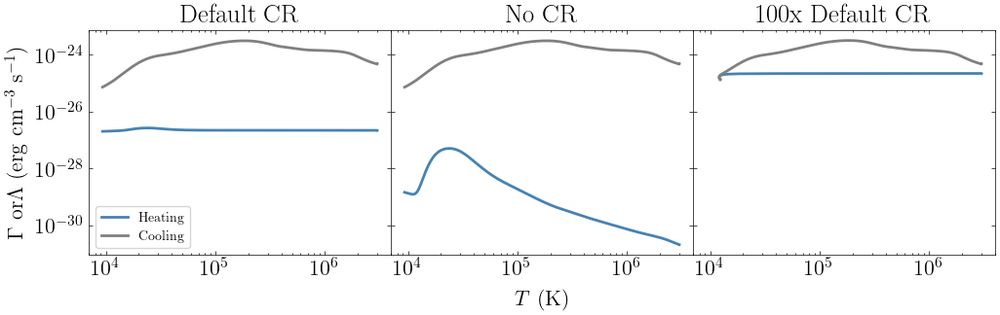

In [42]:
fig, axes = plt.subplots(1, 3, figsize=(4*3, 3), sharex=True, sharey=True)

axes[0].plot(T_grid_TDC_isochoric_1, heat_TDC_isochoric_1, color='steelblue', lw=2, label='Heating')
axes[0].plot(T_grid_TDC_isochoric_1, cool_TDC_isochoric_1, color='gray', lw=2, label='Cooling')
axes[0].set_title('Default CR')

axes[0].legend(fontsize=10)

axes[0].set_xscale('log')
axes[0].set_yscale('log')

axes[1].plot(T_grid_TDC_isochoric_noCR, heat_TDC_isochoric_noCR, color='steelblue', lw=2)
axes[1].plot(T_grid_TDC_isochoric_noCR, cool_TDC_isochoric_noCR, color='gray', lw=2)

axes[1].set_title('No CR')

axes[2].plot(T_grid_TDC_isochoric_hiCR, heat_TDC_isochoric_hiCR, color='steelblue', lw=2)
axes[2].plot(T_grid_TDC_isochoric_hiCR, cool_TDC_isochoric_hiCR, color='gray', lw=2)

axes[2].set_title(r'100x Default CR')

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])

ax_label.set_xlabel(r'$T \ (\mathrm{K})$', labelpad=25)
ax_label.set_ylabel(r'$\Gamma \ \mathrm{or} \Lambda \ (\mathrm{erg} \ \mathrm{cm}^{-3} \ \mathrm{s}^{-1})$', labelpad=45)

plt.subplots_adjust(wspace=0, hspace=0)

# Fast heating

log_hdens=-1, 1e4K

In [43]:
# Isochoric

# Temperature
f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDH_isochoric/log_metals=0/log_hdens=-1/T0=1e4K/TDH_isochoric_frac.tim', 'r')
L = f.readlines()
f.close()

T_grid_TDH_isochoric_1 = np.array([L[i].split('\t')[4] for i in range(1, len(L))], dtype=float)

# Carbon

X_dict_TDH_isochoric_1_carb = {k:np.zeros(len(T_grid_TDH_isochoric_1)) for k in C_list}

f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDH_isochoric/log_metals=0/log_hdens=-1/T0=1e4K/TDH_isochoric_frac.carb', 'r')
L = f.readlines()
f.close()

for s in C_list:
    for i in range(len(T_grid_TDH_isochoric_1)):
        X_dict_TDH_isochoric_1_carb[s][i] = float(L[i+1].split('\t')[C_list.index(s)+1])
        
# Nitrogen

X_dict_TDH_isochoric_1_nit = {k:np.zeros(len(T_grid_TDH_isochoric_1)) for k in N_list}

f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDH_isochoric/log_metals=0/log_hdens=-1/T0=1e4K/TDH_isochoric_frac.nit', 'r')
L = f.readlines()
f.close()

for s in N_list:
    for i in range(len(T_grid_TDH_isochoric_1)):
        X_dict_TDH_isochoric_1_nit[s][i] = float(L[i+1].split('\t')[N_list.index(s)+1])

# Oxygen

X_dict_TDH_isochoric_1_oxy = {k:np.zeros(len(T_grid_TDH_isochoric_1)) for k in O_list}

f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDH_isochoric/log_metals=0/log_hdens=-1/T0=1e4K/TDH_isochoric_frac.oxy', 'r')
L = f.readlines()
f.close()

for s in O_list:
    for i in range(len(T_grid_TDH_isochoric_1)):
        X_dict_TDH_isochoric_1_oxy[s][i] = float(L[i+1].split('\t')[O_list.index(s)+1])

log_hdens=-1, 3e4K

In [44]:
# Isochoric

# Temperature
f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDH_isochoric/log_metals=0/log_hdens=-1/T0=3e4K/TDH_isochoric_frac.tim', 'r')
L = f.readlines()
f.close()

T_grid_TDH_isochoric_2 = np.array([L[i].split('\t')[4] for i in range(1, len(L))], dtype=float)

# Carbon

X_dict_TDH_isochoric_2_carb = {k:np.zeros(len(T_grid_TDH_isochoric_2)) for k in C_list}

f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDH_isochoric/log_metals=0/log_hdens=-1/T0=3e4K/TDH_isochoric_frac.carb', 'r')
L = f.readlines()
f.close()

for s in C_list:
    for i in range(len(T_grid_TDH_isochoric_2)):
        X_dict_TDH_isochoric_2_carb[s][i] = float(L[i+1].split('\t')[C_list.index(s)+1])
        
# Nitrogen

X_dict_TDH_isochoric_2_nit = {k:np.zeros(len(T_grid_TDH_isochoric_2)) for k in N_list}

f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDH_isochoric/log_metals=0/log_hdens=-1/T0=3e4K/TDH_isochoric_frac.nit', 'r')
L = f.readlines()
f.close()

for s in N_list:
    for i in range(len(T_grid_TDH_isochoric_2)):
        X_dict_TDH_isochoric_2_nit[s][i] = float(L[i+1].split('\t')[N_list.index(s)+1])

# Oxygen

X_dict_TDH_isochoric_2_oxy = {k:np.zeros(len(T_grid_TDH_isochoric_2)) for k in O_list}

f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDH_isochoric/log_metals=0/log_hdens=-1/T0=3e4K/TDH_isochoric_frac.oxy', 'r')
L = f.readlines()
f.close()

for s in O_list:
    for i in range(len(T_grid_TDH_isochoric_2)):
        X_dict_TDH_isochoric_2_oxy[s][i] = float(L[i+1].split('\t')[O_list.index(s)+1])

Plot ion fractions

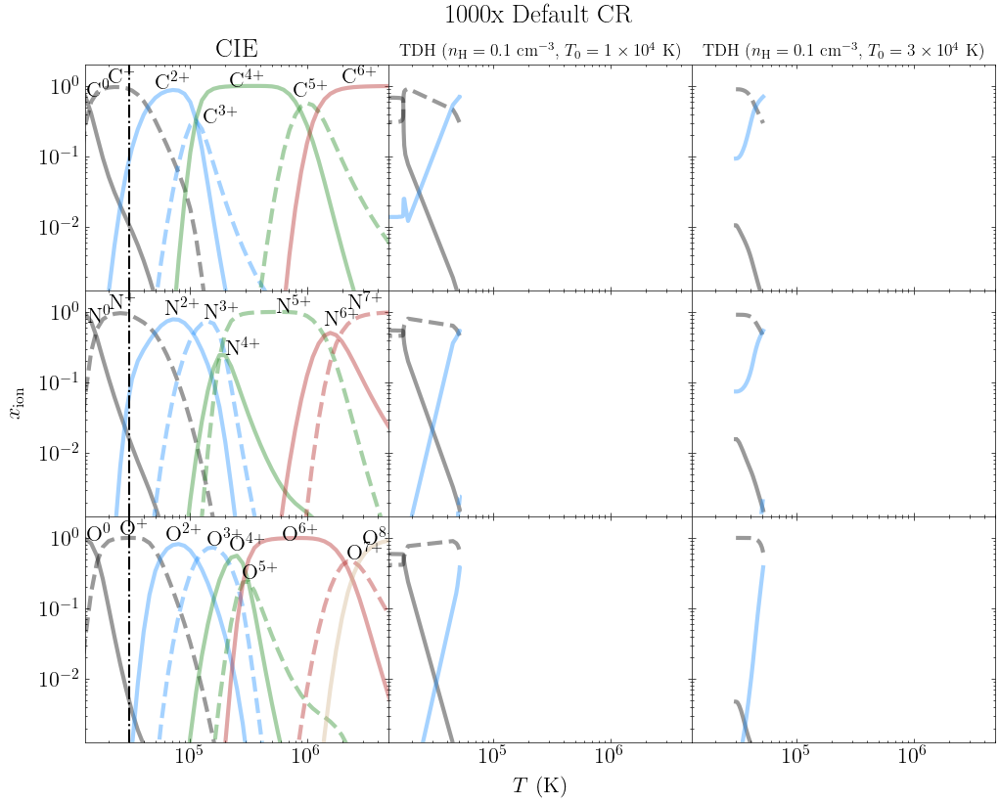

In [45]:
fig, axes = plt.subplots(3, 3, figsize=(4*3, 3*3), sharex=True, sharey=True)

# CIE
for i in range(len(C_list)):
    
    s = C_list[i]
    
    if i==0:
        l1 = 'GS07'
        l2 = 'CLOUDY'
    else:
        l1 = None
        l2 =None
    
    axes[0,0].text(x_list_CIE_carb[i], y_list_CIE_carb[i], C_species[i])
    
    axes[0,0].plot(T_grid_CIE, X_dict_CIE_carb[s], 
            color=colors_list[i], 
            linestyle = ls_list[i], lw=3, alpha=.4, label=l2)    
    
    
axes[0,0].axvline(1e4, linestyle='-.', color='black', lw=1.5)
axes[0,0].axvline(3e4, linestyle='-.', color='black', lw=1.5)

axes[0,0].set_title('CIE')
#axes[0,0].legend()

for i in range(len(N_list)):
    
    s = N_list[i]
    
    axes[1,0].text(x_list_CIE_nit[i], y_list_CIE_nit[i], N_species[i])
    
    axes[1,0].plot(T_grid_CIE, X_dict_CIE_nit[s], 
            color=colors_list[i], 
            linestyle = ls_list[i], lw=3, alpha=.4) 
    
axes[1,0].axvline(1e4, linestyle='-.', color='black', lw=1.5)    
axes[1,0].axvline(3e4, linestyle='-.', color='black', lw=1.5)    

for i in range(len(O_list)):
    
    s = O_list[i]
    
    axes[2,0].text(x_list_CIE_oxy[i], y_list_CIE_oxy[i], O_species[i])
    
    axes[2,0].plot(T_grid_CIE, X_dict_CIE_oxy[s], 
            color=colors_list[i], 
            linestyle = ls_list[i], lw=3, alpha=.4) 

axes[2,0].axvline(1e4, linestyle='-.', color='black', lw=1.5)    
axes[2,0].axvline(3e4, linestyle='-.', color='black', lw=1.5)    

# TDH isochoric_1
for i in range(len(C_list)):
    
    s = C_list[i]
    
    axes[0,1].plot(T_grid_TDH_isochoric_1, X_dict_TDH_isochoric_1_carb[s], 
            color=colors_list[i], 
            linestyle = ls_list[i], lw=3, alpha=.4)    
    
axes[0,1].set_title(r'TDH ($n_\mathrm{H} = 0.1 \ \mathrm{cm}^{-3}$, $T_0 = 1 \times 10^4 \ \mathrm{K}$)', fontsize=12.5)

for i in range(len(N_list)):
    
    s = N_list[i]
    
    axes[1,1].plot(T_grid_TDH_isochoric_1, X_dict_TDH_isochoric_1_nit[s], 
            color=colors_list[i], 
            linestyle = ls_list[i], lw=3, alpha=.4) 
    
for i in range(len(O_list)):
    
    s = O_list[i]
    
    axes[2,1].plot(T_grid_TDH_isochoric_1, X_dict_TDH_isochoric_1_oxy[s], 
            color=colors_list[i], 
            linestyle = ls_list[i], lw=3, alpha=.4) 
    
# TDH isochoric_2

for i in range(len(C_list)):
    
    s = C_list[i]
    
    axes[0,2].plot(T_grid_TDH_isochoric_2, X_dict_TDH_isochoric_2_carb[s], 
            color=colors_list[i], 
            linestyle = ls_list[i], lw=3, alpha=.4)    
    
axes[0,2].set_title(r'TDH ($n_\mathrm{H} = 0.1 \ \mathrm{cm}^{-3}$, $T_0 = 3 \times 10^4 \ \mathrm{K}$)', fontsize=12.5)
    
for i in range(len(N_list)):
    
    s = N_list[i]
    
    axes[1,2].plot(T_grid_TDH_isochoric_2, X_dict_TDH_isochoric_2_nit[s], 
            color=colors_list[i], 
            linestyle = ls_list[i], lw=3, alpha=.4) 
    
for i in range(len(O_list)):
    
    s = O_list[i]
        
    axes[2,2].plot(T_grid_TDH_isochoric_2, X_dict_TDH_isochoric_2_oxy[s], 
            color=colors_list[i], 
            linestyle = ls_list[i], lw=3, alpha=.4) 
    
axes[0,0].set_xscale('log')
axes[0,0].set_yscale('log')

axes[0,0].set_xlim(10**4.1,10**6.7)
axes[0,0].set_ylim(10**-2.9, 10**0.3)

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])

ax_label.set_xlabel(r'$T \ (\mathrm{K})$', labelpad=25)
ax_label.set_ylabel(r'$x_\mathrm{ion}$', labelpad=45)
ax_label.set_title(r'1000x Default CR', y=1.05)
    
plt.subplots_adjust(wspace=0, hspace=0)

Load heating and cooling

In [46]:
# Def CR
f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDH_isochoric/log_metals=0/log_hdens=-1/T0=1e4K/TDH_isochoric_frac.cool', 'r')
L = f.readlines()
f.close()

heat_TDH_isochoric_1 = np.array([L[i].split('\t')[2] for i in range(1, len(L))], dtype=float)
cool_TDH_isochoric_1 = np.array([L[i].split('\t')[3] for i in range(1, len(L))], dtype=float)

# No CR
f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDH_isochoric/log_metals=0/log_hdens=-1/T0=3e4K/TDH_isochoric_frac.cool', 'r')
L = f.readlines()
f.close()

heat_TDH_isochoric_2 = np.array([L[i].split('\t')[2] for i in range(1, len(L))], dtype=float)
cool_TDH_isochoric_2 = np.array([L[i].split('\t')[3] for i in range(1, len(L))], dtype=float)

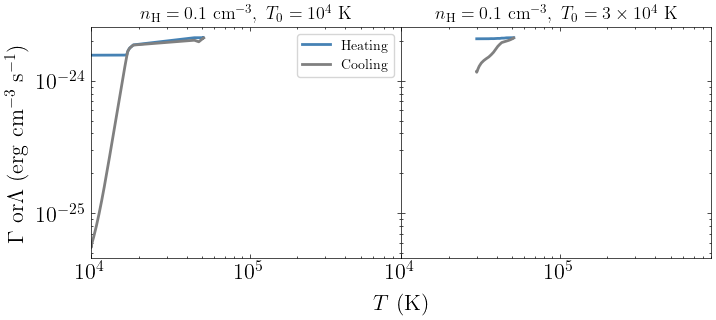

In [47]:
fig, axes = plt.subplots(1, 2, figsize=(4*2, 3), sharex=True, sharey=True)

axes[0].plot(T_grid_TDH_isochoric_1, heat_TDH_isochoric_1, color='steelblue', lw=2, label='Heating')
axes[0].plot(T_grid_TDH_isochoric_1, cool_TDH_isochoric_1, color='gray', lw=2, label='Cooling')
axes[0].set_title(r'$n_\mathrm{H} = 0.1 \ \mathrm{cm}^{-3}, \ T_0 = 10^4 \ \mathrm{K}$', fontsize=13)

axes[0].legend(fontsize=10)

axes[0].set_xlim(1e4, 9e5)
axes[0].set_xscale('log')
axes[0].set_yscale('log')

axes[1].plot(T_grid_TDH_isochoric_2, heat_TDH_isochoric_2, color='steelblue', lw=2)
axes[1].plot(T_grid_TDH_isochoric_2, cool_TDH_isochoric_2, color='gray', lw=2)

axes[1].set_title(r'$n_\mathrm{H} = 0.1 \ \mathrm{cm}^{-3}, \ T_0 = 3 \times 10^4 \ \mathrm{K}$', fontsize=13)

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])

ax_label.set_xlabel(r'$T \ (\mathrm{K})$', labelpad=25)
ax_label.set_ylabel(r'$\Gamma \ \mathrm{or} \Lambda \ (\mathrm{erg} \ \mathrm{cm}^{-3} \ \mathrm{s}^{-1})$', labelpad=45)

plt.subplots_adjust(wspace=0, hspace=0)

log_hdens=-2, 1e4K

In [48]:
# Isochoric

# Temperature
f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDH_isochoric/log_metals=0/log_hdens=-2/T0=1e4K/TDH_isochoric_frac.tim', 'r')
L = f.readlines()
f.close()

T_grid_TDH_isochoric_3 = np.array([L[i].split('\t')[4] for i in range(1, len(L))], dtype=float)

# Carbon

X_dict_TDH_isochoric_3_carb = {k:np.zeros(len(T_grid_TDH_isochoric_3)) for k in C_list}

f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDH_isochoric/log_metals=0/log_hdens=-2/T0=1e4K/TDH_isochoric_frac.carb', 'r')
L = f.readlines()
f.close()

for s in C_list:
    for i in range(len(T_grid_TDH_isochoric_3)):
        X_dict_TDH_isochoric_3_carb[s][i] = float(L[i+1].split('\t')[C_list.index(s)+1])
        
# Nitrogen

X_dict_TDH_isochoric_3_nit = {k:np.zeros(len(T_grid_TDH_isochoric_3)) for k in N_list}

f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDH_isochoric/log_metals=0/log_hdens=-2/T0=1e4K/TDH_isochoric_frac.nit', 'r')
L = f.readlines()
f.close()

for s in N_list:
    for i in range(len(T_grid_TDH_isochoric_3)):
        X_dict_TDH_isochoric_3_nit[s][i] = float(L[i+1].split('\t')[N_list.index(s)+1])

# Oxygen

X_dict_TDH_isochoric_3_oxy = {k:np.zeros(len(T_grid_TDH_isochoric_3)) for k in O_list}

f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDH_isochoric/log_metals=0/log_hdens=-2/T0=1e4K/TDH_isochoric_frac.oxy', 'r')
L = f.readlines()
f.close()

for s in O_list:
    for i in range(len(T_grid_TDH_isochoric_3)):
        X_dict_TDH_isochoric_3_oxy[s][i] = float(L[i+1].split('\t')[O_list.index(s)+1])

log_hdens=-2, 3e4K

In [49]:
# Isochoric

# Temperature
f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDH_isochoric/log_metals=0/log_hdens=-2/T0=3e4K/TDH_isochoric_frac.tim', 'r')
L = f.readlines()
f.close()

T_grid_TDH_isochoric_4 = np.array([L[i].split('\t')[4] for i in range(1, len(L))], dtype=float)

# Carbon

X_dict_TDH_isochoric_4_carb = {k:np.zeros(len(T_grid_TDH_isochoric_4)) for k in C_list}

f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDH_isochoric/log_metals=0/log_hdens=-2/T0=3e4K/TDH_isochoric_frac.carb', 'r')
L = f.readlines()
f.close()

for s in C_list:
    for i in range(len(T_grid_TDH_isochoric_4)):
        X_dict_TDH_isochoric_4_carb[s][i] = float(L[i+1].split('\t')[C_list.index(s)+1])
        
# Nitrogen

X_dict_TDH_isochoric_4_nit = {k:np.zeros(len(T_grid_TDH_isochoric_4)) for k in N_list}

f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDH_isochoric/log_metals=0/log_hdens=-2/T0=3e4K/TDH_isochoric_frac.nit', 'r')
L = f.readlines()
f.close()

for s in N_list:
    for i in range(len(T_grid_TDH_isochoric_4)):
        X_dict_TDH_isochoric_4_nit[s][i] = float(L[i+1].split('\t')[N_list.index(s)+1])

# Oxygen

X_dict_TDH_isochoric_4_oxy = {k:np.zeros(len(T_grid_TDH_isochoric_4)) for k in O_list}

f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDH_isochoric/log_metals=0/log_hdens=-2/T0=3e4K/TDH_isochoric_frac.oxy', 'r')
L = f.readlines()
f.close()

for s in O_list:
    for i in range(len(T_grid_TDH_isochoric_4)):
        X_dict_TDH_isochoric_4_oxy[s][i] = float(L[i+1].split('\t')[O_list.index(s)+1])

Plot ion fractions

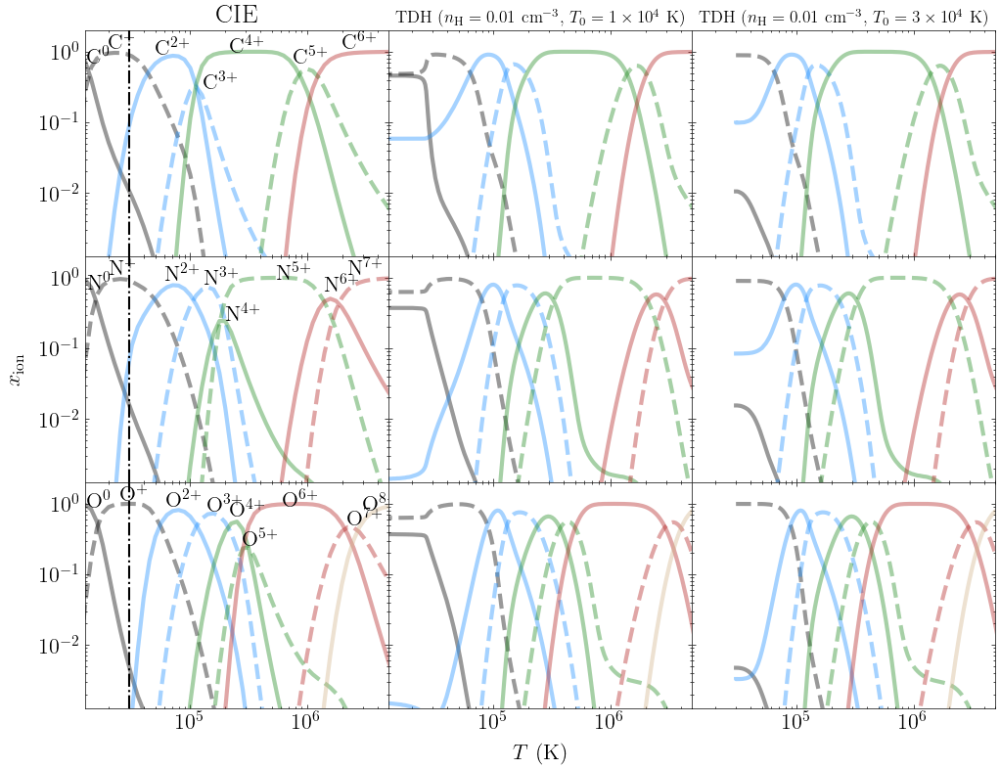

In [50]:
fig, axes = plt.subplots(3, 3, figsize=(4*3, 3*3), sharex=True, sharey=True)

# CIE
for i in range(len(C_list)):
    
    s = C_list[i]
    
    if i==0:
        l1 = 'GS07'
        l2 = 'CLOUDY'
    else:
        l1 = None
        l2 =None
    
    axes[0,0].text(x_list_CIE_carb[i], y_list_CIE_carb[i], C_species[i])
    
    axes[0,0].plot(T_grid_CIE, X_dict_CIE_carb[s], 
            color=colors_list[i], 
            linestyle = ls_list[i], lw=3, alpha=.4, label=l2)    
        
axes[0,0].axvline(1e4, linestyle='-.', color='black', lw=1.5)
axes[0,0].axvline(3e4, linestyle='-.', color='black', lw=1.5)

axes[0,0].set_title('CIE')
#axes[0,0].legend()

for i in range(len(N_list)):
    
    s = N_list[i]
    
    axes[1,0].text(x_list_CIE_nit[i], y_list_CIE_nit[i], N_species[i])
    
    axes[1,0].plot(T_grid_CIE, X_dict_CIE_nit[s], 
            color=colors_list[i], 
            linestyle = ls_list[i], lw=3, alpha=.4) 
    
axes[1,0].axvline(1e4, linestyle='-.', color='black', lw=1.5)    
axes[1,0].axvline(3e4, linestyle='-.', color='black', lw=1.5)    

for i in range(len(O_list)):
    
    s = O_list[i]
    
    axes[2,0].text(x_list_CIE_oxy[i], y_list_CIE_oxy[i], O_species[i])
    
    axes[2,0].plot(T_grid_CIE, X_dict_CIE_oxy[s], 
            color=colors_list[i], 
            linestyle = ls_list[i], lw=3, alpha=.4) 

axes[2,0].axvline(1e4, linestyle='-.', color='black', lw=1.5)    
axes[2,0].axvline(3e4, linestyle='-.', color='black', lw=1.5)    

# TDH isochoric_3
for i in range(len(C_list)):
    
    s = C_list[i]
    
    axes[0,1].plot(T_grid_TDH_isochoric_3, X_dict_TDH_isochoric_3_carb[s], 
            color=colors_list[i], 
            linestyle = ls_list[i], lw=3, alpha=.4)    
    
axes[0,1].set_title(r'TDH ($n_\mathrm{H}=0.01 \ \mathrm{cm}^{-3}$, $T_0 = 1 \times 10^4 \ \mathrm{K}$)', fontsize=12.5)

for i in range(len(N_list)):
    
    s = N_list[i]
    
    axes[1,1].plot(T_grid_TDH_isochoric_3, X_dict_TDH_isochoric_3_nit[s], 
            color=colors_list[i], 
            linestyle = ls_list[i], lw=3, alpha=.4) 
    
for i in range(len(O_list)):
    
    s = O_list[i]
    
    axes[2,1].plot(T_grid_TDH_isochoric_3, X_dict_TDH_isochoric_3_oxy[s], 
            color=colors_list[i], 
            linestyle = ls_list[i], lw=3, alpha=.4) 
    
# TDH isochoric_4

for i in range(len(C_list)):
    
    s = C_list[i]
    
    axes[0,2].plot(T_grid_TDH_isochoric_4, X_dict_TDH_isochoric_4_carb[s], 
            color=colors_list[i], 
            linestyle = ls_list[i], lw=3, alpha=.4)    
    
axes[0,2].set_title(r'TDH ($n_\mathrm{H}=0.01 \ \mathrm{cm}^{-3}$, $T_0 = 3 \times 10^4 \ \mathrm{K}$)', fontsize=12.5)
    
for i in range(len(N_list)):
    
    s = N_list[i]
    
    axes[1,2].plot(T_grid_TDH_isochoric_4, X_dict_TDH_isochoric_4_nit[s], 
            color=colors_list[i], 
            linestyle = ls_list[i], lw=3, alpha=.4) 
    
for i in range(len(O_list)):
    
    s = O_list[i]
        
    axes[2,2].plot(T_grid_TDH_isochoric_4, X_dict_TDH_isochoric_4_oxy[s], 
            color=colors_list[i], 
            linestyle = ls_list[i], lw=3, alpha=.4) 
    
axes[0,0].set_xscale('log')
axes[0,0].set_yscale('log')

axes[0,0].set_xlim(10**4.1,10**6.7)
axes[0,0].set_ylim(10**-2.9, 10**0.3)

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])

ax_label.set_xlabel(r'$T \ (\mathrm{K})$', labelpad=25)
ax_label.set_ylabel(r'$x_\mathrm{ion}$', labelpad=45)
    
plt.subplots_adjust(wspace=0, hspace=0)

Plot heating and cooling

In [51]:
# Def CR
f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDH_isochoric/log_metals=0/log_hdens=-2/T0=1e4K/TDH_isochoric_frac.cool', 'r')
L = f.readlines()
f.close()

heat_TDH_isochoric_3 = np.array([L[i].split('\t')[2] for i in range(1, len(L))], dtype=float)
cool_TDH_isochoric_3 = np.array([L[i].split('\t')[3] for i in range(1, len(L))], dtype=float)

# No CR
f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDH_isochoric/log_metals=0/log_hdens=-2/T0=3e4K/TDH_isochoric_frac.cool', 'r')
L = f.readlines()
f.close()

heat_TDH_isochoric_4 = np.array([L[i].split('\t')[2] for i in range(1, len(L))], dtype=float)
cool_TDH_isochoric_4 = np.array([L[i].split('\t')[3] for i in range(1, len(L))], dtype=float)

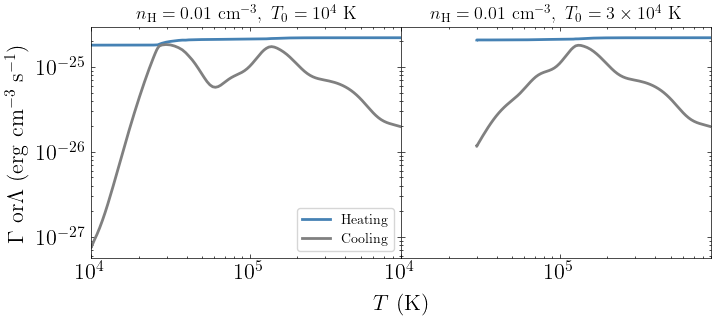

In [52]:
fig, axes = plt.subplots(1, 2, figsize=(4*2, 3), sharex=True, sharey=True)

axes[0].plot(T_grid_TDH_isochoric_3, heat_TDH_isochoric_3, color='steelblue', lw=2, label='Heating')
axes[0].plot(T_grid_TDH_isochoric_3, cool_TDH_isochoric_3, color='gray', lw=2, label='Cooling')
axes[0].set_title(r'$n_\mathrm{H} = 0.01 \ \mathrm{cm}^{-3}, \ T_0 = 10^4 \ \mathrm{K}$', fontsize=13)

axes[0].legend(fontsize=10)

axes[0].set_xlim(1e4, 9e5)
axes[0].set_xscale('log')
axes[0].set_yscale('log')

axes[1].plot(T_grid_TDH_isochoric_4, heat_TDH_isochoric_4, color='steelblue', lw=2)
axes[1].plot(T_grid_TDH_isochoric_4, cool_TDH_isochoric_4, color='gray', lw=2)

axes[1].set_title(r'$n_\mathrm{H} = 0.01 \ \mathrm{cm}^{-3}, \ T_0 = 3 \times 10^4 \ \mathrm{K}$', fontsize=13)

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])

ax_label.set_xlabel(r'$T \ (\mathrm{K})$', labelpad=25)
ax_label.set_ylabel(r'$\Gamma \ \mathrm{or} \Lambda \ (\mathrm{erg} \ \mathrm{cm}^{-3} \ \mathrm{s}^{-1})$', labelpad=45)

plt.subplots_adjust(wspace=0, hspace=0)

log_hdens=-3, 1e4K

In [53]:
# Isochoric

# Temperature
f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDH_isochoric/log_metals=0/log_hdens=-3/T0=1e4K/TDH_isochoric_frac.tim', 'r')
L = f.readlines()
f.close()

T_grid_TDH_isochoric_5 = np.array([L[i].split('\t')[4] for i in range(1, len(L))], dtype=float)

# Carbon

X_dict_TDH_isochoric_5_carb = {k:np.zeros(len(T_grid_TDH_isochoric_5)) for k in C_list}

f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDH_isochoric/log_metals=0/log_hdens=-3/T0=1e4K/TDH_isochoric_frac.carb', 'r')
L = f.readlines()
f.close()

for s in C_list:
    for i in range(len(T_grid_TDH_isochoric_5)):
        X_dict_TDH_isochoric_5_carb[s][i] = float(L[i+1].split('\t')[C_list.index(s)+1])
        
# Nitrogen

X_dict_TDH_isochoric_5_nit = {k:np.zeros(len(T_grid_TDH_isochoric_5)) for k in N_list}

f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDH_isochoric/log_metals=0/log_hdens=-3/T0=1e4K/TDH_isochoric_frac.nit', 'r')
L = f.readlines()
f.close()

for s in N_list:
    for i in range(len(T_grid_TDH_isochoric_5)):
        X_dict_TDH_isochoric_5_nit[s][i] = float(L[i+1].split('\t')[N_list.index(s)+1])

# Oxygen

X_dict_TDH_isochoric_5_oxy = {k:np.zeros(len(T_grid_TDH_isochoric_5)) for k in O_list}

f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDH_isochoric/log_metals=0/log_hdens=-3/T0=1e4K/TDH_isochoric_frac.oxy', 'r')
L = f.readlines()
f.close()

for s in O_list:
    for i in range(len(T_grid_TDH_isochoric_5)):
        X_dict_TDH_isochoric_5_oxy[s][i] = float(L[i+1].split('\t')[O_list.index(s)+1])

log_hdens=-3, 3e4K

In [54]:
# Isochoric

# Temperature
f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDH_isochoric/log_metals=0/log_hdens=-3/T0=3e4K/TDH_isochoric_frac.tim', 'r')
L = f.readlines()
f.close()

T_grid_TDH_isochoric_6 = np.array([L[i].split('\t')[4] for i in range(1, len(L))], dtype=float)

# Carbon

X_dict_TDH_isochoric_6_carb = {k:np.zeros(len(T_grid_TDH_isochoric_6)) for k in C_list}

f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDH_isochoric/log_metals=0/log_hdens=-3/T0=3e4K/TDH_isochoric_frac.carb', 'r')
L = f.readlines()
f.close()

for s in C_list:
    for i in range(len(T_grid_TDH_isochoric_6)):
        X_dict_TDH_isochoric_6_carb[s][i] = float(L[i+1].split('\t')[C_list.index(s)+1])
        
# Nitrogen

X_dict_TDH_isochoric_6_nit = {k:np.zeros(len(T_grid_TDH_isochoric_6)) for k in N_list}

f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDH_isochoric/log_metals=0/log_hdens=-3/T0=3e4K/TDH_isochoric_frac.nit', 'r')
L = f.readlines()
f.close()

for s in N_list:
    for i in range(len(T_grid_TDH_isochoric_6)):
        X_dict_TDH_isochoric_6_nit[s][i] = float(L[i+1].split('\t')[N_list.index(s)+1])

# Oxygen

X_dict_TDH_isochoric_6_oxy = {k:np.zeros(len(T_grid_TDH_isochoric_6)) for k in O_list}

f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDH_isochoric/log_metals=0/log_hdens=-3/T0=3e4K/TDH_isochoric_frac.oxy', 'r')
L = f.readlines()
f.close()

for s in O_list:
    for i in range(len(T_grid_TDH_isochoric_6)):
        X_dict_TDH_isochoric_6_oxy[s][i] = float(L[i+1].split('\t')[O_list.index(s)+1])

Plot ion fractions

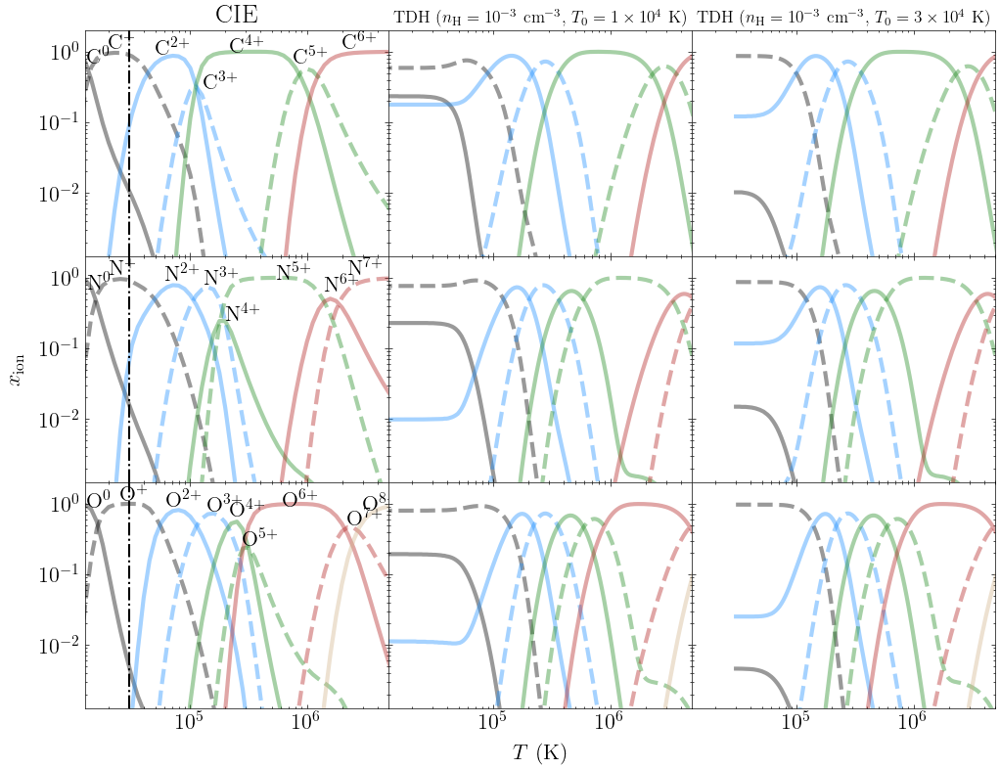

In [55]:
fig, axes = plt.subplots(3, 3, figsize=(4*3, 3*3), sharex=True, sharey=True)

# CIE
for i in range(len(C_list)):
    
    s = C_list[i]
    
    if i==0:
        l1 = 'GS07'
        l2 = 'CLOUDY'
    else:
        l1 = None
        l2 =None
    
    axes[0,0].text(x_list_CIE_carb[i], y_list_CIE_carb[i], C_species[i])
    
    axes[0,0].plot(T_grid_CIE, X_dict_CIE_carb[s], 
            color=colors_list[i], 
            linestyle = ls_list[i], lw=3, alpha=.4, label=l2)    
        
axes[0,0].axvline(1e4, linestyle='-.', color='black', lw=1.5)
axes[0,0].axvline(3e4, linestyle='-.', color='black', lw=1.5)

axes[0,0].set_title('CIE')
#axes[0,0].legend()

for i in range(len(N_list)):
    
    s = N_list[i]
    
    axes[1,0].text(x_list_CIE_nit[i], y_list_CIE_nit[i], N_species[i])
    
    axes[1,0].plot(T_grid_CIE, X_dict_CIE_nit[s], 
            color=colors_list[i], 
            linestyle = ls_list[i], lw=3, alpha=.4) 
    
axes[1,0].axvline(1e4, linestyle='-.', color='black', lw=1.5)    
axes[1,0].axvline(3e4, linestyle='-.', color='black', lw=1.5)    

for i in range(len(O_list)):
    
    s = O_list[i]
    
    axes[2,0].text(x_list_CIE_oxy[i], y_list_CIE_oxy[i], O_species[i])
    
    axes[2,0].plot(T_grid_CIE, X_dict_CIE_oxy[s], 
            color=colors_list[i], 
            linestyle = ls_list[i], lw=3, alpha=.4) 

axes[2,0].axvline(1e4, linestyle='-.', color='black', lw=1.5)    
axes[2,0].axvline(3e4, linestyle='-.', color='black', lw=1.5)    

# TDH isochoric_5
for i in range(len(C_list)):
    
    s = C_list[i]
    
    axes[0,1].plot(T_grid_TDH_isochoric_5, X_dict_TDH_isochoric_5_carb[s], 
            color=colors_list[i], 
            linestyle = ls_list[i], lw=3, alpha=.4)    
    
axes[0,1].set_title(r'TDH ($n_\mathrm{H}=10^{-3} \ \mathrm{cm}^{-3}$, $T_0 = 1 \times 10^4 \ \mathrm{K}$)', fontsize=12.5)

for i in range(len(N_list)):
    
    s = N_list[i]
    
    axes[1,1].plot(T_grid_TDH_isochoric_5, X_dict_TDH_isochoric_5_nit[s], 
            color=colors_list[i], 
            linestyle = ls_list[i], lw=3, alpha=.4) 
    
for i in range(len(O_list)):
    
    s = O_list[i]
    
    axes[2,1].plot(T_grid_TDH_isochoric_5, X_dict_TDH_isochoric_5_oxy[s], 
            color=colors_list[i], 
            linestyle = ls_list[i], lw=3, alpha=.4) 
    
# TDH isochoric_6

for i in range(len(C_list)):
    
    s = C_list[i]
    
    axes[0,2].plot(T_grid_TDH_isochoric_6, X_dict_TDH_isochoric_6_carb[s], 
            color=colors_list[i], 
            linestyle = ls_list[i], lw=3, alpha=.4)    
    
axes[0,2].set_title(r'TDH ($n_\mathrm{H}=10^{-3} \ \mathrm{cm}^{-3}$, $T_0 = 3 \times 10^4 \ \mathrm{K}$)', fontsize=12.5)
    
for i in range(len(N_list)):
    
    s = N_list[i]
    
    axes[1,2].plot(T_grid_TDH_isochoric_6, X_dict_TDH_isochoric_6_nit[s], 
            color=colors_list[i], 
            linestyle = ls_list[i], lw=3, alpha=.4) 
    
for i in range(len(O_list)):
    
    s = O_list[i]
        
    axes[2,2].plot(T_grid_TDH_isochoric_6, X_dict_TDH_isochoric_6_oxy[s], 
            color=colors_list[i], 
            linestyle = ls_list[i], lw=3, alpha=.4) 
    
axes[0,0].set_xscale('log')
axes[0,0].set_yscale('log')

axes[0,0].set_xlim(10**4.1,10**6.7)
axes[0,0].set_ylim(10**-2.9, 10**0.3)

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])

ax_label.set_xlabel(r'$T \ (\mathrm{K})$', labelpad=25)
ax_label.set_ylabel(r'$x_\mathrm{ion}$', labelpad=45)
    
plt.subplots_adjust(wspace=0, hspace=0)

Plot heating and cooling

In [56]:
# Def CR
f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDH_isochoric/log_metals=0/log_hdens=-3/T0=1e4K/TDH_isochoric_frac.cool', 'r')
L = f.readlines()
f.close()

heat_TDH_isochoric_5 = np.array([L[i].split('\t')[2] for i in range(1, len(L))], dtype=float)
cool_TDH_isochoric_5 = np.array([L[i].split('\t')[3] for i in range(1, len(L))], dtype=float)

# No CR
f = open(rootdir+'cloudy_grids/non_eqm_models/CI/TDH_isochoric/log_metals=0/log_hdens=-3/T0=3e4K/TDH_isochoric_frac.cool', 'r')
L = f.readlines()
f.close()

heat_TDH_isochoric_6 = np.array([L[i].split('\t')[2] for i in range(1, len(L))], dtype=float)
cool_TDH_isochoric_6 = np.array([L[i].split('\t')[3] for i in range(1, len(L))], dtype=float)

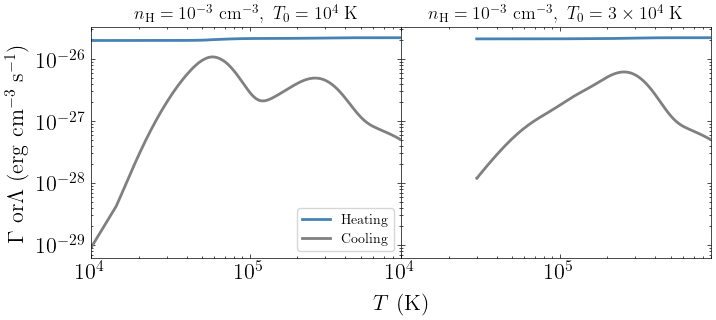

In [57]:
fig, axes = plt.subplots(1, 2, figsize=(4*2, 3), sharex=True, sharey=True)

axes[0].plot(T_grid_TDH_isochoric_5, heat_TDH_isochoric_5, color='steelblue', lw=2, label='Heating')
axes[0].plot(T_grid_TDH_isochoric_5, cool_TDH_isochoric_5, color='gray', lw=2, label='Cooling')
axes[0].set_title(r'$n_\mathrm{H} = 10^{-3} \ \mathrm{cm}^{-3}, \ T_0 = 10^4 \ \mathrm{K}$', fontsize=13)

axes[0].legend(fontsize=10)

axes[0].set_xlim(1e4, 9e5)
axes[0].set_xscale('log')
axes[0].set_yscale('log')

axes[1].plot(T_grid_TDH_isochoric_6, heat_TDH_isochoric_6, color='steelblue', lw=2)
axes[1].plot(T_grid_TDH_isochoric_6, cool_TDH_isochoric_6, color='gray', lw=2)

axes[1].set_title(r'$n_\mathrm{H} = 10^{-3} \ \mathrm{cm}^{-3}, \ T_0 = 3 \times 10^4 \ \mathrm{K}$', fontsize=13)

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])

ax_label.set_xlabel(r'$T \ (\mathrm{K})$', labelpad=25)
ax_label.set_ylabel(r'$\Gamma \ \mathrm{or} \Lambda \ (\mathrm{erg} \ \mathrm{cm}^{-3} \ \mathrm{s}^{-1})$', labelpad=45)

plt.subplots_adjust(wspace=0, hspace=0)